## Load simulation data + document meta data

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from collections import Counter
class2english = {'kunst _musik_museum_kulturpol': 'Culture', ' klima_ miljø _ naturen ': 'Environment',
                 'undervis_folkeskole_ungdomsuddan': 'Education', 'udenrig_ forsvaret _militær': 'Foreign affairs',
                 ' EU _ eu': 'EU', ' sundhed': 'Health',
                 'indvandr_flygt_udlænding': 'Immigration', ' beskæftig': 'Employment', 'skat': 'Taxes', 
                 'forskning_ universitet_videregående udd': 'Science',
                 ' religi_ værdipol': 'Religion', ' økonom_ vækst': 'Economy', 
                 'kriminal_kriminel': 'Crime', 'hjemmehjælp_ ældre _ pension_ plejehjem': 'Elder care',
                 'fattig_socialt udsat_socialminis_svageste': 'Social policy'}
def get_dic_name(num):
    return class2english[class2num[int(num)]]
import pickle,json,networkx as nx

In [ ]:
party2block = {'ALT': 'L', 'DF': 'R', 'EL': 'L',
               'K': 'R', 'KD': 'R', 'LA': 'R', 
               'RV': 'L', 'S': 'L', 'SF': 'L',
               'V': 'R', 'Z': 'R'}
translater = {'Dansk Folkeparti':'DF','Socialdemokratiet':'SD','Venstre':'VEN'
              ,'Radikale Venstre':'RV',u'Enhedslisten':'EL','Det Konservative Folkeparti':'KF'
              ,'Socialistisk Folkeparti':'SF','Kristendemokraterne':'KD','Liberal Alliance':'LA','Alternativet':'ALT',
             'Fremskridtspartiet':'Z'}
party2color = json.load(open('party_color','r'))
party2color = {translater[p]:party2color[p] for p in party2color if p in translater}
english_titles = {'Radikale Venstre':'Social Liberal Party','Dansk Folkeparti':"Danish People's Party",'Enhedslisten':'Unity List'
                 }
sort_parties = ['EL', 'SF', 'SD', 'ALT', 'RV', 'DF', 'VEN', 'KF', 'LA']

reverse_translater = {val:key for key,val in translater.items()}

def get_party_color(party):
    if party in translater:
        party = translater[party]
    if party in reverse_translater:
        if party in party2color:
            color = party2color[party]
        else:
            color = 'k'
    elif type(party)!=str:
        party = party2idx[int(party)]
        color = get_party_color(party)
    else:
        color = 'k'
    return color

In [ ]:
base = '/home/snorre/Dropbox/Forskning/bigdata/data_inspections/'
meta_path = base+'simulation_results/metrics/'
meta_path2 = base+'simulation_results/distributions/'
print(len(model_runs))from os import listdir
result_path = '/mnt/b0c8e396-e5ba-4614-be6f-146c4c861ab3/data/topic_model_simulation/models/'
model_runs = set(['_'.join(i.split('_')[0:3]) for i in listdir(result_path)])
model_runs = sorted(model_runs,key=lambda x: int(x.split('_')[-1]))

#pol_df = pd.read_csv(base+'data/topic_modelling_dataset.csv').drop('bow',axis=1)
import pickle

pol_df,noise_df, Index = pickle.load(open(base+'topic_simulation_dependencies.pkl','rb'))
# Define where the noise begins.
noise_start_w = 30000
noise_start_d = len(pol_df)
list(enumerate(Index))[noise_start_w-2:noise_start_w+2],noise_start_w,noise_start_d

8559


([(29998, 'læhegn'),
  (29999, 'heder'),
  (30000, 'americans'),
  (30001, 'makeamericagreatagain')],
 30000,
 46209)

## Load lexicons and convert to index.

In [ ]:
import json
class2num = dict(pol_df[['topic','topic_class']].values)
class2num = sorted(class2num,key=lambda x: class2num[x])
dictionary = [(topic,set(values)) for topic,values in json.load(open('dictionary_topics.js','r')).items()]
from nltk.stem.snowball import DanishStemmer
import nltk
stemmer = DanishStemmer()

w2lex = {}

for topic,vals in dictionary:
    for val in vals:
        if val in w2lex:
            w2lex[val].append(topic)
            #print(val,topic,w2lex[val])
        w2lex[val] = [topic]

lex2idx = {topic:set() for topic in class2num}
#idx2lex = {idx:lex for lex,indices in lex2idx.items() for idx in indices }
in_lex = set()
for num,w in enumerate(Index):
    if w in w2lex:
        topics = w2lex[w]
        for topic in topics:
            lex2idx[topic].add(num)
    w_stem = stemmer.stem(w)
    if w_stem in w2lex:
        topics = w2lex[w_stem]
        for topic in topics:
            lex2idx[topic].add(num)

idx2lex = {}
for dicname,values in lex2idx.items():
    for val in values:
        idx2lex[val] = dicname

sum([len(s) for s in lex2idx.values()]),len(w2lex),len(idx2lex)

(1338, 692, 1338)

In [ ]:
cut_bottom = set(range(29))-set([7,12,8]) # 'børn','dansk','danske'

In [ ]:
for i in range(30):
    #for i in sorted(idx2lex_extent)[0:10]:
    print(i,Index[i],i in idx2lex,i in idx2lex_extent)

0 dag False False
1 danmark False True
2 __url__ False False
3 år False False
4 derfor False False
5 går False False
6 sammen False False
7 børn True True
8 danske True False
9 gøre False False
10 nye False False
11 mennesker False True
12 dansk False True
13 regeringen False True
14 arbejde True True
15 bedre False False
16 gerne False False
17 del False False
18 gode False False
19 hele False False
20 gør False False
21 gang False False
22 tak False False
23 unge False True
24 siger False False
25 venstre False False
26 både False False
27 mener False False
28 tid False True
29 eu True True


In [ ]:
#import numpy as np
#c_count = np.asarray(real_bows.sum(axis=0))[0]
#t_count = np.asarray(data2[2].sum(axis=0))[0]

In [ ]:
#alligned_count = t_count==c_count[:len(t_count)]
#plt.plot(pd.Series(t_count==c_count[:len(t_count)]).rolling(window=100).mean())

In [ ]:
#infer_idx = np.arange(len(t_count[0:noise_start_w]))[alligned_count[0:noise_start_w]]

In [ ]:
#len(infer_idx),len(pure_idx),len(set(infer_idx)&set(pure_idx))

In [ ]:
### **conclusion** one can count on index of the first real tokens, and overlap,but not the rare words in the noise corpus.

In [ ]:
import pandas as pd
meta_files = [meta_path+i for i in listdir(meta_path)]
dfs = []
for num,filename in enumerate(meta_files):
    df = pd.read_csv(filename)
    df['simulation_id'] = num
    dfs.append(df)
df = pd.concat(dfs)
df = df.sort_values('modelid')
del dfs

In [ ]:
sum(df.groupby('simulation_id').n_topics.max()>150)

7

In [ ]:
## remove ambivalent runs
c = Counter([i.split('_')[-1] for i in model_runs])
model_errors = set(df.modelid.value_counts().index[df.modelid.value_counts()>1])
model_errors.update(set([int(i) for i,count in c.most_common(len(c)) if count>1]))
df = df[~df.modelid.isin(model_errors)]
df = df[df.simulation_id.isin(set(df.simulation_id.value_counts()[df.simulation_id.value_counts()==29].index))]
df.shape

(8091, 13)

In [ ]:
df.groupby('noise').simulation_id.nunique().min()

13

In [ ]:
import random
# sample for first analysis
n_simulations = 10# maximum is 13 
sample_simulations = set(np.concatenate(df.groupby(['noise']).apply(lambda x: random.sample(set(x.simulation_id.values),n_simulations)).values))
print(df[df.simulation_id.isin(sample_simulations)].n_topics.sum())
modelids = set(df[df.simulation_id.isin(sample_simulations)].modelid)

model_runs = sorted([i for i in model_runs if int(i.split('_')[-1]) in modelids],key=lambda x: int(x.split('_')[-1]))

464000


#### Load and Process Corpus

In [ ]:
from collections import Counter
import re
import nltk


url_pattern = '(?:(?:https?:\/\/|www\.)\w+[\.\w]*\.\w+)|(?:\w+\.(?:com|dk))|(?:https?://|www\.)(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+'
url_re = re.compile(url_pattern)
url_sub = ' __url__ '
digit_pattern = r"\d(?:[\.,\d]*\d+)|\d{2,}(?:[\.,\d]*\d+)?" # matching >1 figure digits
replace_regex = [(url_sub,url_re),(' __digit__ ',re.compile(digit_pattern))]


import numpy as np
def filter_words(words,stopwords):
    # filter non signs
    words = [word for word in words if isalphanum(word)]
    # filter stopwords
    words = [word for word in words if word not in stopwords]
    return words
def isalphanum(string):
    if not string.isalnum():
        # find word with - between
        pattern = r'[a-zAZøæåÆØÅ]+\-[a-zAZøæåÆØÅ]*|__[a-zAZøæåÆØÅ]+_*'
        search = re.findall(pattern,string)
        if len(search)>0:
            return True
        else:
            return False
    return True
def process_documents(text,stopwords):
    # replace known patterns.
    for sub_pattern,regex in replace_regex:
        text = regex.sub(sub_pattern,text)
    text = nltk.tokenize.word_tokenize(text)
    # lower
    text = [i.lower() for i in text]
    # remove stopwords
    text = filter_words(text,stopwords)
    return text
from nltk.corpus import stopwords
stopWords = set(stopwords.words('english')) | set(['__digit__'])# english # 'hillary','trump'
stopwords = set(nltk.corpus.stopwords.words('danish'))#|set(open('danish_stopwords.txt','r').read().split('\n'))|set(['__digit__']) # danish

noise_docs = noise_df.message.apply(process_documents,**{'stopwords':stopWords}).values
real_docs = pol_df.message.apply(process_documents,**{'stopwords':stopwords}).values

def to_dense(corpus,vocab_size):
    X = np.zeros((len(corpus),vocab_size),dtype=np.int32)
    for num in range(len(corpus)):
        bow = corpus[num]
        for w,count in bow.items():
            try:
                X[num][w]=count
            except:
                pass
    return X
import scipy.sparse as sp
def to_sparse(corpus,vocab_size):
    X = sp.dok_matrix((len(corpus),vocab_size), dtype=np.int32)
    for num in range(len(corpus)):
        bow = corpus[num]
        for w,count in bow.items():            
            X[num,w]=count
    print(X.shape)
    X = X.tocsr()
    print(X.shape)
    return X

def to_index(text,d):
    return [d[i] for i in text if i in d]
def to_bow(texts,d,sparse = True):
    global vocab_size
    bows = [Counter(to_index(text,d)) for text in texts]
    if sparse:
        return to_sparse(bows,vocab_size)
    else:
        return bows
vocab_size = len(Index)
w2id = {w:num for num,w in enumerate(Index)}
real_bows = to_bow(real_docs,w2id)
noise_bows = to_bow(noise_docs,w2id)


(46209, 32400)
(46209, 32400)
(4534, 32400)
(4534, 32400)


In [ ]:
#real_bows = to_bow(real_docs,w2id)

In [ ]:
from tqdm import tqdm_notebook as tqdm
import scipy.sparse as sp
addendums = ['doc2topic','w2topic','w2count_topic']
def load_data(model):
    path = result_path+model
    data = []
    for add in addendums:
        filename = path+'_%s.npz'%(add)
        mat = sp.load_npz(filename)
        data.append(mat)#[add] = mat
    return data
import random
data = load_data(random.choice(model_runs))# make sample
data[0],data[1],data[2]

(<47845x130 sparse matrix of type '<class 'numpy.float64'>'
 	with 6219850 stored elements in Compressed Sparse Row format>,
 <130x32399 sparse matrix of type '<class 'numpy.float64'>'
 	with 4211870 stored elements in Compressed Sparse Row format>,
 <130x32399 sparse matrix of type '<class 'numpy.int32'>'
 	with 158069 stored elements in Compressed Sparse Row format>)

In [ ]:
import scipy

In [ ]:
scipy.__version__

'1.2.1'

### Define and locate noise words, shared words, and real words.

In [ ]:
### Calculate overlap between noise and real docs
# locate overlap - i.e. words before noise index that sum to more than 0 in the noise bows.
#%timeit np.array(noise_counts)[0]
#%timeit np.array(noise_counts.tolist()[0])
#%timeit np.asarray(noise_counts)[0]
noise_counts = np.asarray(noise_bows.sum(axis=0))[0]
overlap = noise_counts[0:noise_start_w]
difference = noise_counts[noise_start_w:]
print(sum(overlap),sum(difference),sum(difference)/(sum(overlap)+sum(difference)))

35597 22013 0.382103801423364


In [ ]:
overlap_idx = np.arange(noise_start_w)[overlap>0]

In [ ]:
#overlap = noise_counts[0:noise_start_w]
#difference = noise_counts[noise_start_w:]
#overlap_idx = np.arange(noise_start_w)[overlap>0]
#diff_idx = np.arange(noise_start_w,vocab_size)

In [ ]:
real_bows[overlap_idx].sum()/real_bows.sum()

0.03339298818384676

In [ ]:
overlap_frac_real = len(overlap_idx)/(len(overlap)+len(difference))
overlap_frac_noise = len(overlap_idx)/(len(overlap_idx)+len(difference))
overlap_share_real = real_bows[overlap_idx].sum()/real_bows.sum()
overlap_share = sum(overlap)/noise_bows.sum()#(sum(overlap)+sum(difference))
print('Of all real tokens %r percent are overlapping amounting to %r percent of all occurences'%(round(overlap_frac_real,3)*100
      ,round(overlap_share_real*100,1)))
print('Of all noisy tokens %r percent are overlapping amounting to %r percent of all the occurrences'%(round(overlap_frac_noise,3)*100
                                       ,round(overlap_share,3)*100))

Of all real tokens 4.8 percent are overlapping amounting to 3.3 percent of all occurences
Of all noisy tokens 39.1 percent are overlapping amounting to 61.8 percent of all the occurrences


In [ ]:
pure_idx = np.arange(noise_start_w)[~(overlap>0)]

In [ ]:
diff_idx = np.arange(noise_start_w,vocab_size)
len(pure_idx),len(overlap_idx),len(diff_idx),len(pure_idx)+len(overlap_idx)+len(diff_idx),vocab_size

(28459, 1541, 2400, 32400, 32400)

In [ ]:
max(diff_idx),data[2].shape,data[1].shape,len(Index)

(32399, (15, 32397), (15, 32397), 32400)

#### Overlap conclusion
5,13 % of the real tokens / words are overlapping, . And it amounts to 3,3 % of the occurence counts in the real documents and 61,8 % in the noise


Use the variables:

`diff_idx,pure_idx,overlap_idx`
instead of the diff_idx just use, `[noise_start_w:]`

### Size of Topics: What is the probability of a topic in the corpus and how much noise does it capture?
Percentage of Noise, Percentage of Not Noise, and overlap.

**\#\#Missing are the Document Length to calculate the marginal distribution\#\#**


In [ ]:
def get_size(data):
    top2doc_count = data[2].toarray()
    top2count = np.asarray(top2doc_count.sum(axis=1))
    noise_count = np.asarray(top2doc_count[:,noise_start_w:].sum(axis=1))
    overlap_count = np.asarray(top2doc_count[:,overlap_idx].sum(axis=1))
    
    df = pd.DataFrame(top2count/sum(top2count),columns=['topic_size'])
    
    #top2doc = data[0].toarray()
    #top2doc[30000:]
    
    if noise_count.sum()==0:
        df['topic2global_noise'] = 0
    else:    
        df['topic2global_noise'] = noise_count/noise_count.sum()
        df['topic2global_overlap'] = overlap_count/overlap_count.sum()
        df['topic2global_real'] = (top2count-noise_count-overlap_count)/(sum(top2count)-sum(noise_count)-sum(overlap_count))
    #print(print(noise_count.sum()),noise_count.shape)
    return df
model = random.choice(model_runs)
data = load_data(random.choice(model_runs))
#data[2].toarray()
#get_size(data)

### Intrusion Measure (1): Share of Real words versus Noise Words

In [ ]:
def topic2noise_share_w(data):
    "Calculates the fraction of real,overlapping, and noisy tokens in the word probability distribution of each topic."
    topic2word = data[1]
    real_share = np.asarray(data[1][:,pure_idx].sum(axis=1)).T[0]
    overlap_share = np.asarray(data[1][:,overlap_idx].sum(axis=1)).T[0]
    noise_share = np.asarray(data[1][:,noise_start_w:].sum(axis=1)).T[0]
    return pd.DataFrame({'w_real_share':real_share,'w_overlap_share':overlap_share,'w_noise_share':noise_share})

In [ ]:
#topic2noise_share_w(data)

### Intrusion Measure (2): How many times are (noisy, real and overlapping) words assigned to the topic. 

//**NO NEED **//

In [ ]:
def topic2noise_assigned_w(data):
    "Calculates the fraction of real,overlapping, and noisy tokens in the word probability distribution of each topic."
    topic2word = data[1]
    real_share = np.asarray(data[2][:,pure_idx].sum(axis=1)).T[0]
    overlap_share = np.asarray(data[2][:,overlap_idx].sum(axis=1)).T[0]
    noise_share = np.asarray(data[2][:,noise_start_w:].sum(axis=1)).T[0]
    return pd.DataFrame({'w_real_assigned':real_share,'w_overlap_assigned':overlap_share,'w_noise_assigned':noise_share})

In [ ]:
#temp = topic2noise_assigned_w(data)
#sum_ = temp.sum(axis=1)
#(temp.T/sum_).T

### Intrusion Measure (3): Share of Noisy Documents Versus Real Documents

In [ ]:
import numpy as np
def topic2noise_share_d(data):
    "Calculates the topic probability distribution of noisy document and real documents, and return a ratio and a fraction."
    doc2topic = data[0]
    doc_noise = doc2topic[noise_start_d:]
    doc_real =  doc2topic[:noise_start_d]
    doc_noisy_sum = doc_noise.sum(axis=0)
    doc_real_sum = doc_real.sum(axis=0)
    noisy_share = doc_noisy_sum/(doc_noisy_sum+doc_real_sum)

    if doc_noise.shape[0]==0:
        doc_noisy_mean = 0
    else:
        doc_noisy_mean = doc_noise.mean(axis=0)
    doc_real_mean = doc_real.mean(axis=0)
    try:
        noisy_ratio = doc_noisy_mean/doc_real_mean
    except:
        noisy_ratio = 0
    df = pd.DataFrame({'d_noisy_ratio':np.asarray(noisy_ratio)[0],'d_noisy_share':np.asarray(noisy_share)[0]})
    return df


In [ ]:
topic2noise_share_d(data)

,d_noisy_ratio,d_noisy_share
0,0.096463,0.001284
1,0.135633,0.001805
2,0.135371,0.001801
3,0.109433,0.001457
4,0.143323,0.001907
5,0.206575,0.002746
6,0.118350,0.001575
7,0.179143,0.002382
8,0.127522,0.001697
9,0.115715,0.001540


#### Intrusion Function

In [ ]:
def get_intrusion_scores(data):
    dfs = []
    for func in [topic2noise_share_d,topic2noise_share_w]:
        dfs.append(func(data))
    return pd.concat(dfs,axis=1)
    #return pd.concat(dfs,axis=1)

In [ ]:
get_intrusion_scores(data)

,d_noisy_ratio,d_noisy_share,w_real_share,w_overlap_share,w_noise_share
0,0.085806,0.003029,0.953900,0.045904,0.000195
1,0.136083,0.004795,0.924030,0.075650,0.000320
2,0.121940,0.004299,0.936015,0.063742,0.000244
3,0.160359,0.005645,0.892960,0.106702,0.000338
4,0.116768,0.004117,0.949432,0.050331,0.000237
5,0.097636,0.003445,0.917799,0.081964,0.000238
6,0.145984,0.005142,0.930359,0.069342,0.000299
7,0.141821,0.004996,0.944557,0.055170,0.000273
8,0.110947,0.003913,0.937896,0.061727,0.000376
9,0.124296,0.004381,0.950595,0.049116,0.000289


### Latent Intrusion Measure (1): Share of Noisy Words in the Top Versus the Bottom

In [ ]:
topic2word = data[1].toarray()

In [ ]:
topic2word.shape

(65, 32399)

In [ ]:
pure_s = set(pure_idx)
overlap_s = set(overlap_idx)
diff_s = set(range(noise_start_w,len(Index)))
def get_first_overlap(vec,o):
    for num,i in enumerate(vec): 
        if i in o:
            return num
    return 1001

def get_word_overlap(s,sets=[pure_s,overlap_s,diff_s]):
    return [len(s&s2) for s2 in sets]
from numpy.random import choice
def draw_probability(wordprobs,n_draws=[5,10,20,50,100,1000],func=get_word_overlap):
    """takes a list of word probabilities and generates a random document. 
    It then calculates an overlap between certain sets of interest. Return a matrix"""
    random_doc = choice(range(len(wordprobs)),size=max(n_draws),p=wordprobs,replace=False)# draws from a weighed distribution
    top_overlap = np.zeros((len(tops),3))
    for num,top in enumerate(n_draws):
        s = set(random_doc[:top])
        top_overlap[num] = get_word_overlap(s)
    return top_overlap
import scipy.stats as ss
def get_frex_noise(data,w = 0.7):
    topic2word = data[1].toarray()
    # frequency rank
    fr = ss.mstats.rankdata(topic2word,axis=1)/topic2word.shape[1] # normalize by no. of tokens
    # exclusivity score
    ex = (ss.mstats.rankdata(topic2word,axis=0).T/topic2word.shape[0]).T # normalize by no. of topics
    
    # calculate inverse harmonic mean weighted by w.
    frex = 1/(w/ex + (1-w)/fr)
    
    
    ## extrac the top and calculate a mean.
    # sort the frex scores
    sorted_frex = frex.argsort().T[::-1].T
    
    # calculate averages
    
    
    dat = []
    tops = [5,10,20,50,100,1000]
    for num,vec in enumerate(sorted_frex[:,:1000]):
        
        top_overlap = np.zeros((len(tops),3)) 
        for num,topn in enumerate(tops):
            top = vec[0:topn]
            # get frex overlaps
            s = set(top)
            noise_overlap = get_word_overlap(s)
            top_overlap[num] = noise_overlap
        
        d = {}
        # get top_words to match with dictionary
        # get overlap counts
        class_d = dict(zip(['frex_noise_overlap_%d_%s'%(top,typ) for num,top in enumerate(tops) for typ in ['real','both','noise']],top_overlap.flatten()))
        d.update(class_d)
            # get overlap with dictionaries.
            
        dat.append(d)
    
    frex_noise = pd.DataFrame(dat)
    return frex_noise



def extract_top_stats(topic2word,top=1000):
    """Takes a matrix where each row is a sorting of words related to a topic, 
    and outputs first overlap and count of overlap with the three different word types (real,overlap,noise). Lastly it """
    topic2topwords = np.argsort(topic2word,axis=1)[:,-top:].T[::-1].T # only includes first 1000 words.
    data = []
    for topic_num,vec in enumerate(topic2topwords):

        tops = [5,10,20,50,100,1000]
        top_overlap = np.zeros((len(tops),3)) #[pure_overlap,overlap_overlap,diff_overlap]
        for num,top in enumerate(tops):
            s = set(vec[:top])
            top_overlap[num] = get_word_overlap(s)
        d = {}#'topic_num':topic_num}
        # get top_words to match with dictionary
        topwords = vec[0:10]
        d['topwords'] = list(topwords)
        # get overlap counts
        d.update(dict(zip(['topoverlap_%d_%s'%(top,typ) for num,top in enumerate(tops) for typ in ['real','overlap','noise']],top_overlap.flatten())))
        # locate first overlap
        first_idx = []
        for s in [pure_s,overlap_s]:   
            first_idx.append(get_first_overlap(vec,s))
        if top_overlap[-1,:].sum()==0: # special case, where there is no overlap until to save time.
            first_idx.append(1001)
        else:
            first_idx.append(get_first_overlap(vec,diff_s))
        # format data as dict.
        d.update(dict(zip(['firstoverlap_real','firstoverlap_overlap','firstoverlap_noise'],first_idx)))
        # get overlap if sampling was random instead of from top end of dist
        word_probabilities = topic2word[topic_num]
        top_overlap = draw_probability(word_probabilities,n_draws=tops)
        d.update(dict(zip(['randomoverlap_%d_%s'%(top,typ) for num,top in enumerate(tops) for typ in ['real','overlap','noise']],top_overlap.flatten()))) 
        data.append(d)
    return pd.DataFrame(data) 
#extract_top_stats(topic2word).head()

In [ ]:
intrusion_df.model_id.value_counts()

8428    250
8379    250
8330    250
8281    250
8329    245
       ... 
7277     10
5740     10
5537     10
115      10
0        10
Name: model_id, Length: 8411, dtype: int64

### Latent Intrusion Measure (2): Share of Noisy Documents in the Top Versus the Bottom

In [ ]:
doc2topic = data[0]
topic2doc = doc2topic.T.toarray()

In [ ]:
#np.argsort(doc2topic.toarray(),axis=0).T[:,-top:].T[::-1].T
#np.argsort(doc2topic.toarray(),axis=0)[:,0]==np.argsort(topic2doc[0])

In [ ]:
top = 1000
topic2top = np.argsort(topic2doc)[:,-top:].T[::-1]

NameError: name 'topic2doc' is not defined

In [ ]:
from numpy.random import choice
def draw_probability_docs(docprobs,n_draws=[5,10,20,50,100,1000]):
    """takes a list of word probabilities and generates a random document. 
    It then calculates an overlap between certain sets of interest. Return a matrix"""
    ## normalize docprobs
    docprobs = docprobs/sum(docprobs)
    random_doc = choice(range(len(docprobs)),size=max(n_draws),p=docprobs,replace=False)# draws from a weighed distribution
    tops = [5,10,20,50,100,1000]
    topic2noisetop = np.zeros(len(tops))
    
    for num,top in enumerate(tops):
        topic2noisetop[num] = (random_doc[:top]>noise_start_d).sum()/top
    return topic2noisetop


def extract_topdoc_stats(data,top=1000):
    """Takes a matrix where each row is a sorting of  related to a topic, 
    and outputs first overlap and count of overlap with the three different word types (real,overlap,noise). Lastly it """
    doc2topic = data[0].toarray()
    tops = [5,10,20,50,100,1000]
    topic2top_doc = np.argsort(doc2topic,axis=0).T[:,-max(tops):].T[::-1].T
    topic2noisetop = np.zeros((len(topic2top_doc),len(tops)))

    for num,top in enumerate(tops):
        topic2noisetop[:,num] = (topic2top_doc[:,:top]>noise_start_d).sum(axis=1)/top
    data = []
    for num,vec in enumerate(doc2topic.T):
        d = dict(zip(['random_doc_overlap_%d'%top for top in tops],draw_probability_docs(vec)))
        noisefracs = topic2noisetop[num] 
        
        d.update(dict(zip(['top_doc_overlap_%d'%top for top in tops],noisefracs)))
        data.append(d)
        
        ### MISSING ###
        # locate first overlap
    return pd.DataFrame(data)
extract_topdoc_stats(data)

,random_doc_overlap_10,random_doc_overlap_100,random_doc_overlap_1000,random_doc_overlap_20,random_doc_overlap_5,random_doc_overlap_50,top_doc_overlap_10,top_doc_overlap_100,top_doc_overlap_1000,top_doc_overlap_20,top_doc_overlap_5,top_doc_overlap_50
0,0.0,0.01,0.005,0.05,0.0,0.02,0.0,0.00,0.000,0.00,0.0,0.00
1,0.0,0.01,0.007,0.00,0.0,0.00,0.0,0.00,0.000,0.00,0.0,0.00
2,0.0,0.01,0.006,0.00,0.0,0.00,0.0,0.00,0.000,0.00,0.0,0.00
3,0.0,0.00,0.003,0.00,0.0,0.00,0.0,0.00,0.002,0.00,0.0,0.00
4,0.0,0.00,0.004,0.00,0.0,0.00,0.0,0.00,0.002,0.00,0.0,0.00
5,0.0,0.00,0.000,0.00,0.0,0.00,0.0,0.00,0.000,0.00,0.0,0.00
6,0.0,0.00,0.004,0.00,0.0,0.00,0.0,0.00,0.000,0.00,0.0,0.00
7,0.0,0.00,0.005,0.00,0.0,0.00,0.0,0.00,0.000,0.00,0.0,0.00
8,0.0,0.01,0.015,0.00,0.0,0.00,0.1,0.02,0.011,0.05,0.0,0.02
9,0.0,0.00,0.002,0.00,0.0,0.00,0.0,0.00,0.000,0.00,0.0,0.00


### latent intrusion function

In [ ]:
# Test the performance loss when running through all indices to find first match.
topic2topwords = np.argsort(topic2word,axis=1).T[::-1].T # [:,-top:]
top = 1000
vec = topic2topwords[0]
%timeit get_first_overlap(vec,s)
topic2topwords = np.argsort(topic2word,axis=1)[:,-top:].T[::-1].T # 
vec = topic2topwords[0]
%timeit get_first_overlap(vec,s)

1000 loops, best of 3: 1.85 ms per loop
10000 loops, best of 3: 203 µs per loop


** An extension would be to use Another Scoring Function than simple Probability.**

see https://github.com/WZBSocialScienceCenter/tmtoolkit/blob/master/examples/word_and_topic_scores.ipynb

Sievert and Shirley 2014

In [ ]:
tops = [5,10,20,50,100,1000]
def get_latent_intrusion(data,word_score=False):
    topic2word = data[1].toarray()
    df = extract_top_stats(topic2word)
    #if word_score: # add word_score top here 
    if len(data)==4: # indicates that word scores have been calculated.
        topic2wordscore = data[3]
        df2 = extract_top_stats(topic2wordscore)
        df = df.join(df2,lsuffix='',rsuffix='_wscore')
    df_doc = extract_topdoc_stats(data)
    df = df.join(df_doc)
    return df
get_latent_intrusion(data).head()

,firstoverlap_noise,firstoverlap_overlap,firstoverlap_real,randomoverlap_1000_noise,randomoverlap_1000_overlap,randomoverlap_1000_real,randomoverlap_100_noise,randomoverlap_100_overlap,randomoverlap_100_real,randomoverlap_10_noise,...,random_doc_overlap_1000,random_doc_overlap_20,random_doc_overlap_5,random_doc_overlap_50,top_doc_overlap_10,top_doc_overlap_100,top_doc_overlap_1000,top_doc_overlap_20,top_doc_overlap_5,top_doc_overlap_50
0,1001,2,0,3.0,46.0,951.0,0.0,5.0,95.0,0.0,...,0.004,0.00,0.0,0.00,0.0,0.0,0.000,0.0,0.0,0.0
1,1001,59,0,11.0,49.0,940.0,0.0,2.0,98.0,0.0,...,0.006,0.05,0.0,0.02,0.0,0.0,0.000,0.0,0.0,0.0
2,1001,12,0,2.0,32.0,966.0,0.0,4.0,96.0,0.0,...,0.006,0.00,0.0,0.00,0.0,0.0,0.000,0.0,0.0,0.0
3,1001,10,0,3.0,55.0,942.0,0.0,1.0,99.0,0.0,...,0.004,0.00,0.0,0.02,0.0,0.0,0.002,0.0,0.0,0.0
4,1001,22,0,5.0,46.0,949.0,1.0,5.0,94.0,0.0,...,0.005,0.00,0.0,0.00,0.0,0.0,0.002,0.0,0.0,0.0


### Topic Density Measure (1): Differences in the density of the word probabilties of noisy and real words.

In [ ]:
import scipy.stats
def normalize_entropy(series):
    result = scipy.stats.entropy(((series.T/series.sum(axis=1)).T).T)
    return result
def get_entropy(data):
    topic2word = data[2].toarray()
    
    real_entropy = normalize_entropy(topic2word[:,:noise_start_w])
    noise_entropy = normalize_entropy(topic2word[:,noise_start_w:])
    global_entropy = normalize_entropy(topic2word)
    
    topic2doc = data[0].toarray()[:noise_start_d,:]
    prevalence_entropy = scipy.stats.entropy(topic2doc)
    
    return pd.DataFrame(dict(zip(['entropy_global','entropy_noise','entropy_real','entropy_documents']
                                 ,[global_entropy,noise_entropy,real_entropy,prevalence_entropy])))
#x,y = zip(*get_entropy(data)[['entropy_documents','entropy_real']].values)
#plt.scatter(x,y)

In [ ]:

def intrusion_analysis(data):
    df = get_intrusion_scores(data)
    df2 = get_latent_intrusion(data)
    df_size = get_size(data)
    df = df.join(df2)
    df = df.join(df_size)
    # include entropy
    df = df.join(get_entropy(data))
    # get frex_noise
    noise_frex = get_frex_noise(data)
    df = df.join(noise_frex)
    df['n_topics'] = len(df)
    return df
intrusion_temp = intrusion_analysis(data)
intrusion_temp.shape,intrusion_temp.columns

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


((85, 84),
 Index(['d_noisy_ratio', 'd_noisy_share', 'w_real_share', 'w_overlap_share',
        'w_noise_share', 'firstoverlap_noise', 'firstoverlap_overlap',
        'firstoverlap_real', 'randomoverlap_1000_noise',
        'randomoverlap_1000_overlap', 'randomoverlap_1000_real',
        'randomoverlap_100_noise', 'randomoverlap_100_overlap',
        'randomoverlap_100_real', 'randomoverlap_10_noise',
        'randomoverlap_10_overlap', 'randomoverlap_10_real',
        'randomoverlap_20_noise', 'randomoverlap_20_overlap',
        'randomoverlap_20_real', 'randomoverlap_50_noise',
        'randomoverlap_50_overlap', 'randomoverlap_50_real',
        'randomoverlap_5_noise', 'randomoverlap_5_overlap',
        'randomoverlap_5_real', 'topoverlap_1000_noise',
        'topoverlap_1000_overlap', 'topoverlap_1000_real',
        'topoverlap_100_noise', 'topoverlap_100_overlap', 'topoverlap_100_real',
        'topoverlap_10_noise', 'topoverlap_10_overlap', 'topoverlap_10_real',
        'topoverl

In [ ]:
intrusion_temp['frex_noise_overlap_1000_noise'].sum()

1957.0

In [ ]:
intrusion_temp['topoverlap_1000_noise'].sum()

714.0

In [ ]:
intrusion_temp['topoverlap_1000_noise'].sum(),intrusion_temp['topoverlap_1000_noise'].sum()

(277.0, 277.0)

In [ ]:
import scipy.sparse as sp
def run_analysis(func):
    "Runs a function on the raw data. Expects a function that returns a list where each row is a "
    # Load models    
    dfs = [] # dataframe container
    for model in tqdm(model_runs):
        model_n = int(model.split('_')[-1])
        data = load_data(model)
        temp_df = func(data)
        temp_df['topic_num'] = np.arange(len(temp_df))
        temp_df['model_path'] = model
        temp_df['model_id'] = model_n
        dfs.append(temp_df)
    df = pd.concat(dfs)
    return df

In [ ]:
intrusion_df = run_analysis(intrusion_analysis)

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
intrusion_df.to_csv('noise_dataframe.csv',index=False)

In [ ]:
intrusion_df.to_csv('simulation_dataframe.csv',index=False)

In [ ]:
len(intrusion_df)

682365

In [ ]:
#model_errors = intrusion_df.groupby('model_id').apply(lambda x: len(x)==x.n_topics.values[0])
#keep_models = set(model_errors.index[model_errors])
#intrusion_df = intrusion_df[intrusion_df.model_id.isin(keep_models)]
#intrusion_df.to_csv('simulation_dataframe.csv',index=False)

In [ ]:
intrusion_df = pd.read_csv('simulation_dataframe.csv')

## Locate Models with Homogenous Top, with latent intrusion.
Central Variables are `top_doc_overlap_` denoting number of noisy documents in the top, and `topoverlap_10_noise`. 

Text(33,0.5,'no. top docs')

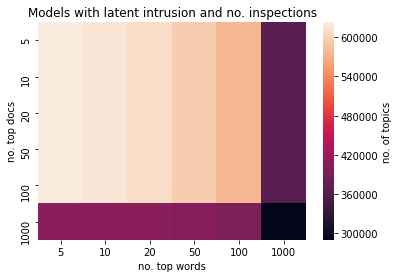

In [ ]:
w_col = 'topoverlap_%d_noise'
w_over = 'topoverlap_%d_overlap'
doc_col = 'top_doc_overlap_%d'
tops = [5,10,20,50,100,1000]
mat = np.zeros((len(tops),len(tops)))
for num,top in enumerate(tops):
    for num2,top2 in enumerate(tops):
        wcol = w_col%top
        doccol = doc_col%top2
        length = len(intrusion_df[(intrusion_df[wcol]==0) &(intrusion_df[doccol]==0)])
        mat[num,num2] = length
mat = pd.DataFrame(mat,columns=tops,index=tops)
#fig,axes = plt.subplots(1,2)
# Visualize mat
#sns.heatmap(np.log(mat),ax=axes[0],annot=True,cbar=False)#,cbar_kws={'label':'logged no. of topics'}
#plt.title('')
#plt.xlabel('no. top words')
#plt.ylabel('no. top docs')

## Include Ambivalent Words
mat2 = np.zeros((len(tops),len(tops)))
for num,top in enumerate(tops):
    for num2,top2 in enumerate(tops):
        wcol = w_col%top
        doccol = doc_col%top2
        no_overlap = intrusion_df[w_over%top]==0
        has_noisy_docs = intrusion_df.d_noisy_share>0
        
        length = len(intrusion_df[(intrusion_df[wcol]==0) &(intrusion_df[doccol]==0)& has_noisy_docs])
        mat2[num,num2] = length
mat2 = pd.DataFrame(mat2,columns=tops,index=tops)
# Visualize mat
sns.heatmap(mat2,annot=False,cbar_kws={'label':'no. of topics'})
plt.title('Models with latent intrusion and no. inspections')
plt.xlabel('no. top words')
plt.ylabel('no. top docs')


In [ ]:
sum(intrusion_df.d_noisy_share>0)

640870

In [ ]:
# merge with information on the simulation conditions
intrusion_df = intrusion_df.merge(df.drop_duplicates(subset='modelid',keep=False),how='left',left_on = 'model_id',right_on = 'modelid')

In [ ]:
dk_df = intrusion_df[(intrusion_df[w_col%20]==0) &(intrusion_df[doc_col%10]==0)]


problem_df = dk_df[dk_df.d_noisy_share>0]

print(('%d topics are believed to be danish looking only at the top 20 words, and top 10 docs. '
+ '%d of these contain English documents, i.e. %r percent')%(len(dk_df),len(problem_df),round(len(problem_df)/len(dk_df),3)))

659260 topics are believed to be danish looking only at the top 20 words, and top 10 docs. 617765 of these contain English documents, i.e. 0.937 percent


### Intrusion Results
** Analytical Goal **
* Showing that any given Topic has the risk of modelling completely unrelated noise. That current practice of ensuring quality using inspections are not satisfactory. 
* Showing that the level of noise in extreme cases can be quite substantial.

* Giving some intuition as to why this happens?
    * The relation between noise proportion and the alpha/number of topics. 
    * Can statistical criteria avoid the problems?
    * How do these results generalize? 2014 already showed that a topic model could cluster different languages under certain conditions (strong majority of one language in the corpus,and two minor languages). He did not show that current quality inspections do not avoid it. Concerning the level of unnoticed noise that it is possible to introduce, the results are of course very much related to the specific case, but it does give a proof of concept that under certain conditions the noise can be very substantial. Given that the risk and level of error can not be known for any new empirical case, the results strongly suggest that more quality measures are set in place. 
        - Can this be fixed by statistical measures? Indirect by statistical measure. It is however an open question of an acceptable coherence level.
    
* Although noise is less substantial in many cases, because it is in no way guarenteed to be evenly distribution accross other parameters of interest e.g. time, actors, organizations, it could become important to conclusions even in small doses. The next section will investigate this exact problem. 

    


#### Level of Error in the Topics.
sum(topic_doc(p)_noisy) / sum(topic_doc(p))

How big a proportion of the topic document probabilities are noisy documents?

In [ ]:
n_share = problem_df.d_noisy_share*100

print(np.quantile(n_share,0.05),n_share.mean(),n_share.median(),np.quantile(n_share,0.95))
# en halv promile


0.049612302783680826 0.4639975071896584 0.3591408096391283 1.0084746250152663


Text(0.5,0,'% of Noisy Documents')

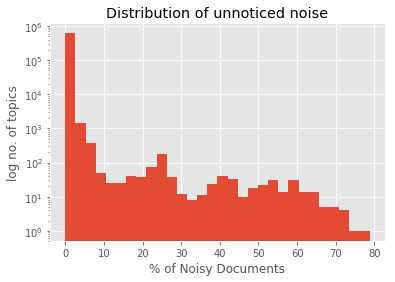

In [ ]:
plt.style.use('ggplot')
plt.hist(n_share,bins=30)
plt.yscale('log')
plt.title('Distribution of unnoticed noise')
plt.ylabel('log no. of topics')
plt.xlabel('% of Noisy Documents')

In [ ]:
max(n_share),sum(n_share>10),sum(n_share>5)
sum(n_share>5)/

(78.77821432635945, 726, 1225)

### The relation between size of noise, alpha and error. 
To understand some of the dynamics of potential noise we varied the parameters no. of topics and the fraction of noise in the dataset.

How can we show it?
    - Linear regression, heatmap?


See how many topics are unnoticed, and how many are noticed as a function of noise and n_topics.

In [ ]:
#'topoverlap_10_noise', 'topoverlap_10_overlap'

In [ ]:

#intrusion_df[intrusion_df['top_doc_overlap_10']>0.5].top_doc_overlap_10.hist()
en_df = intrusion_df[((intrusion_df['topoverlap_10_noise']+intrusion_df['topoverlap_10_overlap'])==10)&intrusion_df['top_doc_overlap_10']==1.0]
len(en_df)
#en_df_intrusion = en_df[en_df#.top_doc_overlap_10.hist()

3018

In [ ]:
intrusion_df.columns

Index(['d_noisy_ratio', 'd_noisy_share', 'w_real_share', 'w_overlap_share',
       'w_noise_share', 'firstoverlap_noise', 'firstoverlap_overlap',
       'firstoverlap_real', 'randomoverlap_1000_noise',
       'randomoverlap_1000_overlap', 'randomoverlap_1000_real',
       'randomoverlap_100_noise', 'randomoverlap_100_overlap',
       'randomoverlap_100_real', 'randomoverlap_10_noise',
       'randomoverlap_10_overlap', 'randomoverlap_10_real',
       'randomoverlap_20_noise', 'randomoverlap_20_overlap',
       'randomoverlap_20_real', 'randomoverlap_50_noise',
       'randomoverlap_50_overlap', 'randomoverlap_50_real',
       'randomoverlap_5_noise', 'randomoverlap_5_overlap',
       'randomoverlap_5_real', 'topoverlap_1000_noise',
       'topoverlap_1000_overlap', 'topoverlap_1000_real',
       'topoverlap_100_noise', 'topoverlap_100_overlap', 'topoverlap_100_real',
       'topoverlap_10_noise', 'topoverlap_10_overlap', 'topoverlap_10_real',
       'topoverlap_20_noise', 'topoverlap_2

In [ ]:
intrusion_df = intrusion_df[intrusion_df['random_state']==1]

In [ ]:
def count_intruded(groupdf):
    filter_ = ((groupdf['topoverlap_10_noise']+groupdf['topoverlap_10_overlap'])==10) & groupdf['top_doc_overlap_10']==1.0
    en = groupdf[filter_]
    # counts
    if len(en)==0:
        
        en_share = 0
    else:
        en_share = en.groupby('modelid').apply(lambda x: max(x.topic2global_noise)).mean()
    en_share_all = groupdf.groupby('modelid').apply(lambda x: max(x.topic2global_noise)).mean()
    en_model_count = en.modelid.nunique()
    n_modelids = groupdf.modelid.nunique()
    try:
        known_share = max(en.d_noisy_share)
    except:
        known_share = 0
    unknown_share = max(groupdf[~filter_])
    return pd.DataFrame([{'model_with_english':en_model_count/n_modelids,'en_max_share_all':en_share_all,'en_max_share':en_share,'n_english':len(en),'frac_english_topics':len(en)/len(groupdf),'known_english_share':known_share,'unknown_share':unknown_share}])
noise_mat = intrusion_df[(intrusion_df['noise']>0)].groupby(['noise','n_topics']).apply(count_intruded)

In [ ]:
mat = noise_mat['model_with_english'].values.reshape((intrusion_df['noise'].nunique()-1,intrusion_df.n_topics.nunique()))
mat = pd.DataFrame(mat,index=[round(i,3) for i in sorted(intrusion_df['noise'].unique())[1:]],columns=[int(i) for i in sorted(intrusion_df.n_topics.unique())])

Text(0.5,1,'Noise, K-topics and English Topics')

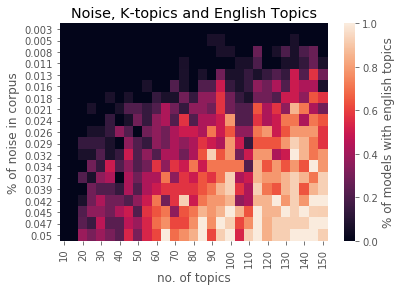

In [ ]:
sns.heatmap(mat,cbar_kws={'label':'% of models with english topics'})
plt.ylabel('% of noise in corpus')
plt.xlabel('no. of topics')
plt.title('Noise, K-topics and English Topics')

The heatmap shows the fraction of model runs in the simulation that discovered at least one english topic, as a function of k-topics chosen for the model run, and the fraction of noise introduced to the corpus. The heatmap tells us about a resolution limit of the latent dirichlet allocation in relation to the number of documents introduced and the number of topics chosen for the model. Other parameters such as the density and coocurrence structures of the documentterm matrix might also be an important factor in determining a resolution limit, however not within the scope of this study.

Text(0.5,1,'Noise, K-topics and English Topics')

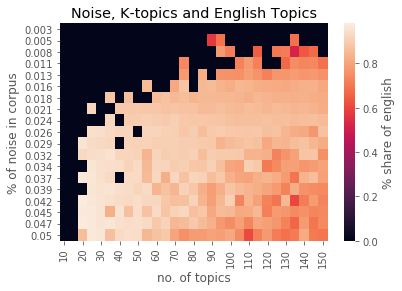

In [ ]:
mat = noise_mat['en_max_share'].values.reshape((intrusion_df['noise'].nunique()-1,intrusion_df.n_topics.nunique()))
mat = pd.DataFrame(mat,index=[round(i,3) for i in sorted(intrusion_df['noise'].unique())[1:]],columns=[int(i) for i in sorted(intrusion_df.n_topics.unique())])
sns.heatmap(mat,cbar_kws={'label':'% share of english'})
plt.ylabel('% of noise in corpus')
plt.xlabel('no. of topics')
plt.title('Noise, K-topics and English Topics')

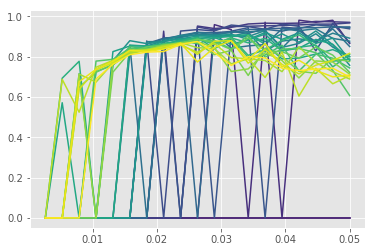

In [ ]:
x = noise_mat.index.levels[0]
for top_n,groupdf in noise_mat.reset_index().groupby('n_topics'):
    plt.plot(x,groupdf.en_max_share,label=top_n,c=plt.cm.viridis(top_n/150))
#plt.legend()

Text(0.5,1,'Noise, K-topics and English Topics')

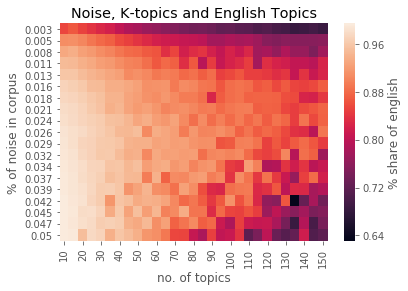

In [ ]:
mat = noise_mat['en_max_share_all'].values.reshape((intrusion_df['noise'].nunique()-1,intrusion_df.n_topics.nunique()))
mat = pd.DataFrame(mat,index=[round(i,3) for i in sorted(intrusion_df['noise'].unique())[1:]],columns=[int(i) for i in sorted(intrusion_df.n_topics.unique())])
sns.heatmap(mat,cbar_kws={'label':'% share of english'})
plt.ylabel('% of noise in corpus')
plt.xlabel('no. of topics')
plt.title('Noise, K-topics and English Topics')

The two plots investigates the degree to which the noise has one dedicated topic. First is only the ones that would be recognized as noise by Topic Inspections. Second is all, also the ones that contain danish words.

In [ ]:
#noise_mat

In [ ]:
dk_df = intrusion_df[(intrusion_df[w_col%20]==0) &(intrusion_df[doc_col%10]==0)]
en_df = 

In [ ]:

noticed_df = 
unnoticed_df = problem_df

In [ ]:
#merge_df = problem_df.merge(df.drop_duplicates(subset='modelid',keep=False),how='left',left_on = 'model_id',right_on = 'modelid')

In [ ]:
len(merge_df),len(problem_df) # there are duplicates.

(617765, 617765)

In [ ]:
#from importlib import reload
#reload(sns)
#import seaborn as sns
#sns.__version__

In [ ]:
#temp = merge_df[merge_df.n_topics<151]
temp = problem_df[problem_df.random_state==1]
len(temp)

605566


598721

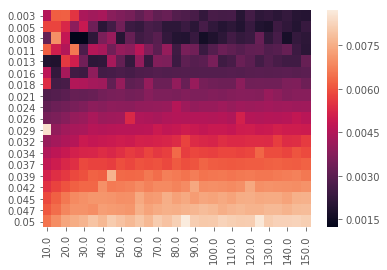

In [ ]:
mat = temp.groupby(['noise','n_topics']).d_noisy_share.mean()
mat = mat.values.reshape((temp.noise.nunique(),temp.n_topics.nunique()))
mat = pd.DataFrame(mat,columns=sorted(temp.n_topics.unique()),index=[round(i,3) for i in sorted(temp.noise.unique())])
# mean
sns.heatmap(mat)

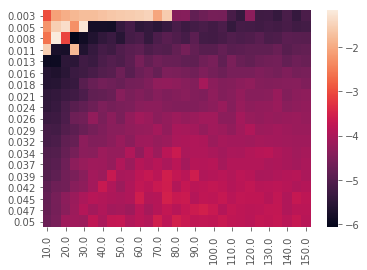

In [ ]:
# 99 quantile
mat = temp.groupby(['noise','n_topics']).d_noisy_share.quantile(q=0.99)#.mean()
mat = mat.values.reshape((temp.noise.nunique(),temp.n_topics.nunique()))
mat = pd.DataFrame(mat,columns=sorted(temp.n_topics.unique()),index=[round(i,3) for i in sorted(temp.noise.unique())])
sns.heatmap(np.log(mat))
#plt.xlabel('')+

Text(0.5,0,'% noise in the corpus')

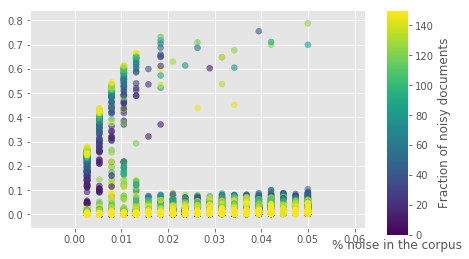

In [ ]:
cmap = plt.cm.viridis
colors = (temp.n_topics/150).apply(cmap)
fig,ax = plt.subplots()
plt.scatter(temp['noise'],temp['d_noisy_share'],c=colors,alpha=0.6)
plt.xlabel('')
import matplotlib as mpl
cmap = mpl.cm.viridis
norm = mpl.colors.Normalize(vmin=0, vmax=150)
cax = fig.add_axes([0.95,0.1, 0.05, 0.78])
#cax = fig.add_axes([0.27, 0.8, 0.5, 0.05])
cb1 = mpl.colorbar.ColorbarBase(cax, cmap=cmap,
                                norm=norm,
                                orientation='vertical',label='no. topics')
plt.ylabel('Fraction of noisy documents') 
plt.xlabel('% noise in the corpus') 
#sns.scatterplot(x='noise',y='d_noisy_share',data=,hue='n_topics')

Two scenarios. One where the topic is mostly picking up on danish texts cooccurence, and another subcluster of english texts has been merged into it, and another where the model, but that the danish subcluster is actually more dense. We can test this by calculating an entropy accross danish word probabilities, and english word probabilities in the topic.

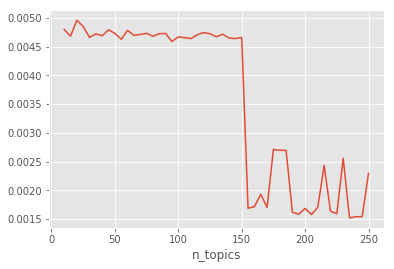

In [ ]:

#merge_df.groupby('n_topics').d_noisy_share.mean().plot()

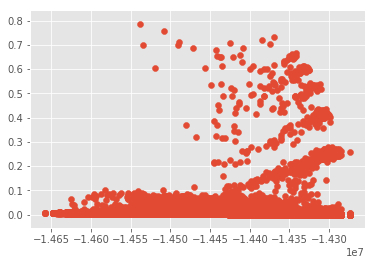

In [ ]:

plt.scatter(temp['loglikelihood'],temp['d_noisy_share'])
#df.columns[1:5]

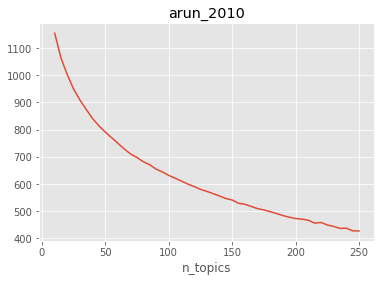

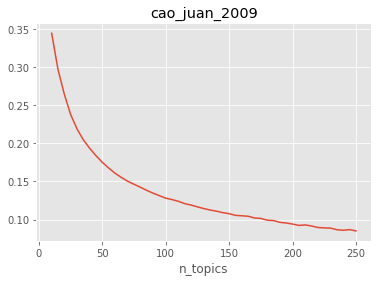

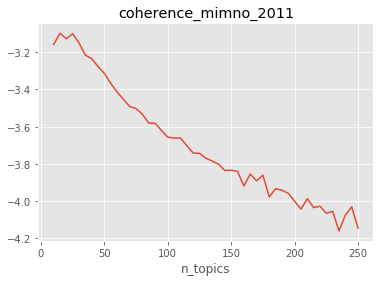

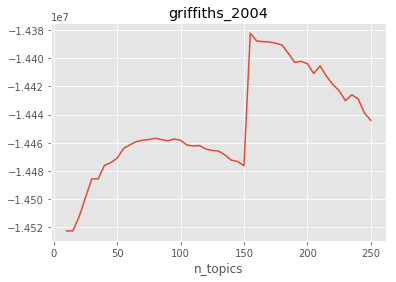

In [ ]:
for col in df.columns[1:5]:
    plt.figure()
    df.groupby('n_topics')[col].mean().plot()
    plt.title(col)

In [ ]:
df.columns
#problem_df.columns

Index(['alpha', 'arun_2010', 'cao_juan_2009', 'coherence_mimno_2011',
       'griffiths_2004', 'loglikelihood', 'modelid', 'n_iter', 'n_topics',
       'noise', 'random_state', 'simulationNumber'],
      dtype='object')

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/snorre/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


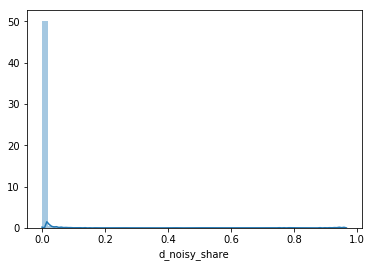

In [ ]:
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
sns.distplot(sample['d_noisy_share'])

### Extending the Lexicons with co-top-topic stats.

### How well are the dictionaries matching the top 10 words?

In [ ]:
# run this if loaded from csv
import re
digit_re = re.compile('\d+')
intrusion_df['topwords'] = intrusion_df.topwords.apply(lambda x: [int(i) for i in digit_re.findall(x)])

In [ ]:
idx2lex = {idx:lex for lex,indices in lex2idx.items() for idx in indices }
topwords = Counter(np.concatenate(intrusion_df.topwords.values))
lex_overlap = set(topwords)&set(idx2lex)
fraction_of_top =100*sum([topwords[idx] for idx in idx2lex])/sum(topwords.values())
print('%d of the 1338 lexicon words are end up in the top ten of a topic. Amounting to %0.1f percent of the top words of all topics'%(len(lex_overlap),fraction_of_top))

NameError: name 'intrusion_df' is not defined

In [ ]:
from collections import Counter
import numpy as np
idx2lex = {idx:lex for lex,indices in lex2idx.items() for idx in indices }

topwords = Counter(np.concatenate(intrusion_df.topwords.values))
lex_overlap = set(topwords)&set(idx2lex)
fraction_of_top =100*sum([topwords[idx] for idx in idx2lex])/sum(topwords.values())
print('%d of the 1338 lexicon words are end up in the top ten of a topic. Amounting to %0.1f percent of the top words of all topics'%(len(lex_overlap),fraction_of_top))

254 of the 1338 lexicon words are end up in the top ten of a topic. Amounting to 10.8 percent of the top words of all topics


In [ ]:
### why are they different?????

### Lexicon Clusterability: Topic models matching lexicons.
- Do the lexicon words cooccur in the most predictive words of topics?
- Are the lexicons distinquished from the other lexicons? 

In [ ]:

import networkx as nx
#lex2idx
g = nx.Graph()
for top in intrusion_df.topwords.values:
    #top_in = [i for i in top if i in idx2lex] 
    for i in range(len(top)-1):
        n = top[i]
        for j in range(i+1,len(top)):
            n2 = top[j]
            try:
                g[n][n2]['weight']+=1
            except:
                g.add_edge(n,n2,weight=1)
        
                    

In [ ]:
len(g.edges())

319002

In [ ]:
lex2token_G = nx.Graph()
lex2lex = nx.Graph()
for n in lex_overlap:
    lex = idx2lex[n]
    for n2,d in g[n].items():
        w = d['weight']
        if n2 in idx2lex:
            lex2 = idx2lex[n2]
            try:
                lex2lex[lex][lex2]['weight']+=w
            except:
                lex2lex.add_edge(lex,lex2,weight=w)
        try:
            lex2token_G[lex][n2]['weight']+=w
        except:
            lex2token_G.add_edge(lex,n2,weight=w)

In [ ]:
nodes = lex2lex.nodes()
lex_mat = nx.to_numpy_array(lex2lex,nodelist=nodes)

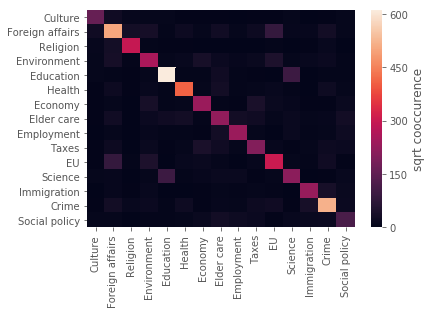

In [ ]:
columns = [class2english[i] for i in nodes]
## plt.figure(figsize=(12,8))
sns.heatmap(np.sqrt(pd.DataFrame(lex_mat,columns=columns,index=columns)),cbar_kws={'label':'sqrt cooccurence'})

### Extending the Lexicons by topword cooccurence.

In [ ]:
token_properties = []
for idx in lex2token_G:
    if idx in lex2lex:
        continue
    d = {}
    n = topwords[idx]
    d['top_occurence'] = n
    lex_matches = [(lex,lex2token_G[idx][lex]['weight']) for lex in lex2token_G[idx]]
    n_matches = sum([j for i,j in lex_matches])
    d['n_matches'] = n_matches
    best_match,w = max(lex_matches,key=lambda x: x[1])
    d['best_match_dk'] = best_match
    d['best_match'] = class2english[best_match]
    d['best_frac'] = w/n_matches
    d['all_frac'] = w/n
    
    d['entropy'] = scipy.stats.entropy([j for i,j in lex_matches])
    d['w'] = Index[idx]
    d['idx'] = idx
    token_properties.append(d)
suspect_df = pd.DataFrame(token_properties)

NameError: name 'lex2token_G' is not defined

(array([198., 199., 257., 246., 286., 306., 336., 266.,  51.,  12.]),
 array([ 0.        ,  1.22625569,  2.45251139,  3.67876708,  4.90502278,
         6.13127847,  7.35753417,  8.58378986,  9.81004555, 11.03630125,
        12.26255694]),
 <a list of 10 Patch objects>)

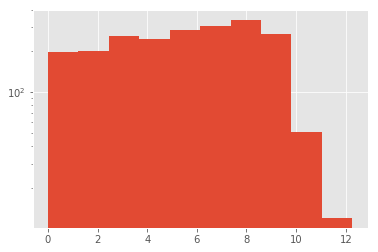

In [ ]:
#sns.distplot(,)
y = suspect_df.top_occurence.values
plt.hist(np.log(y), log=True)
#plt.hist(suspect_df.top_occurence,bins=list(range(0,100,2))+list(range(100,200,10)))
#plt.yscale('log')

#### Curate new terms for the lexicons

Text(0.5,1,'No. of suspects for each lexicon')

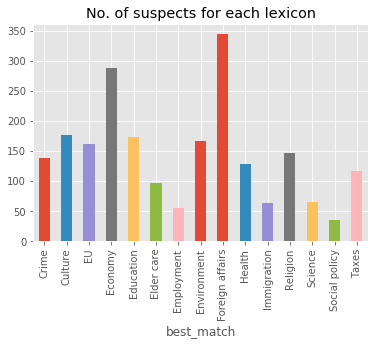

In [ ]:

suspect_df.groupby('best_match').size().plot(kind='bar')
plt.title('No. of suspects for each lexicon')

In [ ]:
lex_mat = pd.DataFrame([suspect_df.groupby('best_match').size(),suspect_df.groupby('best_match').apply(lambda x: scipy.stats.entropy(x.n_matches))]).T
lex_mat.columns = ['n_matches','entropy']
#,columns=['size','entropy'])
#plt.scatter()
#.plot(kind='bar')
lex_mat.sort_values('entropy',ascending=False)

,n_matches,entropy
best_match,,
Taxes,116.0,3.635251
Elder care,97.0,3.544427
Environment,167.0,3.523839
Economy,288.0,3.520863
Culture,176.0,3.260252
Foreign affairs,344.0,3.243736
Education,174.0,3.227960
Religion,147.0,3.136632
Health,128.0,3.044245


In [ ]:
suspect_df.to_csv('lexicon_extension_suspects.csv',index=False)

In [ ]:
import codecs
import json
json.dump(Index,codecs.open('Word_Index','w','utf-8'))
import pickle
pickle.dump(topwords,open('Topword_Occurence.pkl','wb'))
pickle.dump(lex2idx,open('lexicon2idx.pkl','wb'))

## Make dictionary sample table


In [ ]:
import codecs
#json.dump(wtrans,codecs.open('top_dictionary_words_english','w','utf-8'))
wtrans = json.load(codecs.open('top_dictionary_words_english','r','utf-8'))
#wtrans
import time
import pandas as pd
import codecs
import json,os
Index = json.load(codecs.open('Word_Index','r','utf-8'))
import pickle
topwords = pickle.load(open('Topword_Occurence.pkl','rb'))
#suspect_df = pd.read_csv('lexicon_extension_suspects.csv')
lex2idx = pickle.load(open('lexicon2idx.pkl','rb'))
dat = {}
for name in lex2idx:
    indices = lex2idx[name]
    #print(name)
    
    best_indices = sorted(indices,key=lambda x: topwords[x],reverse=True)[0:5]
    # print best words describing the Class
    l = []
    for idx in best_indices:
        #print(Index[idx],topwords[idx])
        l.append(wtrans[Index[idx].lower()])
    dat[class2english[name]] = l

In [ ]:
dic_top_df = pd.DataFrame(dat)

In [ ]:
dic_top_df.index.name = 'word'

In [ ]:
dic_top_df.columns.name = 'Category'

In [ ]:
sum(map(len,list(lex2idx.values())))

1338

In [ ]:
import tabulate

In [ ]:
from IPython.display import display, Markdown
for i in range(3):
    cols = dic_top_df.columns[i*5:i*5+5]
    
    print(tabulate.tabulate(dic_top_df[cols], tablefmt="pipe", headers="keys",showindex=False))
    

| Culture   | Environment    | Education         | Foreign affairs   | EU       |
|:----------|:---------------|:------------------|:------------------|:---------|
| music     | green          | school            | syria             | eu       |
| song      | green          | elementary school | USA               | Europe   |
| theater   | shale gas      | the school        | soldiers          | European |
| festival  | climate        | teachers          | palestine         | brussels |
| museum    | animal welfare | schools           | hillary           | eu       |
| Health     | Immigration        | Employment            | Taxes      | Science      |
|:-----------|:-------------------|:----------------------|:-----------|:-------------|
| patients   | refugees           | unemployed            | treasure   | student      |
| health     | asylum seekers     | unemployment benefits | tax havens | higher       |
| doctors    | Adjacent Areas     | benefit system        | tax        | r

In [ ]:
import pandas as pd
import codecs
import json
Index = json.load(codecs.open('Word_Index','r','utf-8'))
import pickle
topwords= pickle.load(open('Topword_Occurence.pkl','rb'))
suspect_df = pd.read_csv('lexicon_extension_suspects.csv')
def get_never_include():
    import os
    files = [i for i in os.listdir('') if 'lexicon_extension' in i and 'suspects' not in i]
    never = set()
    for filename in files:
        try:
            done_df = pd.read_csv(filename,columns=['idx','word','include','top_occurence']) 
        except:
            continue
        never.update(set(done_df[done_df['include']<0].idx))
    return never
never = get_never_include()
print(len(never))
for name,groupdf in suspect_df.groupby('best_match'):
    filename = 'lexicon_extension_%s.csv'%name
    f = open(filename,'a')
    header = ['idx','word','include','top_occurence']
    try:
        done_df = pd.read_csv(filename,columns=['idx','word','include','top_occurence']) 
        done = set(done_df.idx) # 2 is always, 1 is sometimes, 0 is no, -1 is never in any dictionary
    except:
        done = set()
    print(name,groupdf.best_match_dk.values[0])
    best_indices = sorted(indices,key=lambda x: topwords[x],reverse=True)[0:5]
    # print best words describing the Class
    for idx in best_indices:
        print(Index[idx],topwords[idx])
    # filter insignifikant words for now
    groupdf = groupdf[groupdf['n_matches']>5]
    occurence_count = 0
    for w,idx,occurence in groupdf.sort_values('all_frac')[['w','idx','top_occurence']]:
        print(w,idx)
        include = input('Do you want to include this? 2 always,1 sometimes, 0 not this, -1 never')
        if include == 1:
            occurence_count+=occurence
        row = [w,idx,include,occurence]
        f.write(','.join(map(str,row))+'\n')
        count+=1
        if count==10:
            continue_ = input('You have now included %d new top occurences to the lexicon.\nDo you want to continue to next? press y or Enter.')
            if continue_=='y':
                continue
        

## Class-Topic Overlap 
### Class Topic overlap analysis
	Doc_topic_prob to CLass. 
		- Hard Assignment
			- Top Documents

		- Correlation. 
		- Roc AUC. Based on topic probs. 

	Lexicon2Topic_wordprob
		- Top Word overlap. 
		- Word Score and Lexicon Correlation
			- Treat all lexicon words as Supervised, and mutually exclusive (i.e. no polysemi). 
			
		- Roc AUC. Based on topic probs. 
		- Correlation
	
	Lexicon2topic_word_assignment_counts
		- How many times has each lexicon been assigned to a Topic.
        

### Load extensions

In [ ]:
topwords= pickle.load(open('Topword_Occurence.pkl','rb'))
def load_dataframe(filename,names = ['word','idx','include','top_occurence']):
    try:
        df = pd.read_csv(filename,names = names,encoding='latin1')
    except:
        df = pd.read_csv(filename,names = names,encoding='utf-8')
    return df
suspect_df = pd.read_csv('lexicon_extension_suspects.csv')
dones = []
for name,groupdf in suspect_df.groupby('best_match'):
    filename = 'lexicon_extension_%s.csv'%name
    done_df = load_dataframe(filename)
    dones.append(done_df)
done_df = pd.concat(dones)
len(done_df)

2374

In [ ]:
len(done_df),done_df.idx.nunique(),sum(done_df.top_occurence)/sum(topwords.values()),len(done_df[done_df.include>=2]),len(done_df[done_df.include>2])

(2364, 2280, 0.9201516986132371, 581, 373)

In [ ]:
cols 

In [ ]:
include = set(done_df[done_df.include>=2].idx)
include2 = set(done_df[done_df.include>=1].idx)
#dict(suspect_df[suspect_df.idx.isin(include)][['idx','best_match_dk']].values)
idx2lex.update(dict(suspect_df[suspect_df.idx.isin(include)][['idx','best_match_dk']].values))
idx2lex_extent = idx2lex.copy()
idx2lex_extent.update(dict(suspect_df[suspect_df.idx.isin(include2)][['idx','best_match_dk']].values))    
#len(idx2lex),sum([topwords[idx] for idx in idx2lex])/sum(topwords.values()),sum([topwords[idx] for idx in idx2lex_extent])/(sum(topwords.values())-sum([topwords[idx] for idx in range(noise_start_w,len(Index))]))

In [ ]:

### Fix small problem with Crime Lexicon
# problematic terms in the crime lexicon.
#"grænsebomme","grænsekontrollen", # potentially in immigration, or eu, instead of crime
#'pape','pind' # should be value 1 instead of 2.
# 'christiania','christianitterne','bekæmpe' # value 1 instead of 2

## problematic terms in the health: 
# 'læg','lægge'
## problems with educatoin
## # 'lær','lærende','niveaudeling','læres','lockouten'

# problem immigration
#'dansk','danske'

w2idx = {w:num for num,w in enumerate(Index)}
for w in ['pape','pind','grænsebomme','grænsekontrollen','christiania','christianitterne','bekæmpe'
          ,'læg','lægge'
          ,'lær','lærende','niveaudeling','læres','lockouten',
         'dansk']:
    idx = w2idx[w]
    
    try:
        del idx2lex[idx]
    except:
        continue
# add danske to the make sense category.
idx = w2idx['danske']
idx2lex[idx] = 'indvandr_flygt_udlænding'
del w2idx

In [ ]:
len(idx2lex),len(idx2lex_extent)

(1627, 2022)

In [ ]:
len(topwords)

2599

In [ ]:
#done_df

In [ ]:
len(topwords)

2599

In [ ]:
for w,count in topwords.most_common(10):
    print(Index[w],count)

dag 218867
danmark 196026
__url__ 154485
derfor 111920
år 109191
danske 97398
mennesker 88025
sammen 71321
regeringen 69568
bedre 66642


In [ ]:
for w,count in topwords.most_common(10):
    print(Index[w],count)

dag 211622
danmark 189334
__url__ 149332
derfor 108396
år 105423
danske 94233
mennesker 85064
sammen 68891
regeringen 67210
bedre 64598


### Measure of Class Overlap(1): Top word Matching
* simple overlap counts.
* correlation to all words in the dictionary. Lexicon presence (1 if in a lexicon, -1 if in another).

In [ ]:
Index[420]
#dictionaries[0]

'kultur'

In [ ]:
from collections import OrderedDict
dictionaries = OrderedDict({num:set() for num,_ in enumerate(class2num)})
dictionaries_extent = OrderedDict({num:set() for num,_ in enumerate(class2num)})
for idx,class_ in idx2lex.items():
    num = class2num.index(class_)
    if idx>noise_start_w:
        continue
    dictionaries[num].add(idx)
for idx,class_ in idx2lex_extent.items():
    num = class2num.index(class_)
    if idx>noise_start_w:
        continue
    dictionaries_extent[num].add(idx)
dictionaries_extent.keys(),dictionaries.keys()
dictionaries_s = [dictionaries[i] for i in range(len(class2num))]
dictionaries_s2 = [dictionaries_extent[i] for i in range(len(class2num))]

NameError: name 'idx2lex_extent' is not defined

In [ ]:
#Index
#class2num
#class2english
dictionary_real = {class2english[class2num[i]]:[Index[w] for w in dictionaries[i]] for i in dictionaries}
import json
import codecs
f = codecs.open('Topical_dictionaries_dk','w','utf-8')
json.dump(dictionary_real,f)

In [ ]:
pure_s = set(pure_idx)
overlap_s = set(overlap_idx)
diff_s = set(range(noise_start_w,len(Index)))
def get_word_overlap(s,sets=[pure_s,overlap_s,diff_s]):
    return [len(s&s2) for s2 in sets]

def get_first_overlap(vec,o):
    for num,i in enumerate(vec): 
        if i in o:
            return num
    return 1001
tops = [5,10,20,50,100,1000]
from numpy.random import choice
def draw_probability_lexicons(wordprobs,n_draws=[5,10,20,50,100,1000],func=get_word_overlap):
    """takes a list of word probabilities and generates a random document. 
    It then calculates an overlap between certain sets of interest. Return a matrix"""
    sum_ = sum(wordprobs)
    wordprobs = wordprobs*(1/sum_)
    
    random_doc = choice(range(len(wordprobs)),size=max(n_draws),p=wordprobs,replace=False)# draws from a weighed distribution
    tops = [5,10,20,50,100,1000]
    top_overlap = np.zeros((len(tops),len(class2num)))
    for num,top in enumerate(n_draws):
        s = set(random_doc[:top])
        top_overlap[num] = get_word_overlap(s,sets=dictionaries_s)
    return top_overlap

def get_lexicon_correlation(wordprobs,lexicon_vec):
    a = make_lexicon_vec(lexicon_vec)
    a2 = wordprobs[in_lexicon[0:len(wordprobs)]]
    return np.corrcoef(a,a2)[0][1]
in_lexicon = np.array([i in idx2lex for i in range(len(Index))])
def make_lexicon_vec(s):
    a = np.zeros(len(Index[0:noise_start_w]))
    a[in_lexicon[0:noise_start_w]] = 0
    for idx in s:
        a[idx] = 1
    return a[in_lexicon[0:noise_start_w]]


def extract_top_lexicon(topic2word,top=1000):
    """Takes a matrix where each row is a sorting of words related to a topic, 
    and outputs first overlap and count of overlap with the lexicons. Lastly it takes a weighed sample and maps the overlap"""
    #topic2word = data[1].toarray()
    #topic2word_c = data[2].toarray()[:,0:noise_start_w]
    #topic2size = topic2word_c.sum(axis=1)
    # filter out noise words
    topic2word = topic2word[:,0:noise_start_w]
    #topic_size = topic2word.sum(axis=1)
    
    
    topic2topwords = np.argsort(topic2word,axis=1)[:,-top:].T[::-1].T # only includes first 1000 words.
    data = []
    for topic_num,vec in enumerate(topic2topwords):
        
        
        
        d = {}#'topic_num':topic_num}
        # get top_words to match with dictionary
        # get overlap counts
        tops = [5,10,20,50,100,1000]
        top_overlap = np.zeros((len(tops),len(class2num))) #[pure_overlap,overlap_overlap,diff_overlap]
        
        for num,top in enumerate(tops):
            s = set(vec[:top])
            top_overlap[num] = get_word_overlap(s,sets=dictionaries_s)
        d.update(dict(zip(['lexicon_overlap_%d_%d'%(top,typ) for num,top in enumerate(tops) for typ in range(len(class2num))],top_overlap.flatten())))
        # locate first overlap
        
        
        tops = [5,10,20,50,100,1000]
        top_overlap = np.zeros((len(tops),len(class2num))) #[pure_overlap,overlap_overlap,diff_overlap]
        for num,top in enumerate(tops):
            s = set(vec[:top])
            top_overlap[num] = get_word_overlap(s,sets=dictionaries_s2)
        d.update(dict(zip(['lexicon_extent_overlap_%d_%d'%(top,typ) for num,top in enumerate(tops) for typ in range(len(class2num))],top_overlap.flatten())))
        top_overlap = np.zeros((len(tops),len(class2num))) #[pure_overlap,overlap_overlap,diff_overlap]
        tops = [10]
        filter_vec = vec[0:100][np.array([(i not in cut_bottom) for i in vec[0:100]])]
        for num,top in enumerate(tops):
            s = set(filter_vec[:top])
            top_overlap[num] = get_word_overlap(s,sets=dictionaries_s)
        d.update(dict(zip(['lexicon_cutoverlap_%d_%d'%(top,typ) for num,top in enumerate(tops) for typ in range(len(class2num))],top_overlap.flatten())))
        
        # get filtered overlap removing generic words.
        
        tops = [10]
        top_overlap = np.zeros((len(tops),len(class2num))) #[pure_overlap,overlap_overlap,diff_overlap]
        for num,top in enumerate(tops):
            
            s = set(filter_vec[:top])
            top_overlap[num] = get_word_overlap(s,sets=dictionaries_s2)
        d.update(dict(zip(['lexicon_extent_cutoverlap_%d_%d'%(top,typ) for num,top in enumerate(tops) for typ in range(len(class2num))],top_overlap.flatten())))
        
        # locate first overlap
        first_idx = []
        for s in dictionaries_s:   
            first_idx.append(get_first_overlap(vec,s))
        # format data as dict.
        d.update(dict(zip(['firstoverlap_%d'%num for num in range(len(class2num))],first_idx)))
        # get overlap if sampling was random instead of from top end of dist
        word_probabilities = topic2word[topic_num]
        top_overlap = draw_probability_lexicons(word_probabilities,n_draws=tops)
        d.update(dict(zip(['lexicon_randomoverlap_%d_%s'%(top,typ) for num,top in enumerate(tops) for typ in range(len(class2num))],top_overlap.flatten())))
        ## lexicon correlation
        for num,s in enumerate(dictionaries_s):
            #s = s-set(range(noise_start_w,len(Index)))
            d['lexicon_correlation_%d'%num] = get_lexicon_correlation(word_probabilities,s)
        d['topwords'] = tuple(vec[0:10])
        
        ### Calculate how much the top words share is of the whole topic.
        ## topword fraction of the topic.
        
        frac_weight = topic2word[topic_num,vec[0:10]].sum()
        d['topword_frac'] = frac_weight
        ## how many of the topical documents are the top words represented in, weighing documents with topic prevalance.
        
        #size = topic2size[topic_num]
        #count_top = topic2word_c[topic_num,vec[0:10]].sum()
        #print(frac_weight,count_top/size)
        
        data.append(d)
    return pd.DataFrame(data)


topic2word = data[1].toarray()
extract_top_lexicon(topic2word).head()
    
# use the `lex2idx` variable

,firstoverlap_0,firstoverlap_1,firstoverlap_10,firstoverlap_11,firstoverlap_12,firstoverlap_13,firstoverlap_14,firstoverlap_2,firstoverlap_3,firstoverlap_4,...,lexicon_randomoverlap_10_2,lexicon_randomoverlap_10_3,lexicon_randomoverlap_10_4,lexicon_randomoverlap_10_5,lexicon_randomoverlap_10_6,lexicon_randomoverlap_10_7,lexicon_randomoverlap_10_8,lexicon_randomoverlap_10_9,topword_frac,topwords
0,685,276,158,200,144,1001,155,1001,126,0,...,0.0,0.0,2.0,0.0,0.0,1.0,0.0,0.0,0.190280,"(29, 1, 2, 8, 686, 281, 149, 12, 340, 0)"
1,625,25,36,351,32,1001,223,39,7,123,...,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.179612,"(175, 379, 0, 739, 1, 498, 8, 749, 1899, 96)"
2,408,350,1001,164,1001,334,394,85,414,1001,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.124289,"(98, 218, 393, 110, 1054, 59, 1109, 796, 1426,..."
3,709,1001,1001,1001,982,241,113,182,588,1001,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.061475,"(5, 31, 20, 35, 492, 92, 63, 238, 52, 0)"
4,536,330,1001,44,121,19,288,104,224,108,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.151488,"(13, 36, 74, 289, 172, 3, 261, 254, 256, 294)"


In [ ]:
#extract_top_lexicon(topic2word)[['lexicon_correlation_%d'%i for i in range(15)]].max()

In [ ]:
#Index[2]

In [ ]:
def get_dic_name(num):
    return class2english[class2num[int(num)]]


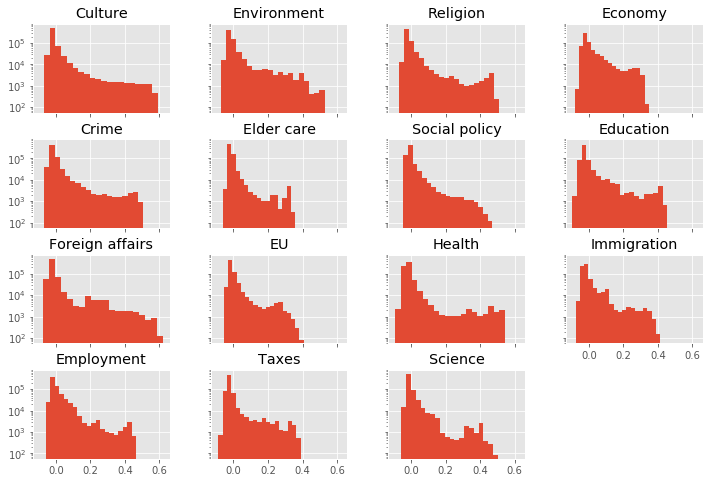

In [ ]:
## plot of lexicon_correlation distribution, the tail seem to be indicating some sort of quality measure.
def get_dic_name(num):
    return class2english[class2num[int(num)]]
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
axes = lexicon_df[['lexicon_correlation_%d'%num for num in range(15)]].hist(figsize=(12,8),bins=20,sharey=True,sharex=True)
for axi in axes:
    for ax in axi:
        ax.set_yscale('log')
        title = ax.title.get_text()
        try:
            ax.set_title(get_dic_name(int(title.split('_')[-1])))
        except:
            continue

In [ ]:
data

[<46825x145 sparse matrix of type '<class 'numpy.float64'>'
 	with 6789625 stored elements in Compressed Sparse Row format>,
 <145x32399 sparse matrix of type '<class 'numpy.float64'>'
 	with 4697855 stored elements in Compressed Sparse Row format>,
 <145x32399 sparse matrix of type '<class 'numpy.int32'>'
 	with 164996 stored elements in Compressed Sparse Row format>]

## Model Selection: Semantic Coherence and Exclusivity of top 10.
Following the STM package.

- Mimno et al. 2011: 
    - Co-occurrence count normalized by frequency. 
    
Airoldi and Bischof 2012: 
    - A harmonic mean of a words rank in terms of frequency in the topic(relative to all other words in the topic) and in terms of frequency accross topic (relative to all topics). 
    


In [ ]:
import scipy.stats as ss
def get_frex_noise(data,w = 0.7):
    topic2word = data[1].toarray()
    # frequency rank
    fr = ss.mstats.rankdata(topic2word,axis=1)/topic2word.shape[1] # normalize by no. of tokens
    # exclusivity score
    ex = (ss.mstats.rankdata(topic2word,axis=0).T/topic2word.shape[0]).T # normalize by no. of topics
    
    # calculate inverse harmonic mean weighted by w.
    frex = 1/(w/ex + (1-w)/fr)
    
    
    ## extrac the top and calculate a mean.
    # sort the frex scores
    sorted_frex = frex.argsort().T[::-1].T
    
    # calculate averages
    
    
    dat = []
    tops = [5,10,20,50]
    for num,vec in enumerate(sorted_frex[:,:1000]):
        
        top_overlap = np.zeros((len(tops),3)) 
        for num,topn in enumerate(tops):
            top = vec[0:topn]
            # get frex overlaps
            s = set(top)
            noise_overlap = get_word_overlap(s)
            top_overlap[num] = noise_overlap
        
        d = {}
        # get top_words to match with dictionary
        # get overlap counts
        class_d = dict(zip(['frex_noise_overlap_%d_%s'%(top,typ) for num,top in enumerate(tops) for typ in ['real','both','noise']],top_overlap.flatten()))
        d.update(class_d)
            # get overlap with dictionaries.
            
        dat.append(d)
    
    exlusivity_df = pd.DataFrame(dat)
    return exlusivity_df


def get_frex_scores(data,w = 0.7):

    topic2word = data[1].toarray()[:,0:noise_start_w]

    # frequency rank
    fr = ss.mstats.rankdata(topic2word,axis=1)/topic2word.shape[1] # normalize by no. of tokens
    # exclusivity score
    ex = (ss.mstats.rankdata(topic2word,axis=0).T/topic2word.shape[0]).T # normalize by no. of topics
    
    # calculate inverse harmonic mean weighted by w.
    frex = 1/(w/ex + (1-w)/fr)
    
    
    ## extrac the top and calculate a mean.
    # sort the frex scores
    sorted_frex = frex.argsort().T[::-1].T
    
    # calculate averages
    
    
    dat = []
    topwords = []
    tops = [5,10,20,50]
    for num,vec in enumerate(sorted_frex[:,:1000]):
        topwords.append(tuple(vec[0:10]))
        top_overlap = np.zeros((len(tops),len(class2num))) 
        top_overlap_extent = np.zeros((len(tops),len(class2num)))
        frex_scores = []
        for num,topn in enumerate(tops):
            top = vec[0:topn]
            frex_score = frex[num,top].mean()
            # get frex overlaps
            s = set(top)
            class_overlap = get_word_overlap(s,sets=dictionaries_s)
            class_overlap_extent = get_word_overlap(s,sets=dictionaries_s2)
            
            top_overlap[num] = class_overlap
            top_overlap_extent[num] = class_overlap_extent
            frex_scores.append(frex_score)
        
        d = {'semantic_exclusivity_%d'%topn:frex_scores[i] for i,topn in enumerate(tops)}
        # get top_words to match with dictionary
        # get overlap counts
        class_d = dict(zip(['frex_overlap_%d_%d'%(top,typ) for num,top in enumerate(tops) for typ in range(len(class2num))],top_overlap.flatten()))
        class_extent_d = dict(zip(['frex_overlap_extent_%d_%d'%(top,typ) for num,top in enumerate(tops) for typ in range(len(class2num))],top_overlap_extent.flatten()))
        d.update(class_d)
        d.update(class_extent_d)
            # get overlap with dictionaries.
            
        dat.append(d)
    
    exlusivity_df = pd.DataFrame(dat)
    exlusivity_df['topwords_frex'] = topwords
    # label based on frex
    overlap_column = 'frex_overlap_10_%d'
    match_frex = exlusivity_df[[overlap_column%i for i in range(len(class2num))]].values
    # get best
    best_label = match_frex.argsort(axis=1)[:,-1]
    best_label = np.array(best_label, dtype=np.float32)
    # filter junk
    best_label[match_frex.sum(axis=1)!=match_frex.max(axis=1)] = np.nan
    # filter non matches
    best_label[match_frex.sum(axis=1)==0] = np.nan    
    
    exlusivity_df['frex_label'] = best_label
    return exlusivity_df
    
# semantic coherence.
# (co-occurrence+epsilon)/ freq

if type(real_bows) != np.ndarray: # dense matrix
    real_bows = real_bows.toarray()

def get_coherence(top_mat,epsilon=0.01):
    # round down to 1
    top_mat[top_mat>0] = 1
    word_sum = top_mat.sum(axis=0)
    co_occurrence = top_mat.T.dot(top_mat)
    vals = []
    for i in range(len(co_occurrence)-1):
        for j in range(len(co_occurrence)):
            if i==j:
                continue
            Dj = word_sum[j]
            co_occur = co_occurrence[i,j]+epsilon
            
            vals.append(np.log(co_occur/Dj))
    return np.mean(vals)


def get_coherence_scores(data):

    topic2word = data[1].toarray()[0:noise_start_w]
    topic2topwords = np.argsort(topic2word,axis=1)[:,-1000:].T[::-1].T # only includes first 1000 words.
    coherence_scores = []
    for v in topic2topwords:
        coherence = []
        for topn in [5,10,20]:
            top = v[0:topn]            
            top_mat = real_bows[:,top].copy()
            coh = get_coherence(top_mat)
            coherence.append(coh)
        coherence_scores.append(coherence)
    coherence_scores = np.array(coherence_scores)
    #return coherence_scores
    return pd.DataFrame(coherence_scores,columns=['semantic_coherence_%d'%topn for topn in [5,10,20]])
    


In [ ]:
frex_noise = get_frex_noise(data)

In [ ]:
frex_noise.head()

,frex_noise_overlap_10_both,frex_noise_overlap_10_noise,frex_noise_overlap_10_real,frex_noise_overlap_20_both,frex_noise_overlap_20_noise,frex_noise_overlap_20_real,frex_noise_overlap_50_both,frex_noise_overlap_50_noise,frex_noise_overlap_50_real,frex_noise_overlap_5_both,frex_noise_overlap_5_noise,frex_noise_overlap_5_real
0,0.0,0.0,10.0,1.0,0.0,19.0,1.0,0.0,49.0,0.0,0.0,5.0
1,0.0,0.0,10.0,1.0,0.0,19.0,1.0,0.0,49.0,0.0,0.0,5.0
2,0.0,0.0,10.0,0.0,0.0,20.0,0.0,0.0,50.0,0.0,0.0,5.0
3,0.0,0.0,10.0,0.0,0.0,20.0,0.0,0.0,50.0,0.0,0.0,5.0
4,0.0,0.0,10.0,1.0,0.0,19.0,3.0,0.0,47.0,0.0,0.0,5.0


In [ ]:
coherence_df = get_coherence_scores(data)
exclusivity_df = get_frex_scores(data)

In [ ]:
# dump bows

### Measure of Class Overlap(2): Matching topics and top documents
Matching top documents to the lexicons

In [ ]:
dic_class = pol_df.topic_class.values
dic_class_mat = pd.get_dummies(dic_class).T.values

In [ ]:
#dic_class_mat.sum(axis=1).argsort()

In [ ]:
#pol_df.topic_class.value_counts().sort_values()


In [ ]:
from numpy.random import choice
def draw_probability_doc_overlap(docprobs,n_draws=[5,10,20,50,100,1000]):
    """takes a list of word probabilities and generates a random document. 
    It then calculates an overlap between certain sets of interest. Return a matrix"""
    ## normalize docprobs
    docprobs = docprobs/sum(docprobs)
    random_doc = choice(range(len(docprobs)),size=max(n_draws),p=docprobs,replace=False)# draws from a weighed distribution
    
    return get_top_class_fractions(random_doc)
tops = [5,10,20,50,100,1000]
def get_top_class_fractions(vec):
    top_overlap = np.zeros((len(tops),len(class2num))) #[pure_overlap,overlap_overlap,diff_overlap]
    for num_,top in enumerate(tops):
        idx = vec[:top]
        subset = dic_class_mat[:,idx]

        count_overlap = subset.sum(axis=1)
        fracs = count_overlap/count_overlap.sum()
        top_overlap[num_] = fracs
    return top_overlap

def extract_top_doc_class(data,top=1000):
    """Takes a matrix where each row is a sorting of  related to a topic, 
    and outputs first overlap and count of overlap with the three different word types (real,overlap,noise). Lastly it """
    doc2topic = data[0].toarray()[:noise_start_d]
    #tops = [5,10,20,50,100,1000,len(doc2topic)]
    tops = [5,10,20,50,100,1000]
    topic2top_doc = np.argsort(doc2topic,axis=0).T[:,-max(tops):].T[::-1].T
    
    data = []
    for num,vec in enumerate(topic2top_doc):
        d = {}
        top_overlap = get_top_class_fractions(vec)
        d.update(dict(zip(['lexicon_doc_overlap_%d_%d'%(top,typ) for num,top in enumerate(tops) for typ in range(len(class2num))],top_overlap.flatten())))
        
        # get random overlap
        vec = doc2topic.T[num]
        
        top_overlap = draw_probability_doc_overlap(vec)
        d.update(dict(zip(['lexicon_doc_randomoverlap_%d_%d'%(top,typ) for num,top in enumerate(tops) for typ in range(len(class2num))],top_overlap.flatten())))
        data.append(d)
        
        ### MISSING ###
        # locate first overlap
    return pd.DataFrame(data)
temp = extract_top_doc_class(data)
    

In [ ]:
def get_lexicon_top_overlap(data):
    topic2word = data[1].toarray()
    df = extract_top_lexicon(topic2word)
    df_topdoc = extract_top_doc_class(data)
    # get_coherence and exclusivity
    coherence_df = get_coherence_scores(data)
    exclusivity_df = get_frex_scores(data)
    frex_noise = get_frex_noise(data)
    return pd.concat([coherence_df,exclusivity_df,frex_noise,df_topdoc,df],axis=1)
#get_lexicon_top_overlap(data)

In [ ]:
get_lexicon_top_overlap(data).head()

,semantic_coherence_5,semantic_coherence_10,semantic_coherence_20,frex_overlap_10_0,frex_overlap_10_1,frex_overlap_10_10,frex_overlap_10_11,frex_overlap_10_12,frex_overlap_10_13,frex_overlap_10_14,...,lexicon_randomoverlap_5_2,lexicon_randomoverlap_5_3,lexicon_randomoverlap_5_4,lexicon_randomoverlap_5_5,lexicon_randomoverlap_5_6,lexicon_randomoverlap_5_7,lexicon_randomoverlap_5_8,lexicon_randomoverlap_5_9,topword_frac,topwords
0,-2.448676,-2.653339,-3.133783,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.123770,"(11, 869, 14, 13, 1420, 794, 38, 330, 9, 2439)"
1,-2.058859,-2.822654,-3.058687,0.0,7.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.127554,"(545, 918, 1302, 1554, 518, 582, 8, 2005, 12, 4)"
2,-2.388650,-2.814038,-2.890707,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.112722,"(68, 43, 69, 106, 81, 31, 73, 125, 596, 63)"
3,-2.584733,-2.686687,-2.973050,0.0,0.0,3.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.093478,"(493, 1, 8, 255, 11, 4, 1158, 693, 6, 9)"
4,-2.461685,-2.983156,-3.380961,0.0,0.0,0.0,0.0,5.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.191732,"(1, 676, 963, 2, 986, 8, 1820, 201, 1011, 872)"


### Measure of Class Overlap(3): How much do each topic measure each lexicon class
Errors will be weighed by the confusion matrix.

** Measures **

Soft assignment:
    - Auc Score
    - Fraction True: sum(TP)/sum(FalsePositives)

Hard Assignment:
    - Accuracy,Precision, Recall:
    - Count True. Count False. Find Optimal Cut through all models.

In [ ]:
dic_class = pol_df.topic_class.values
dic_class_mat = pd.get_dummies(dic_class).T.values
doc_sum = real_bows.sum(axis=1)

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


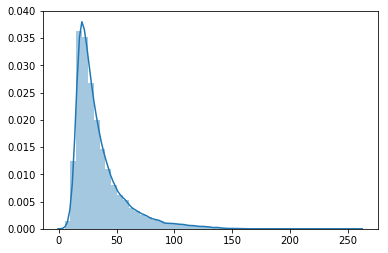

In [ ]:
sns.distplot(doc_sum)

In [ ]:
#data

In [ ]:
def corr2_coeff(A,B):
    # Rowwise mean of input arrays & subtract from input arrays themeselves
    A_mA = A - A.mean(1)[:,None]
    B_mB = B - B.mean(1)[:,None]

    # Sum of squares across rows
    ssA = (A_mA**2).sum(1);
    ssB = (B_mB**2).sum(1);

    # Finally get corr coeff
    return np.dot(A_mA,B_mB.T)/np.sqrt(np.dot(ssA[:,None],ssB[None]))

#doc2topic[0:len(dic_class)].shape
def get_topiclex_correlation(data):
    doc2topic = data[0].toarray()
    corr_mat = corr2_coeff(doc2topic.T[:,0:len(dic_class)],dic_class_mat)
    return pd.DataFrame(corr_mat,columns = ['lexicon_doc_correlation_%d'%num for num in range(len(class2num))])
#print(corr2_coeff(doc2topic.T[:,0:len(dic_class)],dic_class_mat).shape)
#fractions = []
#for vec in dic_class_mat:
#    topprob = doc2topic.T[0][0:len(dic_class)] 
#    fractions.append(sum(vec * topprob)/sum(topprob))
#print(fractions)
def get_class_fractions_decreasing(vec):
    fracs = np.linspace(0,1,10)
    top_overlap = np.zeros((len(tops),len(class2num))) #[pure_overlap,overlap_overlap,diff_overlap]
    
    topic_size = sum(vec)
    for num_,top in enumerate(tops):
        idx = vec[:top]
        subset = dic_class_mat[:,idx]

        count_overlap = subset.sum(axis=1)
        fracs = count_overlap/count_overlap.sum()
        top_overlap[num_] = fracs
    return top_overlap


def get_fractions(data):
    doc2topic = data[0].toarray()
    # will return a matrix where each row is a topic, and how much of it is measuring each class in the columns.
    topic2class_frac = np.true_divide(doc2topic.T[:,0:len(dic_class)].dot(dic_class_mat.T).T,doc2topic.T[:,0:len(dic_class)].sum(axis=1)).T
    doc2topic = doc2topic[:len(dic_class)]
    
    ## add top2bottom based on the highest prevalent dictionary category.
    ### it does however not match what is used for matching.
    #topic_cat = topic2class_frac.argsort()[:,-1]
    
    ## locate best match based on top words.
    topic2word = data[1].toarray()
    topic2word = topic2word[:,0:noise_start_w]
    # 
    topic2topwords = np.argsort(topic2word,axis=1)[:,-10:].T[::-1].T # only includes first 10 words.
    topic_cat = []
    for vec in topic2topwords:
        s = set(vec)
        topic_cat.append(np.array(get_word_overlap(s,sets=dictionaries_s)).argsort()[-1])
    topic_cat = np.array(topic_cat)
    
    
    topic2top_doc = np.argsort(doc2topic,axis=0)[::-1].T
    fracs = np.arange(0.1,1.1,0.1)
    topic2top2bottom = []
    topic2top2bottom_abs = []
    topic2top2bottom_perc = []
    for num,_ in enumerate(topic_cat):
        believed = dic_class_mat[topic_cat[num]]
     #   print(believed.shape)
        last = 0
        top2bottom = []
        top2bottom_abs = []
        top2bottom_perc = []
        for frac in fracs:
            
            #n = int(len(vec)*frac)
            vec = doc2topic[:,num]
            idx = np.logical_and(vec<=frac,vec>last)#[last:n]
            #print(sum(idx),frac,last)
            #print(idx.shape,'idx')
            temp_believed = believed[idx]
           # print(doc2topic.shape,'doc2topic')
            temp_vec = vec[idx]
          #  print(temp_vec.sum(),temp_believed.sum())
            temp_doc_size = doc_sum[idx]
            #print(temp_believed.shape,temp_vec.shape)
            # normalize by the whole topic
            top2bottom.append(temp_believed.dot(temp_vec)/temp_vec.sum())
            # absolutte numbers for later reweighing.
            top2bottom_abs.append(temp_doc_size.dot(temp_vec))
            top2bottom_perc.append(temp_vec.sum())
            last = frac
        topic2top2bottom.append(top2bottom)
        topic2top2bottom_abs.append(top2bottom_abs)
        topic2top2bottom_perc.append(top2bottom_perc)
    temp_df = pd.DataFrame(topic2class_frac,columns = ['lexicon_doc_fraction_%d'%num for num in range(len(class2num))])
    temp_df['top2bottom'] = topic2top2bottom
    temp_df['top2bottom_abs'] = topic2top2bottom_abs
    temp_df['top2bottom_percentage'] = topic2top2bottom_perc
    
    # make ratio 90 to 10
    topic2top_doc = np.argsort(doc2topic,axis=0)[::-1].T
    top2bottom_ratio = []
    # find the optimal threshold for balancing precision and recall
    balance_best = []
    top2bottom_ratio2 = []
    for num,vec in enumerate(topic2top_doc):
        
        believed = dic_class_mat[topic_cat[num]]
    #    y_scores = doc2topic[vec][:,topic_cat[num]]
        
    #    p, r, thresholds = sklearn.metrics.precision_recall_curve(believed, y_scores)
        
    #    keep_thres = 0.01
    #    filter_ = y_scores>=keep_thres
    #    re_weighed_p = (len(filter_)/sum(filter_))*p
     
    #    best = np.argmax((re_weighed_p*r/(re_weighed_p+r)))
        
    
    #    thres = thresholds[best]
        
        
        # filter vec so low values are not counted in recall.
     #   y_pred = y_scores>=thres
     #   precision = sklearn.metrics.precision_score(believed,y_pred)
        
        
        
     #   positives = believed[filter_].sum()
     #   y_pred = y_pred[filter_]*1
     #   recall = y_pred.dot(believed[filter_])/positives
        
     #   if num==25:
     #       print(sum(filter_),len(filter_),p[best],thres,positives,sum(y_pred),recall,y_pred.dot(believed[filter_]))
        
        #recall = sklearn.metrics.recall_score(,y_scores[filter_]<=thres)
        
     #   f1 = 2*((precision*recall)/(precision+recall))
        
     #   balance_best.append(f1)
        
        ## Percentage Top.
        n =int(0.1*len(vec))
        top = vec[0:n]
        
        
        top_believed = believed[top]
        top_topic = doc2topic[top][:,num]
        top_frac = top_believed.dot(top_topic)/top_topic.sum()
        
        #print(num,top_frac,believed.dot(vec)/top_topic.sum())
        
        bottom = vec[n:]
        bottom_believed = believed[bottom]
        bottom_topic = doc2topic[bottom][:,num]
        bottom_frac = bottom_believed.dot(bottom_topic)/bottom_topic.sum()
        ratio = top_frac/bottom_frac
        
        top2bottom_ratio.append(ratio)#(ratio,top_frac,bottom_frac))
        ## Absolutte top based on how much it weighs in the topic prevalence.
        ## cumsum to find the 0.1 frac.
        cumulative_believed = np.cumsum(believed)/believed.sum()
        top = vec[cumulative_believed<=0.1]
        bottom = vec[cumulative_believed>0.1] 
        
        top_believed = believed[top]
        top_topic = doc2topic[top][:,num]
        top_frac = top_believed.dot(top_topic)/top_topic.sum()
        
        #print(num,top_frac,believed.dot(vec)/top_topic.sum())
        
        bottom_believed = believed[bottom]
        bottom_topic = doc2topic[bottom][:,num]
        bottom_frac = bottom_believed.dot(bottom_topic)/bottom_topic.sum()
        ratio = top_frac/bottom_frac
        
        top2bottom_ratio2.append(ratio)#(ratio,top_frac,bottom_frac))    
    
    top2bottom_descriptions = {'top2bottom_ratio_quantile':'''
    Ratio between the performance of the first 0.1 to the 0.9, fraction measured in n_docs *0.1 ''',
                              'top2bottom_ratio':'''
                              Ratio between the performance of the first 0.1 to the 0.9, fraction measured in absolutte weight''',
                              }
    
    temp_df['top2bottom_ratio_quantile'] = top2bottom_ratio
    temp_df['top2bottom_ratio'] = top2bottom_ratio2
    #temp_df['best_f1'] = balance_best
    ## make precision recall with hard assignment
    doc2hard = np.argsort(doc2topic,axis=1)[:,-1]
    negatives = []
    recall = []
    hard_size = []
    for num in range(doc2topic.shape[1]):
        idx = (doc2hard==num)*1
        believed = dic_class_mat[topic_cat[num]]
     #   print(believed.shape,idx.shape,doc2hard.shape,doc2topic.shape)
        positives = believed.sum()
        true_positives = believed.dot(idx)
        negatives.append(sum(idx)-true_positives)
        hard_size.append(positives)
        recall.append(true_positives) # ## recall onle make sense if all accepted topics are added afterwards. 
        
    temp_df['hard_positives'] = recall
    temp_df['hard_negatives'] = negatives
    temp_df['hard_size'] = hard_size # size of the believed label.
    temp_df['topword_label'] = topic_cat
    temp_df['best_label'] = topic2class_frac.argsort()[:,-1]
    return temp_df
#doc2topic.T[:,0:len(dic_class)].dot(dic_class_mat.T).T

#np.true_divide(doc2topic.T[:,0:len(dic_class)].dot(dic_class_mat.T).T,doc2topic.T[:,0:len(dic_class)].sum(axis=1)).T
#round(sum(np.true_divide(doc2topic.T[:,0:len(dic_class)].dot(dic_class_mat.T).T,doc2topic.T[:,0:len(dic_class)].sum(axis=1)).T[0]-np.array(fractions)),5)
import sklearn.metrics
#for vec in dic_class_mat:
#    sklearn.metrics.roc_auc_score()
#for vec in dic_class_mat:
#    print(np.corrcoef(vec,doc2topic.T[0][0:len(dic_class)])[0][1])

#top_topic,top_believed = get_fractions(data)
get_fractions(data).head()
#get_topiclex_correlation(data).head()
    

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in double_scalars


,lexicon_doc_fraction_0,lexicon_doc_fraction_1,lexicon_doc_fraction_2,lexicon_doc_fraction_3,lexicon_doc_fraction_4,lexicon_doc_fraction_5,lexicon_doc_fraction_6,lexicon_doc_fraction_7,lexicon_doc_fraction_8,lexicon_doc_fraction_9,...,top2bottom,top2bottom_abs,top2bottom_percentage,top2bottom_ratio_quantile,top2bottom_ratio,hard_positives,hard_negatives,hard_size,topword_label,best_label
0,0.006588,0.020923,0.018030,0.033467,0.755871,0.017087,0.025871,0.012526,0.019277,0.008047,...,"[0.21341253188503662, 0.5635420087430782, 0.73...","[2853.09707879669, 3569.549124665419, 4616.990...","[84.88786327180362, 112.82598499701356, 151.31...",24.707571,24.759001,954,139,3403,4,4
1,0.030237,0.024515,0.066216,0.307495,0.041545,0.066665,0.076520,0.055028,0.023327,0.027036,...,"[0.06836489551751952, 0.08502705240109683, 0.1...","[3240.727504334112, 3682.5979462112978, 3630.8...","[87.92770320574827, 94.47498603285547, 99.2752...",1.048825,1.053834,36,463,3351,6,3
2,0.029696,0.061381,0.217204,0.033445,0.027704,0.076621,0.057640,0.052449,0.085949,0.019044,...,"[0.0312307352484411, 0.03439590472507913, 0.04...","[3623.0603164615313, 5359.178423899929, 5435.5...","[96.94192938520193, 125.2757118977241, 128.796...",1.108624,1.124693,16,580,1251,14,2
3,0.046499,0.060454,0.121441,0.076181,0.060338,0.110949,0.070386,0.035555,0.064249,0.048088,...,"[0.028470935008837038, 0.01991107934026908, 0....","[4645.498931988361, 8140.965402743651, 8789.95...","[118.2670038821769, 186.18977369565744, 213.00...",0.974081,0.913235,23,706,1251,14,2
4,0.013342,0.059254,0.097357,0.048956,0.026645,0.106420,0.045776,0.036847,0.103558,0.033360,...,"[0.028201244012366403, 0.02969472554362021, 0....","[3651.1908986129683, 6108.078465162625, 6294.4...","[96.90961200842332, 148.92676090478628, 173.69...",1.093940,1.088638,34,907,1251,14,11


In [ ]:
top2bottom_descriptions = {'top2bottom_ratio_quantile':'''
    Ratio between the performance of the first 0.1 to the 0.9, fraction measured in n_docs *0.1 ''',
                              'top2bottom_ratio':'''
    Ratio between the performance of the first 0.1 to the 0.9, fraction measured in absolutte weight''',
                               'top2bottom':'''
                               list of performance by fractions (0.1,0.2 .. 1), where fraction is absolutte topic fraction
                               add _abs and _percentage to reweigh the signifance of each bin.'''
                              }
   

In [ ]:
temp = get_fractions(data)
#temp.best_f1.ix[25]

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in double_scalars


In [ ]:
#(temp['top2bottom_ratio']>temp['top2bottom_ratio_0.1']).sum()/len(temp)
label_descriptions = {'best_label':'''Best weighted precision''','topword_label':'''best label in relation to top words''',
                     'frex_label':'''best label in relation to frex weighted top words'''}

In [ ]:
temp['top2bottom_ratio'].sum(),temp['top2bottom_ratio_quantile'].sum()

(625.9091514962158, 624.3373668280215)

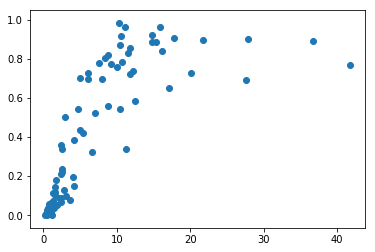

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.scatter(temp.top2bottom_ratio,temp.hard_precision)

In [ ]:
temp[['topword_label','best_label','hard_precision','hard_recall']]

,topword_label,best_label,hard_precision,hard_recall
0,7,2,0.049865,37
1,14,2,0.028698,13
2,3,3,0.600000,12
3,14,11,0.042017,10
4,14,1,0.013592,7
5,14,1,0.004184,1
6,12,12,0.903630,722
7,14,4,0.011019,4
8,6,6,0.117816,41
9,12,12,0.525926,213


In [ ]:
temp.hard_precision.ix[25],temp.hard_recall.ix[25]

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


(0.9824414715719063, 0.22355403348554034)

In [ ]:
temp.hard_recall.ix[25],temp.hard_precision.ix[25]

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


(0.22355403348554034, 0.025427946936743925)

In [ ]:
doc2hard = np.argsort(doc2topic,axis=1)[:,-1]#[::-1].T

(array([  862.,  7182., 12253., 10644.,  6905.,  4115.,  2243.,  1150.,
          612.,   364.]),
 array([0.13172515, 0.21778006, 0.30383498, 0.38988989, 0.47594481,
        0.56199973, 0.64805464, 0.73410956, 0.82016447, 0.90621939,
        0.99227431]),
 <a list of 10 Patch objects>)

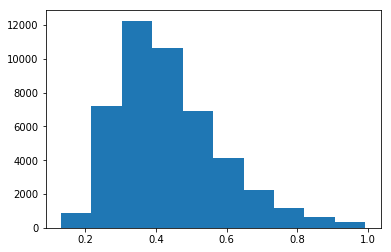

In [ ]:
plt.hist(doc2topic[range(len(doc2topic)),doc2hard]    )
#doc2hard[:,-1].shape

In [ ]:
temp.top2bottom_ratio.ix[25],temp.top2bottom.ix[25]

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


(1.1573576125352492,
 [0.3113467404114546,
  0.7481190822345057,
  0.9280115050098477,
  0.9705309740757717,
  0.9872890402956618,
  0.9918966940217583,
  1.0,
  1.0,
  0.9999999999999998,
  1.0000000000000002])

In [ ]:
biggest = temp[[col for col in temp.columns if 'lexicon_doc_frac' in col]].values.argsort(axis=1)[:,-1]
temp[[col for col in temp.columns if 'lexicon_doc_frac' in col]].values[np.arange(len(biggest)),biggest][25]

0.9120355938171628

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


(0, 1)

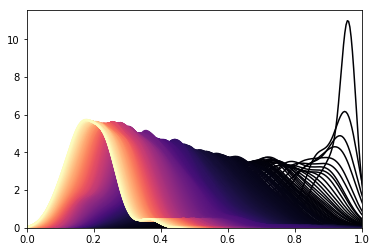

In [ ]:
import seaborn as sns
cmap = plt.cm.magma
for i in range(1000):
    sns.distplot(doc2topic.T[np.arange(doc2topic.shape[1]),topic2top_doc[:,i]],hist=False,color=cmap(i/1000))
plt.xlim(0,1)

### Measure of Class Overlap(4): Matching topics to Ground Truth Labels
Compare the true fraction to the believed fraction.

In [ ]:
# missing
label_dummy = pd.read_csv('simple_labels.csv')
id2idx = dict(zip(pol_df['id'].values,range(len(pol_df))))

In [ ]:
label_dummy.index = [int(id2idx[i]) for i in label_dummy['id']]
error_weight = label_dummy['weight'].values
label_dummy = label_dummy.drop(['id','weight'],axis=1)

In [ ]:
label_mat = label_dummy.values

In [ ]:
label_idx = label_dummy.index

In [ ]:

def compare_to_human(data):
    doc2topic = data[0].toarray()[0:noise_start_d]
    ## subset the labeled part
    doc2topic = doc2topic[label_idx]
    ## Get Correlations.
    temp = np.zeros((len(label_mat.T),len(doc2topic[0])))
    sum_ = np.zeros((len(label_mat.T),len(doc2topic[0])))
    for num,vec in enumerate(label_mat.T):
        boolean = np.isfinite(vec)
        temptopic = doc2topic[boolean]
        # get the weight of each error.
        weight = error_weight[boolean]
        
        vec = vec[boolean]*weight
        d = {}
        # count fraction of measured
        count = (vec*temptopic.T).sum(axis=1)
        temp[num] = count
        # weighed sum
        sum_ = (temptopic.T*weight).sum(axis=1)
        
    ## weight the overlaps.
    temp = temp*sum_
    fracs = temp/temp.sum(axis=0)
    fracs = pd.DataFrame(fracs).T
    fracs.columns = ['human_frac_%d'%i for i in range(15)]
    
    return fracs
temp = compare_to_human(data)
temp2 = get_fractions(data)

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in double_scalars


** Differential Bias **
How accurate is the counts in relation to time and actors.

**missing** 
When calculating fractions, how to incorporate natural variance based on low n.

In [ ]:
# make time periods
import datetime
def round_date(date,scale={'month':1,'day':1},func=lambda x: x):
    basic = {'second':0,'minute':0,'hour':0}
    scale.update(basic)
    return func(date.replace(**scale))
def year_func(date):
    if date.year<2012:
        return date.replace(year=2012)
    return date
# make year dummies
pol_df['year'] = pol_df.t.apply(lambda x: round_date(datetime.datetime.fromtimestamp(x),func=year_func))
years = pol_df.year

year_dummy = pd.get_dummies(years)
year_mat = year_dummy.values
# make party dummy
party_dummy = pd.get_dummies(pol_df.party)
party2idx = party_dummy.columns
party_mat = party_dummy.values
def get_differential_fractions(doc2topic,p_num):
    # will return a matrix where each row is a topic, and how much of it is measuring each class in the columns.    
    topic2class_frac = np.true_divide(doc2topic.dot(dic_class_mat.T).T,doc2topic.sum(axis=1)).T
    return pd.DataFrame(topic2class_frac,columns = ['diffential_fraction_p%d_%d'%(p_num,num) for num in range(len(class2num))])
def get_differential_fractions_t(doc2topic,t_num):
    # will return a matrix where each row is a topic, and how much of it is measuring each class in the columns.    
    topic2class_frac = np.true_divide(doc2topic.dot(dic_class_mat.T).T,doc2topic.sum(axis=1)).T
    return pd.DataFrame(topic2class_frac,columns = ['diffential_fraction_t%d_%d'%(t_num,num) for num in range(len(class2num))])


In [ ]:
party2idx

Index(['Alternativet', 'Dansk Folkeparti', 'Det Konservative Folkeparti',
       'Enhedslisten', 'Fremskridtspartiet', 'Kristendemokraterne',
       'Liberal Alliance', 'Radikale Venstre', 'Socialdemokratiet',
       'Socialistisk Folkeparti', 'Venstre'],
      dtype='object')

In [ ]:
lexicon_df[[col for col in lexicon_df.columns if 'diffential_fraction_p' in col]]

,diffential_fraction_p0_0,diffential_fraction_p0_1,diffential_fraction_p0_2,diffential_fraction_p0_3,diffential_fraction_p0_4,diffential_fraction_p0_5,diffential_fraction_p0_6,diffential_fraction_p0_7,diffential_fraction_p0_8,diffential_fraction_p0_9,...,diffential_fraction_p10_5,diffential_fraction_p10_6,diffential_fraction_p10_7,diffential_fraction_p10_8,diffential_fraction_p10_9,diffential_fraction_p10_10,diffential_fraction_p10_11,diffential_fraction_p10_12,diffential_fraction_p10_13,diffential_fraction_p10_14
0,0.028621,0.112065,0.045462,0.091675,0.036152,0.051159,0.188853,0.013753,0.019286,0.021656,...,0.040894,0.131708,0.008698,0.028079,0.018727,0.214906,0.068356,0.239063,0.012747,0.012417
1,0.016582,0.175616,0.031821,0.045324,0.018810,0.041485,0.062251,0.064014,0.222484,0.021292,...,0.055852,0.094772,0.075115,0.297078,0.034538,0.011877,0.213029,0.031040,0.019401,0.034797
2,0.059774,0.322621,0.081114,0.079164,0.041234,0.090005,0.042427,0.028241,0.025784,0.030993,...,0.083893,0.066537,0.026901,0.065693,0.061115,0.055019,0.155394,0.043422,0.016548,0.019141
3,0.018194,0.121933,0.441176,0.037003,0.014898,0.038208,0.043152,0.043706,0.014742,0.102552,...,0.033369,0.025620,0.029178,0.017211,0.125716,0.014955,0.078372,0.019080,0.008512,0.013436
4,0.015320,0.214105,0.051967,0.133614,0.041371,0.068924,0.077495,0.049927,0.103439,0.039760,...,0.084873,0.143508,0.048180,0.109143,0.020620,0.030315,0.239272,0.056974,0.020989,0.019904
5,0.033175,0.324911,0.049691,0.047276,0.026445,0.058361,0.043825,0.043093,0.029299,0.024467,...,0.053226,0.023790,0.035310,0.054933,0.025089,0.009736,0.596331,0.029913,0.013636,0.005966
6,0.153319,0.348886,0.078086,0.048161,0.031651,0.077295,0.059364,0.016165,0.015157,0.031863,...,0.086412,0.040778,0.032528,0.037074,0.052344,0.053580,0.167031,0.036955,0.024130,0.015151
7,0.021111,0.115604,0.042544,0.041385,0.020046,0.374602,0.030899,0.102310,0.023017,0.013549,...,0.432406,0.028973,0.049978,0.039239,0.020642,0.015042,0.111313,0.044507,0.064985,0.037801
8,0.029253,0.192262,0.026211,0.425051,0.057024,0.061001,0.033436,0.008707,0.013295,0.017280,...,0.029968,0.028737,0.011298,0.018252,0.013442,0.040368,0.093215,0.029247,0.006328,0.011330
9,0.011944,0.631779,0.018820,0.034987,0.100811,0.037499,0.012542,0.007198,0.013958,0.023668,...,0.038954,0.025009,0.020453,0.027703,0.026235,0.016305,0.188480,0.026692,0.011602,0.005089


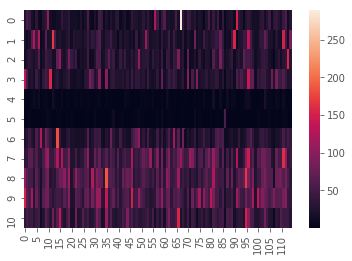

In [ ]:
doc2topic = data[0].toarray()[0:len(dic_class)]
sns.heatmap(np.einsum('ji,jk->ik',party_mat,doc2topic))

In [ ]:
temp = []
for vec in party_mat.T:
    temp.append(doc2topic.T.dot(vec))

In [ ]:
np.einsum('ji,jk->ik',year_mat,doc2topic).T

(115, 6)

In [ ]:
fracs = doc2topic.sum(axis=0)
(np.einsum('ji,jk->ik',year_mat,doc2topic).T/fracs.reshape(-1,1))[0].sum()

1.0000000000000426

In [ ]:
def get_fractions_t(data):
    doc2topic = data[0].toarray()[0:len(dic_class)]
    diffs = []
    fracs = doc2topic.sum(axis=0)
    sizes = pd.DataFrame(np.einsum('ji,jk->ik',year_mat,doc2topic).T/fracs.reshape(-1,1),columns=['topic_size_t%d'%tnum for tnum in range(len(year_dummy.columns))])
    for t_num,vec in enumerate(year_mat.T):

        dif_df = get_differential_fractions_t(doc2topic[0:len(dic_class)].T*vec,t_num)
        diffs.append(dif_df)
    temp = pd.concat(diffs,axis=1)
    temp = temp.merge(sizes,left_index=True,right_index=True)
    
    return temp
def get_fractions_p(data):    
    doc2topic = data[0].toarray()[0:len(dic_class)]
    diffs = []
    fracs = doc2topic.sum(axis=0)

    sizes = pd.DataFrame(np.einsum('ji,jk->ik',party_mat,doc2topic).T/fracs.reshape(-1,1),columns=['topic_size_p%d'%pnum for pnum in range(len(party_dummy.columns))])
    
    for p_num,vec in enumerate(party_mat.T):
        dif_df = get_differential_fractions(doc2topic[0:len(dic_class)].T*vec,p_num)
        diffs.append(dif_df)
    temp = pd.concat(diffs,axis=1)
    temp = temp.merge(sizes,left_index=True,right_index=True)
    
    return temp
get_fractions_p(data).max(axis=0)#head()

diffential_fraction_p0_0      0.324686
diffential_fraction_p0_1      0.858085
diffential_fraction_p0_2      0.782858
diffential_fraction_p0_3      0.776397
diffential_fraction_p0_4      0.681569
diffential_fraction_p0_5      0.866490
diffential_fraction_p0_6      0.721074
diffential_fraction_p0_7      0.479763
diffential_fraction_p0_8      0.670591
diffential_fraction_p0_9      0.381863
diffential_fraction_p0_10     0.637845
diffential_fraction_p0_11     0.491970
diffential_fraction_p0_12     0.628545
diffential_fraction_p0_13     0.107127
diffential_fraction_p0_14     0.216999
diffential_fraction_p1_0      0.340934
diffential_fraction_p1_1      0.142969
diffential_fraction_p1_2      0.679753
diffential_fraction_p1_3      0.565645
diffential_fraction_p1_4      0.850668
diffential_fraction_p1_5      0.868964
diffential_fraction_p1_6      0.789935
diffential_fraction_p1_7      0.426874
diffential_fraction_p1_8      0.400317
diffential_fraction_p1_9      0.169744
diffential_fraction_p1_10

In [ ]:
def get_differential(data):
    p_diff = get_fractions_p(data)
    t_diff = get_fractions_t(data)
    return pd.concat([p_diff,t_diff],axis=1)
get_differential(data).head()

,diffential_fraction_p0_0,diffential_fraction_p0_1,diffential_fraction_p0_2,diffential_fraction_p0_3,diffential_fraction_p0_4,diffential_fraction_p0_5,diffential_fraction_p0_6,diffential_fraction_p0_7,diffential_fraction_p0_8,diffential_fraction_p0_9,...,diffential_fraction_t5_11,diffential_fraction_t5_12,diffential_fraction_t5_13,diffential_fraction_t5_14,topic_size_t0,topic_size_t1,topic_size_t2,topic_size_t3,topic_size_t4,topic_size_t5
0,0.012528,0.067105,0.027291,0.042926,0.681569,0.012370,0.042931,0.006470,0.009390,0.006466,...,0.015365,0.017737,0.007688,0.005433,0.112054,0.099631,0.239569,0.242304,0.212283,0.094158
1,0.038820,0.115233,0.036775,0.302535,0.031667,0.040693,0.077601,0.036796,0.012611,0.018058,...,0.069623,0.045299,0.063449,0.056656,0.080084,0.094931,0.148899,0.260163,0.292256,0.123666
2,0.040400,0.299332,0.099639,0.051384,0.021643,0.117849,0.051717,0.057417,0.021093,0.023046,...,0.123546,0.024669,0.107355,0.037263,0.073040,0.143263,0.163160,0.234353,0.244940,0.141243
3,0.074835,0.235460,0.115193,0.086743,0.028061,0.076390,0.084809,0.030141,0.026410,0.044173,...,0.056628,0.117172,0.070260,0.012565,0.077472,0.080071,0.168701,0.315521,0.259619,0.098617
4,0.013821,0.172342,0.065659,0.084253,0.007685,0.053136,0.058415,0.039175,0.217522,0.024681,...,0.161192,0.026309,0.147985,0.018615,0.104966,0.079498,0.145236,0.341243,0.246748,0.082310


In [ ]:
pol_df.columns

Index(['Unnamed: 0', 'id', 'page_id', 'page_name', 'author', 't', 'likes',
       'comments', 'shares', 'link', 'message', 'language', 'party', 'topic',
       'blok', 'month', 'topic_class', 'year'],
      dtype='object')

### Time series of Topic Proportions
This goes to show the high variance in topics believed to be in the same category.
- Also to Show that predictive validity makes no sense. 
The base analysis should allow one to plot each topic proportion over time (as a fraction or normalized to oneself so size is'nt the issue), thereby creating a variance of possible description of the temporal development. 

Predictive validity would be all the correlations between each topic, and the variance would probably be places that are ignored.



In [ ]:

def get_time_series(data):
    doc2topic = data[0].toarray()
    temp = np.zeros((len(time_mat.T),len(doc2topic[0])))
    
    for t_num,vec in enumerate(time_mat.T):
        sum_ = (doc2topic[0:len(dic_class)].T*vec).sum(axis=1)
        temp[t_num] = sum_
    temp2 = {}
    for num,vec in enumerate(temp.T):
        temp2[num] = vec
    df = pd.DataFrame([temp2]).T
    df.columns = ['time_series']
    counts = data[2].toarray().sum(axis=1)
    ## sums all word assignments
    df['word_topic_count'] = counts
    ## Sums all document fractions
    df['topic_frac_sum'] = doc2topic[0:len(dic_class)].sum(axis=0)
    return df
time_dummy = pd.get_dummies(pol_df.month)
time2idx = time_dummy.columns
time_mat = time_dummy.values


In [ ]:
get_time_series(data).head()

,time_series,word_topic_count,topic_frac_sum
0,"[0.14379647749510757, 0.0188771887886095, 1.10...",64381,1467.794692
1,"[0.0009393346379647747, 0.16241785864506886, 0...",27786,828.848255
2,"[0.29330724070450087, 0.5188771887886096, 0.12...",25522,727.018087
3,"[0.014637964774951068, 0.0188771887886095, 0.0...",30926,824.138198
4,"[0.0009393346379647747, 0.0188771887886095, 0....",28968,952.315097


In [ ]:
time_counts = time_mat.sum(axis=0)

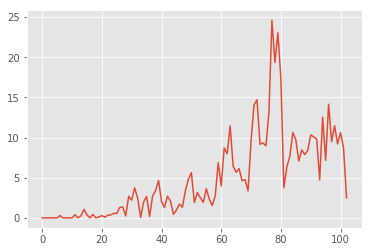

In [ ]:
plt.plot(_.time_series.values[0])

### Artefacts introduced by size(1): Fraction of non-differentiating words.
- Calculate the category-cooccurrence entropy of each word.  

In [ ]:

word2cat = np.einsum('dw,dk->wk',real_bows,dic_class_mat.T)

In [ ]:
word2cat = word2cat[0:30000] # only the danish words

In [ ]:
cat2word_frac = (word2cat/word2cat.sum(axis=0)).T

word2cat_frac = (word2cat.T/word2cat.sum(axis=1)).T

cat2entropy = scipy.stats.entropy(cat2word_frac.T)
word2entropy = scipy.stats.entropy(word2cat_frac.T)


In [ ]:
## Noise entropy


In [ ]:
import scipy.stats

In [ ]:
idf = np.log(len(real_bows)/((real_bows>0).sum(axis=0)))[0:30000]

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.


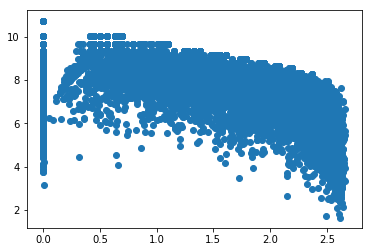

In [ ]:
plt.scatter(word2entropy,idf)

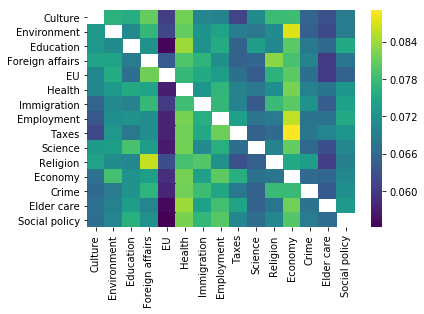

In [ ]:
import sklearn
import matplotlib.pyplot as plt
%matplotlib inline
columns = [get_dic_name(i) for i in range(15)]
cat2cat = 1-sklearn.metrics.pairwise_distances((cat2word_frac*idf),metric='cosine')
row_sum = cat2cat.sum(axis=1)-1
cat2cat[np.arange(15),np.arange(15)] = np.nan
cat2cat_row = (cat2cat.T/row_sum).T
sns.heatmap(pd.DataFrame(cat2cat_row,columns=columns,index=columns),cmap='viridis')
plt.savefig('output/descriptives/category_similarities_tfidf.png')

In [ ]:
import sklearn
#cat2cat = 1-sklearn.metrics.pairwise_distances((cat2word_frac/(word2entropy+1)),metric='cosine')
#row_sum = cat2cat.sum(axis=1)-1
#cat2cat[np.arange(15),np.arange(15)] = np.nan
#cat2cat_row = (cat2cat.T/row_sum).T
#sns.heatmap(pd.DataFrame(cat2cat_row,columns=columns,index=columns),cmap='viridis')
#plt.savefig('output/descriptives/category_similarities_catent.png')

In [ ]:
for idx in word2entropy.argsort()[-10:]:
    print(Index[idx],word2entropy[idx])


sgu 2.6487376864824648
stykke 2.6488621303946456
svar 2.64968793059359
blandt 2.6500741162892023
skrevet 2.650199305443784
måske 2.6554616589098443
skubbe 2.655838821624574
sagt 2.6565207937840327
bringer 2.659155089901414
troede 2.6631338979913637


In [ ]:
#cat2entropy.shape,word2entropy.shape
def get_entropy_weighted_average(vec): # calculates how much a topic is based on high entropy words.
    average_ent = np.average(word2entropy,weights = vec)
    return average_ent
def get_topic_entropy_score(data):
    topic2word = data[1].toarray()
    entro_score = []
    for vec in topic2word: 
        entro_score.append(get_entropy_weighted_average(vec[0:30000]))
    return pd.DataFrame(entro_score,columns=['entropy_score'])
    

In [ ]:
#get_topic_entropy_score(data)

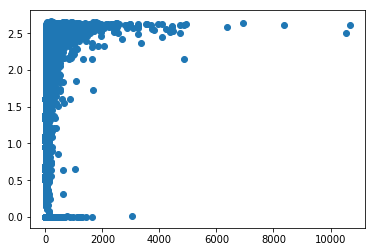

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
plt.scatter(real_bows.sum(axis=0)[0:30000],word2entropy)

## One could also specifically see if a topic takes the more co-occurring words from another topic.
Let each word be a matrix of co-occurrence ratios between categories, compiled from the word2cat matrix.
Use each of the most prevalent category of each topic as label, and aggregate how much co-occurrence has been stolen in the topic estimation. 

#### Cannot be done, needs doc2topicword assignment counts. 

### Do it on a smaller dataset.

In [ ]:
tensor = np.zeros((30000,15,15))

In [ ]:
cat_counts = dic_class_mat.sum(axis=1)
cat_counts

array([1717, 3601, 5256, 3696, 3403, 4019, 3351, 2211, 3422, 1604, 2848,
       5200, 2898, 1732, 1251], dtype=uint64)

In [ ]:
from tqdm import tqdm_notebook as tqdm
for num,co_occur in tqdm(enumerate(word2cat)):
    norm = (co_occur/cat_counts)+0.0001
    ratio_mat = (norm.reshape(-1,1)/norm)
    tensor[num,:,:] = ratio_mat

In [ ]:
doc2topic = data[0].toarray()

In [ ]:
#data
topic2word_count = data[2].toarray()[0:30000]

In [ ]:
## todo

doc2topic = data[0].toarray()
# will return a matrix where each row is a topic, and how much of it is measuring each class in the columns.
topic2class_frac = np.true_divide(doc2topic.T[:,0:len(dic_class)].dot(dic_class_mat.T).T,doc2topic.T[:,0:len(dic_class)].sum(axis=1)).T
doc2topic = doc2topic[:len(dic_class)]
## add top2bottom based on the highest prevalent dictionary category.
topic_cat = topic2class_frac.argsort()[:,-1]
topic2word = data[1]
## using the true value. And the believed value as the entry in the tensor of ratios.

for docnum,topic_prevalence in enumerate(doc2topic):
    true_cat = dic_class[docnum]
    
#for topicnum,counts in enumerate(topic2word_count):    
    true_cat = 
    believed_topic = topic_cat[topicnum]
    
    
    

## Tip of the Iceberg Analysis: Top versus Bottom
### Junk topic measure (1): Top Performance versus Bottom Performance.



In [ ]:
## done above


### Junk topic measure (2): Distances in the Co-Occurrence graph. 

Construct a condensed matrix using 
- Description of all probable paths.
    - Probability of visiting doc d_j, 

  
- or count visits from random walks.
    - Generate N K-step random walks from each node. 
    - How to penalize K-step visits. (Should it be penalized?)
        - divide by k_i. 
        


In [ ]:
# make co-occurence graph
import networkx as nx
w_cooccur = nx.Graph()
for doc_n,vec in enumerate(real_bows):
    indices= vec.indices
    for i in range(len(indices)-1):
        n = indices[i]
        for j in range(i+1,len(indices)):
            n2 = indices[j]
            
            try:
                w_cooccur[n][n2]['weight']+=1
            except:
                w_cooccur.add_edge(n,n2,weight=1)


In [ ]:

#construct_dense_matrix(w_cooccur,ksteps=5)
for n in w_cooccur:
    n_docs = real_bows[:,n].sum()
    
    sum_ = sum([w_cooccur[n][n2]['weight'] for n2 in w_cooccur[n]])
    for n2 in w_cooccur[n]:
        w_cooccur[n][n2]['weight']/=sum_

In [ ]:
import time
t = time.time()
try:
    mat = construct_dense_matrix(w_cooccur,ksteps=3)
except:
    print(((time.time()-t)*31039)/(3600*24))

25253
25253

31039
31039
34.89661201143982


In [ ]:
def get_visit_prob(p,d,weight=True):
    n = len(d)
    if weight:
        c = Counter({i:((w['weight'])*p) for i,w in d.items()})
    else:
        c = Counter({i:(1/n)*p for i in d})
 #   print(c,'local')
    return c
import networkx as nx
from tqdm import tqdm_notebook as tqdm
def get_visit_distribution(g,n,ksteps=5,weight=True):
    visits = Counter()
    neighbors = g[n]
    print(len(neighbors))
   # print(list(neighbors.items())[0])
    if weight: 
        seeds = {i:w['weight'] for i,w in neighbors.items()}
        
    else:
        seeds = {i:1/len(neighbors) for i in neighbors}
    visits.update(Counter(seeds))
    for k in range(ksteps):
        print(len(seeds))
     #   print('K:',k,seeds)
        temp_visits = Counter()
        for n1,p in seeds.items():
            
      #      print('P: ',p)
            neighbors = g[n1]
            ci = get_visit_prob(p,neighbors,weight=weight)
            temp_visits.update(ci)
       #     print('CI',len(temp_visits),ci)
        visits.update(temp_visits)
        seeds = temp_visits
    print(1+'2')
    return visits
def construct_dense_matrix(g,ksteps=5,weight=True):
    nodes = sorted(g.nodes())
    sparse_dicts = []
    for n in tqdm(nodes):
        sparse_dicts.append(get_visit_distribution(g,n,ksteps=ksteps,weight=weight))
      #  print(1+'2')
    mat = np.zeros((len(g),len(g)))
    for num,sparse in enumerate(sparse_dicts):
        n = nodes[num]
        for n1,count in sparse.items():
            mat[n,n1] = count
    return mat
import seaborn as sns
g = nx.Graph()
g.add_edge(0,1)
g.add_edge(5,0)
g.add_edge(1,2)
g.add_edge(2,3)
g.add_edge(2,4)
g.add_edge(2,5)
g.add_edge(5,6)
g.add_edge(4,6)
g = nx.erdos_renyi_graph(50,p=0.2)

#for i in range(4,30,2):
mat = construct_dense_matrix(g,ksteps=5,weight=False)
plt.figure()
sns.heatmap(mat)
#print(5,mat.sum(axis=1))
g = nx.karate_club_graph()

#for i in range(4,30,2):
mat = construct_dense_matrix(g,ksteps=5,weight=False)
plt.figure()
sns.heatmap(mat)


## Simulating Research Conclusions

In [ ]:
def rolling_operation(group,column='likes'):
    rollingwindow = group.sort_values(by='t',axis=0)[column].rolling(window=10, center=True)
    group['moving_average_%s'%column] = rollingwindow.mean()
    group['moving_std_%s'%column] = rollingwindow.std()
    # create the normalized
    group['rolling_normalized_%s'%column] = (group[column] - group['moving_average_%s'%column])/ group['moving_std_%s'%column]
    return group
var_df = pol_df.groupby('page_id').apply(rolling_operation)[['id','rolling_normalized_likes','party','topic']]

In [ ]:
norm_response = var_df.rolling_normalized_likes.values

In [ ]:
from scipy.optimize import curve_fit
import sklearn
def linear_func(x, a, b):
    return a*x + b
def fit_function(x,y,func=linear_func,plot=False):
    popt, pcov = curve_fit(func, x, y)
    fit_y = func(np.linspace(min(x),max(x),50),*popt)
    if plot:        
        return popt,sklearn.metrics.r2_score(y,func(np.array(x),*popt)),(np.linspace(min(x),max(x),50),fit_y)
    else:
        return popt,sklearn.metrics.r2_score(y,func(np.array(x),*popt))
def get_correlation_nposts_response(group):
    average_likes = group.groupby('topic')['rolling_normalized_likes'].mean()
    size_topic = group.groupby('topic').size()
    size_topic = size_topic/sum(size_topic) # normalize by size to make coefficent comparable.
    parameters,rsquared = fit_function(size_topic,average_likes)
    coefficient = parameters[0]
    return coefficient,rsquared#{'beta':coefficient,'r2':rsquared}
#doc2topic.shape
def get_correlation_nposts_response2(group):
    average_likes = group.groupby('topic')['rolling_normalized_likes'].mean()
    size_topic = group.groupby('topic').size()
    size_topic = size_topic/sum(size_topic) # normalize by size to make coefficent comparable.
    return np.corrcoef(size_topic,average_likes)[0][1]

In [ ]:
var_df.groupby('party').apply(get_correlation_nposts_response)

party
Alternativet                   (-0.044079597952146, 0.00035564131181031744)
Dansk Folkeparti                   (2.2102146660258226, 0.6089435013218181)
Det Konservative Folkeparti     (-0.3392825837615343, 0.013020285723125857)
Enhedslisten                     (-1.3009224513193587, 0.15842077433817137)
Fremskridtspartiet                 (3.774412950868433, 0.46579439424354996)
Kristendemokraterne                (1.4416586786255143, 0.1348408197232589)
Liberal Alliance                (0.30132480737604694, 0.015513438717158268)
Radikale Venstre                (0.1829224107734867, 0.0021854843000445046)
Socialdemokratiet                (-1.5766366378323124, 0.12492915168366137)
Socialistisk Folkeparti        (0.14818862176641168, 0.0027363620700942004)
Venstre                           (-0.9813131582355903, 0.1322540393819427)
dtype: object

In [ ]:
p2pandering = var_df.groupby('party').apply(get_correlation_nposts_response2).reset_index()
p2pandering.columns = ['party','correlation']
#p2pandering

In [ ]:
#d2t.shape

In [ ]:
party_mat.shape

(46209, 11)

In [ ]:
def get_opportunism_fit(data):
    doc2topic = data[0].toarray()
    d2t = doc2topic[0:len(dic_class)]
    corr_coef = []
    coef = []
    r2s = []
    dat = []
    p2t2response = []
    for p_num,boolean in enumerate(party_mat.T):
        boolean = boolean>0
        x = []
        y = []
        for vec in d2t.T:
            temp = vec[boolean]
            score = norm_response[boolean]
            y.append(np.nansum(temp*score)/temp.sum()) # average Response
            
            #y.append(norm_response[boolean>0]))
            #x.append(temp.sum())
            x.append(temp.sum())

        corr_coef.append(np.corrcoef(x,y)[0][1])
        sum_ = sum(x)
        x = np.array(x)/sum_
        ab,r2 = fit_function(x,y,plot=False)
        
        #ab,r2,vals = fit_function(x,y,plot=True)
        #plt.figure()
        #plt.title(party2idx[p_num])
        #plt.scatter(x,y)
        #x,y = zip(*vals)
        #x,y = vals
        #plt.plot(x,y)
        #print(p_num,party2idx[p_num],ab[0],r2)
        r2s.append(r2)
        coef.append(ab)
        p2t2response.append(y)
    
    cols = ['response_p%d'%num for num,_ in enumerate(party_dummy.columns)]
    t2response = pd.DataFrame(np.array(p2t2response).T,columns = cols )
    df = pd.DataFrame({'correlation':corr_coef,'r2':r2s,'parameters':coef},index=['p%d'%num for num,_ in enumerate(party_dummy.columns)])
    v = df.unstack().to_frame().sort_index(level=1).T
    v.columns = v.columns.map('_'.join)
    return v,t2response
    
get_opportunism_fit(data)[1]

,response_p0,response_p1,response_p2,response_p3,response_p4,response_p5,response_p6,response_p7,response_p8,response_p9,response_p10
0,-0.186705,-0.045571,-0.075785,-0.054807,0.001944,-0.390028,-0.089200,-0.027691,-0.155100,-0.158210,-0.154213
1,0.082525,0.063413,0.136171,-0.011485,0.028485,0.096288,0.133493,0.007729,0.040184,-0.094767,0.129392
2,-0.099861,-0.075740,-0.016153,-0.201695,0.126767,-0.200524,-0.013269,-0.084577,-0.053855,-0.003069,-0.010320
3,-0.007964,0.033190,0.150307,0.200606,0.334824,0.207663,-0.031511,0.188084,0.100876,0.118393,0.157772
4,0.090467,-0.080157,-0.096697,-0.091834,-0.352944,-0.020074,-0.090453,-0.003546,-0.014545,-0.019431,-0.087753
5,0.132164,-0.057895,-0.046434,0.018830,0.064723,-0.161712,-0.043696,0.044419,-0.031161,-0.053582,0.044799
6,-0.006377,0.212678,0.307122,0.211609,0.590465,0.188689,0.122923,0.232970,0.224410,0.158673,0.296174
7,-0.088069,-0.189695,-0.070006,-0.185823,-0.767013,-0.218096,-0.011807,-0.075863,-0.163918,-0.146846,-0.098290
8,-0.003857,-0.154002,-0.119877,-0.175760,-0.322448,0.002321,-0.074546,-0.036460,-0.012154,-0.084777,-0.080940
9,-0.055989,-0.229868,-0.076275,-0.312655,-0.130173,-0.306275,-0.093550,-0.203334,-0.187668,-0.193886,-0.165337


## Believed Topic Proportions: Comparing the Dictionary based Proportions to different TM accounts.

- Count the proportion of the Believed labels. 

--- Belived Proportion of Topics accross Actors.


--- Believed proportion of Topics over time. 
    - Make a mean plot, with 0.95 intervals, and add all lines.


In [ ]:
800 /  len(range(15,150,5))

29.62962962962963

In [ ]:
#def get_believed_size(data,df_choice):
    ## Choice should be: All documents are in the same dictionary class.
    ### All 
#    dict2topic = {}
    
    
#    for dict_class in enumerate(dictionaries):
#        
#    for choice_thres in [5,10]:
        
    
    

## Modelbased RoC / AUC.
Take all topics assigned to one Class and add the topic probabilities, normalize and then compare that to the dictionary predictions.

In [ ]:
sklearn.metrics.roc_auc_score()

### Run the Lexicon Comparisons

In [ ]:
def lexicon_matching(data):
    ## topic choices based on overlap
    df_choice = get_lexicon_top_overlap(data)
    ## topic performance based getting how much each topic measures each class
    df_fraction = get_fractions(data)
    ## differential bias accross parties and time periods
    df_differential = get_differential(data)
    ## add time series and base fractions and sums of each topic
    df_time = get_time_series(data)
    ## get human performacne
    human_performance_df = compare_to_human(data)
    # add entropy score (average of each words entropy in the topic weighted by prevalence) 
    df_entropy_score = get_topic_entropy_score(data)
    ## add topic entropy calculation
    df_entropy = get_entropy(data)
    ## opportunism_analysis: model based
    df_opportunity,df_response = get_opportunism_fit(data)
    
    df_topic = pd.concat([df_time,df_choice,human_performance_df,df_fraction,df_differential,df_entropy,df_entropy_score,df_response],axis=1)
    return df_topic,df_opportunity

In [ ]:
df_topic,df_opportunity = lexicon_matching(data)

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in double_scalars
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
df_topic.topwords.values[0]


array([  1, 129,  12,   2,  11,   8,  47,  17, 654, 138])

In [ ]:
df_topic.shape

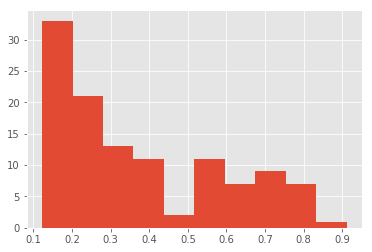

In [ ]:
df_topic[['human_frac_%d'%i for i in range(15)]].max(axis=1).hist()

In [ ]:
#df_topic.head()

,time_series,word_topic_count,topic_frac_sum,semantic_coherence_5,semantic_coherence_10,semantic_coherence_20,frex_overlap_10_0,frex_overlap_10_1,frex_overlap_10_10,frex_overlap_10_11,...,response_p1,response_p2,response_p3,response_p4,response_p5,response_p6,response_p7,response_p8,response_p9,response_p10
0,"[0.00036756572789925984, 0.23815595681694765, ...",20068,543.834921,-2.657753,-2.771918,-2.974028,0.0,0.0,0.0,0.0,...,-0.091313,-0.016344,-0.064060,0.064330,-0.237808,-0.119687,0.005835,-0.072342,-0.012426,-0.035696
1,"[0.00036756572789925984, 0.007386726047716761,...",17656,596.819867,-2.824166,-2.901642,-3.068324,0.0,0.0,0.0,0.0,...,-0.162686,0.046951,0.065613,-0.239092,0.276876,0.033677,-0.117607,0.015358,0.020442,-0.024144
2,"[0.00036756572789925984, 0.007386726047716761,...",14428,420.626118,-2.333023,-2.679392,-2.950030,0.0,0.0,0.0,0.0,...,-0.161298,-0.103776,0.100248,0.347849,-0.051806,-0.106961,0.064012,0.015265,0.099897,0.038338
3,"[0.00036756572789925984, 0.45738672604771696, ...",19789,540.199392,-2.232518,-2.665658,-2.962491,0.0,0.0,1.0,0.0,...,0.007783,0.311923,0.286122,0.443423,0.104756,0.093791,0.450195,0.234643,0.174754,0.293234
4,"[0.08608185144218497, 0.21326907898889313, 0.0...",16312,508.311266,-2.279529,-2.411873,-2.857643,0.0,0.0,0.0,0.0,...,0.430407,0.342270,0.117424,0.143194,0.046953,-0.121350,0.130457,0.044267,0.181156,0.007044


In [ ]:
def run_analysis2(func):
    "Runs a function on the raw data. Expects a function that returns a list where each row is a "
    # Load models    
    dfs = [] # dataframe container
    dfs_model = [] # dataframe container for dfs aggregated on model
    for model in tqdm(model_runs):
        model_n = int(model.split('_')[-1])
        data = load_data(model)
        temp_df,temp_model = func(data)
        temp_df['topic_num'] = np.arange(len(temp_df))
        temp_df['model_path'] = model
        temp_df['model_id'] = model_n
        temp_df['n_topics'] = len(temp_df)
        temp_model['model_id'] = model_n
        temp_model['model_path'] = model
        temp_model['n_topics'] = len(temp_df)
        dfs_model.append(temp_model)
        dfs.append(temp_df)
    df = pd.concat(dfs)
    df2 = pd.concat(dfs_model)
    return df,df2

In [ ]:
lexicon_df,model_df = run_analysis2(lexicon_matching)

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in double_scalars
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in double_scalars
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:87: Runt

In [ ]:
## Filter duplicate model ids
#model_errors = lexicon_df.groupby('model_id').apply(lambda x: len(x)==x.n_topics.values[0])
#keep_models = set(model_errors.index[model_errors])
#len(keep_models)/len(model_errors)
#lexicon_df = lexicon_df[lexicon_df.model_id.isin(keep_models)]
#model_df = model_df[model_df.model_id.isin(keep_models)]
#df = df[df.modelid.isin(keep_models)]

In [ ]:

import networkx as nx
#lex2idx
topwords = Counter()
g = nx.Graph()
for top in lexicon_df.topwords_frex.values:
    #top_in = [i for i in top if i in idx2lex] 
    topwords.update(Counter(top))
    for i in range(len(top)-1):
        n = top[i]
        for j in range(i+1,len(top)):
            n2 = top[j]
            try:
                g[n][n2]['weight']+=1
            except:
                g.add_edge(n,n2,weight=1)
        
print(len(g.edges()),len(g))
lex2token_G = nx.Graph()
lex2lex = nx.Graph()

lex_overlap = set(idx2lex)&set(g)
for n in lex_overlap:
    lex = idx2lex[n]
    for n2,d in g[n].items():
        w = d['weight']
        if n2 in idx2lex:
            lex2 = idx2lex[n2]
            try:
                lex2lex[lex][lex2]['weight']+=w
            except:
                lex2lex.add_edge(lex,lex2,weight=w)
        try:
            lex2token_G[lex][n2]['weight']+=w
        except:
            lex2token_G.add_edge(lex,n2,weight=w)
            
nodes = lex2lex.nodes()
lex_mat = nx.to_numpy_array(lex2lex,nodelist=nodes)
columns = [class2english[i] for i in nodes]
## plt.figure(figsize=(12,8))
sns.heatmap(np.sqrt(pd.DataFrame(lex_mat,columns=columns,index=columns)),cbar_kws={'label':'sqrt cooccurence'})

token_properties = []
for idx in lex2token_G:
    if idx in lex2lex:
        continue
    d = {}
    n = topwords[idx]
    d['top_occurence'] = n
    lex_matches = [(lex,lex2token_G[idx][lex]['weight']) for lex in lex2token_G[idx]]
    n_matches = sum([j for i,j in lex_matches])
    d['n_matches'] = n_matches
    best_match,w = max(lex_matches,key=lambda x: x[1])
    d['best_match_dk'] = best_match
    d['best_match'] = class2english[best_match]
    d['best_frac'] = w/n_matches
    d['all_frac'] = w/n
    
    d['entropy'] = scipy.stats.entropy([j for i,j in lex_matches])
    d['w'] = Index[idx]
    d['idx'] = idx
    token_properties.append(d)
suspect_df2 = pd.DataFrame(token_properties)

1219619 7006


In [ ]:
pickle.dump(topwords,open('Topword_Occurence_frex.pkl','wb'))
pickle.dump(idx2lex,open('idx2lex_new.pkl','wb'))

In [ ]:
len(suspect_df2[~suspect_df2.idx.isin(set(done_df.idx)|set(idx2lex))])

3917

In [ ]:
suspect_df2[~suspect_df2.idx.isin(set(idx2lex))].to_csv('lexicon_extension_suspects_frex.csv')

In [ ]:
lexicon_df.to_csv('lexicon_dateframe.csv',index=False)
model_df.to_csv('model_dataframe.csv',index=False)

In [ ]:
import pandas as pd
lexicon_df = pd.read_csv('lexicon_dateframe.csv')
model_df = pd.read_csv('model_dataframe.csv')

In [ ]:
list(lexicon_df.columns)

['time_series',
 'word_topic_count',
 'topic_frac_sum',
 'semantic_coherence_5',
 'semantic_coherence_10',
 'semantic_coherence_20',
 'frex_overlap_10_0',
 'frex_overlap_10_1',
 'frex_overlap_10_10',
 'frex_overlap_10_11',
 'frex_overlap_10_12',
 'frex_overlap_10_13',
 'frex_overlap_10_14',
 'frex_overlap_10_2',
 'frex_overlap_10_3',
 'frex_overlap_10_4',
 'frex_overlap_10_5',
 'frex_overlap_10_6',
 'frex_overlap_10_7',
 'frex_overlap_10_8',
 'frex_overlap_10_9',
 'frex_overlap_20_0',
 'frex_overlap_20_1',
 'frex_overlap_20_10',
 'frex_overlap_20_11',
 'frex_overlap_20_12',
 'frex_overlap_20_13',
 'frex_overlap_20_14',
 'frex_overlap_20_2',
 'frex_overlap_20_3',
 'frex_overlap_20_4',
 'frex_overlap_20_5',
 'frex_overlap_20_6',
 'frex_overlap_20_7',
 'frex_overlap_20_8',
 'frex_overlap_20_9',
 'frex_overlap_50_0',
 'frex_overlap_50_1',
 'frex_overlap_50_10',
 'frex_overlap_50_11',
 'frex_overlap_50_12',
 'frex_overlap_50_13',
 'frex_overlap_50_14',
 'frex_overlap_50_2',
 'frex_overlap_5

## Lexicon Analysis
Order of business:
- Define Labeling and Acceptance Step. 
    - Use the lexicon_overlap_ or the lexicon_extent_overlap_
    - and the lexicon_doc_overlap_
    

- Describe Performance Analysis answering the question how much of the believed is it actually measuring.
    - Match the believed label, to the performance column, 
        - *extra*: and relate it to the confusion table, it should weigh errors based on the confusion table.
    - Make histograms showing the distribution of performance accross different dictionary classes.
    - *appendix* : show how average performance is related to real performance (the difficulty of measuring a topic, is unique to the concept).
    
 
- Describe differential performance analysis


In [ ]:
# so when doing a topic model, one knows that there is not only K topics in the data,
# But one has only located and labeled these K meaningful topics (using the top words).
# Where is all the rest going? Is that suppose to be random noise spread accross all topics, 
# and that the model somehow respects that everything but the top is random noise.
# or better in some meaningful way the same label but just not as much. As demonstrated in our example and in 2014,
# it can be completely separate things being lumped together.

In [ ]:
base_columns = {'first_overlap_':'''Used for analyzing when intrusion would be detected when inspecting the top. 
Describes when a word from a specific dictionary arise in the sorted Topic Probabilities''',
                'lexicon_overlap_':'''Used when labeling the Topic. 
                It expresses the overlap between the top (5,10,20,50,100,1000) and a dictionary class.'''
                ,'lexicon_extent_overlap_':'''Used when labelling the Topic.
                The same as the "lexicon_overlap_" but matched to extended dictionaries.
                '''
                ,'lexicon_randomoverlap_':'''Used for showing the Problems with sampling from the top.
                Is the same as the "lexicon_ovelap_" but with a weighed sample instead of a top sample.
                The analysis should show that a weighed sample will notice the intrusion.
                ''',
                'lexicon_correlation_':'''Experimental - Expresses the Correlation between Topic Probabilities.'''
                ,'lexicon_doc_overlap_':'''Used when labelling the Topic. 
                It Express the overlap between top (5,10,20,50,100,1000) documents and dictionary classifications.''',
                'lexicon_doc_randomoverlap_':'''Used for showing Problems with sampling from the top.
                Is the same as "lexicon_doc_overlap_" but with a weighed sample instead of a top sample.''',
                'lexicon_doc_fraction_':'''Used for analyzing the Performance. 
                Expresses how much of the whole topic is measuring a dictionary class.''',
                'lexicon_doc_correlation_':'''Experimental. 
                Express the Correlation coefficient between a topic doc probabilities and a dictionary class.''',
                'diffential_fraction_p':'''Used for analyzing the differential performance. 
                Same as "lexicon_doc_fraction_" but broken down on certain parties. 
                Example: "differential_fraction_p\%d_\%d"\%(partynum,topicnum)''',
                'diffential_fraction_t':'''Used for analyzing the differential performance.
                Same as "differential_fraction_p" but for time periods (i.e. years)''',
                
        
               }

### Label Topics

181329 61447 464000
173196 114295 464000
152090 185261 464000
99778 309384 464000
46159 404266 464000


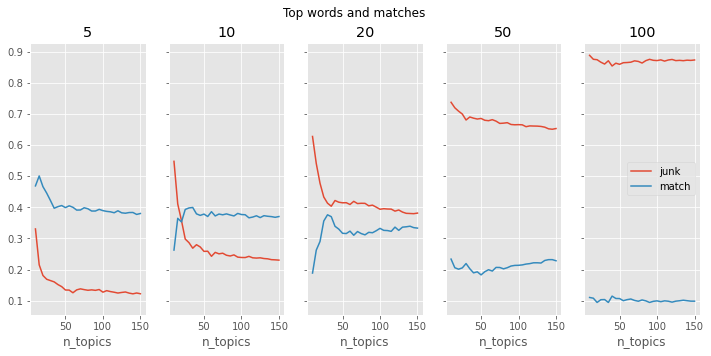

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
import seaborn as sns
# annotate junk

fig,axes = plt.subplots(1,ncols=5,sharey=True)
for num,topn in enumerate([5,10,20,50,100]):
    
    ax = axes[num]
    overlap_column = 'lexicon_overlap_%d_'%topn
    overlap_columns = [overlap_column+'%d'%num for num in range(15)]
    lexicon_df['junk_%d'%topn] = lexicon_df[overlap_columns].max(axis=1)!=lexicon_df[overlap_columns].sum(axis=1)
    lexicon_df['match_%d'%topn]  = (lexicon_df[overlap_columns].sum(axis=1)>0) & (lexicon_df[overlap_columns].max(axis=1)==lexicon_df[overlap_columns].sum(axis=1))
    lexicon_df['match_dic_%d'%topn]  = (lexicon_df[overlap_columns].sum(axis=1)>0)
    print(lexicon_df['match_%d'%topn].sum(),lexicon_df['junk_%d'%topn].sum(),len(lexicon_df))
    lexicon_df.groupby('n_topics')['junk_%d'%topn].mean().plot(ax=ax,label='junk')
    lexicon_df.groupby('n_topics')['match_%d'%topn].mean().plot(ax=ax,label='match')
    #lexicon_df.groupby('n_topics')['match_dic_%d'%topn].mean().plot(ax=ax,label='match+junk')
   # ax.legend()
    ax.set_title('%d'%topn)
fig.suptitle('Top words and matches')
fig.set_size_inches(12,5)
ax.legend()
plt.savefig('output/descriptives/prob_junk+matches.png')
topn = 10
overlap_column = 'lexicon_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)]
lexicon_df['junk'] = lexicon_df[overlap_columns].max(axis=1)!=lexicon_df[overlap_columns].sum(axis=1)
lexicon_df['match'] = (lexicon_df[overlap_columns].sum(axis=1)>0)& (lexicon_df[overlap_columns].max(axis=1)==lexicon_df[overlap_columns].sum(axis=1))

In [ ]:
np.logical_and((lexicon_df[overlap_columns].sum(axis=1)>0), lexicon_df[overlap_columns].max(axis=1)==lexicon_df[overlap_columns].sum(axis=1)).sum()

60541

205498 29768 464000
214808 57933 464000
219032 97566 464000
210525 159611 464000


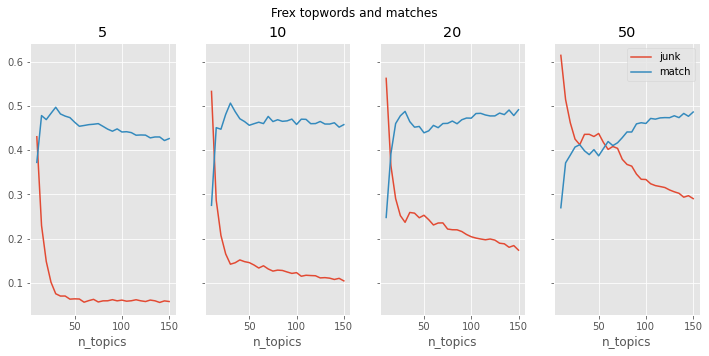

In [ ]:
# annotate junk
fig,axes = plt.subplots(1,ncols=4,sharey=True)
for num,topn in enumerate([5,10,20,50]):
    
    ax = axes[num]
    overlap_column = 'frex_overlap_%d_'%topn
    overlap_columns = [overlap_column+'%d'%num for num in range(15)]
    lexicon_df['junk_frex_%d'%topn] = lexicon_df[overlap_columns].max(axis=1)!=lexicon_df[overlap_columns].sum(axis=1)
    lexicon_df['match_frex_%d'%topn]  = (lexicon_df[overlap_columns].sum(axis=1)>0) & (lexicon_df[overlap_columns].max(axis=1)==lexicon_df[overlap_columns].sum(axis=1))
    print(lexicon_df['match_frex_%d'%topn].sum(),lexicon_df['junk_frex_%d'%topn].sum(),len(lexicon_df))
    lexicon_df.groupby('n_topics')['junk_frex_%d'%topn].mean().plot(ax=ax,label='junk')
    lexicon_df.groupby('n_topics')['match_frex_%d'%topn].mean().plot(ax=ax,label='match')
   # ax.legend()
    ax.set_title('%d'%topn)
fig.suptitle('Frex topwords and matches')
fig.set_size_inches(12,5)
ax.legend()
plt.savefig('output/descriptives/frex_junk+matches.png')
topn = 10
overlap_column = 'frex_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)]
lexicon_df['junk_frex'] = lexicon_df[overlap_columns].max(axis=1)!=lexicon_df[overlap_columns].sum(axis=1)
lexicon_df['match_frex'] = (lexicon_df[overlap_columns].sum(axis=1)>0) & (lexicon_df[overlap_columns].max(axis=1)==lexicon_df[overlap_columns].sum(axis=1))

## Compare Frex and Topwords in terms of precision

In [ ]:
topn = 10
overlap_column = 'frex_overlap_%d_'%topn
cols = [overlap_column+str(i) for i in range(0,15)]
ex = lexicon_df.loc[lexicon_df[cols].max(axis=1).sort_values().tail(60).sample(1).index]
import re
overlap_column = 'lexicon_overlap_%d_'%topn
cols2 = [overlap_column+'%d'%num for num in range(15)] 
overlap_column = 'frex_overlap_extent_%d_'%topn
col3 = [overlap_column+str(i) for i in range(0,15)]



In [ ]:
lexicon_df[(lexicon_df[cols].max(axis=1)>=5)&(lexicon_df[col3].max(axis=1)==10)].shape

(42447, 913)

In [ ]:
int(lexicon_df[cols].sum(axis=0).sum()),int(lexicon_df[cols2].sum(axis=0).sum())

(1285195, 1100227)

In [ ]:
print([Index[int(i)] for i in re.findall('[0-9]+',ex['topwords_frex'].values[0])])

['kriminelle', 'kriminalitet', 'fængsel', 'vold', 'straf', 'straffe', 'straffes', 'lavalder', 'straffen', 'hårdere']


In [ ]:
#list(lexicon_df.columns)
np.mean(lexicon_df[overlap_columns_non].sum(axis=1)>0),np.mean(lexicon_df[overlap_columns_extent].sum(axis=1)>0)

(0.6185344827586207, 0.8899640804597702)

In [ ]:
len(idx2lex_extent),len(idx2lex)

(2019, 1634)

In [ ]:
done_df.top_occurence.sum() / sum(topwords.values())

0.9201516986132371

In [ ]:
temp_suspect = suspect_df[suspect_df.best_match=='Immigration']
temp_suspect[temp_suspect.idx.isin(set(done_df[done_df.include==2].idx))].sample(5)

,all_frac,best_frac,best_match,best_match_dk,entropy,idx,n_matches,top_occurence,w
719,1.609013,0.979405,Immigration,indvandr_flygt_udlænding,0.143753,820,11265,6857,støjberg
720,1.415007,0.971681,Immigration,indvandr_flygt_udlænding,0.190298,981,7239,4971,inger
43,0.225447,0.273881,Immigration,indvandr_flygt_udlænding,2.012817,12,51705,62813,dansk
1775,2.300000,1.000000,Immigration,indvandr_flygt_udlænding,0.000000,1497,23,10,nød
1791,3.000000,0.818182,Immigration,indvandr_flygt_udlænding,0.474139,1984,22,6,stram


In [ ]:
done_df.columns

Index(['word', 'idx', 'include', 'top_occurence'], dtype='object')

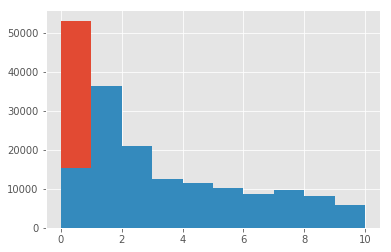

In [ ]:
lexicon_df[overlap_columns_non].max(axis=1).hist()
lexicon_df[overlap_columns_extent].max(axis=1).hist()


In [ ]:
overlap_column = 'lexicon_extent_overlap_%d_'%topn
overlap_columns_extent = [overlap_column+'%d'%num for num in range(15)]

overlap_column = 'lexicon_extent_overlap_%d_'%topn
overlap_column_non = 'lexicon_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)]
overlap_columns_non = [overlap_column_non+'%d'%num for num in range(15)]


lexicon_df[overlap_columns_non].sum(axis=1).mean(),lexicon_df[overlap_columns_extent].sum(axis=1).mean()


(2.371178879310345, 4.357344827586207)

In [ ]:
column2index = {col:num for num,col in enumerate(lexicon_df.columns)}
def make_topic2col(column,vals,index=True):
    if index:
        return {i:column2index[column%i] for i in range(15)}
    else:
        return {i:column%i for i in vals}

def get_label_variable(col,topic_col,df,n_vals,new_name):
    to_col = make_topic2col(col,range(n_vals),index=False)
    df = df[df[topic_col].apply(np.isfinite)]
    return df.lookup(df.index,df[topic_col].apply(lambda x: to_col[int(x)]).values)

In [ ]:
col = 'lexicon_doc_fraction_%d'

sample = lexicon_df.sample(100000).copy().reset_index()

temp = sample[sample.match_frex]
topic_col = 'frex_label'
frex_performance = get_label_variable(col,topic_col,temp,15,'weighted_precision_frex')
overlap_column = 'frex_overlap_extent_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)]
frex_match = temp[overlap_columns].max(axis=1)
frex_match = frex_match[temp[topic_col].apply(np.isfinite)]

temp = sample[sample.match]
topic_col = 'topword_label'
topword_performance = get_label_variable(col,topic_col,temp,15,'weighted_precision_topwords')
overlap_column = 'lexicon_extent_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)]
topword_match = temp[overlap_columns].max(axis=1)
topword_df = pd.DataFrame({'match':topword_match.values,'performance':topword_performance})
topword_df = topword_df[topword_df.match>0]
frex_df = pd.DataFrame({'match':frex_match.values,'performance':frex_performance})
frex_df['type'] = 'frex'
topword_df['type'] = 'topword'
both = pd.concat([frex_df,topword_df])
both['match'] = both.match/10

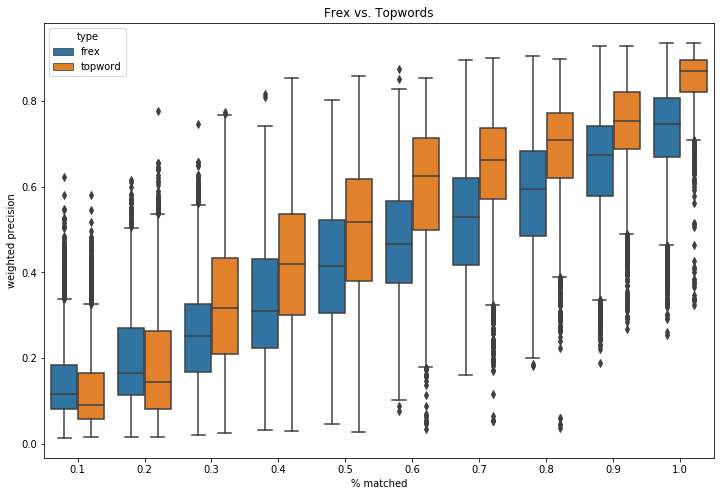

In [ ]:


ax = sns.boxplot(y='performance',x='match',data=both,hue='type')
#sns.violinplot(y='performance',x='match',data=both,hue='type',split=True)
ax.set_ylabel('weighted precision')
ax.set_xlabel('% matched')
ax.set_title('Frex vs. Topwords')
ax.figure.set_size_inches(12,8)
#ax.figure.savefig('output/bias/topword_vs_frex_performance.png')


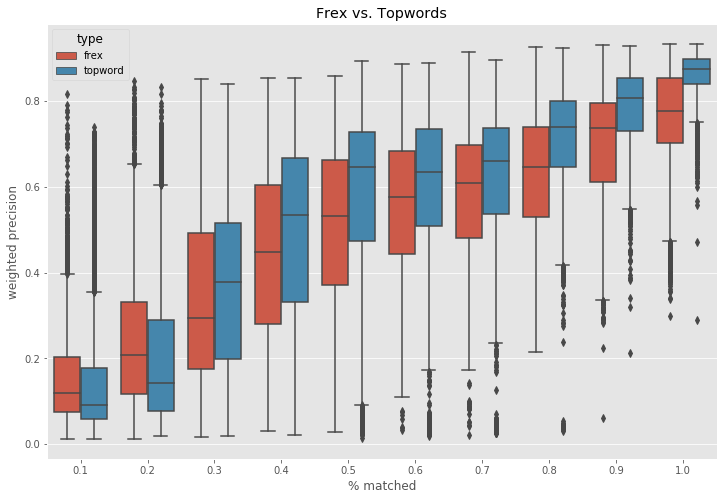

In [ ]:


ax = sns.boxplot(y='performance',x='match',data=both,hue='type')
#sns.violinplot(y='performance',x='match',data=both,hue='type',split=True)
ax.set_ylabel('weighted precision')
ax.set_xlabel('% matched')
ax.set_title('Frex vs. Topwords')
ax.figure.set_size_inches(12,8)
ax.figure.savefig('output/bias/topword_vs_frex_performance.png')


It is quite evident that frex bias the representation of the topic as a whole even more than topwords.

## Top2Bottom analysis
Here we investigate the performance as we go down the distribution. 
Three analysis are possible:
- Similar to the DiMaggio et al. 2013, or Roberts et al 2014, on the performance as we sort by topic weight, and look down. **column**: ***top2bottom***, expressing the believed label in terms of topwords. 
- We could look at ratios between the top 10 percent versus the 90 % bottom. 
    - As ordered by the documents topic weight and then comparing quantile 0.1 to 1-0.1.  **column**: ***top2bottom_ratio_quantile***
    - or in absolutte terms of how much it weighs, so the 0.1 quantile of the cumulative topic weight distribution versus the bottom 0.9. **column**: ***top2bottom_ratio ***

In [ ]:
#top2bottom_descriptions
lexicon_df.junk_frex.sum(),lexicon_df.junk.sum(),lexicon_df.match_frex.sum(),lexicon_df.match.sum()

(16563, 25559, 65679, 60541)

In [ ]:
#[col for col in list(lexicon_df.columns) if 'entropy' in col]
x = pol_df.topic_class.value_counts().sort_index().values
y = pd.DataFrame(lexicon_df.groupby(['topic_label','n_topics']).entropy_score.mean()).unstack().fillna(0).stack().reset_index()
#plt.scatter(x,y)

In [ ]:
#1/temp.n_topics
#pol_df.topic_class.value_counts().sort_index()

(1.5, 2.5)

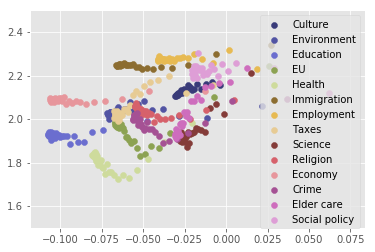

In [ ]:
for i in range(15):
    temp = y[y['topic_label']==i]
    perc = x[i]/46000 # denotes
    if get_dic_name(i) == 'Foreign affairs':
        continue
    plt.scatter((1/temp.n_topics)-perc,temp['entropy_score'],label=get_dic_name(i),color=cmap(i/15))
plt.legend()    
#plt.xlim(0,5)
plt.ylim(1.5,2.5)

In [ ]:
sample = lexicon_df
#sample = lexicon_df.sample(500000).copy().reset_index()
temp = sample[sample.match]
#temp.top2bottom.head()
#plt.plot()
columns = [round(i,1) for i in np.arange(0.1,1.1,0.1)]
vals = [np.array(l) for l in temp.top2bottom.values]
top2bottom_df = pd.DataFrame(vals,columns=columns)
overlap_column = 'lexicon_extent_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)]
topword_match = temp[overlap_columns].max(axis=1)

top2bottom_df['% match'] = topword_match.values/10

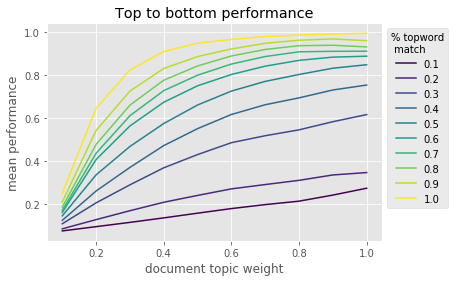

In [ ]:
ax = top2bottom_df.groupby('% match').mean().T.plot(cmap='viridis')
plt.ylabel('mean performance')
plt.xlabel('document topic weight')
plt.title('Top to bottom performance')
ax.legend(bbox_to_anchor=(1,1),title='% topword\n match')
plt.savefig('output/bias/top2bottom_performance.png',bbox_inches='tight')

In [ ]:
#size = len(temp)
#top2bottom_df = pd.DataFrame({'weighted_precison':np.array([np.array(l) for l in temp.top2bottom.values]).flatten(),
#                          'topic_weight':np.concatenate([[round(i,1)]*size for i in np.arange(0.1,1.1,0.1)])})
#overlap_column = 'lexicon_extent_overlap_%d_'%topn
#overlap_columns = [overlap_column+'%d'%num for num in range(15)]
#topword_match = temp[overlap_columns].max(axis=1)/10
#top2bottom_df['match'] = list(topword_match.values)*len(np.arange(0.1,1.1,0.1))

In [ ]:
! mkdir output/descriptives

In [ ]:
import numpy as np
topn = 10
overlap_column = 'lexicon_extent_overlap_%d_'%topn
overlap_column_non = 'lexicon_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)]
overlap_columns_non = [overlap_column_non+'%d'%num for num in range(15)]
overlap_sum = lexicon_df[overlap_columns].sum(axis=1)
overlap_nonextent_sum = lexicon_df[overlap_columns_non].sum(axis=1)
lexicon_df['topic_label'] = np.nan
class2topics = {}
class2match = {}
for dic in range(15):
    name = get_dic_name(dic)
 #   print()

    vals = lexicon_df[overlap_column_non+'%d'%dic] 
    vals_extent = lexicon_df[overlap_column+'%d'%dic] 
    
    
    match = vals>0
    n_found = sum(match)
    unique_match = match & (vals==overlap_nonextent_sum)
    match = vals_extent>0
    #n_found = sum(match)
    #unique_match = match & (vals_extent==overlap_sum)
    lexicon_df.loc[unique_match,'topic_label'] = dic
    ## add extended fraction to the topic labels.
    lexicon_df.loc[unique_match,'topic_label_frac'] = vals[unique_match]/topn
    lexicon_df.loc[unique_match,'topic_label_frac_extent'] = vals_extent[unique_match]/topn
  #  print(name,n_found,sum(unique_match),sum(unique_match)/n_found)
    #class2topics[dic] = lexicon_df[unique_match]
    class2match[dic] = match

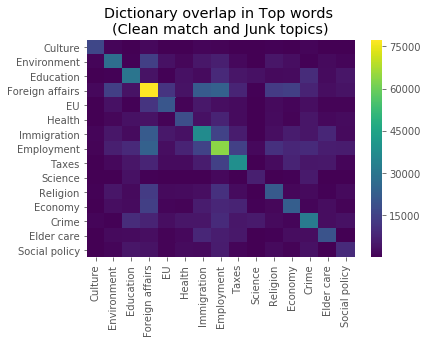

In [ ]:
## overlap
mat = np.zeros((15,15))
for i in range(15):
    mat[i,i] = sum(class2match[i])
    for j in range(i,15):
        mat[i,j] = sum((class2match[i] & class2match[j]))
        mat[j,i] = mat[i,j]
#mat = (mat/mat.sum(axis=1).T)
mat = pd.DataFrame(mat,columns=map(get_dic_name,range(15)),index=map(get_dic_name,range(15)))
#plt.figure(figsize=(12,8))
sns.heatmap(mat,cmap='viridis')
plt.title('Dictionary overlap in Top words \n(Clean match and Junk topics)')
plt.savefig('output/descriptives/dictionary_overlaps(junk_clean).png')
#plt.xticks(np.arange(15)+0.5,map(get_dic_name,range(15)),rotation=90)
#plt.yticks(np.arange(15)+0.5,map(get_dic_name,range(15)),rotation=0);

In [ ]:
def get_dic_name(num):
    return class2english[class2num[int(num)]]

def match2topdoc_frac(row,label_col = 'topic_label',column='lexicon_doc_overlap_',topn=5):
    label = row[label_col]
    if np.isnan(label):
        return np.nan
    
    return row[column+'%d_%d'%(topn,int(label))]
n = 5
lexicon_df['topic_label_doc'] = lexicon_df.apply(match2topdoc_frac,axis=1)
def match2topdoc_frac(row,label_col = 'frex_label',column='lexicon_doc_overlap_',topn=5):
    label = row[label_col]
    if np.isnan(label):
        return np.nan
    return row[column+'%d_%d'%(topn,int(label))]

lexicon_df['topic_frexlabel_doc'] = lexicon_df.apply(match2topdoc_frac,axis=1)

In [ ]:
topn = 10
overlap_column = 'lexicon_extent_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)]
match_df = lexicon_df[lexicon_df[overlap_columns].sum(axis=1)>0]
print(len(match_df))
print(sum(match_df[overlap_columns].sum(axis=1)!=match_df[overlap_columns].max(axis=1)))

n_top_matches = sum(lexicon_df.topic_label.apply(np.isfinite))
print('%d topics matched only one of our dictionaries in the top %d'%(n_top_matches,topn))
#match_df = lexicon_df[lexicon_df.topic_label.apply(np.isfinite)] 
n_matches_doc = sum(match_df.topic_label_doc==1)
print('Of these %d also matched all top %d documents'%(n_matches_doc,n))

413087
256367
173196 topics matched only one of our dictionaries in the top 10
Of these 75073 also matched all top 5 documents


In [ ]:
lexicon_df.match.sum(), len(lexicon_df)

(101295, 232000)

In [ ]:
topn = 10
overlap_column = 'lexicon_extent_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)]
match_df = lexicon_df[lexicon_df[overlap_columns].sum(axis=1)>0]
print(len(match_df))
print(sum(match_df[overlap_columns].sum(axis=1)!=match_df[overlap_columns].max(axis=1)))

n_top_matches = sum(lexicon_df.topic_label.apply(np.isfinite))
print('%d topics matched only one of our dictionaries in the top %d'%(n_top_matches,topn))
#match_df = lexicon_df[lexicon_df.topic_label.apply(np.isfinite)] 
n_matches_doc = sum(match_df.topic_label_doc==1)
print('Of these %d also matched all top %d documents'%(n_matches_doc,n))

413087
256367
173196 topics matched only one of our dictionaries in the top 10
Of these 75073 also matched all top 5 documents


In [ ]:
topn = 10
#lexicon_df['match'] = lexicon_df.topic_label.apply(np.isfinite)

#lexicon_df['junk'] = (lexicon_df[overlap_columns].sum(axis=1)>0)&lexicon_df.topic_label.apply(np.isnan)
overlap_column = 'lexicon_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)] 

lexicon_df['no_match'] = lexicon_df[overlap_columns].sum(axis=1)==0
overlap_column = 'frex_overlap_%d_'%topn
overlap_columns2 = overlap_columns + [overlap_column+'%d'%num for num in range(15)] 

lexicon_df['no_match_both'] = lexicon_df[overlap_columns2].sum(axis=1)==0

In [ ]:
lexicon_df.junk.sum(),lexicon_df.match.sum(),lexicon_df.no_match.sum(),lexicon_df.no_match_both.sum()

(114295, 173196, 176509, 157623)

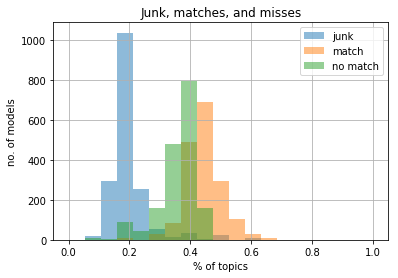

In [ ]:
lexicon_df.groupby('model_id').apply(lambda x: x.junk.sum()/len(x)).hist(bins=np.linspace(0,1,20),label='junk',alpha=0.5)
lexicon_df.groupby('model_id').apply(lambda x: x.match.sum()/len(x)).hist(bins=np.linspace(0,1,20),label='match',alpha=0.5)
lexicon_df.groupby('model_id').apply(lambda x: x.no_match.sum()/len(x)).hist(bins=np.linspace(0,1,20),label='no match',alpha=0.5)
plt.legend()
plt.title('Junk, matches, and misses')
plt.ylabel('no. of models')
plt.xlabel('% of topics')
plt.savefig('output/descriptives/junk_match_misses.png')

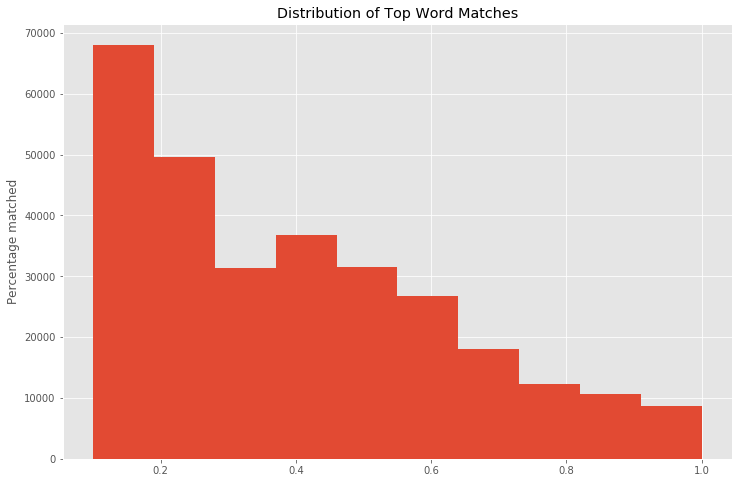

In [ ]:
plt.figure(figsize=(12,8))
match_df.topic_label_frac_extent.hist()
plt.title('Distribution of Top Word Matches')
plt.ylabel('Percentage matched')

plt.savefig('output/descriptives/matches_hist.png')

In [ ]:
#sample.topic_label_doc

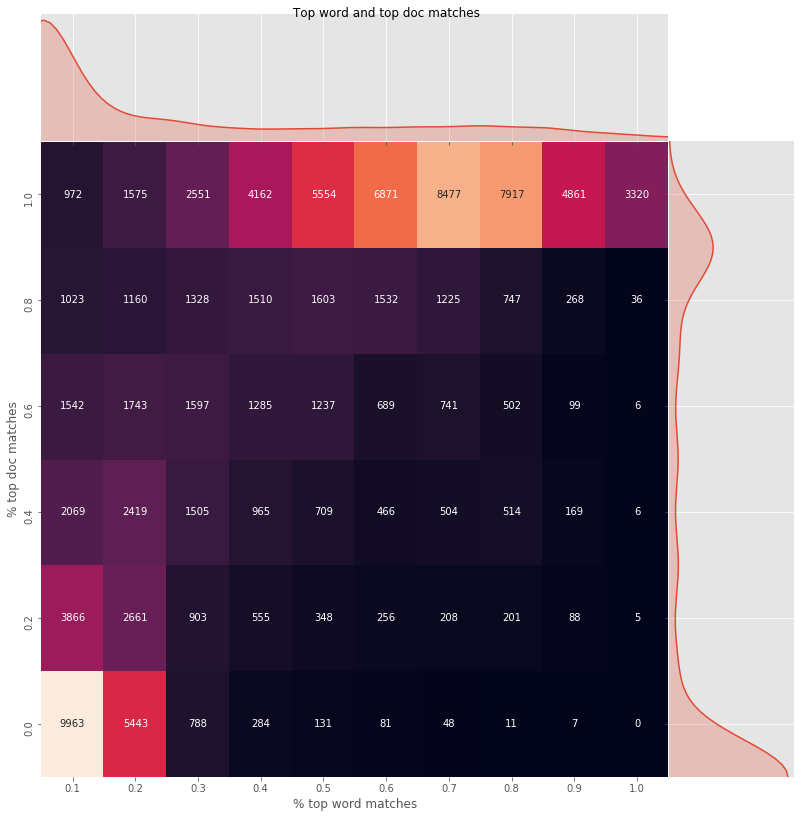

In [ ]:
sample = match_df.sample(10000).copy()
sample['topic_label_doc'] = pd.Categorical(sample['topic_label_doc'].fillna(0).apply(lambda x: int(x*5)))
sample['topic_label_frac_extent'] = pd.Categorical(sample['topic_label_frac_extent'].fillna(0).apply(lambda x: int(x*10)))
g = sns.jointplot('topic_label_frac_extent', 'topic_label_doc', data=sample,kind="kde", height=7, space=0)
sample = match_df.copy()
sample['dummy'] = 1
mat = sample.groupby(['topic_label_doc','topic_label_frac_extent']).dummy.sum().unstack(fill_value=0).stack().values.reshape(6,10)

#g.ax_joint.pcolor(mat,cmap='viridis')
sns.heatmap(mat,annot=True,ax=g.ax_joint,fmt='.0f',cbar=False)
g.ax_joint.set_ylim(0,6)
g.ax_joint.set_xlim(0,10)
g.ax_joint.set_xticks(np.arange(10)+0.5)
g.ax_joint.set_xticklabels(map(lambda x: round(x,1),np.arange(0.1,1.1,0.1)))

g.ax_joint.set_yticks(np.arange(6)+0.5)
g.ax_joint.set_yticklabels(map(lambda x: round(x,1),np.arange(0,1.2,0.2)));
g.fig.suptitle('Top word and top doc matches')
g.ax_joint.set_xlabel('% top word matches')
g.ax_joint.set_ylabel('% top doc matches')
g.fig.set_size_inches(12,12)
plt.savefig('output/descriptives/topdoc_topword_counts.png')


In [ ]:
#lexicon_df.accept.sum()/len(lexicon_df)

In [ ]:
## Choose threshold
doc_match_thres = 1.0
top_match_thres = 0.5

lexicon_df['accept'] = np.logical_and(np.logical_and(lexicon_df.match,lexicon_df.topic_label_doc>=doc_match_thres),lexicon_df.topic_label_frac_extent>=top_match_thres)

In [ ]:
column2index = {col:num for num,col in enumerate(lexicon_df.columns)}
def make_topic2col(column,vals,index=True):
    if index:
        return {i:column2index[column%i] for i in range(15)}
    else:
        return {i:column%i for i in vals}

def make_label_variable(col,df,topic_col,n_vals,new_name):
    to_col = make_topic2col(col,range(n_vals),index=False)
    df[new_name] = df.lookup(range(len(df)),df[topic_col].apply(lambda x: to_col[int(x)]).values)
    return df
lexicon_df = lexicon_df.reset_index(drop=True)
col = 'lexicon_doc_fraction_%d'
topic_col = 'topword_label'
lexicon_df = make_label_variable(col,lexicon_df,topic_col,15,'weighted_precision')
topic_col = 'best_label'
lexicon_df = make_label_variable(col,lexicon_df,topic_col,15,'weighted_precision_best')

### quick fix to converge to function
## fill nan values
lexicon_df['no_match_frex'] = ~lexicon_df['frex_label'].apply(np.isfinite)
lexicon_df['frex_label'] = lexicon_df['frex_label'].fillna(value=14)

topic_col = 'frex_label'
lexicon_df = make_label_variable(col,lexicon_df,topic_col,15,'weighted_precision_frex')


In [ ]:
lexicon_df.frex_label.apply(np.isfinite).sum(),lexicon_df.topword_label.apply(np.isfinite).sum()

(214808, 464000)

In [ ]:
col = 'human_frac_%d'
topic_col = 'topword_label'
lexicon_df = make_label_variable(col,lexicon_df,topic_col,15,'human_performance')
col = 'human_frac_%d'

# empty the nan values again
lexicon_df.loc[lexicon_df['no_match_frex'],'frex_label'] = 14
topic_col = 'frex_label'
lexicon_df = make_label_variable(col,lexicon_df,topic_col,15,'human_performance_frex')
lexicon_df.loc[lexicon_df['no_match_frex'],'frex_label'] = np.nan

In [ ]:
lexicon_df[lexicon_df.accept].groupby('topword_label').human_performance.max()

topword_label
0     0.863141
1     0.939558
2     0.946124
3     0.933984
4     0.853321
5     0.937321
6     0.873743
7     0.871871
8     0.927348
9     0.930877
10    0.878129
11    0.759744
12    0.878448
13    0.915872
14    0.738046
Name: human_performance, dtype: float64

In [ ]:
#sum(lexicon_df.topic_label.apply(np.isfinite)),sum(lexicon_df.accept)

In [ ]:
lexicon_df.match.sum()

60541

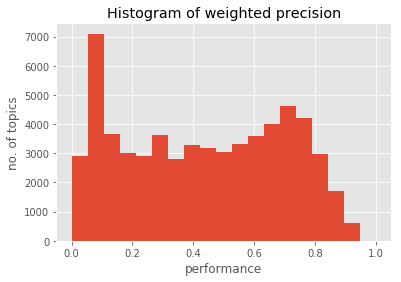

In [ ]:
#lexicon_df.weighted_precision.hist(alpha=0.5)
lexicon_df[lexicon_df.match].weighted_precision.hist(bins=np.linspace(0,1,20))
plt.title('Histogram of weighted precision')
plt.xlabel('performance')
plt.ylabel('no. of topics')
plt.savefig('output/bias/weighted_precision_hist.png')

In [ ]:
## Choose threshold
doc_match_thres = 1.0
top_match_thres = 0.5
topmatch_df = match_df[match_df.topic_label_frac_extent>=top_match_thres]
accepted_df = match_df[np.logical_and(match_df.topic_label_doc>=doc_match_thres,match_df.topic_label_frac_extent>=top_match_thres)]
print('%d topics matched at least %d out of %d top words'%(len(topmatch_df),int(top_match_thres*topn),topn))
print('%d topics matched all %d top documents and at least %d out of %d top words'%(len(accepted_df),n,int(top_match_thres*topn),topn))
accepted_df.shape

78335 topics matched at least 5 out of 10 top words
60142 topics matched all 5 top documents and at least 5 out of 10 top words


(60142, 945)

In [ ]:
lexicon_df.accept.sum(),len(lexicon_df),max(lexicon_df.model_id),len(set(lexicon_df.model_id))


(60142, 464000, 8175, 5800)

In [ ]:
pd.Series(lexicon_df.model_id.value_counts().values).value_counts().sort_values()

135    200
75     200
55     200
35     200
15     200
150    200
130    200
110    200
90     200
70     200
50     200
30     200
115    200
95     200
10     200
105    200
85     200
65     200
45     200
25     200
140    200
120    200
100    200
80     200
60     200
40     200
145    200
125    200
20     200
dtype: int64

### Coverage analysis
Summarization methods
    - Matched labels.
        all_matches = lexicon_df.groupby('model_id').apply(lambda x: sum(x[overlap_columns].sum(axis=0)>0))
    - Frex matched.
        frex_matches = lexicon_df.groupby('model_id').apply(lambda x: sum(x[overlap_columns_frex].sum(axis=0)>0))
    - Accepted labels.
        accepted_matches = lexicon_df[lexicon_df.accept].groupby('model_id').apply(lambda x: sum(x[overlap_columns].sum(axis=0)>0))
    - Latent match. Concentration above 0.x or some sort of ratio more than 3 times as prevalent in this topic? 
        Best label (matched)





 			- Are the correlations between discovery of topics.


In [ ]:
overlap_column = 'lexicon_overlap_%d_'%topn
overlap_columns = [overlap_column+'%d'%num for num in range(15)] 

lexicon_df['no_match'] = lexicon_df[overlap_columns].sum(axis=1)==0
overlap_column_frex = 'frex_overlap_%d_'%topn
overlap_columns_frex =[overlap_column_frex+'%d'%num for num in range(15)] 

all_matches = lexicon_df.groupby('model_id').apply(lambda x: sum(x[overlap_columns].sum(axis=0)>0))

frex_matches = lexicon_df.groupby('model_id').apply(lambda x: sum(x[overlap_columns_frex].sum(axis=0)>0))

accepted_matches = lexicon_df[lexicon_df.accept].groupby('model_id').apply(lambda x: sum(x[overlap_columns].sum(axis=0)>0))

best_matches = lexicon_df.groupby('model_id').apply(lambda x: x.best_label.nunique())


In [ ]:
col = 'lexicon_doc_fraction_%d'
doc_columns = [col%i for i in range(15)]
concentrated_matches = lexicon_df.groupby('model_id').apply(lambda x: x[doc_columns].max(axis=0))

In [ ]:
cat2counts = pol_df.topic_class.value_counts().sort_index().values
cat2fracs_dic = cat2counts/cat2counts.sum()

In [ ]:
concentrated_ratios = (concentrated_matches.values/cat2fracs_dic)
concentrated_ratios = pd.DataFrame(concentrated_ratios,columns=concentrated_matches.columns)
concentration_counts = (concentrated_ratios>3).sum(axis=1)

In [ ]:
#(concentrated_matches>0.2).sum(axis=1).hist(bins=range(1,16),label='concentration>0.2',alpha=0.4)
matches_df = {'quality':accepted_matches.values,'topword':all_matches.values,'frex':frex_matches.values
                           ,'latent':concentration_counts.values}
y = []
types = []
for name, vals in matches_df.items():
    c = Counter(list(vals))
    a = [c[i]/len(vals) for i in range(0,16)]
    y.append(a)
    types+=[name]*len(a)
matches_df = pd.DataFrame(y)
matches_df = pd.DataFrame(matches_df.stack())
matches_df['type'] = types
matches_df = matches_df.reset_index()
#matches_df.level_1 = (matches_df.level_1/15).apply(lambda x: round(x,2))
#(concentrated_ratios>3).sum(axis=1).hist(bins=range(1,16),label='ratio>3',alpha=0.4)
#all_matches
#plt.legend()

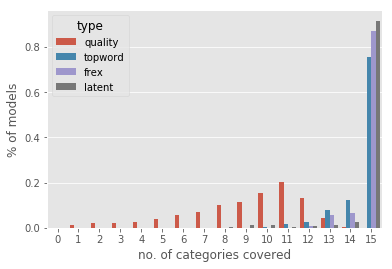

In [ ]:
sns.barplot(x='level_1',y=0,hue='type',data=matches_df)
plt.xlabel('no. of categories covered')
plt.ylabel('% of models')
plt.savefig('output/research_conclusions/coverage.png')

In [ ]:
matches_df[matches_df.level_1==11]

,level_0,level_1,0,type
11,0,11,0.202154,quality
27,1,11,0.017586,topword
43,2,11,0.000000,frex
59,3,11,0.005517,latent


In [ ]:
matches_df[matches_df.level_1==15]

,level_0,level_1,0,type
15,0,15,0.000359,quality
31,1,15,0.756552,topword
47,2,15,0.869310,frex
63,3,15,0.916552,latent


%91 percent of all models cover all 15 topics

In [ ]:
all_matches = lexicon_df.groupby(['n_topics','model_id']).apply(lambda x: sum(x[overlap_columns].sum(axis=0)>0))

#frex_matches = lexicon_df.groupby('model_id').apply(lambda x: sum(x[overlap_columns_frex].sum(axis=0)>0))

#accepted_matches = lexicon_df[lexicon_df.accept].groupby('model_id').apply(lambda x: sum(x[overlap_columns].sum(axis=0)>0))

best_matches = lexicon_df.groupby(['n_samples','model_id']).apply(lambda x: x.best_label.nunique())


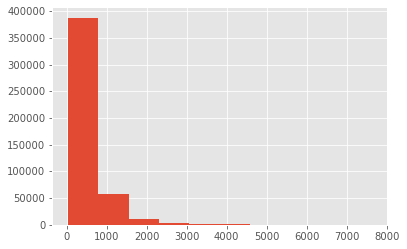

In [ ]:
lexicon_df.topic_frac_sum.hist()

In [ ]:
cm = plt.cm.viridis
m,ma = lexicon_df.n_topics.min(),lexicon_df.n_topics.max()

In [ ]:
lexicon_df.n_topics.nunique()

29

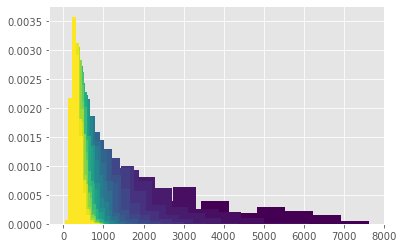

In [ ]:

for k,groupdf in lexicon_df.groupby('n_topics'):
    y = groupdf.topic_frac_sum
    norm = (y-y.mean())/y.std()
    plt.hist(y,color=cm((k-m)/(ma-m)),density=True)

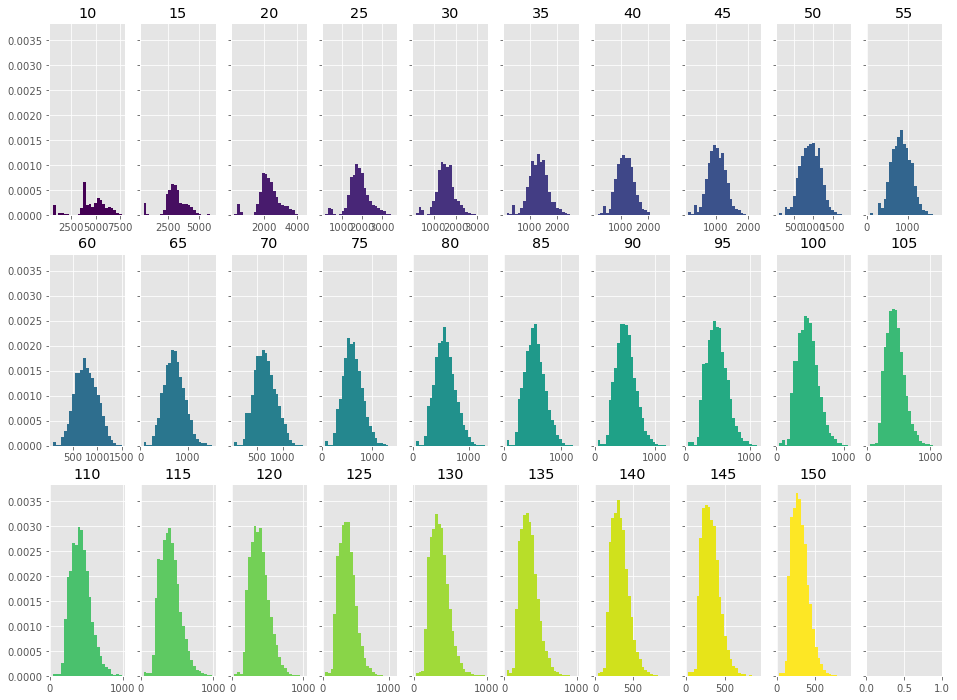

In [ ]:
r,c = 3,10
fig,axes = plt.subplots(r,c,sharex=False,sharey=True)
for num,k in enumerate(sorted(set(lexicon_df.n_topics))):
    groupdf = lexicon_df[lexicon_df.n_topics==k]
    
    y = groupdf.topic_frac_sum
    norm = (y-y.mean())/y.std()
    ax = axes[num//c,num%c]
    ax.hist(y,bins=25,color=cm((k-m)/(ma-m)),density=True)
    ax.set_title(k)
fig.set_size_inches(16,12)   

## Latent Best topic distributions

In [ ]:
best_dist = lexicon_df.groupby(['n_topics','model_id']).apply(lambda x: x[doc_columns].max(axis=0)).stack().reset_index()

In [ ]:
best_dist.columns = ['n_topics','model_id','topic','best_precision']
best_dist['topic'] = best_dist.topic.apply(lambda x: get_dic_name(x.split('_')[-1]))


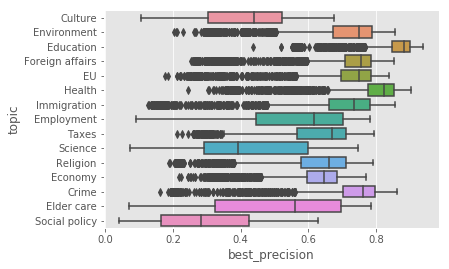

In [ ]:
sns.boxplot(x='best_precision',y='topic',data=best_dist)

In [ ]:
k2top_perf = best_dist.groupby(['n_topics','topic']).best_precision.mean().unstack()

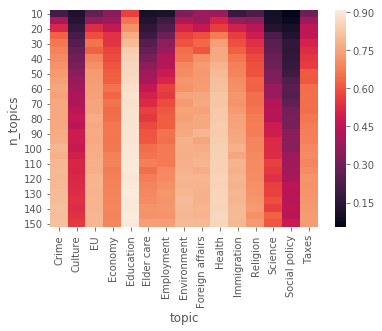

In [ ]:
sns.heatmap(k2top_perf)

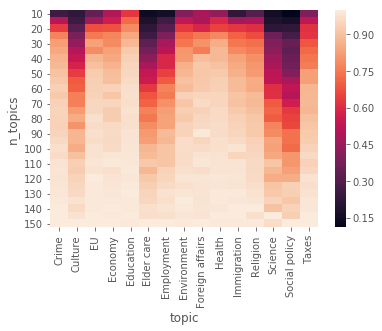

In [ ]:
sns.heatmap(k2top_perf/ k2top_perf.max(axis=0).values)

In [ ]:
best_dist.groupby('topic').best_precision.max().sort_values()

topic
Social policy      0.627545
Culture            0.675887
Science            0.747017
Economy            0.770014
Employment         0.781737
Elder care         0.785348
Religion           0.790547
Taxes              0.794988
EU                 0.839135
Foreign affairs    0.852531
Immigration        0.856264
Environment        0.856887
Crime              0.861831
Health             0.904136
Education          0.940219
Name: best_precision, dtype: float64

In [ ]:
#Consider removing:
#'social policy','culture','science'

In [ ]:
mid = random.choice(list(best_models))
groupdf = lexicon_df[lexicon_df.model_id==mid]

In [ ]:
lexicon_df.topword_label = pd.Categorical(lexicon_df.topword_label)

In [ ]:
groupdf.groupby('n_topics').apply(get_coverage)

topword_label,14,6,12,11,9,8,5,4,3,2,1,13,10,7,0
n_topics,,,,,,,,,,,,,,,
15,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
def get_coverage_all(groupdf):
    return groupdf.groupby('model_id').apply(lambda x:sum(x.topword_label.value_counts().sort_index()>0)*1).mean()
lexicon_df[lexicon_df.accept].groupby('n_topics').apply(get_coverage_all).plot()

n_topics
10      1.000000
15      1.552632
20      2.296296
25      3.985000
30      4.530000
35      4.975000
40      5.315000
45      5.670000
50      6.170000
55      6.365000
60      6.615000
65      7.230000
70      7.460000
75      8.055000
80      8.370000
85      8.105000
90      8.610000
95      9.045000
100     9.235000
105     9.500000
110     9.335000
115     9.810000
120    10.040000
125    10.100000
130    10.280000
135    10.440000
140    10.510000
145    10.675000
150    10.805000
dtype: float64

In [ ]:
list(lexicon_df.columns)

['time_series',
 'word_topic_count',
 'topic_frac_sum',
 'semantic_coherence_5',
 'semantic_coherence_10',
 'semantic_coherence_20',
 'frex_overlap_10_0',
 'frex_overlap_10_1',
 'frex_overlap_10_10',
 'frex_overlap_10_11',
 'frex_overlap_10_12',
 'frex_overlap_10_13',
 'frex_overlap_10_14',
 'frex_overlap_10_2',
 'frex_overlap_10_3',
 'frex_overlap_10_4',
 'frex_overlap_10_5',
 'frex_overlap_10_6',
 'frex_overlap_10_7',
 'frex_overlap_10_8',
 'frex_overlap_10_9',
 'frex_overlap_20_0',
 'frex_overlap_20_1',
 'frex_overlap_20_10',
 'frex_overlap_20_11',
 'frex_overlap_20_12',
 'frex_overlap_20_13',
 'frex_overlap_20_14',
 'frex_overlap_20_2',
 'frex_overlap_20_3',
 'frex_overlap_20_4',
 'frex_overlap_20_5',
 'frex_overlap_20_6',
 'frex_overlap_20_7',
 'frex_overlap_20_8',
 'frex_overlap_20_9',
 'frex_overlap_50_0',
 'frex_overlap_50_1',
 'frex_overlap_50_10',
 'frex_overlap_50_11',
 'frex_overlap_50_12',
 'frex_overlap_50_13',
 'frex_overlap_50_14',
 'frex_overlap_50_2',
 'frex_overlap_5

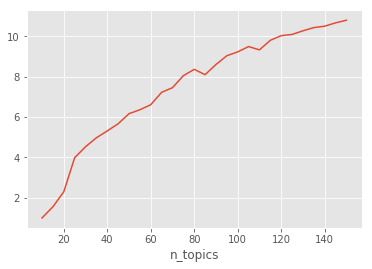

In [ ]:
_.plot()

In [ ]:
def get_coverage(groupdf):
    return groupdf.groupby('model_id').apply(lambda x:(x.topword_label.value_counts().sort_index()>0)*1).T.mean(axis=1)
k2coverage = lexicon_df[lexicon_df.accept].groupby('n_topics').apply(get_coverage)
k2coverage.columns = [get_dic_name(i) for i in range(15)]
k2coverage = k2coverage[[get_dic_name(i) for i in np.argsort(cat2fracs_dic)]]

In [ ]:
lexicon_df.frex_label = pd.Categorical(lexicon_df.frex_label)

In [ ]:
def get_coverage_frex(groupdf):
    return groupdf.groupby('model_id').apply(lambda x:(x.frex_label.value_counts().sort_index()>0)*1).T.mean(axis=1)
k2discovery = lexicon_df[lexicon_df.match_frex].groupby('n_topics').apply(get_coverage_frex)
k2discovery.columns = [get_dic_name(i) for i in range(15)]
k2discovery = k2discovery[[get_dic_name(i) for i in np.argsort(cat2fracs_dic)]]

In [ ]:
lexicon_df['concentration_ratio'] = lexicon_df['weighted_precision_best']/lexicon_df.best_label.apply(lambda x: cat2fracs_dic[int(x)])

In [ ]:
lexicon_df.concentration_ratio.max()

23.497934587443844

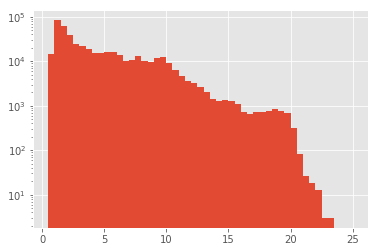

In [ ]:
lexicon_df.concentration_ratio.hist(bins=np.linspace(0.5,25,50))
plt.yscale('log')

In [ ]:
lexicon_df.best_label = pd.Categorical(lexicon_df.best_label)

In [ ]:
def get_coverage_best(groupdf):
    return groupdf.groupby('model_id').apply(lambda x:(x.best_label.value_counts().sort_index()>0)*1).T.mean(axis=1)

k2coverage_best = lexicon_df[lexicon_df.concentration_ratio>3].groupby('n_topics').apply(get_coverage_best)
k2coverage_best.columns = [get_dic_name(i) for i in range(15)]

In [ ]:
k2coverage = k2coverage[[get_dic_name(i) for i in np.argsort(cat2fracs_dic)]]
k2discovery = k2discovery[[get_dic_name(i) for i in np.argsort(cat2fracs_dic)]]
k2coverage_best = k2coverage_best[[get_dic_name(i) for i in np.argsort(cat2fracs_dic)]] 

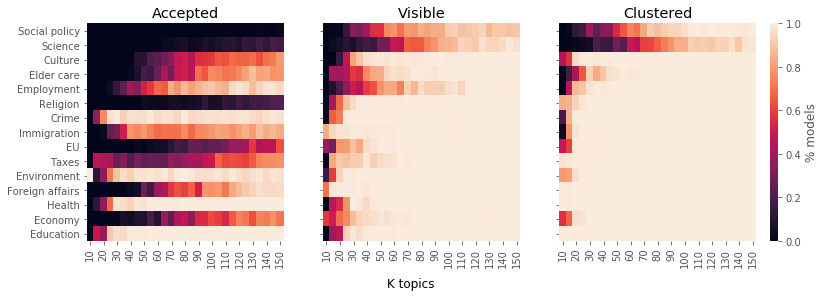

In [ ]:

fig,axes = plt.subplots(1,3,sharey=True,sharex=True)
fig.set_size_inches(12,4)
ax = axes[0]
boxes = [axes[i].get_position().bounds for i in range(3)]
cax_pos = [boxes[-1][0]+(boxes[-1][0]-boxes[-2][0])-0.03, 0.125,0.01,0.755]
sns.heatmap(k2coverage.T,ax=ax,cbar=False)
ax.set_xlabel('')
ax.set_title('Accepted')

ax = axes[1]
sns.heatmap(k2discovery.T,ax=ax,cbar=False)
ax.set_xlabel('')
ax.set_title('Visible')

ax = axes[2]

cax = fig.add_axes(cax_pos)
sns.heatmap(k2coverage_best.T,ax=ax,cbar=True,cbar_ax=cax)
cax.set_ylabel('% models')
ax.set_xlabel('')
ax.set_title('Clustered')
#plt.colorbar(ax_heatmap)
fig.suptitle('K topics',y=0)
plt.savefig('output/research_conclusions/coverage_k.png',bbox_inches='tight')

In [ ]:
k2coverage_best.values.flatten().mean(),k2discovery.values.flatten().mean(),k2coverage.values.flatten().mean()

(0.9270114942528735, 0.8796206896551724, 0.4967331675292958)

Bbox([[0.6720588235294118, 0.125], [0.9000000000000001, 0.88]])

In [ ]:
k2coverage.mean(axis=0).sort_values().iloc[-5:]#.mean()

Immigration    0.652636
Health         0.895652
Crime          0.906843
Environment    0.909681
Education      0.919934
dtype: float64

When asking the question. Does this topic exist?
*  49 % of the time will it say yes this is a consistent datadriven topic, with variance 0.32.
*  77 % (topwords) 87(frex words) of the time will it say yes there is some evidence that this topic is in the corpus. 



## Correlation between matches

In [ ]:
accepted_matches = lexicon_df[lexicon_df.match].groupby('model_id').apply(lambda x: (x[overlap_columns].sum(axis=0)>0).astype(int))
accepted_matches.columns = np.arange(15)
#sort_by_sizes  
accepted_matches = accepted_matches[cat2counts.argsort()]

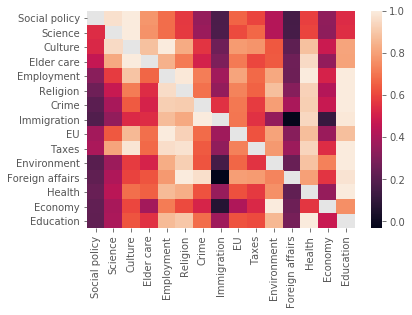

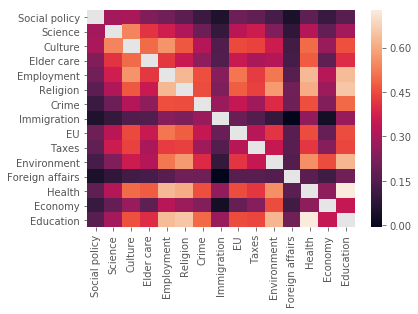

In [ ]:
corrs = accepted_matches.corr().values
corrs[np.arange(15),np.arange(15)] = np.nan
corrs = pd.DataFrame(corrs)
corrs.columns = [get_dic_name(i) for i in accepted_matches.columns]
corrs.index = [get_dic_name(i) for i in accepted_matches.columns]
corrs_normed_row = (corrs.T/corrs.apply(abs).max(axis=1)).T
sns.heatmap(corrs_normed_row)
plt.figure()
sns.heatmap(corrs)

# Dictionary Category Controls
**Regression approach to the results**
Dictionary category controls: 
    - Precision, Recall, 
    - Category size,  
    - N_words
    - Entropy of the category
    - Dictionary words entropy.
    - Dictionary co-occurrence strength.
        - Word co-occurrence ( semantic coherence)
        - Category Distinctiveness.

Topic - level controls
    - Top word match (top + frex)
    - Top 5 docs
    - Predictive validity

    - Semantic coherence
    - Exclusivity

Model controls
    - Model selection criterias.
    - Quantitative heuristics.
	

In [ ]:
# Import Model performance stats
cat2performance = pd.read_csv('category2performance.csv')
cat2performance['topic_class'] = range(15)
# 
cat_df = pol_df.groupby('topic_class').size().reset_index()
cat_df.columns = ['topic_class','n_docs']
cat_df = cat_df.merge(cat2performance)
cat_df['n_words'] = [len(d) for d in dictionaries_s]
cat_df['n_words_extent'] = [len(d) for d in dictionaries_s2]
cat_df['categorization_entropy'] = cat2entropy

In [ ]:

def get_coherence(top_mat,epsilon=0.01):
    # round down to 1
    top_mat[top_mat>0] = 1
    word_sum = top_mat.sum(axis=0)
    co_occurrence = top_mat.T.dot(top_mat)
    vals = []
    for i in range(len(co_occurrence)-1):
        for j in range(len(co_occurrence)):
            if i==j:
                continue
            Dj = word_sum[j]
            co_occur = co_occurrence[i,j]+epsilon
            
            vals.append(np.log(co_occur/Dj))
    return np.mean(vals)

cat2word_entropy = []
cat2co_occurrence = []
cat2coherence = []
coherence_ref = []
cat2coherence_top = []
for idx in tqdm(dictionaries_s):
    idx = np.array(list(idx))
    cat_mat = real_bows[:,idx]
    cat_sum = cat_mat.sum(axis=0)
    # remove words not occurring
    cat_mat = cat_mat[:,np.arange(len(cat_sum))[cat_sum>0]]
    
    cat_sum = cat_sum[cat_sum>0]
    cat_norm = cat_sum/cat_sum.sum()
    cat2word_entropy.append(scipy.stats.entropy(cat_norm))
    
    #cat_mat = (cat_mat>0)*1.0
    #w2w = cat_mat.T.dot(cat_mat)
    #semantic_coherence = np.log((w2w/w2w[np.arange(len(w2w)),np.arange(len(w2w))])+0.1).sum() / len(w2w)
    #np.log(co_occur/Dj)
    #cat2co_occurrence.append(semantic_coherence)
    cat2coherence.append(get_coherence(cat_mat))
    bootstrap_coherence = []
    for i in range(50):
        
        new_idx = idx + (np.random.randint(1,5,len(idx))*np.array([random.choice([-1,1]) for i in range(len(idx))]))
        cat_mat = real_bows[:,new_idx]
        bootstrap_coherence.append(get_coherence(cat_mat))
    coherence_ref.append(np.median(bootstrap_coherence))
    
    best_idx = idx[cat_sum.argsort()[-10:]]
    cat2coherence_top.append(get_coherence(real_bows[:,best_idx]))

In [ ]:
cat_df['word_entropy'] = cat2word_entropy
# Semantic coherence of the category 
cat_df['category_coherence'] = cat2coherence

cat_df['category_coherence_top'] = cat2coherence_top
# Distinctiveness as the summed cosine similarity to all other categories
cat_df['category_distinctiveness'] = np.nan_to_num(cat2cat).sum(axis=1)


# Make the coherence relative to coherence,
# based on the average coherence of sets of equally prevalent but non curated words of the same size.
cat_df['coherence_ref'] = coherence_ref
cat_df['category_coherence_relative'] = cat_df.category_coherence/cat_df.coherence_ref
cat_df['category_coherence_relative2'] = cat_df.coherence_ref-cat_df.category_coherence
cat_df['category_coherence_relative3'] = (cat_df.category_coherence-cat_df.coherence_ref)/cat_df.coherence_ref

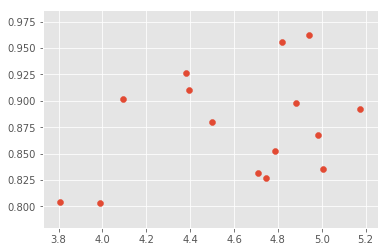

In [ ]:
plt.scatter(np.log(cat_df.n_words),cat_df.f1)
cat_df['n_words_log'] = np.log(cat_df['n_words'])
#sns.pairplot(cat_df[])

In [ ]:
x_cols = ['n_words','n_docs','categorization_entropy','word_entropy'
          ,'category_coherence','category_coherence_relative','category_distinctiveness','category']
y_cols = ['f1','precision','recall_weighted']
#sns.pairplot(cat_df[x_cols+y_cols[0:1]],hue='category')

In [ ]:
#plt.scatter(cat_df.category_distinctiveness,cat_df.f1)
#plt.scatter(cat_df.category_coherence_relative,cat_df.category_distinctiveness)

In [ ]:
import statsmodels.api as sm
y_col = 'f1'
y = cat_df[y_col].values

x_cols = ['n_words',
          #'n_words_log',
         # 'n_docs',
          'categorization_entropy',
         # 'word_entropy',
          'category_coherence_relative',
          'category_distinctiveness'
         ]

X = cat_df[x_cols].values

X = sm.add_constant(X)
mod = sm.OLS(y,X)

res = mod.fit()
print(res.summary(xname=['constant']+x_cols,yname='f1'))


/home/snorre/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


                            OLS Regression Results                            
Dep. Variable:                     f1   R-squared:                       0.686
Model:                            OLS   Adj. R-squared:                  0.561
Method:                 Least Squares   F-statistic:                     5.473
Date:                Sun, 07 Apr 2019   Prob (F-statistic):             0.0134
Time:                        11:20:08   Log-Likelihood:                 32.636
No. Observations:                  15   AIC:                            -55.27
Df Residuals:                      10   BIC:                            -51.73
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
constant          

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1416: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  "anyway, n=%i" % int(n))


In [ ]:
#cat_df[['label','category_coherence_top','precision']].sort_values('category_coherence_top')

In [ ]:
#cat_df[['label','category_coherence']].sort_values('category_coherence')

In [ ]:
## Merge with Topic Level dataframe
x_cols = ['n_words',
          'n_words_log',
          'n_docs',
          'categorization_entropy',
          'word_entropy',
          'category_coherence_relative',
          'category_distinctiveness'
         ]
y_cols = ['precision','weighted_recall','recall','f1']
cat_controls = cat_df[x_cols+y_cols+['topic_class']]
cat_controls.columns = x_cols+y_cols+['topword_label']
## add controls to topic level dataframe
lexicon_df = lexicon_df.merge(cat_controls,on='topword_label')

## Add more meta analysis of the categories.
- How does the quality (plus size, entropy and other controls) affect 
    * the number of matches?
    * the number of accepted?
    * the Entropy Score (i.e. the level of uninformative words in the topic)


In [ ]:
temp = []
for num,dic in enumerate(dictionaries_s):
    idx = np.array(list(dic))
    counts = real_bows[:,idx].sum(axis=0)
    most_ids = idx[np.argsort(np.asarray(counts)[0])[-5:]]
    #print(num,get_dic_name(num))
    for most_id in most_ids:
        most_prevalent = Index[most_id]
        #print(most_prevalent,end=' ')
    #print()
    fracs = (counts)/real_bows.shape[1]
    fracs = np.sort(fracs)[::-1]
    d = {'topic_class':num}
    
    for top in [1,2,3,5,10,20]:
        d['topfrac_%d'%top] = fracs[top]
        d['topfracmean_%d'%top] = np.mean(fracs[:top])
    temp.append(d)

In [ ]:
cat_df = cat_df.merge(pd.DataFrame(temp),on='topic_class')

In [ ]:
cat_df[['entropy_score','label']].sort_values('entropy_score')

,entropy_score,label
3,1.625956,Foreign affairs
5,1.737087,Health
2,1.788686,Education
4,1.827707,EU
12,1.839997,Crime
9,1.850509,Science
13,1.860700,Elder care
1,1.910631,Environment
6,1.972364,Immigration
10,1.973975,Religion


In [ ]:
top_match_thres = 0.5
lexicon_df['topmatch'] = np.logical_and(lexicon_df.match,lexicon_df.topic_label_frac_extent>=top_match_thres)

In [ ]:
## add entropy information
#cat_df = cat_df.drop('entropy_score',axis=1)
cat_df = cat_df.merge(pd.DataFrame(lexicon_df[lexicon_df.topmatch].groupby('best_label').entropy_score.mean().reset_index())
                      ,left_on='topic_class',right_on='best_label')

#cat_df = cat_df.merge(pd.DataFrame(lexicon_df[lexicon_df.accept].groupby('topic_label').entropy_score.mean().reset_index())
#                      ,left_on='topic_class',right_on='topic_label')

In [ ]:
temp = lexicon_df[lexicon_df.accept].groupby('topic_label').size().reset_index()
temp.columns = ['topic_label','n_accepted']
cat_df = cat_df.merge(temp,on='topic_label')
temp = lexicon_df[lexicon_df.match].groupby('topword_label').size().reset_index()
temp.columns = ['topic_label','n_matches']
cat_df = cat_df.merge(temp,on='topic_label')

In [ ]:
import statsmodels.api as sm
y_col = 'entropy_score'
y = cat_df[y_col].values

x_cols = [#'n_words',
          #'n_words_log',
          'n_docs',
         # 'categorization_entropy',
         # 'word_entropy',
          'category_coherence_relative',
         # 'category_distinctiveness'#,
     #     'recall',
    #'precision'
         ]

X = cat_df[x_cols].values

X = sm.add_constant(X)
mod = sm.OLS(y,X)

res = mod.fit()
print(res.summary(xname=['constant']+x_cols,yname='entropy_score'))


                            OLS Regression Results                            
Dep. Variable:          entropy_score   R-squared:                       0.417
Model:                            OLS   Adj. R-squared:                  0.319
Method:                 Least Squares   F-statistic:                     4.285
Date:                Sun, 07 Apr 2019   Prob (F-statistic):             0.0394
Time:                        11:56:32   Log-Likelihood:                 13.073
No. Observations:                  15   AIC:                            -20.15
Df Residuals:                      12   BIC:                            -18.02
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
constant          

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1416: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  "anyway, n=%i" % int(n))


In [ ]:
pred = res.params.dot(X.T)
cat_df['res' ] = y- pred

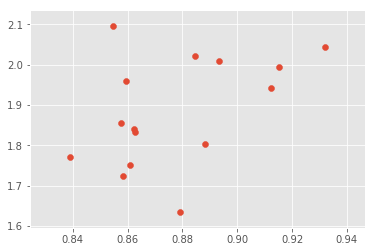

In [ ]:
plt.scatter(cat_df.category_coherence_relative,cat_df.entropy_score)

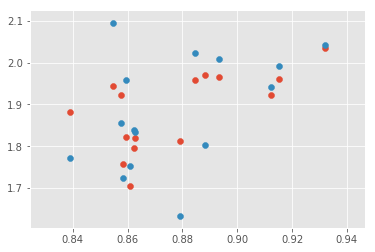

In [ ]:
plt.scatter(cat_df.category_coherence_relative,pred)
plt.scatter(cat_df.category_coherence_relative,cat_df.entropy_score)

In [ ]:
cat_df.sort_values('n_docs')[['category','entropy_score','category_coherence_relative','res','n_docs']]
## Foreign affair is a little bit of an outlier, 
## getting relatively low entropy score because they inherit english words more often
## Economy is an outlier getting high entropy even with good coherence. 
## However this might be due to a missing recall, i.e. Economy should also include employment and taxes? 
## gets higher entropy score because the same concepts are scatttered accross these categories.
## This gives them all a relatively high entropy score.

## Social policy has a very high entropy score. Because. 

,category,entropy_score,category_coherence_relative,res,n_docs
14,Social policy,2.136915,0.854547,0.089240,1251
9,Science,1.850509,0.838966,-0.003748,1604
0,Culture,2.015811,0.893424,-0.030691,1717
13,Elder care,1.860700,0.857683,-0.014299,1732
7,Employment,2.030775,0.884510,0.013044,2211
10,Religion,1.973975,0.859390,0.006947,2848
12,Crime,1.839997,0.862541,-0.017727,2898
6,Immigration,1.972364,0.912369,-0.006958,3351
4,EU,1.827707,0.888071,-0.018190,3403
8,Taxes,2.031690,0.915339,0.093774,3422


# selection criteria - Model level controls
** Qualitative ** 

N_matches - (n_junk + n_duplicates)

** Quantitative ** 
* Best summed rank of both coherence and exclusivity.


/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


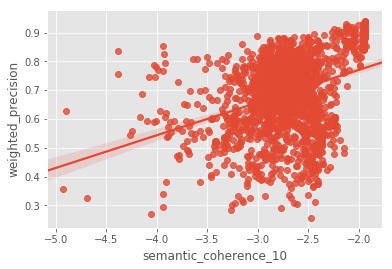

In [ ]:
plt.style.use('ggplot')

sns.regplot(x='semantic_coherence_10',y='weighted_precision',data=lexicon_df[lexicon_df.accept].sample(2000))
plt.savefig('output/descriptives/quant_heuristics_coherence.png')

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


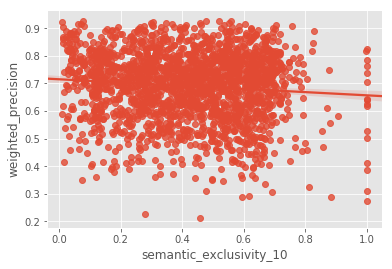

In [ ]:

sns.regplot(x='semantic_exclusivity_10',y='weighted_precision',data=lexicon_df[lexicon_df.accept].sample(2000))
plt.savefig('output/descriptives/quant_heuristics_exclusivity.png')

In [ ]:
#sum(lexicon_df.match==lexicon_df.junk)
# quantify how many duplicate topics pr model. Use top word label instead of topic_label since this also captures matches from junk topics 
d = dict(lexicon_df[lexicon_df.match].groupby('model_id').apply(lambda x: sum(x[x.topword_label.apply(np.isfinite)].topword_label.value_counts()-1)).items())
model_df['n_duplicates'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)
d = dict(lexicon_df[lexicon_df.match].groupby('model_id').apply(lambda x: sum(x[x.topic_label.apply(np.isfinite)].topic_label.value_counts()>1)).items())
model_df['n_duplicates2'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)


# quantify how many junk topics pr model
d = dict(lexicon_df.groupby('model_id').apply(lambda x: x.junk.sum()).items())
model_df['n_junk'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)
#model_df['n_junk'] = match_df[overlap_columns+['model_id']].groupby('model_id').apply(lambda x: sum(x.sum()!=x.max()))
## number of matches pr model
d = dict(lexicon_df.groupby('model_id').apply(lambda x: x.match.sum()).items())
model_df['n_matches'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)

# number of accepted pr model
d = dict(lexicon_df[lexicon_df.accept].groupby('model_id').size().items())
model_df['n_accepted'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)

## coverage of model in terms of different topics
d = dict(lexicon_df[lexicon_df.accept].groupby('model_id').topic_label.nunique().items())
model_df['n_different'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)

## Count how many words are topical on average.
d = dict(lexicon_df.groupby('model_id').apply(lambda x: (x[overlap_columns].sum(axis=1)/10).mean()).items())
model_df['absolute_matches'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)

In [ ]:
lexicon_df.match.sum()

60541

In [ ]:
lexicon_df.junk.sum()

25559

In [ ]:
sum(lexicon_df[overlap_columns].sum(axis=1)>0)

86100

In [ ]:
len(lexicon_df)

139200

In [ ]:
model_df.n_duplicates2.max()

15

In [ ]:
model_df = model_df.merge(df[[col for col in df.columns if not col=='n_topics']],left_on='model_id',right_on='modelid')

In [ ]:
d = dict(lexicon_df.groupby('model_id').semantic_coherence_10.mean().items())
model_df['semantic_coherence'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)
d = dict(lexicon_df.groupby('model_id').semantic_exclusivity_10.mean().items())
model_df['exclusivity'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)

In [ ]:
# remove duplicate columns
model_df = model_df[[col for col in model_df.columns if not '_y' == col[-2:]]]
model_df.columns = [col if col[-2:]!='_x' else col[0:-2] for col in model_df.columns]

In [ ]:
#plt.scatter(model_df['semantic_coherence'],model_df['coherence_mimno_2011'])
modelid2simul_id = {mid:sid for mid,sid in model_df[['model_id','simulation_id']].values}

In [ ]:
lexicon_df['simulation_id'] = lexicon_df.model_id.apply(lambda x: modelid2simul_id[x])
#lexicon_df = lexicon_df.merge(model_df[['model_id','simulation_id']],on='model_id')

In [ ]:
len(model_df[model_df.n_different>=8]),len(model_df)
#plt.scatter(model_df.selection_heuristic,model_df.n_different)
#plt.figure()
#plt.scatter(model_df.n_topics,model_df.n_different)

(1245, 1740)

In [ ]:
#model_df.n_matches - (model_df.n_junk+model_df.n_duplicates)

In [ ]:

model_df['selection_heuristic'] = (model_df.n_matches)-(model_df.n_junk+model_df.n_duplicates)
model_df['selection_heuristic_quality'] = (model_df.n_accepted*2)+(model_df.n_different)-(model_df.n_junk+model_df.n_duplicates)
model_df['selection_heuristic_variation'] =  ((model_df.n_accepted*2)+(model_df.n_different)-(model_df.n_junk+model_df.n_duplicates) )* model_df.n_different

In [ ]:
def get_coherence_exclusivity_tradeoff(groupdf,n_candidates=10):
    y,y2 = groupdf.semantic_coherence.values,groupdf.exclusivity.values
    x = groupdf.n_topics.values
    n_models = len(y)

    coherence_sort = np.argsort(y)
    exclusivity_sort = n_models-np.argsort(y2)
    
    # add the two together for the tradeoff
    tradeoff = (coherence_sort+exclusivity_sort).argsort()
    
    best_models = np.arange(n_models)[tradeoff][0:n_candidates]
    
    best_sizes = x[best_models]
    best_smallest = best_models[best_sizes.argmin()]
    
    best = tradeoff.argmin()
    
    # add the top candidates
    groupdf['selection_heuristic_tradeoff'] = 0
    groupdf.loc[groupdf.index[best_models],'selection_heuristic_tradeoff'] = 1
    # add the best candidate
    groupdf['selection_heuristic_tradeoff_best'] = 0
    groupdf.loc[groupdf.index[best],'selection_heuristic_tradeoff_best'] = 1
    ## add smallest of the best
    groupdf['selection_heuristic_tradeoff_smallest'] = 0
    groupdf.loc[groupdf.index[best_smallest],'selection_heuristic_tradeoff_smallest'] = 1
    return groupdf
model_df = model_df.groupby('simulation_id').apply(get_coherence_exclusivity_tradeoff)

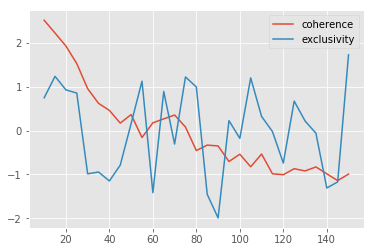

In [ ]:
run_id = model_df.simulation_id.sample(1).values[0]
groupdf = model_df[model_df.simulation_id==run_id]
groupdf = groupdf.sort_values('n_topics')
x = groupdf.n_topics.values
y,y2 = groupdf.semantic_coherence.values,groupdf.exclusivity.values
def norm(y):
    return (y-y.mean())/y.std()

plt.plot(x,norm(y),label='coherence')
plt.plot(x,norm(y2),label='exclusivity')
plt.legend()


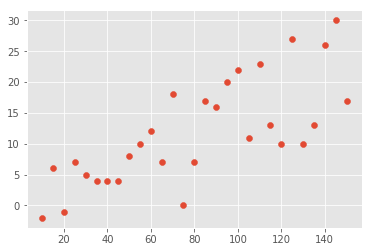

In [ ]:
simul_id = model_df.simulation_id.sample(1).values[0]
groupdf = model_df[model_df.simulation_id ==simul_id]
plt.scatter(groupdf.n_topics,groupdf.selection_heuristic)

In [ ]:
groupdf..idxmax()

TypeError: reduction operation 'argmax' not allowed for this dtype

In [ ]:
def get_best_run_qual(groupdf,col='selection_heuristic',out_col='best_run_qual'):
    
    best = groupdf[col].values.argmax()
    l = np.zeros(len(groupdf))
    l[best] = 1
    groupdf[out_col] = l
    return groupdf

model_df = model_df.groupby('simulation_id').apply(get_best_run_qual)
# best run is now an indicator that this would have won.
best_models = set(model_df[model_df.best_run_qual==1].model_id)

best_models2 = set(model_df[model_df.selection_heuristic_tradeoff.astype(bool)].model_id)
best_models3 = set(model_df[model_df.selection_heuristic_tradeoff_smallest.astype(bool)].model_id)
best_models4 = set(model_df[model_df.selection_heuristic_tradeoff_best.astype(bool)].model_id)

In [ ]:

lexicon_df['selection_qual'] = lexicon_df.model_id.isin(best_models)
lexicon_df['selection_quant'] = lexicon_df.model_id.isin(best_models2)
lexicon_df['selection_quant_parsimonous'] = lexicon_df.model_id.isin(best_models3)
lexicon_df['selection_quant_best'] = lexicon_df.model_id.isin(best_models4)

In [ ]:
top_match_thres = 0.5
lexicon_df['topmatch'] = np.logical_and(lexicon_df.match,lexicon_df.topic_label_frac_extent>=top_match_thres)

In [ ]:
#accepted_df = match_df[np.logical_and(match_df.topic_label_doc>=doc_match_thres,match_df.topic_label_frac_extent>=top_match_thres)]

In [ ]:
topmatch_df = lexicon_df[lexicon_df.accept]
types,vals = [],[]
for sel_col in ['selection_qual','selection_quant_parsimonous','selection_quant','selection_quant_best']:
    print(sel_col,topmatch_df[topmatch_df[sel_col]].weighted_precision.mean(),len(vals),len(types))
    vals+=list(topmatch_df[topmatch_df[sel_col]].weighted_precision.values)
    types+=([sel_col]*sum(topmatch_df[sel_col]))
    #sns.distplot(topmatch_df[topmatch_df[sel_col]].hard_precision,label=sel_col,hist=False)
vals += list(topmatch_df.weighted_precision.values)
types += ['all']*len(topmatch_df)
print('all',topmatch_df.weighted_precision.mean())

temp = pd.DataFrame({'weighted precision':vals,'selection criteria':types})
#plt.legend()
    #accepted_df['hard_precision'].mean(),accepted_df[accepted_df.model_id.isin(best_models)].hard_precision.mean(),accepted_df[accepted_df.model_id.isin(best_models2)].hard_precision.mean()
trans_sel_types = {'all':'all','selection_qual':'substantive','selection_quant':'quant_top10','selection_quant_parsimonous':'quant_granularity','selection_quant_best':'quant_best'}
temp['selection criteria'] = temp['selection criteria'].apply(lambda x: trans_sel_types[x])


selection_qual 0.6328079686308967 0 0
selection_quant_parsimonous 0.6731366915723939 990 990
selection_quant 0.7006734296615953 2224 2224
selection_quant_best 0.6936816103914514 29399 29399
all 0.6931605961440495


Text(0.5, 1.0, 'Model selection')

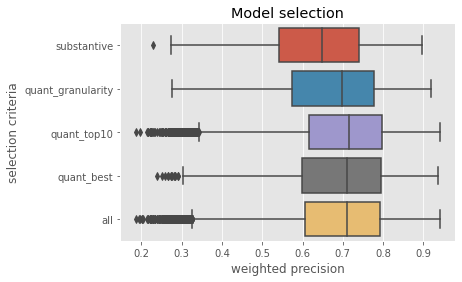

In [ ]:
sns.boxplot(y='selection criteria',x='weighted precision',data=temp)
plt.savefig('output/descriptives/model_selection_performance_accept.png',bbox_inches = 'tight')
plt.title('Model selection')

Text(0.5,1,'Model selection')

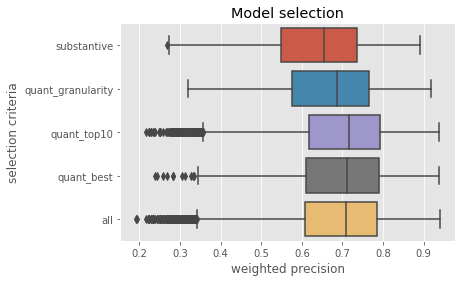

In [ ]:
sns.boxplot(y='selection criteria',x='weighted precision',data=temp)
plt.savefig('output/descriptives/model_selection_performance_accept.png',bbox_inches = 'tight')
plt.title('Model selection')

all 0.40917419975116515
selection_qual 0.3930179307889492 173196 173196
selection_quant_parsimonous 0.40086790746639134 175892 175892
selection_quant 0.4100721603257492 179325 179325
selection_quant_best 0.41030827012646 259280 259280


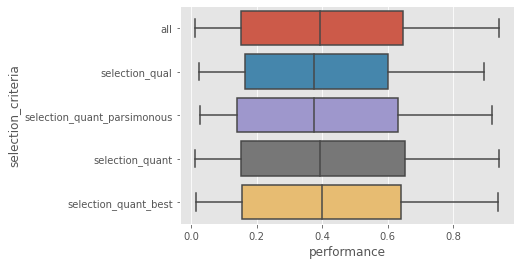

In [ ]:
topmatch_df = lexicon_df[lexicon_df.match]
vals = list(topmatch_df.weighted_precision.values)
types = ['all']*len(topmatch_df)
print('all',topmatch_df.weighted_precision.mean())
for sel_col in ['selection_qual','selection_quant_parsimonous','selection_quant','selection_quant_best']:
    print(sel_col,topmatch_df[topmatch_df[sel_col]].weighted_precision.mean(),len(vals),len(types))
    vals+=list(topmatch_df[topmatch_df[sel_col]].weighted_precision.values)
    types+=([sel_col]*sum(topmatch_df[sel_col]))
    #sns.distplot(topmatch_df[topmatch_df[sel_col]].hard_precision,label=sel_col,hist=False)
temp = pd.DataFrame({'performance':vals,'selection_criteria':types})
#plt.legend()
    #accepted_df['hard_precision'].mean(),accepted_df[accepted_df.model_id.isin(best_models)].hard_precision.mean(),accepted_df[accepted_df.model_id.isin(best_models2)].hard_precision.mean()
sns.boxplot(y='selection_criteria',x='performance',data=temp)
plt.savefig('output/descriptives/model_selection_performance_match.png')

#### Reference to substantive interest is detrimental to performance. And quant is only slightly better than random.

In [ ]:
#[i for i in list(lexicon_df.columns) if 'lexicon_' in i]

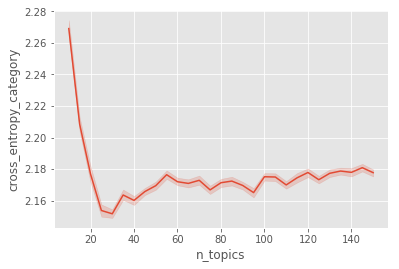

In [ ]:
import scipy
col = 'lexicon_doc_fraction_%d'
frac_cols = [col%i for i in range(15)]

lexicon_df['cross_entropy_categorical'] = lexicon_df[frac_cols].apply(lambda x: scipy.stats.entropy(x.values),axis=1)
d = dict(lexicon_df.groupby('model_id').cross_entropy_categorical.mean().items())
model_df['cross_entropy_category'] = model_df.model_id.apply(lambda x: d[x])
sns.lineplot(x='n_topics',y='cross_entropy_category',data=model_df)

### Measure and performance

In [ ]:
measures = ['loglikelihood','arun_2010','griffiths_2004','cao_juan_2009']
for measure in measures:
    m2measure = dict(zip(model_df.model_id,model_df[measure]))
    lexicon_df[measure] = lexicon_df.model_id.apply(lambda x: m2measure[x])

0.09072444390317778 0.09639496472093656 0.02827241112815784 arun_2010
0.09063781365546823 0.09737827912418096 0.02714000927268128 cao_juan_2009
-0.009857568921321391 -0.009857568921321391 -0.09500054064369663 semantic_coherence_10
-0.009857568921321391 -0.009857568921321391 -0.008461664912095416 griffiths_2004
-0.009857568921321391 -0.009857568921321391 -0.038383650145643156 loglikelihood


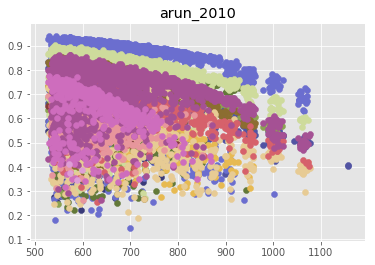

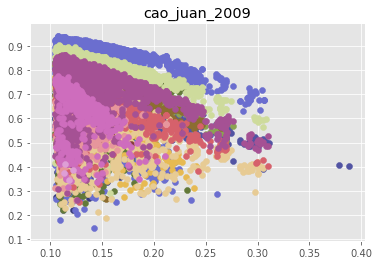

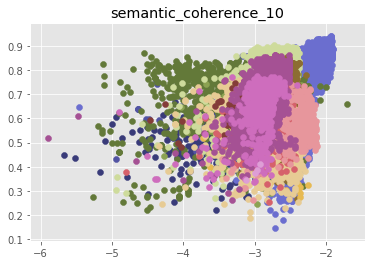

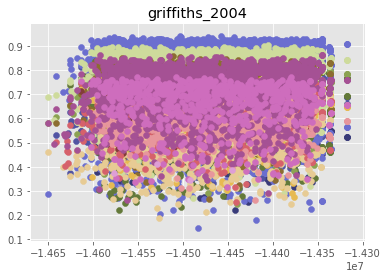

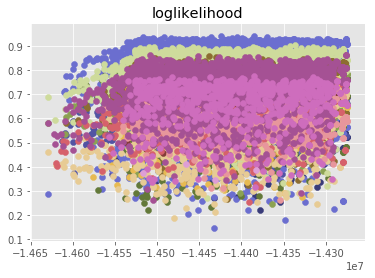

In [ ]:
topmatch_df = lexicon_df[lexicon_df.accept]
cmap = plt.cm.get_cmap('tab20b', 15)
directions = {'arun_2010': 'minimize',
 'cao_juan_2009': 'minimize',
 'semantic_coherence_10': 'maximize',
 'griffiths_2004': 'maximize',
 'loglikelihood': 'maximize'}
for (measure,direction) in directions.items():
#for measure in measures:
    plt.figure()
    gains = []
    gains2 = []
    for topic_label in range(15):
        temp = topmatch_df[topmatch_df.topic_label==topic_label]
        sort_prec = temp.sort_values(measure).weighted_precision.values
        cuts = min([len(temp),20])
        if direction == 'minimize':
            
            cut_idx = (len(sort_prec)//cuts ) * (cuts-1)
            gain = sort_prec[0:cut_idx].mean()-sort_prec[cut_idx:].mean()
        #cut_idx = len(sort_prec)//cuts
        cut_idx = (len(sort_prec)//cuts)
        gain2 = sort_prec[0:cut_idx].mean()-sort_prec[cut_idx:].mean()
        gains2.append(gain2)
        #print(sort_prec.mean(),(gain/sort_prec.mean())*100)
        gains.append(gain)
        #print(sort_prec[0:len(sort_prec)//2].mean(),sort_prec[-len(sort_prec)//2:].mean())
        plt.scatter(temp[measure],temp.weighted_precision,color=cmap(topic_label/15))
        #sns.lineplot(temp[measure],temp.weighted_precision,color=cmap(topic_label/15),size=1000)
    plt.title(measure)
    print(np.mean(gains),np.median(gains),np.mean(gains2),measure)
    #plt.title(measure)

In [ ]:
def get_best_run2(groupdf,col='coherence_mimno_2011' ,direction='min'):
    out_col ='best_run_%s'%col
    groupdf[out_col] = 0
    
    if direction=='minimize':
        groupdf.ix[groupdf[col].idxmin(),out_col] = 1
    else:
        groupdf.ix[groupdf[col].idxmax(),out_col] = 1
    return groupdf
# Describes the desired Direction of each measure
directions = {'arun_2010': 'minimize',
 'cao_juan_2009': 'minimize',
 'coherence_mimno_2011': 'maximize',
 'griffiths_2004': 'maximize',
 'loglikelihood': 'maximize'}
for (col,direction) in directions.items():
    model_df = model_df.groupby('simulation_id').apply(lambda x: get_best_run2(x,col=col,direction=direction))
    best_models2 = set(model_df[model_df['best_run_%s'%col]==1].model_id)
    print(col,accepted_df[accepted_df.model_id.isin(best_models2)].hard_precision.mean(),accepted_df.hard_precision.mean())

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


arun_2010 0.8625945441968682 0.8525366877074525
cao_juan_2009 0.8640496835474308 0.8525366877074525


/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


coherence_mimno_2011 0.813865832976597 0.8525366877074525
griffiths_2004 0.8507234663598999 0.8525366877074525
loglikelihood 0.8567807723981761 0.8525366877074525


### Since Mimno is very sensitive to preprocessing it seems that it is actually negatively correlated with precision, or it is ill defined in the TMTtoolkit.

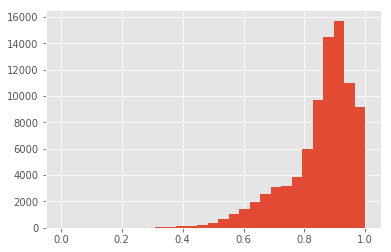

In [ ]:
accepted_df.hard_precision.hist(bins=np.linspace(0,1,30))

In [ ]:
#color = plt.cm.viridis((model_df.absolute_matches-model_df.absolute_matches.min())/(model_df.absolute_matches.max()-model_df.absolute_matches.min()))
#plt.scatter(model_df.selection_heuristic,model_df.selection_heuristic_quality,color=color,alpha=0.2)

In [ ]:
#model_df[model_df.best_run2==1].n_topics.value_counts()

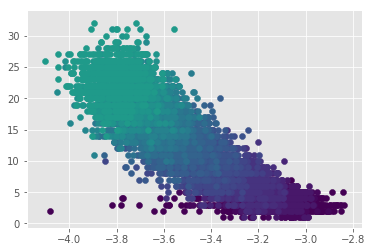

In [ ]:
cmap = plt.cm.get_cmap('viridis', model_df.n_topics.nunique())
for num,k in enumerate(sorted(model_df.n_topics.unique())):
    
    groupdf = model_df[model_df.n_topics==k]
    color = cmap(num/model_df.n_topics.nunique())
    #sns.lineplot(groupdf.coherence_mimno_2011,groupdf.n_junk/groupdf.n_topics,sort=True,color=color,err_style="bars", ci=68,alpha=0.5)
    plt.scatter(groupdf.coherence_mimno_2011,groupdf.n_junk,color=color)
    if k==145:
        break
    #sns.scatter(groupdf.coherence_mimno_2011,groupdf.n_junk,color=)
#plt.legend()

In [ ]:
#sns.pairplot(model_df[['n_topics','n_junk','n_accepted','n_matches','n_duplicates','selection_heuristic']])

## Add predictive validity

In [ ]:
sum(lexicon_df.topword_label == lexicon_df.best_label)/len(lexicon_df)

0.433648994854741

#### Only in 0.43 of the cases does the topword label match the best label.

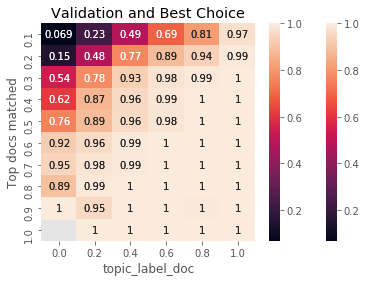

In [ ]:
## Is the top actually the best?
match_df = lexicon_df[lexicon_df[overlap_columns].sum(axis=1)>0]
ax = sns.heatmap(match_df.groupby(['topic_label_frac_extent', 'topic_label_doc']).apply(lambda x: sum(x.topword_label==x.best_label)/len(x)).unstack(),annot=True)
ax.set_title('Validation and Best Choice')
ax.set_ylabel('Top words matched')
ax.set_ylabel('Top docs matched')
plt.savefig('output/descriptives/validation_bestchoice_mat.png')

ax = sns.heatmap(match_df.groupby(['topic_label_frac_extent', 'topic_label_doc']).apply(lambda x: sum(x.topword_label==x.best_label)/len(x)).unstack(),annot=True)
ax.set_title('Validation and Best Choice')
ax.set_ylabel('Top words matched')
ax.set_ylabel('Top docs matched')
plt.savefig('output/descriptives/validation_bestchoice_mat.png')

#sum(accepted_df.topword_label == accepted_df.best_label)/len(accepted_df)

In [ ]:
accepted_df = lexicon_df[lexicon_df.accept]
matched_categories = sorted(set(accepted_df.topic_label))

cat_counts = accepted_df.topic_label.value_counts().reset_index()
cat_counts.columns = ['topic_label','n_accepted']
cat_counts_all = lexicon_df.topic_label.value_counts().reset_index()
cat_counts_all.columns = ['topic_label','n_matches']

cat_counts = cat_counts.merge(cat_counts_all,on='topic_label')
temp = topmatch_df.topic_label.value_counts().reset_index()
temp.columns = ['topic_label','n_topword']
cat_counts = cat_counts.merge(temp,on='topic_label')
cat_counts['label'] = cat_counts['topic_label'].apply(get_dic_name)


In [ ]:
cat_counts

,topic_label,n_accepted,n_matches,n_topword,label
0,2.0,3979,6455,3979,Education
1,5.0,2787,3736,2787,Health
2,3.0,2771,6210,2771,Foreign affairs
3,1.0,2056,6203,2056,Environment
4,12.0,2011,3632,2011,Crime
5,4.0,1502,3799,1502,EU
6,8.0,1374,2582,1374,Taxes
7,6.0,1257,8461,1257,Immigration
8,7.0,1152,5213,1152,Employment
9,10.0,967,3989,967,Religion


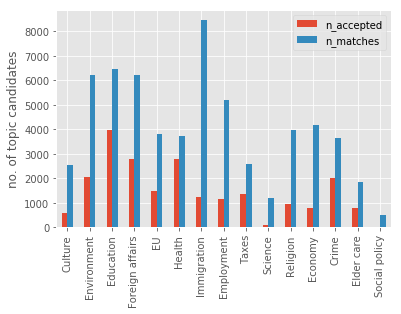

In [ ]:
plt.style.use('ggplot')
cat_counts.sort_values('topic_label').plot(kind='bar',x='topic_label',y=['n_accepted','n_matches'])
plt.xticks(np.arange(15),[get_dic_name(i) for i in range(15)],rotation=90);
plt.xlabel('');
plt.ylabel('no. of topic candidates')
plt.savefig('output/descriptives/matches_accepted2.png');

In [ ]:
lexicon_df.topic_label.nunique(),topmatch_df.topic_label.nunique(),accepted_df.topic_label.nunique()

(15, 15, 15)

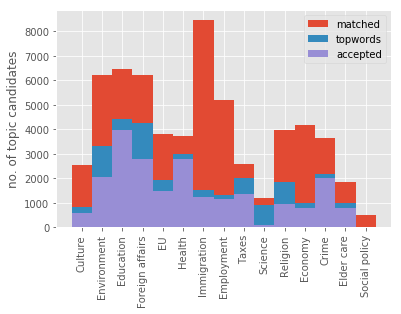

In [ ]:
lexicon_df.topic_label.hist(bins=range(16),alpha=1,label='matched')
lexicon_df[lexicon_df.topmatch].topic_label.hist(bins=range(16),alpha=1,label='topwords')
accepted_df.topic_label.hist(bins=range(16),alpha=1,label='accepted')
plt.xticks(np.arange(15)+0.5,[get_dic_name(i) for i in range(15)],rotation=90);
plt.legend()
plt.xlabel('');
plt.ylabel('no. of topic candidates')
plt.savefig('output/descriptives/matches_accepted.png');

In [ ]:
temp = accepted_df.topic_label.value_counts().reset_index()
temp['topic'] = temp['index'].apply(get_dic_name)
temp

,index,topic_label,topic
0,2.0,19735,Education
1,5.0,12091,Health
2,12.0,10151,Crime
3,1.0,7714,Environment
4,3.0,6626,Foreign affairs
5,6.0,6259,Immigration
6,7.0,5682,Employment
7,4.0,5562,EU
8,13.0,4047,Elder care
9,0.0,2909,Culture


### How many models are accepted?

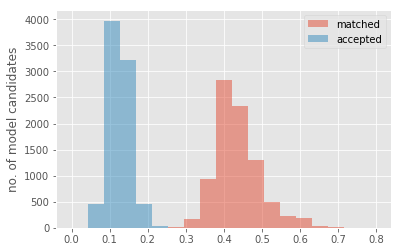

In [ ]:


match_df.groupby('model_id').apply(lambda x: len(x)/x.n_topics.values[0]).hist(bins=np.linspace(0,0.8,20),alpha=0.5,label='matched')
accepted_df.groupby('model_id').apply(lambda x: len(x)/x.n_topics.values[0]).hist(bins=np.linspace(0,0.8,20),alpha=0.5,label='accepted')
#plt.xticks(np.arange(15)+0.5,[get_dic_name(i) for i in range(15)],rotation=90);
plt.legend()
plt.xlabel('');
plt.ylabel('no. of model candidates')
plt.savefig('output/descriptives/nmodels_matches_accepted.png');

In [ ]:
model_df = pd.read_csv('model_dataframe.csv')
print(len(model_df))
model_df = model_df[model_df['model_id'].isin(keep_models)]
model_df.shape

8559


(8553, 36)

In [ ]:
temp = match_df.groupby('model_id').apply(lambda x: len(x)).reset_index()
temp.columns = ['model_id','matches']
temp['model_id'] = temp.model_id.astype(int)
model_df = model_df.merge(temp,how='outer')
temp = match_df.groupby('model_id').apply(lambda x: len(x)/x.n_topics.values[0]).reset_index()
temp.columns = ['model_id','matches_percentage']
temp['model_id'] = temp.model_id.astype(int)
model_df = model_df.merge(temp,how='outer')
## 
temp = topmatch_df.groupby('model_id').apply(lambda x: len(x)).reset_index()
temp.columns = ['model_id','topmatches']
temp['model_id'] = temp.model_id.astype(int)
model_df = model_df.merge(temp,how='outer')
temp = topmatch_df.groupby('model_id').apply(lambda x: len(x)/x.n_topics.values[0]).reset_index()
temp.columns = ['model_id','topmatches_percentage']
temp['model_id'] = temp.model_id.astype(int)
model_df = model_df.merge(temp,how='outer')

temp = accepted_df.groupby('model_id').apply(lambda x: len(x)).reset_index()
temp.columns = ['model_id','accepted']
temp['model_id'] = temp.model_id.astype(int)
model_df = model_df.merge(temp,how='outer')
temp = accepted_df.groupby('model_id').apply(lambda x: len(x)/x.n_topics.values[0]).reset_index()
temp.columns = ['model_id','accepted_percentage']
temp['model_id'] = temp.model_id.astype(int)
model_df = model_df.merge(temp,how='outer')
print(model_df.shape)
model_df.head()

(8553, 42)


,correlation_p0,parameters_p0,r2_p0,correlation_p1,parameters_p1,r2_p1,correlation_p10,parameters_p10,r2_p10,correlation_p2,...,r2_p9,model_id,model_path,n_topics,matches,matches_percentage,topmatches,topmatches_percentage,accepted,accepted_percentage
0,-0.359927,[-0.45996247 0.05937041],0.129547,0.901105,[ 1.12297281 -0.16967801],0.811991,0.469396,[ 1.0756341 -0.12556662],0.220333,0.640653,...,0.470543,0,0_0.0_0,10,4,0.400000,NaN,NaN,NaN,NaN
1,-0.426391,[-0.6917101 0.06651591],0.181810,0.826357,[ 1.81737968 -0.17445662],0.682867,0.251658,[ 0.72362261 -0.06194855],0.063332,0.333346,...,0.158535,1,0_0.0_1,15,9,0.600000,1.0,0.066667,1.0,0.066667
2,-0.175408,[-0.41958484 0.03061695],0.030768,0.652103,[ 2.20960057 -0.15868685],0.425238,0.002326,[ 0.01381325 -0.00419929],0.000005,0.341673,...,0.142578,2,0_0.0_2,20,12,0.600000,4.0,0.200000,4.0,0.200000
3,-0.098285,[-0.28851959 0.01572798],0.009660,0.585011,[ 2.37328787 -0.14547595],0.342238,-0.028735,[-0.185203 0.00553185],0.000826,0.205153,...,0.081371,3,0_0.0_3,25,12,0.480000,3.0,0.120000,3.0,0.120000
4,-0.238107,[-1.05367211 0.05324794],0.056695,0.512712,[ 2.31993347 -0.12486408],0.262873,-0.002167,[-0.01675464 -0.00270301],0.000005,0.155256,...,0.034777,4,0_0.0_4,30,16,0.533333,3.0,0.100000,3.0,0.100000


In [ ]:
best_corr_models = model_df.ix[model_df[[col for col in model_df.columns if 'correlation_' in col]+['n_topics']].groupby('n_topics').apply(lambda x: x.apply(abs).mean(axis=1).idxmax()).values]#.matches_percentage.mean()

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


In [ ]:
best_r2_models = model_df.ix[model_df[[col for col in model_df.columns if 'r2_' in col]+['n_topics']].groupby('n_topics').apply(lambda x: x.apply(abs).mean(axis=1).idxmax()).values]

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


In [ ]:
best_r2_models.accepted_percentage.mean()

0.12255266457351735

In [ ]:
! mkdir output/research_conclusions

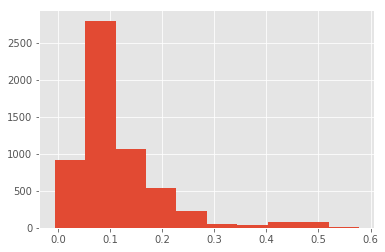

In [ ]:
party_corrs.mean(axis=1).hist()

In [ ]:
(party_corrs<0).mean(axis=0)

EL     0.388793
SF     0.000000
SD     0.062414
ALT    0.985862
RV     0.660690
DF     0.000000
VEN    0.738793
KF     0.011034
LA     0.000862
dtype: float64

In [ ]:
import itertools

In [ ]:
list(itertools.combinations(range(5),2))

[(0, 1),
 (0, 2),
 (0, 3),
 (0, 4),
 (1, 2),
 (1, 3),
 (1, 4),
 (2, 3),
 (2, 4),
 (3, 4)]

In [ ]:
dominant_conclusion = []
for col,col2 in itertools.combinations(party_corrs.columns,2):
    
    c = Counter((party_corrs<0)[[col,col2]].apply(tuple,axis=1)).most_common()
    n_conclusions = len(c)
    least_prob = c[-1][1]/len(party_corrs)
    most_prob = c[0][1]/len(party_corrs)
    dominant_conclusion.append(most_prob)
    print(col,col2,c[0][0],least_prob,most_prob)
#(party_corrs>0.1)#.mean(axis=0)#.plot(kind='bar')

EL SF (False, False) 0.3887931034482759 0.6112068965517241
EL SD (False, False) 0.014827586206896552 0.5963793103448276
EL ALT (False, True) 0.014137931034482758 0.5970689655172414
EL RV (True, True) 0.056896551724137934 0.33189655172413796
EL DF (False, False) 0.3887931034482759 0.6112068965517241
EL VEN (False, True) 0.019655172413793102 0.3696551724137931
EL KF (False, False) 0.004137931034482759 0.6070689655172414
EL LA (False, False) 0.00017241379310344826 0.6105172413793103
SF SD (False, False) 0.06241379310344827 0.9375862068965517
SF ALT (False, True) 0.014137931034482758 0.9858620689655172
SF RV (False, True) 0.3393103448275862 0.6606896551724138
SF DF (False, False) 1.0 1.0
SF VEN (False, True) 0.26120689655172413 0.7387931034482759
SF KF (False, False) 0.011034482758620689 0.9889655172413793
SF LA (False, False) 0.0008620689655172414 0.9991379310344828
SD ALT (False, True) 0.014137931034482758 0.923448275862069
SD RV (False, True) 0.004310344827586207 0.6025862068965517
SD D

In [ ]:
np.mean(dominant_conclusion)

0.7703496168582374

In [ ]:
(party_corrs<0).mean()

EL     0.388793
SF     0.000000
SD     0.062414
ALT    0.985862
RV     0.660690
DF     0.000000
VEN    0.738793
KF     0.011034
LA     0.000862
dtype: float64

In [ ]:
#pd.DataFrame({'mean':party_corrs.mean(),'variance':party_corrs.mean().apply(abs)>party_corrs.std()})

(array([  81.,  936.,    0., 1031.,    0., 1791., 1664.,    0.,  288.,
           9.]),
 array([0. , 0.6, 1.2, 1.8, 2.4, 3. , 3.6, 4.2, 4.8, 5.4, 6. ]),
 <a list of 10 Patch objects>)

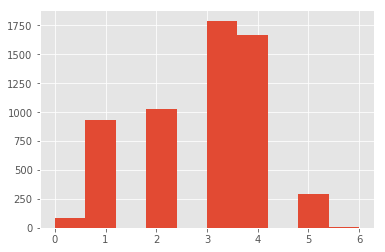

In [ ]:
plt.hist((party_corrs<0).sum(axis=1))


In [ ]:
mat_corrs = []
parties = []
for p in range(len(party_dummy.columns)):
    party = translater[party_dummy.columns[int(p)]]
    if not party in sort_parties:
        continue
    parties.append(party)
    col = 'correlation_p%d'%p
    mat_corrs.append(model_df[col].values)#.sort_values().values)
    
party_corrs = pd.DataFrame(np.array(mat_corrs).T,columns=parties)
party_corrs = party_corrs[sort_parties]

0.5


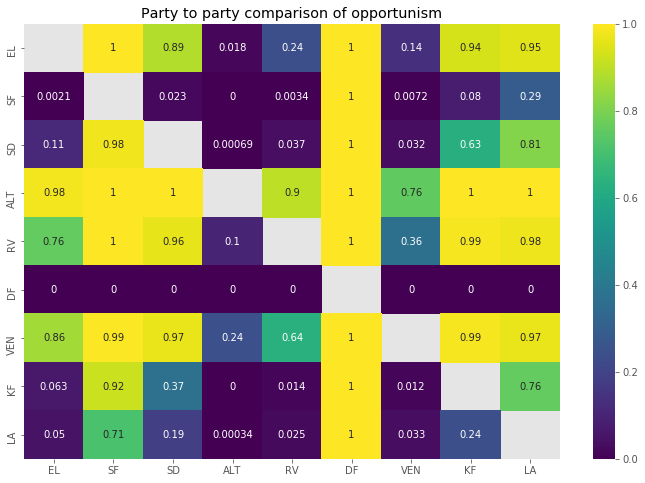

In [ ]:
party2party_mostoppurtune = np.empty((len(party_corrs.columns),len(party_corrs.columns)))
party2party_mostoppurtune[:,:] = np.nan

concentration = []
for i in range(len(party_corrs.columns)-1):
    p = party_corrs.columns[i]
    for j in range(i+1,len(party_corrs.columns)):
        p2 = party_corrs.columns[j]
        bigger = sum(party_corrs[p]<party_corrs[p2])/len(party_corrs)
        smaller = 1-bigger
        if bigger>smaller:
            concentration.append(bigger)
        else:
            concentration.append(smaller)
        party2party_mostoppurtune[i,j] = bigger
        party2party_mostoppurtune[j,i] = smaller
        #print(party2party_mostoppurtune[j,i],i,j)
plt.figure(figsize=(12,8))

print(np.nanmean([abs(i) for i in party2party_mostoppurtune.flatten()-1]))
sns.heatmap(pd.DataFrame(party2party_mostoppurtune,columns=party_corrs.columns,index=party_corrs.columns),annot=True,cmap='viridis')
plt.title('Party to party comparison of opportunism')
plt.savefig('output/research_conclusions/opportunism_party2party.png')

In [ ]:
np.mean(concentration) # The average level of ambivalence.

0.925450191570881

In [ ]:
#concentration

In [ ]:
## Is it coherent with the manual category based opportunism score

In [ ]:
p2pandering['party'] = p2pandering.party.apply(lambda x: translater[x])
p2pandering.index = p2pandering.party
p2pandering = p2pandering.loc[sort_parties]

In [ ]:
(p2pandering.values[:,1]>p2pandering.values[:,1].reshape(-1,1))

array([[False,  True,  True,  True,  True,  True,  True,  True,  True],
       [False, False, False, False, False,  True, False, False,  True],
       [False,  True, False,  True,  True,  True, False,  True,  True],
       [False,  True, False, False,  True,  True, False, False,  True],
       [False,  True, False, False, False,  True, False, False,  True],
       [False, False, False, False, False, False, False, False, False],
       [False,  True,  True,  True,  True,  True, False,  True,  True],
       [False,  True, False,  True,  True,  True, False, False,  True],
       [False, False, False, False, False,  True, False, False, False]])

In [ ]:
correspondance = (party2party_mostoppurtune.flatten()>0.5) == (p2pandering.values[:,1]>p2pandering.values[:,1].reshape(-1,1)).flatten()

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


array([ True,  True,  True, False, False,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True, False, False,  True,  True,  True,  True,
       False,  True, False,  True,  True,  True, False, False,  True,
       False,  True, False,  True,  True,  True,  True, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True, False, False,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True])

In [ ]:
sum((party2party_mostoppurtune.flatten()>0.5).reshape(9,9)[np.triu_indices(9)] == (p2pandering.values[:,1]>p2pandering.values[:,1].reshape(-1,1))[np.triu_indices(9)])/45

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


0.8

## 0.8 of the Party to party comparisons are true comparing with the Dictionary Approach.

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


Text(0.5,1,'True conclusions: True are non zero')

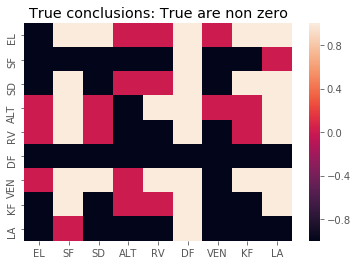

In [ ]:
correspondance_df = pd.DataFrame((party2party_mostoppurtune.flatten()>0.5).reshape(9,9) == (p2pandering.values[:,1]>p2pandering.values[:,1].reshape(-1,1)),columns=party_corrs.columns,index=party_corrs.columns)
temp_mat = (p2pandering.values[:,1]>p2pandering.values[:,1].reshape(-1,1))*1.0
temp_mat[temp_mat==0] = -1

sns.heatmap(temp_mat * correspondance_df)
plt.title('True conclusions: True are non zero')

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


Text(0.5,1,'False conclusions: False are non zero')

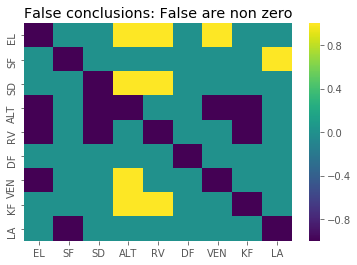

In [ ]:
correspondance_df = pd.DataFrame((party2party_mostoppurtune.flatten()>0.5).reshape(9,9) == (p2pandering.values[:,1]<p2pandering.values[:,1].reshape(-1,1)),columns=party_corrs.columns,index=party_corrs.columns)
temp_mat = (p2pandering.values[:,1]>p2pandering.values[:,1].reshape(-1,1))*1.0
temp_mat[temp_mat==0] = -1

sns.heatmap(temp_mat * correspondance_df,cmap='viridis')
plt.title('False conclusions: False are non zero')

## Comparing the two estimates of Opportunism we see, that it is false according to the dictionary, that EL should be less opportunistic than ALT, RV and VEN. And False that ALT should be more oppurtune than SD, EL, VEN, and KF. 

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


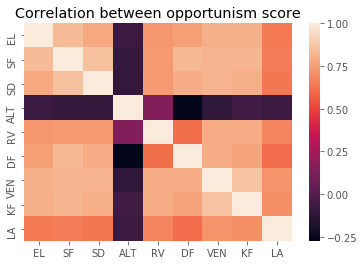

In [ ]:
plt.title('Correlation between opportunism score')
sns.heatmap(pd.DataFrame(np.array(mat_corrs),index=parties).ix[sort_parties].T.corr())
plt.savefig('output/research_conclusions/correlation_between_pandering_scores.png')

## We see that for instance RV, and DF are negatively correlated. Which make sense, because they are very different. So when a model is favourable to df topics, then it is not to RV.


/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


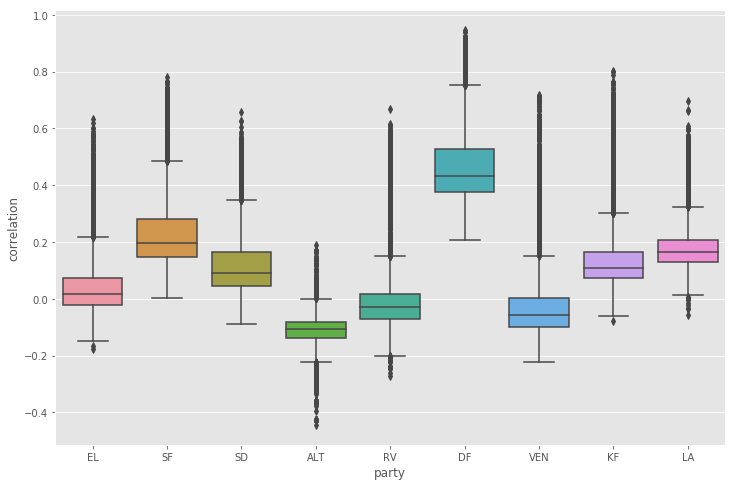

In [ ]:
plt.figure(figsize=(12,8))
party_corrs = pd.DataFrame(np.array(mat_corrs),index=parties).ix[sort_parties].unstack().reset_index()
party_corrs = party_corrs[['level_1',0]] 
party_corrs.columns = ['party','correlation']
sns.boxplot(y='correlation',data=party_corrs,x='party')
plt.savefig('output/research_conclusions/party_pandering_dist.png')

In [ ]:
#model_df.ix[5027]#[[col for col in model_df.columns if 'correlation_' in col]+['model_id']]

### Time series Variations - Predictive Validity

PV could be analyzed by the number of times peaks are correlated with the average topic peaks / dictionary peaks.

In [ ]:
! mkdir output/time_series

In [ ]:
category_mat = pd.get_dummies(pol_df.topic_class).values
category_timeseries = np.einsum('ij,ik->kj',time_mat,category_mat)#/time_mat.sum(axis=0)
category_timeseries_frac = np.true_divide(category_timeseries,time_mat.sum(axis=0))

In [ ]:
def linear_func(x, a, b):
    return a*x + b
from scipy.optimize import curve_fit
def fit_function(x,y,func=linear_func,plot=False):
    popt, pcov = curve_fit(func, x, y)
    fit_y = func(np.linspace(min(x),max(x),50),*popt)
    return np.linspace(min(x),max(x),50),fit_y,popt
import sklearn,datetime

def correlate_average_time_series(groupdf,plot=True,addendum=''):
    label = groupdf.topic_label.values[0]
    if plot:
        # Setup Grid
        font = {'family' : 'verdana',
        'weight' : 'normal',
        'size'   : 16}
        fig,axes = plt.subplots(1,2)
        fig.suptitle(get_dic_name(label),**font)
    
    # Make sure all topics interpreted as the same is counted.
    ts = groupdf.groupby('model_id').apply(sum_topics_within_model)
    
    mat = []
    for series in ts.values:
       
        mat.append(series)
    mat = np.array(mat)
    
    ## absolute version
    s = category_timeseries[int(label)]
    s2 = mat.mean(axis=0)
    #rint(len(s),len(s2))
    xlim,pred,popt = fit_function(s2,s)
    new_pred = linear_func(np.array(s2),*popt)
    r2_abs = sklearn.metrics.r2_score(s,new_pred)
    mae_abs = sklearn.metrics.mean_absolute_error(s,new_pred)
    mse_abs = sklearn.metrics.mean_squared_error(s,new_pred)
    sum_abs = s2.sum()
        
    ## percentage version
    s = category_timeseries_frac[int(label)]
    ## scale
    #s = (s-s.mean())/s.std()
    s2 =(mat / time_mat.sum(axis=0)).mean(axis=0)
    
    frac_mat = mat / time_mat.sum(axis=0)
    
    xlim,pred,popt = fit_function(s2,s)
    new_pred = linear_func(np.array(s2),*popt)
    r2 = sklearn.metrics.r2_score(s,new_pred)
    mae = sklearn.metrics.mean_absolute_error(s,new_pred)
    mse = sklearn.metrics.mean_squared_error(s,new_pred)
    sum_ = s.sum()
    if plot:
        ## plot the rescaled version
        ax = axes[0]
        t = [datetime.datetime(*(list(map(int,re.findall('\d+',i)))+[1,0,0])) for i in sorted(pol_df.month.unique())]
        ## scale
        
        ax.plot(frac_mat.T,alpha=0.05)
        ax.set_ylim(min(frac_mat.mean(axis=0))-frac_mat.mean(axis=0).std(),max(frac_mat.mean(axis=0))+frac_mat.mean(axis=0).std()*1.8)

        s = (s-s.mean())/s.std()
        s = (s*s2.std())+s2.mean()
        #s2 = (s2-s2.mean())/s2.std()
        frac_mat = mat / time_mat.sum(axis=0)
        m,sd = frac_mat.mean(axis=0),frac_mat.std(axis=0)
        ci = 1.96 * m/sd
        #return frac_mat,s,s2
        
        #ax.plot(m)
        #ax.fill_between(np.arange(len(m)), (m-ci), (m+ci), color='r', alpha=.6)
        ## flatten matrix
        y = []
        _ = []
        for yi in frac_mat:
            y+=list(yi)
            _+=list(range(len(yi)))
        ax.plot(s2,alpha=0.05)
        
        sns.lineplot(y=y,x=_,ci='sd',err_kws={'alpha':0.6},ax=ax,color='r')
        ax.plot(s,label='dictionary (rescaled)',lw=3,alpha=0.9,color='y')
        ax.plot(s2,label='average accross topics',lw=3,color='r',alpha=0.9)

        ax.set_ylabel('% of documents')
        ax.set_title('Time series variations')
        ticks,ticklabels = [i for i in range(len(t)) if t[i].month==1],[i.year for i in t if i.month==1]
        ax.set_xticks(ticks)
        ax.set_xticklabels(ticklabels)
        #plt.gca()
        #plt.xticks(ticks,ticklabels)
        #ax.set_xticklabels(ticks,ticklabels);
        ax.set_ylim(min(frac_mat.mean(axis=0))-frac_mat.mean(axis=0).std(),max(frac_mat.mean(axis=0))+frac_mat.mean(axis=0).std()*1.8)
        ax.legend()
        

        # plot correlation
        ax = axes[1]
        ax.plot(xlim,pred)
        s = category_timeseries_frac[int(label)]
        ax.scatter(s2,s,s = category_timeseries[int(label)])
        ax.set_title('Correlation: %r'%(round(r2,2)))
        ax.set_ylabel('% of docs. average of chosen topics')
        ax.set_xlabel('% of docs. dictionary')
        #fig.tight_layout()
        fig.set_size_inches(12,4)
        plt.savefig('output/time_series/%s%s'%(get_dic_name(label),addendum))
    return r2,r2_abs,mae,mae_abs,mse,mse_abs,sum_abs,sum_
    
#plt.plot(mat);
def sum_topics_within_model(modeldf):
    if len(modeldf)>1:
        a = np.zeros((len(modeldf),len(modeldf.time_series.values[0])))
        for num,ai in enumerate(modeldf.time_series.values):
            a[num] = ai
        return a.sum(axis=0)
        
    else:
        return modeldf.time_series.values[0]


(0.7079580982257044,
 0.8900685538467681,
 0.011639841389337055,
 3.4878119375083,
 0.0003524454674745809,
 31.586374768021766,
 507.9158870252998,
 4.076057740377907)

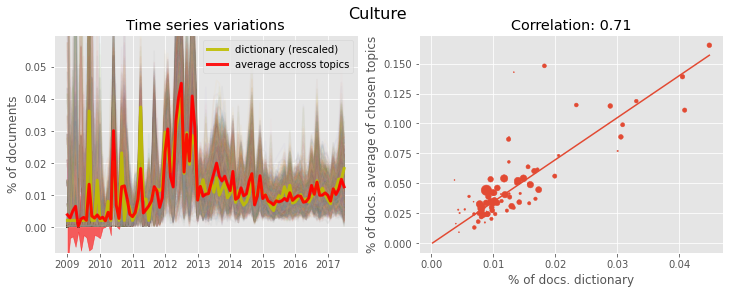

In [ ]:
correlate_average_time_series(groupdf)


In [ ]:
frac_mat.mean(axis=0).shape

(103,)

In [ ]:
s2.shape

(103,)

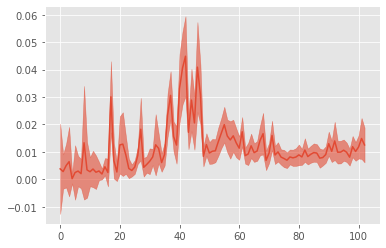

In [ ]:
y = []
t = []
for yi in mat:
    y+=list(yi)
    t+=list(range(len(yi)))
sd = mat.std(axis=0)
m = mat.mean(axis=0)
print
sns.lineplot(y=y,x=t,ci='sd',err_kws={'alpha':0.6})

In [ ]:
len(accepted_df)/len(lexicon_df)

0.15905172413793103

In [ ]:

accepted_df = lexicon_df[lexicon_df.accept].reset_index()

In [ ]:
import re
re_val = re.compile('[0-9.e\-]+')
def parse_timeseries_str(t):
    if type(t)==str:
        
        t = np.array([float(i) for i in t.strip('[]').split() if i.strip()!=''])
    return t

In [ ]:
lexicon_df['time_series'] = lexicon_df['time_series'].apply(parse_timeseries_str)

<ipython-input-172-949902827932>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  groupdf['time_series'] = groupdf['time_series'].apply(parse_timeseries_str)
<ipython-input-172-949902827932>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  groupdf['time_series'] = groupdf['time_series'].apply(parse_timeseries_str)
<ipython-input-172-949902827932>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

,r2,r2_abs,mae,mae_abs,mse,mse_abs,sum_abs,sum,topic,topic_label
0,0.707958,0.890069,0.011640,3.487812,0.000352,31.586375,507.915887,4.076058,0.0,Culture
1,0.622067,0.768856,0.017798,9.354464,0.001177,359.179060,890.998284,6.605524,1.0,Environment
2,0.658146,0.950621,0.024270,7.135046,0.001272,135.227954,1637.582326,11.368227,2.0,Education
3,0.493499,0.860012,0.025259,9.161323,0.001135,173.042823,362.142104,8.687735,3.0,Foreign affairs
4,0.636655,0.683190,0.038302,8.881232,0.007437,289.439626,487.531752,10.868941,4.0,EU
5,0.518997,0.968752,0.019238,4.993576,0.001007,62.423601,1052.967158,8.617964,5.0,Health
6,0.400245,0.686143,0.020453,10.284434,0.000961,533.608481,897.530154,5.123985,6.0,Immigration
7,0.712523,0.891946,0.015771,4.836807,0.000655,74.198356,627.200773,6.057504,7.0,Employment
8,0.094046,0.940797,0.028109,5.755731,0.003372,72.973132,795.080543,7.763010,8.0,Taxes
9,0.568041,0.921732,0.009670,2.943095,0.000220,23.023782,328.572642,3.177151,9.0,Science


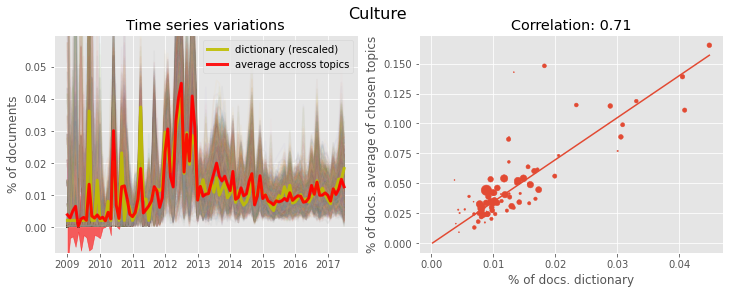

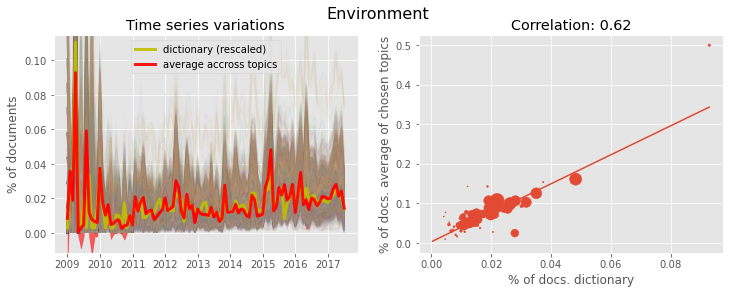

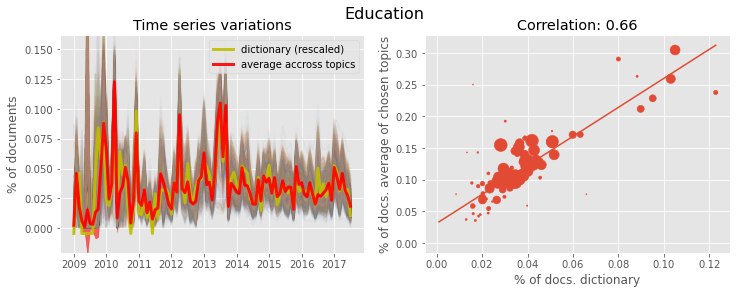

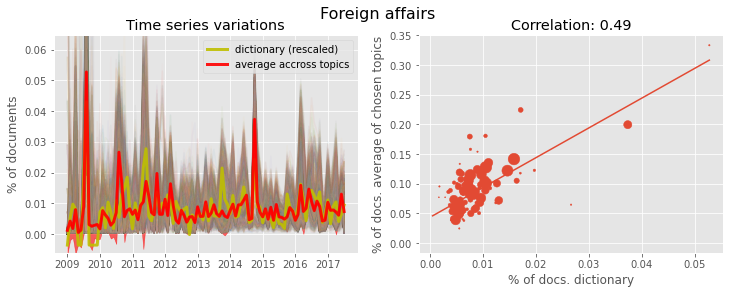

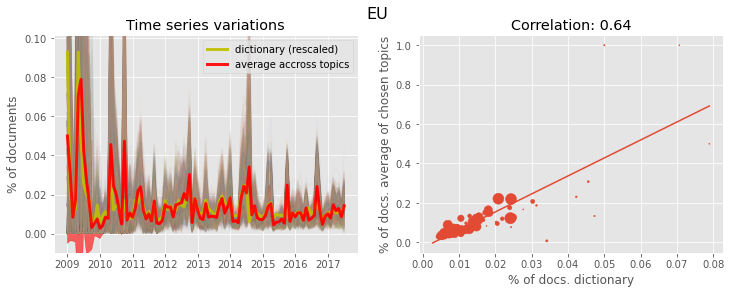

...

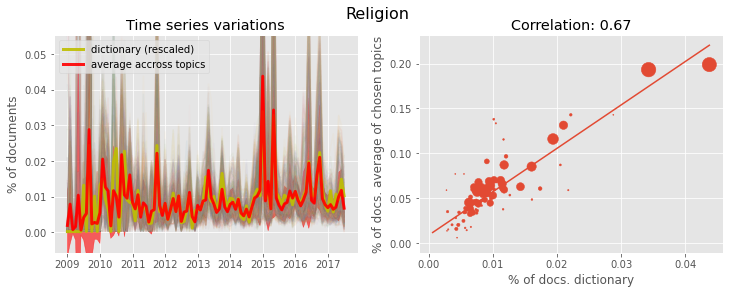

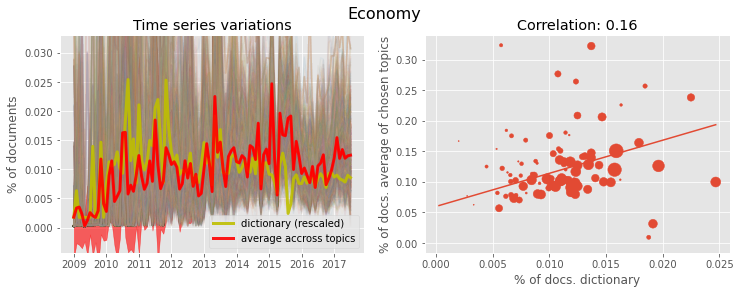

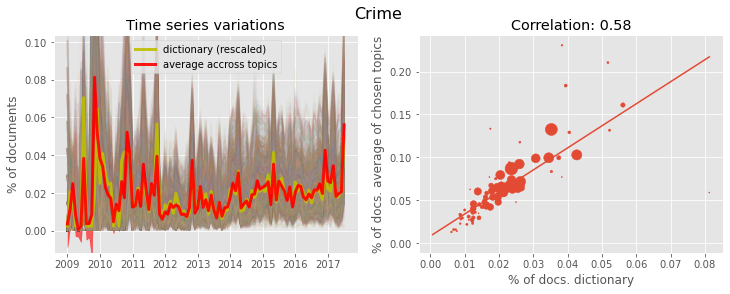

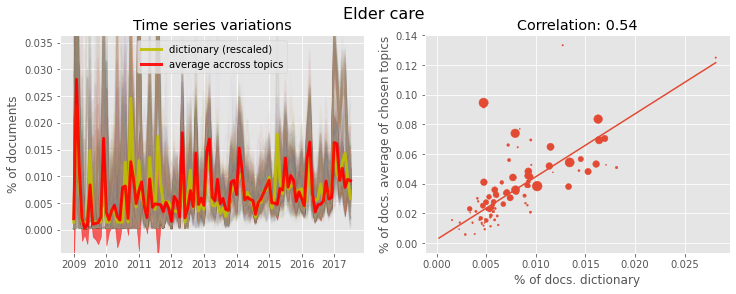

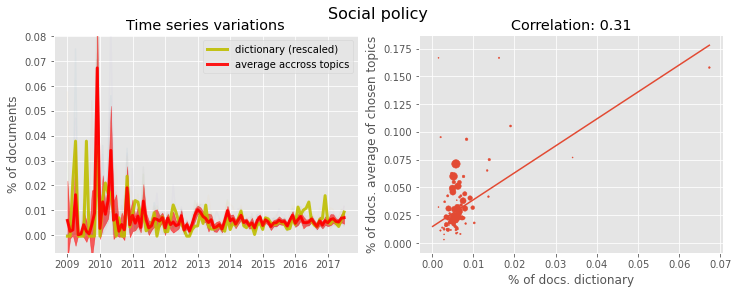

In [ ]:
timeseries_df = []
for label,groupdf in accepted_df.groupby('topic_label'):
    groupdf['time_series'] = groupdf['time_series'].apply(parse_timeseries_str)
    r2,r2_abs,mae,mae_abs,mse,mse_abs,sum_abs,sum_ = correlate_average_time_series(groupdf,addendum='_accepted')
    timeseries_df.append({'r2':r2,'r2_abs':r2_abs,
                          'mae':mae,'mae_abs':mae_abs,'mse':mse,'mse_abs':mse_abs,'sum_abs':sum_abs,'sum':sum_
                          ,'topic':label,'topic_label':get_dic_name(label)})
timeseries_df = pd.DataFrame(timeseries_df)
timeseries_df

In [ ]:
#timeseries_df.bar()
timeseries_df['error'] = timeseries_df.mae/timeseries_df['sum']

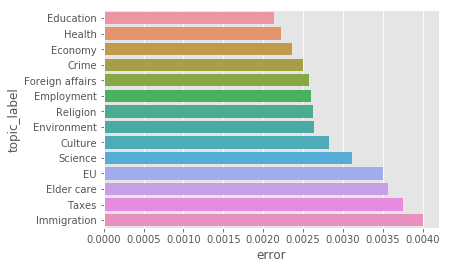

In [ ]:
sns.barplot(x='error',y='topic_label',data=timeseries_df.sort_values('error'))

/home/snorre/anaconda3/lib/python3.6/site-packages/seaborn/timeseries.py:183: UserWarning: The `tsplot` function is deprecated and will be removed in a future release. Please update your code to use the new `lineplot` function.
  warnings.warn(msg, UserWarning)
/home/snorre/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1328: UserWarning: findfont: Font family ['verdana'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


,r2,r2_abs,topic,topic_label
0,0.635873,0.893431,0.0,Culture
1,0.584948,0.820391,1.0,Environment
2,0.654577,0.959086,2.0,Education
3,0.655007,0.953081,3.0,Foreign affairs
4,0.583576,0.711257,4.0,EU
5,0.524425,0.973925,5.0,Health
6,0.043107,0.800274,6.0,Immigration
7,0.546338,0.803907,7.0,Employment
8,0.080319,0.938862,8.0,Taxes
9,0.383936,0.877185,9.0,Science


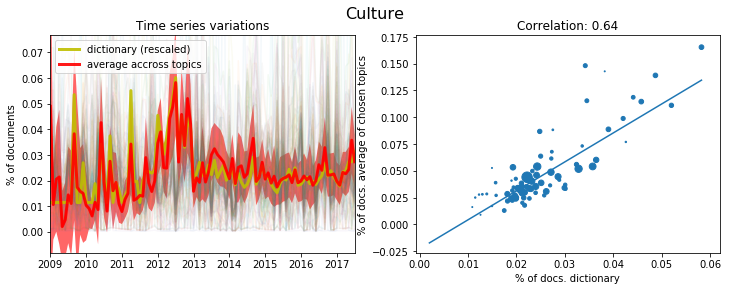

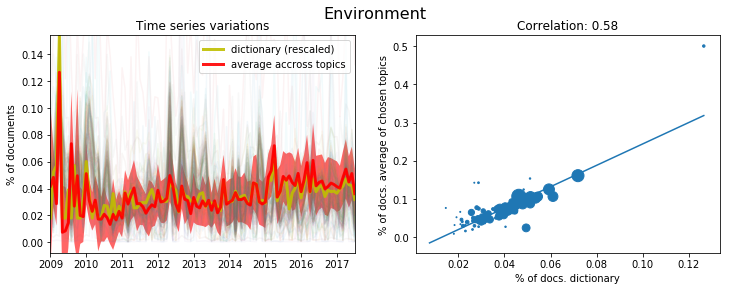

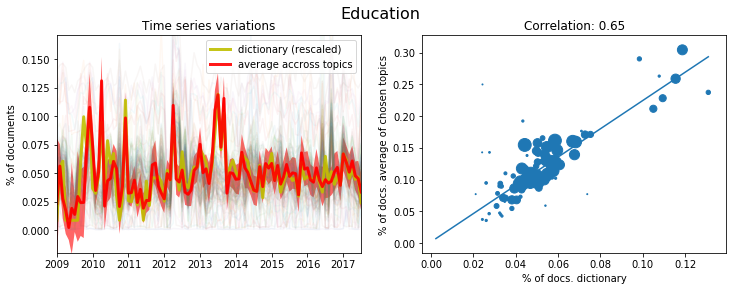

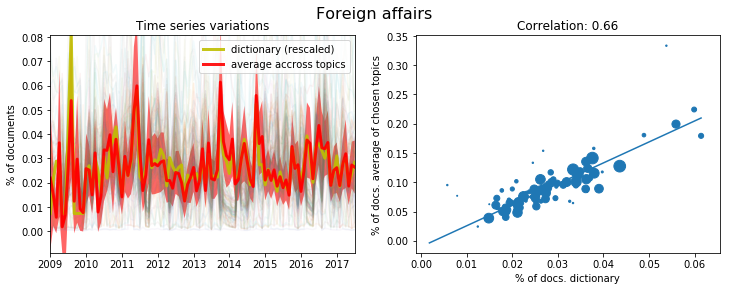

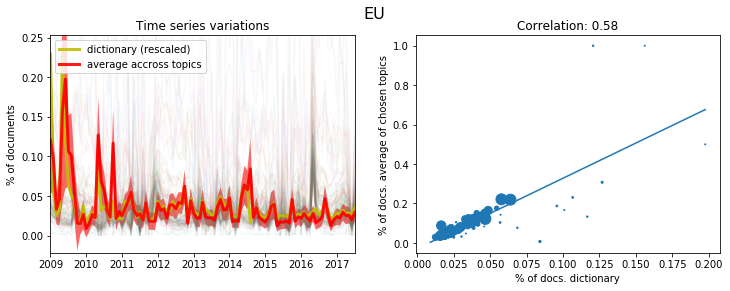

...

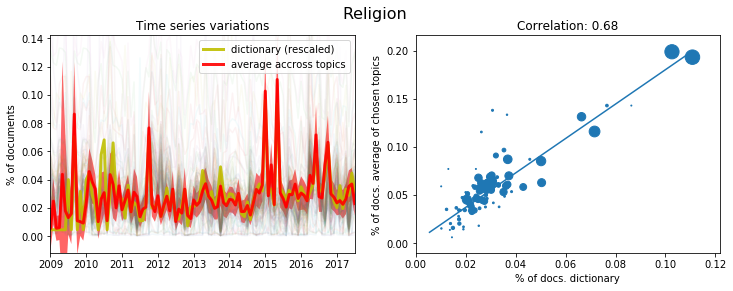

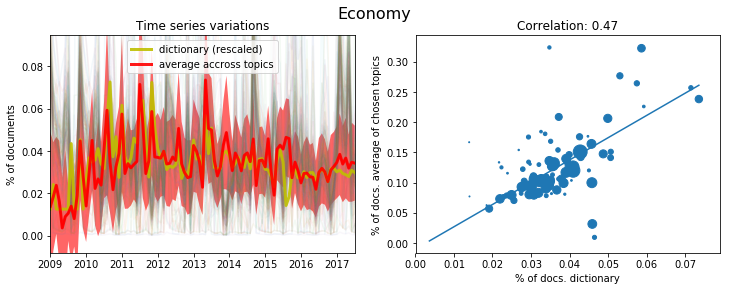

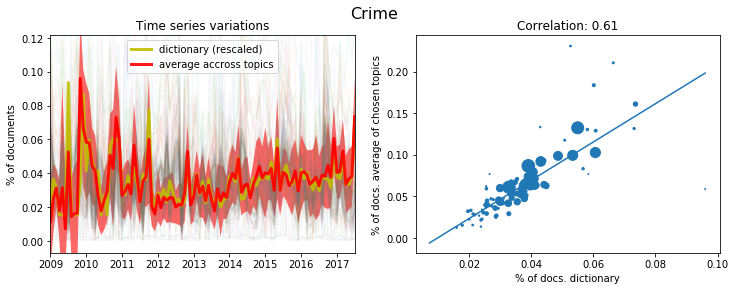

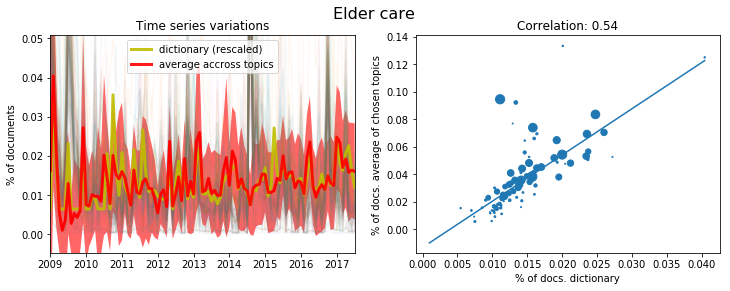

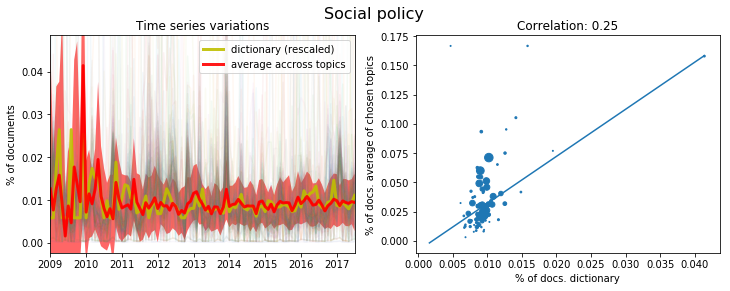

In [ ]:
timeseries_df = []
for label,groupdf in lexicon_df.groupby('topic_label'):
    r2,r2_abs,mae,mae_abs,mse,mse_abs,sum_abs,sum_ = correlate_average_time_series(groupdf,addendum='_accepted')
    d = {'r2':r2,'r2_abs':r2_abs,
                          'mae':mae,'mae_abs':mae_abs,'mse':mse,'mse_abs':mse_abs,'sum_abs':sum_abs,'sum':sum_
                          ,'topic':label,'topic_label':get_dic_name(label)}
    timeseries_df.append(d)
timeseries_df = pd.DataFrame(timeseries_df)
timeseries_df

### Predictive Validity and Overall Correlations
Predictive Validity: Are the same month peaking?
- see overlap between top 10 of the dictionary, and top 5 of each accepted topic. 
    - and an eyeball overlap. 
-- relate this to the actual correlation between the 2.


In [ ]:
# Time series correlation between dictionary fractions and 
def matrix_vec_correlation(mat,s):
    mat_m = mat - mat.mean(axis=1)
    s_m = s-s.mean()
    mat_s = np.multiply(mat_m,mat_m).sum(axis=1)
    
    s_s = (s_m**2).sum()
    corrs = np.dot(s_m,mat_m.T)/np.sqrt(np.dot(s_s,mat_s.T))
    return corrs
def sum_topics_within_model(modeldf):
    if len(modeldf)>1:
        a = np.zeros((len(modeldf),len(modeldf.time_series.values[0])))
        for num,ai in enumerate(modeldf.time_series.values):
            a[num] = ai
        return a.sum(axis=0)
        
    else:
        return modeldf.time_series.values[0]

def get_peak_overlap(label,n_peaks=5,eyeball_precision=1):
    groupdf = accepted_df[accepted_df.topic_label==label]
    ts = groupdf.groupby('model_id').apply(sum_topics_within_model)
    groupdf.model_id
    mat = []
    for series in ts.values:
        mat.append(series)
    mat = np.array(mat)
    ## frac version
    s = category_timeseries_frac[int(label)]
    #
    mat = mat/time_mat.sum(axis=0)
    
    # Get eyeball overlap 
    top_peaks = mat.argsort()[:,-n_peaks:] 
    idx = set(s.argsort()[-n_peaks:])
    predictive_overlap = []
    predictive_overlap_eyeball = []
    for idx2 in top_peaks:
        bf,aft = idx2-eyeball_precision,idx2+eyeball_precision
        idx2 = set(idx2)

        predictive_overlap.append(len(idx2&idx))
        predictive_overlap_eyeball.append(len((idx2|set(bf)|set(aft))&idx))
    
    # Get correlations
    mat = np.matrix(mat)
    corrs = matrix_vec_correlation(mat,s)
    corrs = np.array(corrs)
    corrs = corrs[0,:]
    
    model_correlation_df = pd.DataFrame({'predictive_validity':predictive_overlap
                                         ,'predictive_validity_eyeball':predictive_overlap_eyeball
                                         ,'timeseries_correlation':corrs,
                                        'topic_label':label,'model_id':list(ts.index)})
    return predictive_overlap_eyeball,predictive_overlap,corrs,model_correlation_df

In [ ]:
#list(lexicon_df.columns)

In [ ]:
def get_individual_peak_overlap(label,n_peaks=5,eyeball_precision=1):
    groupdf = accepted_df[accepted_df.topic_label==label]
    ts = groupdf.time_series
    groupdf.model_id
    mat = []
    for series in ts.values:
        mat.append(series)
    mat = np.array(mat)
    ## frac version
    s = category_timeseries_frac[int(label)]
    #
    mat = mat/time_mat.sum(axis=0)
    
    # Get eyeball overlap 
    top_peaks = mat.argsort()[:,-n_peaks:] 
    idx = set(s.argsort()[-n_peaks:])
    predictive_overlap = []
    predictive_overlap_eyeball = []
    for idx2 in top_peaks:
        bf,aft = idx2-eyeball_precision,idx2+eyeball_precision
        idx2 = set(idx2)

        predictive_overlap.append(len(idx2&idx))
        predictive_overlap_eyeball.append(len((idx2|set(bf)|set(aft))&idx))
    
    # Get correlations
    mat = np.matrix(mat)
    corrs = matrix_vec_correlation(mat,s)
    corrs = np.array(corrs)
    corrs = corrs[0,:]
    
    model_correlation_df = pd.DataFrame({'predictive_validity':predictive_overlap
                                         ,'predictive_validity_eyeball':predictive_overlap_eyeball
                                         ,'timeseries_correlation':corrs,
                                        'topic_label':label,'t_id':list(ts.index)})
    return model_correlation_df

In [ ]:
accepted_df = lexicon_df[lexicon_df.match] # sum on match.
#accepted_df = lexicon_df[lexicon_df.accept] # sum on accept
matched_categories = sorted(set(accepted_df.topic_label))

predictive_overlap_eyeball,predictive_overlap,corrs = [],[],[]
labels = []
model_dfs = []
individual_dfs = []
for i in matched_categories:
    poe,po,corr,model_correlation_df = get_peak_overlap(i)
    predictive_overlap_eyeball+=poe
    predictive_overlap+=list(po)
    corrs+=list(corr)
    labels+=([get_dic_name(i)]*len(corr))
    model_dfs.append(model_correlation_df)
    individual_dfs.append(get_individual_peak_overlap(i))
#accepted_df = accepted_df.merge(pred_df,how='outer')

In [ ]:
len(accepted_df)

173196

In [ ]:
pred_df = pd.concat(model_dfs)[[col for col in model_dfs[0].columns]]

In [ ]:
pred_individual_df = pd.concat(individual_dfs)[[col for col in individual_dfs[0].columns]]

In [ ]:
pred_individual_df = pred_individual_df.sort_values('t_id')
pred_individual_df.columns = [col+'_individual' if col not in set(['topic_label','t_id']) else col for col in pred_individual_df.columns]

In [ ]:
len(pred_df),len(pred_individual_df)

(36476, 101306)

In [ ]:

pred_individual_df.head()

,predictive_validity_individual,predictive_validity_eyeball_individual,timeseries_correlation_individual,topic_label,t_id
0,0,0,-0.169446,6.0,4
0,0,0,-0.021802,11.0,6
1,1,1,0.558028,6.0,16
2,0,0,-0.184975,6.0,19
1,2,3,0.329228,11.0,20


In [ ]:
pred_df.head()

,predictive_validity,predictive_validity_eyeball,timeseries_correlation,topic_label,model_id
0,2,3,0.634719,0.0,62
1,1,1,0.551477,0.0,63
2,1,2,0.624775,0.0,64
3,1,1,0.333964,0.0,65
4,2,3,0.620972,0.0,66


In [ ]:
#pred_df.shape

In [ ]:
for col in [col for col in pred_individual_df.columns if 'individual' in col]:
    d = dict(pred_individual_df[['t_id',col]].values)
    lexicon_df[col] = [d[i] if i in d else 0 for i in lexicon_df.index]

In [ ]:
d = {(label,mid):validity for label,mid,validity in pred_df[['topic_label','model_id','predictive_validity']].values}
def make_individual_merge(key):
    if key in d:
        return d[key]
    else:
        return np.nan
lexicon_df['predictive_validity'] = lexicon_df[['topic_label','model_id']].apply(lambda x: make_individual_merge(tuple(x.values)),axis=1)
d = {(label,mid):validity for label,mid,validity in pred_df[['topic_label','model_id','predictive_validity_eyeball']].values}
lexicon_df['predictive_validity_eyeball'] = lexicon_df[['topic_label','model_id']].apply(lambda x: make_individual_merge(tuple(x.values)),axis=1)
d = {(label,mid):validity for label,mid,validity in pred_df[['topic_label','model_id','timeseries_correlation']].values}
lexicon_df['timeseries_correlation_robust'] = lexicon_df[['topic_label','model_id']].apply(lambda x: make_individual_merge(tuple(x.values)),axis=1)

In [ ]:
d = dict(pred_df.groupby('model_id').predictive_validity.max().items())
model_df['best_predictive'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)
d = dict(pred_df.groupby('model_id').predictive_validity.apply(lambda x: x.sort_values().values[-5:].mean()).items())
model_df['best_predictive_top5'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)
d = dict(pred_df.groupby('model_id').predictive_validity.apply(lambda x: x.sort_values().values[-3:].mean()).items())
model_df['best_predictive_top3'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)
d = dict(pred_df.groupby('model_id').predictive_validity_eyeball.max().items())
model_df['best_predictive_eyeball'] = model_df.model_id.apply(lambda x: d[x] if x in d else 0)

In [ ]:
## Add to the lexicon_df 
for col in ['best_predictive','best_predictive_top3','best_predictive_top5','best_predictive_eyeball']:
    d = dict(model_df[['model_id',col]].values)
    lexicon_df[col] = lexicon_df.model_id.apply(lambda x: d[x])

In [ ]:
#lexicon_df[over]
lexicon_df['topword_n'] = lexicon_df[overlap_columns].max(axis=1)/10
lexicon_df['topword_n_extend'] = lexicon_df[overlap_columns_frex].max(axis=1)/10
lexicon_df['topword_n_frex'] = lexicon_df[overlap_columns_frex].max(axis=1)/10
overlap_columns_frex_extent = ['frex_overlap_extent_10_%d'%i for i in range(15)]
lexicon_df['topword_n_frex_extent'] = lexicon_df[overlap_columns_frex_extent].max(axis=1)/10

In [ ]:
y_cols = ['human_performance','weighted_precision']

In [ ]:
#list(lexicon_df.columns)[-40:]

Text(0.5,0,'no. of peaks (best)')

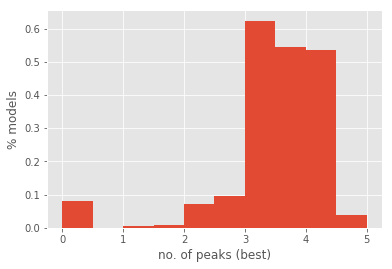

In [ ]:
#model_df.best_predictive.hist(bins=range(6),density=True)
#model_df.best_predictive_eyeball.hist(bins=range(6),density=True)
model_df.best_predictive_top3.hist(bins=10,density=True)
plt.ylabel('% models')
plt.xlabel('no. of peaks (best)')


In [ ]:
#model_dfs[0]

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


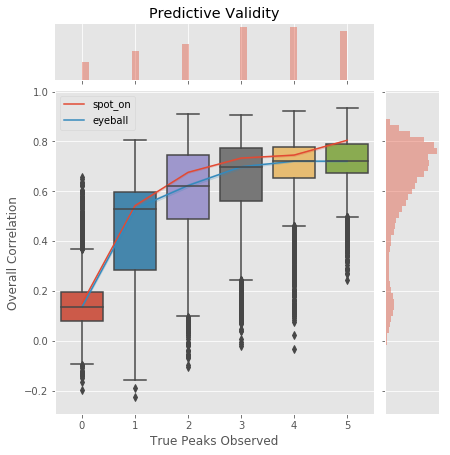

In [ ]:
grid = sns.jointplot(predictive_overlap_eyeball,corrs,joint_kws={'alpha':0})

grid.ax_marg_x.set_title('Predictive Validity')
grid.ax_joint.set_xlabel('True Peaks Observed')
grid.ax_joint.set_ylabel('Overall Correlation')
sns.boxplot(x=predictive_overlap_eyeball,y=corrs,ax=grid.ax_joint.axes)
sns.lineplot(predictive_overlap,corrs,label='spot_on',ax=grid.ax_joint.axes,estimator=np.median)
sns.lineplot(predictive_overlap_eyeball,corrs,label='eyeball',ax=grid.ax_joint.axes,estimator=np.median)

plt.savefig('output/time_series/predictive_validity_variance_eyeball.png')

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


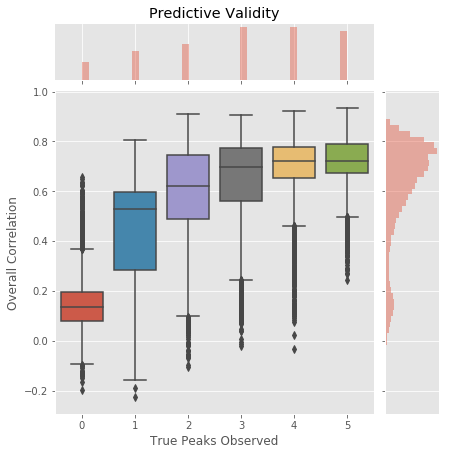

In [ ]:
grid = sns.jointplot(predictive_overlap_eyeball,corrs,joint_kws={'alpha':0})

grid.ax_marg_x.set_title('Predictive Validity')
grid.ax_joint.set_xlabel('True Peaks Observed')
grid.ax_joint.set_ylabel('Overall Correlation')
sns.boxplot(x=predictive_overlap_eyeball,y=corrs,ax=grid.ax_joint.axes)
plt.savefig('output/time_series/predictive_validity_variance.png')

### the above show how navigating peaks will not ensure any overall quality.

In [ ]:

lexicon_df['selection_pv'] = lexicon_df.predictive_validity == 5
best_models_pv = set(lexicon_df[lexicon_df.predictive_validity==5].model_id)
lexicon_df['selection_pv_inherit'] = lexicon_df.model_id.isin(best_models_pv)

In [ ]:
import pickle
pickle.dump(lexicon_df,open('lexicon_df_formatted.pkl','wb'))

selection_qual 0.6328079686308967 0 0
selection_pv 0.6703630277890301 990 990
selection_pv_inherit 0.6976986133680476 1746 1746
selection_quant_parsimonous 0.6731366915723939 11832 11832
selection_quant 0.7006734296615953 13066 13066
selection_quant_best 0.6936816103914514 40241 40241
all 0.6931605961440495


Text(0.5, 1.0, 'Model selection')

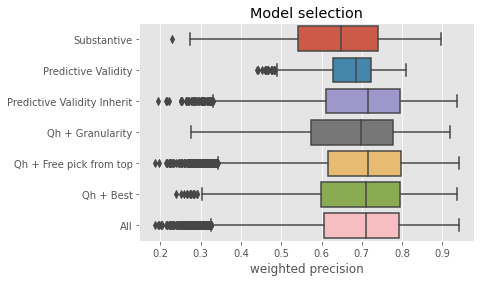

In [ ]:
topmatch_df = lexicon_df[lexicon_df.accept]
types,vals = [],[]
for sel_col in ['selection_qual','selection_pv','selection_pv_inherit','selection_quant_parsimonous','selection_quant','selection_quant_best']:
    print(sel_col,topmatch_df[topmatch_df[sel_col]].weighted_precision.mean(),len(vals),len(types))
    vals+=list(topmatch_df[topmatch_df[sel_col]].weighted_precision.values)
    types+=([sel_col]*sum(topmatch_df[sel_col]))
    #sns.distplot(topmatch_df[topmatch_df[sel_col]].hard_precision,label=sel_col,hist=False)
vals += list(topmatch_df.weighted_precision.values)
types += ['all']*len(topmatch_df)
print('all',topmatch_df.weighted_precision.mean())

temp = pd.DataFrame({'weighted precision':vals,'selection criteria':types})
#plt.legend()
    #accepted_df['hard_precision'].mean(),accepted_df[accepted_df.model_id.isin(best_models)].hard_precision.mean(),accepted_df[accepted_df.model_id.isin(best_models2)].hard_precision.mean()
trans_sel_types = {'all':'All','selection_qual':'Substantive'
                   ,'selection_quant':'Qh + Free pick from top','selection_quant_parsimonous'
                   :'Qh + Granularity','selection_quant_best':'Qh + Best','selection_pv':'Predictive Validity','selection_pv_inherit':'Predictive Validity Inherit'}
#{'all':'all','selection_qual':'substantive'
 #                  ,'selection_quant':'quant_top10','selection_quant_parsimonous'
  #                 :'quant_granularity','selection_quant_best':'quant_best','selection_pv':'predictive_validity','selection_pv_inherit':'predictive_validity_inherit'}
temp['selection criteria'] = temp['selection criteria'].apply(lambda x: trans_sel_types[x])
sns.boxplot(y='selection criteria',x='weighted precision',data=temp)
plt.ylabel('')
plt.title('Selection criteria')
plt.savefig('output/descriptives/model_selection_performance_accept+pv.png',bbox_inches = 'tight')
plt.savefig('output/descriptives/Picture3.png',bbox_inches = 'tight')
plt.title('Model selection')

selection_qual 0.6362352463852584 0 0
selection_pv 0.6830278737567022 699 699
selection_pv_inherit 0.6945266142634955 2156 2156
selection_quant_parsimonous 0.6698725074843662 17287 17287
selection_quant 0.6985191910054828 18072 18072
selection_quant_best 0.6943456259635663 34486 34486
all 0.6906618840820763


Text(0.5,1,'Model selection')

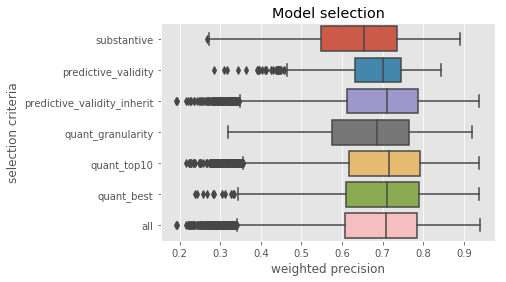

In [ ]:
topmatch_df = lexicon_df[lexicon_df.accept]
types,vals = [],[]
for sel_col in ['selection_qual','selection_pv','selection_pv_inherit','selection_quant_parsimonous','selection_quant','selection_quant_best']:
    print(sel_col,topmatch_df[topmatch_df[sel_col]].weighted_precision.mean(),len(vals),len(types))
    vals+=list(topmatch_df[topmatch_df[sel_col]].weighted_precision.values)
    types+=([sel_col]*sum(topmatch_df[sel_col]))
    #sns.distplot(topmatch_df[topmatch_df[sel_col]].hard_precision,label=sel_col,hist=False)
vals += list(topmatch_df.weighted_precision.values)
types += ['all']*len(topmatch_df)
print('all',topmatch_df.weighted_precision.mean())

temp = pd.DataFrame({'weighted precision':vals,'selection criteria':types})
#plt.legend()
    #accepted_df['hard_precision'].mean(),accepted_df[accepted_df.model_id.isin(best_models)].hard_precision.mean(),accepted_df[accepted_df.model_id.isin(best_models2)].hard_precision.mean()
trans_sel_types = {'all':'all','selection_qual':'substantive'
                   ,'selection_quant':'quant_top10','selection_quant_parsimonous'
                   :'quant_granularity','selection_quant_best':'quant_best','selection_pv':'predictive_validity','selection_pv_inherit':'predictive_validity_inherit'}
temp['selection criteria'] = temp['selection criteria'].apply(lambda x: trans_sel_types[x])
sns.boxplot(y='selection criteria',x='weighted precision',data=temp)
plt.savefig('output/descriptives/model_selection_performance_accept+pv.png',bbox_inches = 'tight')
plt.title('Model selection')

## Correlations between ensemble / average time series and accepted topics

/home/snorre/anaconda3/lib/python3.6/site-packages/seaborn/timeseries.py:183: UserWarning: The `tsplot` function is deprecated and will be removed in a future release. Please update your code to use the new `lineplot` function.
  warnings.warn(msg, UserWarning)
/home/snorre/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1328: UserWarning: findfont: Font family ['verdana'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


,r2,r2_abs,r2_abs_all,r2_all,topic,topic_label,type
0,0.725728,0.905861,0.897135,0.648322,0,Culture,accepted
1,0.640420,0.785348,0.822679,0.564836,1,Environment,accepted
2,0.669951,0.953701,0.956851,0.657073,2,Education,accepted
3,0.699071,0.952399,0.949909,0.656418,3,Foreign affairs,accepted
4,0.596570,0.669384,0.699517,0.620964,4,EU,accepted
5,0.527524,0.969799,0.976675,0.538087,5,Health,accepted
6,0.410654,0.721536,0.800283,0.051850,6,Immigration,accepted
7,0.712601,0.900140,0.840026,0.558414,7,Employment,accepted
8,0.075817,0.924333,0.929686,0.058563,8,Taxes,accepted
9,0.557961,0.924843,0.877898,0.388949,9,Science,accepted


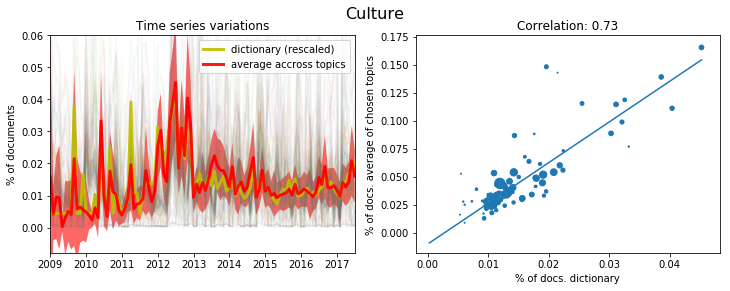

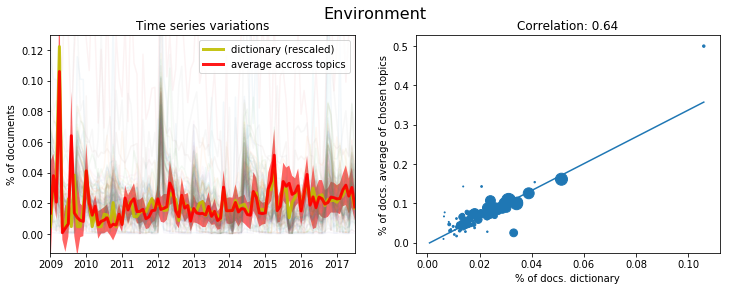

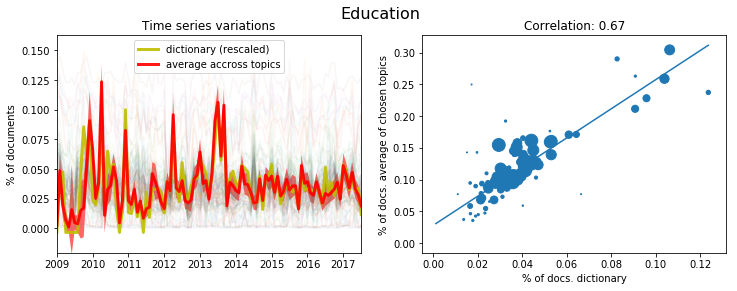

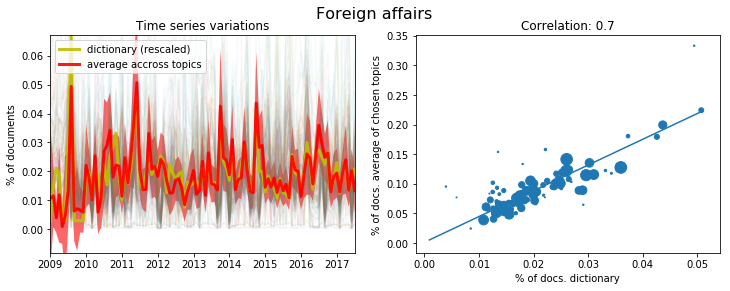

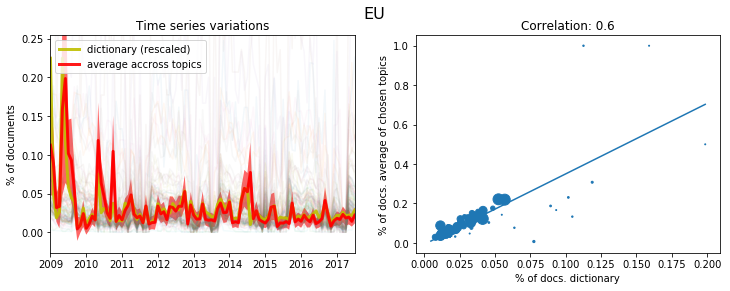

...

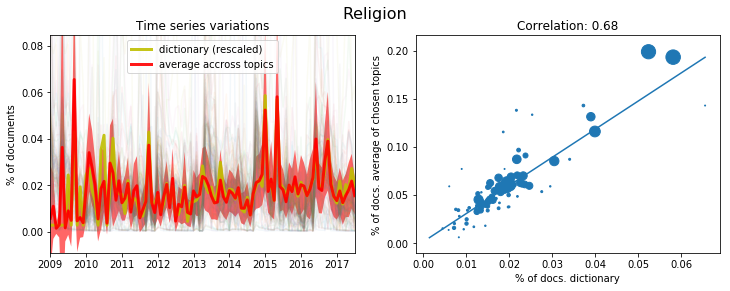

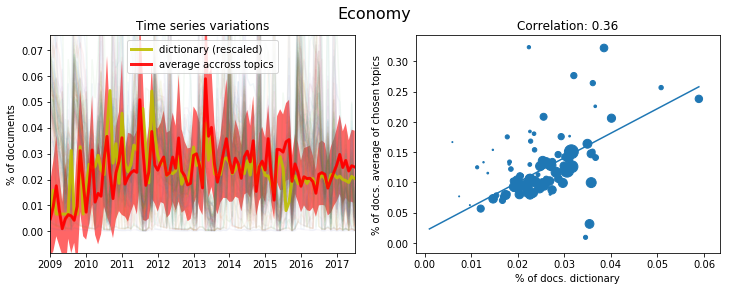

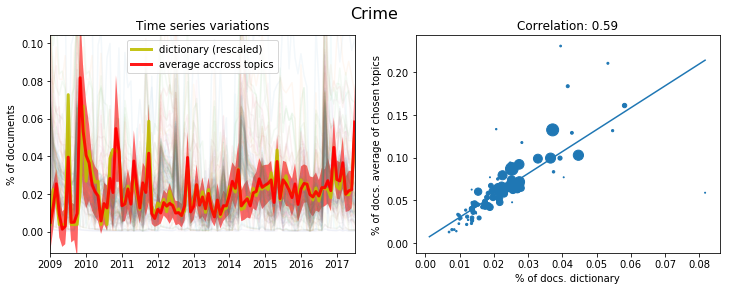

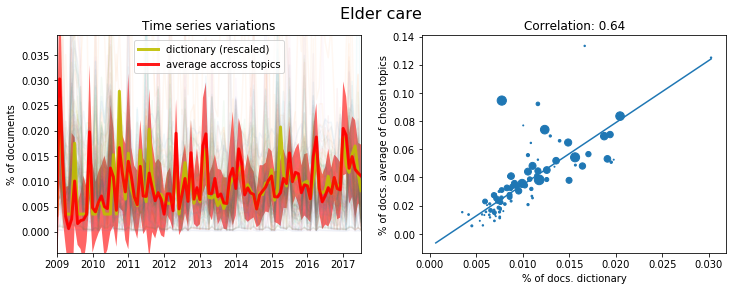

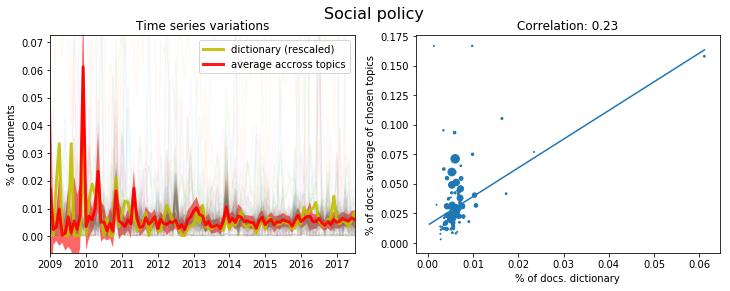

In [ ]:
timeseries_df = []
for i in range(15):
    groupdf = accepted_df[accepted_topics.topic_label==i]
    if len(groupdf)==0:
        continue
    r2,r2_abs,mae,mae_abs,mse,mse_abs,sum_abs,sum_ = correlate_average_time_series(groupdf,addendum='_accepted')
    d = {'r2':r2,'r2_abs':r2_abs,
                          'mae':mae,'mae_abs':mae_abs,'mse':mse,'mse_abs':mse_abs,'sum_abs':sum_abs,'sum':sum_
                          ,'topic':label,'topic_label':get_dic_name(label)}
    
    groupdf = lexicon_df[lexicon_df.topic_label==i]
    r2,r2_abs,mae,mae_abs,mse,mse_abs,sum_abs,sum_ = correlate_average_time_series(groupdf,addendum='_matches')
    d = {'r2':r2,'r2_abs':r2_abs,
                          'mae':mae,'mae_abs':mae_abs,'mse':mse,'mse_abs':mse_abs,'sum_abs':sum_abs,'sum':sum_
                          ,'topic':label,'topic_label':get_dic_name(label)}
    
    timeseries_df.append(d)
timeseries_df = pd.DataFrame(timeseries_df)
timeseries_df

### Regression Analysis
Dictionary category controls: 
			- Precision, Recall, 
			- Category size,  
			- N_words
			- Entropy of the category
			- Dictionary words entropy.
			- Dictionary co-occurrence strength.
				- Word co-occurrence ( semantic coherence)
				- Category Distinctiveness.

		Topic - level controls
			- Top word match (top + frex)
			- Top 5 docs
			- Predictive validity
			
			- Semantic coherence
			- Exclusivity

		Model controls
			- K. Control for number of topics. 
			- Model selection criterias.
			- Quantitative heuristics.
	Presentation - Visualization
		All plots should be only with Residuals from the full model controlling. 
		Visualizations:
			- Residuals from the category controls model. 
			- Residuals from extended model.

	Outcomes
		- Human Performance
		- Dictionary Weighted Precision
		- Recall, Accuracy.

In [ ]:
#list(lexicon_df.columns)[-25:]

In [ ]:
#list(lexicon_df.columns)

In [ ]:
#category_controls = []
model_controls = ['n_topics', # control for K topics.
    'best_predictive','best_predictive_top3','best_predictive_top5','best_predictive_eyeball', # pv
                 'selection_pv_inherit',
                  'selection_pv',#pv
                  'selection_qual','selection_quant','selection_quant_parsimonous','selection_quant_best' 
                  #selection
                 ]+measures
topic_controls = ['topic_label_doc',
                  'topic_frexlabel_doc',
                  'topword_n',
                  'topword_n_extend',
                  'topword_n_frex',
                  'topword_n_frex_extent',# manual inspections
                  'semantic_coherence_10','semantic_exclusivity_10',
                  'predictive_validity',
                  'predictive_validity_individual',
                  'predictive_validity_eyeball_individual'# 
                 ]
category_controls = ['n_words',
 'n_docs',
 'categorization_entropy',
 'word_entropy',
 'category_coherence_relative',
 'category_distinctiveness',
 'precision',
 'weighted_recall']
y_cols = ['human_performance','human_performance_frex','timeseries_correlation_robust','timeseries_correlation_individual','weighted_precision_frex','weighted_precision']

In [ ]:
#for col in topic_controls:
#    print(lexicon_df[col].apply(type).value_counts())
def is_finite(val):
    if type(val)==str:
        return False
    if np.isnan(val):
        return False
    if np.isfinite(val):
        return True
    return True

In [ ]:
#list(lexicon_df.columns[-45:])


In [ ]:
idx = lexicon_df[topic_controls+model_controls].apply(lambda x: sum(x.apply(is_finite))==len(x),axis=1)

In [ ]:
sum(idx)

101306

In [ ]:
lexicon_df[~lexicon_df.no_match_both][['frex_label','topword_label','accept','topmatch','match','match_frex']+y_cols+category_controls+topic_controls+model_controls].to_csv('regression_variables.csv',index=False)

In [ ]:
#! ls -sh 

In [ ]:
sample = lexicon_df[idx]
sample = sample[sample.semantic_coherence_10<0]

In [ ]:
# Filter so only matched topwords.

sample[y_cols+category_controls+topic_controls+model_controls].to_csv('regression_variables.csv')

In [ ]:
sum(sample.semantic_coherence_10<0),len(sample)

(101288, 101306)

In [ ]:
topic_controls = ['topic_label_doc',
              #    'topword_n',
                  'topword_n_extend',
             #     'topword_n_frex',
                  'topword_n_frex_extent',# manual inspections
                  'semantic_coherence_10','semantic_exclusivity_10',
            #      'predictive_validity',
            #      'predictive_validity_individual'# 
                 ]


In [ ]:
#sum()
#idx = np.isfinite(lexicon_df[topic_controls+model_controls]).sum(axis=1)

In [ ]:
len(sample)

101288

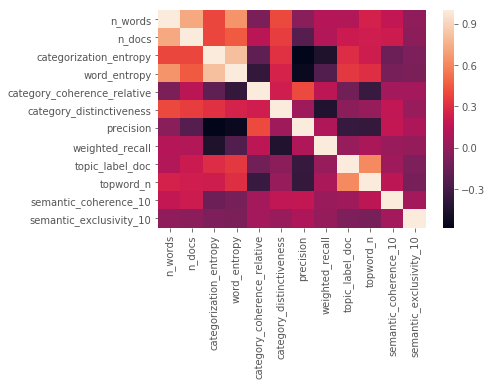

In [ ]:
sns.heatmap(sample[cols].corr())

In [ ]:

for col in model_controls[1:]: # 
    
    cols = category_controls+topic_controls 
    cols += model_controls[0:1] # control for no. of topics K
    cols+=[col] 
    X = sample[cols].values
    X = X.astype(float)
    y_col = y_cols[-1]
    y = sample[y_col].values
    import statsmodels.api as sm
    X = sm.add_constant(X)
    mod = sm.OLS(y,X)
    res = mod.fit()
    #print(res.summary(xname=['constant']+cols))
    print(col,res.tvalues[-1])

selection_pv_inherit 1.5665866205347103
selection_pv 0.29604710573660525
selection_qual -3.4092394914292137
selection_quant -0.8157748445441514
selection_quant_parsimonous 0.2667487248371183
selection_quant_best 2.0997415289697896
loglikelihood 4.615851992201444
arun_2010 -14.142318323735868
griffiths_2004 4.216973492019426
cao_juan_2009 -14.187568270504293


In [ ]:
## non of the selection schemes are significantly better if you control for K.

In [ ]:

for col in model_controls[1:]: # 
    
    cols = category_controls+topic_controls 
    #cols += model_controls[0:1] # control for no. of topics K
    cols+=[col] 
    X = sample[cols].values
    X = X.astype(float)
    y_col = y_cols[-1]
    y = sample[y_col].values
    import statsmodels.api as sm
    X = sm.add_constant(X)
    mod = sm.OLS(y,X)
    res = mod.fit()
    #print(res.summary(xname=['constant']+cols))
    print(col,res.tvalues[-1])

selection_pv_inherit 7.484726794992313
selection_pv 0.6045596492922113
selection_qual -18.60507429637327
selection_quant 27.198945884560196
selection_quant_parsimonous -11.845593093385089
selection_quant_best 2.2349208798579743
loglikelihood 18.510660278099614
arun_2010 -67.91118675019493
griffiths_2004 6.290790715076741
cao_juan_2009 -65.863697782599


In [ ]:
for col in y_cols:
    print(col,sample[col].min(),sample[col].max(),sample[col].median())

human_performance 0.0009939343637686622 0.9612890282849069 0.39157895700931644
weighted_precision 0.010513854470128816 0.9402186413494976 0.43479462004241065


In [ ]:
#res.summary()

In [ ]:
topic_controls

['topic_label_doc',
 'topword_n_extend',
 'topword_n_frex_extent',
 'semantic_coherence_10',
 'semantic_exclusivity_10',
 'predictive_validity_individual']

In [ ]:


cols = category_controls+topic_controls
X = sample[cols].values
X = X.astype(float)

y_col = y_cols[0]
y = sample[y_col].values
print(y.min(),np.median(y),y.max())
import statsmodels.api as sm
X = sm.add_constant(X)
mod = sm.OLS(y,X)

res = mod.fit()
print(res.summary(xname=['constant']+cols))


0.0009939343637686622 0.39157895700931644 0.9612890282849069
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                 2.669e+04
Date:                Sun, 31 Mar 2019   Prob (F-statistic):               0.00
Time:                        22:09:56   Log-Likelihood:                 69107.
No. Observations:              101288   AIC:                        -1.382e+05
Df Residuals:                  101273   BIC:                        -1.380e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

In [ ]:


cols = category_controls+topic_controls[3:] 
X = sample[sample.accept][cols].values
X = X.astype(float)

y_col = y_cols[0]
y = sample[sample.accept][y_col].values
print(y.min(),np.median(y),y.max())
import statsmodels.api as sm
X = sm.add_constant(X)
mod = sm.OLS(y,X)

res = mod.fit()
print(res.summary(xname=['constant']+cols))


** Frex versus top**:
Using the controls, it is actually a good supplement. 
However alone it is not good.

In [ ]:

## Design controls 

# Frex + Top , Frex, Top
## Combined they are good. But alone Top is much better than frex.
# Model selection. Model selection + K.
### Differentiating between iterations of the same K, or simply suggesting larger K. 

In [ ]:
#sample[y_col].median()

In [ ]:
groupdf = lexicon_df[lexicon_df.model_id.isin(set([list(best_models)[0]]))]

## recall
tp = sum(groupdf['hard_recall'])

fp = 1-(groupdf['hard_size'] * groupdf['hard_precision'])


In [ ]:
[col for col in lexicon_df.columns if 'hard' in col]

['hard_positives', 'hard_negatives', 'hard_size']

In [ ]:
 idx = (doc2hard==num)*1
        believed = dic_class_mat[topic_cat[num]]
     #   print(believed.shape,idx.shape,doc2hard.shape,doc2topic.shape)
        positives = believed.sum()
        true_positives = believed.dot(idx)
        negatives.append(sum(idx)-true_positives)
        hard_size.append(positives)
        recall.append(true_positives) # ## recall onle make sense if all accepted topics are added afterwards. 

In [ ]:
#groupdf.topmatch==groupdf.match

In [ ]:

def hard_assigned_performance(groupdf):
    tp = groupdf.hard_positives.sum()
    
    fneg = groupdf.hard_negatives.sum()
    hard_size = groupdf.hard_size.values[0]
    
    recall = tp/hard_size
    
    prec = tp/(tp+fneg)
    f1 = (2*prec*recall)/(prec+recall)
    return pd.DataFrame([{'hard_precision':prec,'hard_recall':recall,'hard_f1':f1}])
#for b in ['match','topmatch']:#,'accept']:
    
#    print(groupdf[groupdf[b]].groupby('topword_label').apply(hard_assigned_performance).apply(lambda x: x[2]).sort_values())

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


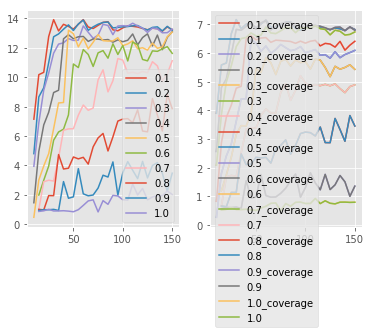

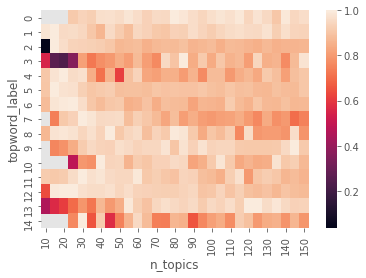

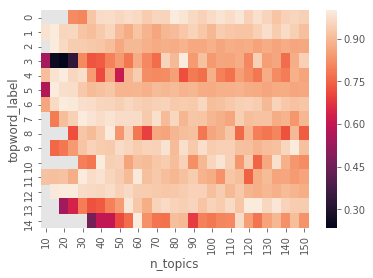

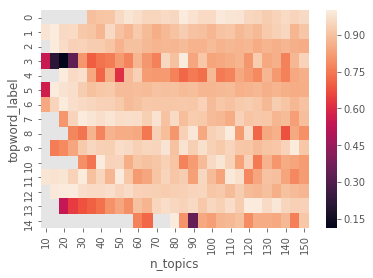

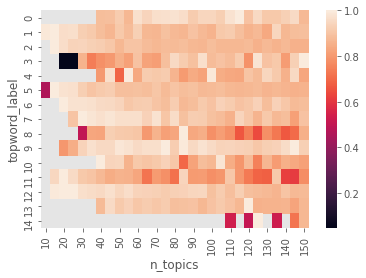

...

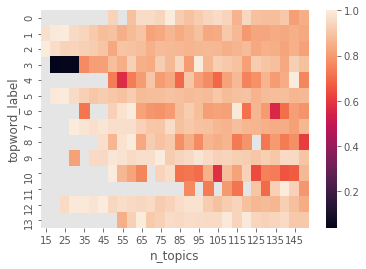

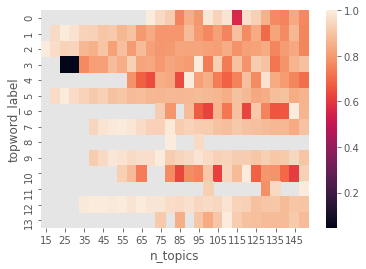

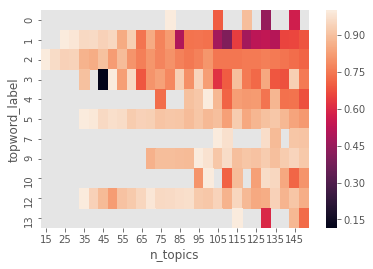

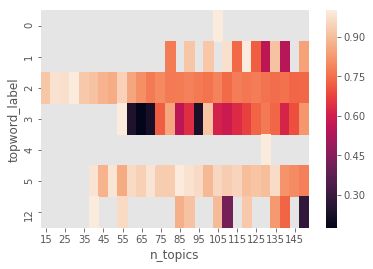

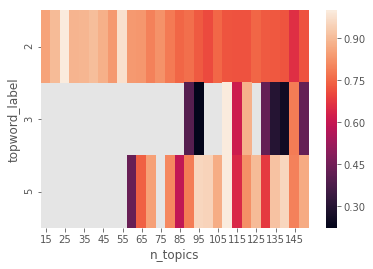

In [ ]:
fig,axes=plt.subplots(1,2)
for cut in np.arange(0.1,1.1,0.1):
    cut = round(cut,1)
    temp_df = lexicon_df[(lexicon_df.topword_n>=cut) & lexicon_df.match]#.groupby(['model_id','topword_label']).apply(hard_assigned_performance)
    temp = temp_df.groupby(['n_topics','model_id','topword_label']).apply(hard_assigned_performance).reset_index()
    f1_peak = temp.groupby(['n_topics','topword_label']).hard_f1.max().unstack().T
    f1_peak_norm = f1_peak.values
    f1_peak_norm = (f1_peak.T/f1_peak.max(axis=1)).T
    ax = axes[0]
    ax.plot(f1_peak_norm.sum(axis=0),label=cut)
    ax = axes[1] 
    ax.plot(f1_peak.sum(axis=0),label='%r_coverage'%cut)
    ax.plot(f1_peak.fillna(0).sum(axis=0),label=cut)
    plt.figure()
    sns.heatmap((f1_peak.T/f1_peak.max(axis=1)).T)
axes[0].legend()
axes[1].legend()
#sns.heatmap(temp.groupby(['n_topics','topword_label']).hard_f1.max().unstack().T)


In [ ]:
lexicon_df[lexicon_df.topmatch].groupby(['n_topics','model_id','topword_label']).apply(hard_assigned_performance)

In [ ]:
temp = groupdf[groupdf[b]].groupby('topword_label').apply(hard_assigned_performance).apply(lambda x: x[2]).reset_index()
temp['category'] = temp.topword_label.apply(get_dic_name)
temp.columns = ['topword_label','recall','category']

In [ ]:
temp.sort_values('recall')

,topword_label,recall,category
0,0,0.254496,Culture
3,3,0.284812,Foreign affairs
9,13,0.285208,Elder care
7,8,0.353757,Taxes
6,7,0.378683,Employment
1,1,0.401363,Environment
2,2,0.432544,Education
8,12,0.463228,Crime
4,5,0.478029,Health
5,6,0.517657,Immigration


In [ ]:
## Main criticism about the Dictionary, is omitted word bias, i.e. what is the recall?  
## Interestingly the "Natural categories" have the same problem? 
### Is this cluster really capturing everything we consider environmental, or is it just a part of it?
## When looking at the recall of each model we see that 

In [ ]:
### Add Another way of assigning the Topic to category, maybe 1/k i.e. alpha cutoff.
### Compare to human labels instead of dictionaries.

In [ ]:
m2t_best = lexicon_df.groupby(['n_topics','model_id','best_label']).weighted_precision_best.max()

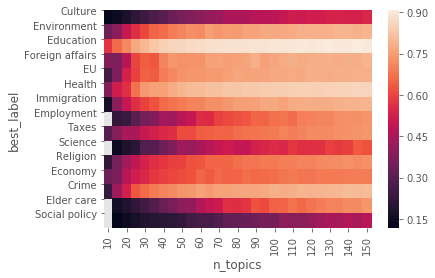

In [ ]:
sns.heatmap(m2t_best.reset_index().groupby(['n_topics','best_label']).mean()['weighted_precision_best'].unstack().T)
plt.yticks(range(15),[get_dic_name(i) for i in range(15)],rotation=0);

## Investigating potential explanation for the correlation between the average estimate and the dictionary
- Related to the Performance of the Dictionary?
- Related to the base probability of each class.

Performance:
- load performance and make scatter plot
- merge with probability of each class.


In [ ]:
temp_df = pd.DataFrame(pol_df.topic_class.value_counts()).reset_index()
temp_df['frac'] = temp_df['topic_class']/temp_df.topic_class.sum()
temp_df = temp_df.drop('topic_class',axis=1)
temp_df.columns = ['topic','frac']
timeseries_df = timeseries_df.merge(temp_df)


In [ ]:
pol_df.to_csv('base_dataframe.csv',index=False)

In [ ]:

timeseries_df = timeseries_df.merge(performance,on='topic')

In [ ]:
y_col = 'r2'
x_cols = ['accuracy_w','frac','interact']
timeseries_df['interact'] = timeseries_df['accuracy_w']*timeseries_df.frac
y = timeseries_df[y_col].values
X = timeseries_df[x_cols].values
import statsmodels.api as sm
X = sm.add_constant(X)
mod = sm.OLS(y,X)

res = mod.fit()
print(res.summary(xname=['constant']+x_cols,yname='time series r2'))


                            OLS Regression Results                            
Dep. Variable:         time series r2   R-squared:                       0.222
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.044
Date:                Mon, 17 Dec 2018   Prob (F-statistic):              0.412
Time:                        19:49:02   Log-Likelihood:                 5.9219
No. Observations:                  15   AIC:                            -3.844
Df Residuals:                      11   BIC:                            -1.012
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
constant      -3.5492      2.642     -1.343      0.2

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1394: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  "anyway, n=%i" % int(n))


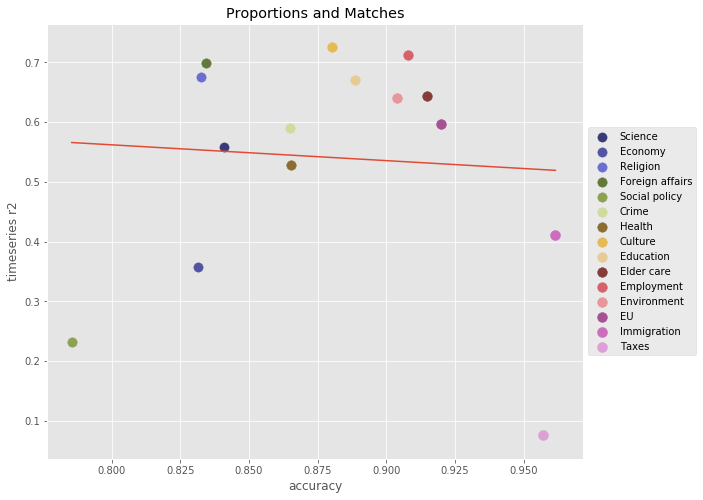

In [ ]:
plt.style.use('ggplot')
def linear_func(x, a, b):
    return a*x + b
from scipy.optimize import curve_fit
def fit_function(x,y,func=linear_func,plot=False):
    popt, pcov = curve_fit(func, x, y)
    xlim = np.linspace(min(x),max(x),50)
    fit_y = func(xlim,*popt)
    return xlim,fit_y

def plot_dictionary_stats(df,funcx,funcy,xlabel='',ylabel='',fitline = True,sort_column='n_docs',hue='topic_name',title='Proportions and Matches'):
    fig = plt.figure(figsize=(12,8))
    ax = plt.subplot(111)
    cmap = plt.cm.get_cmap('tab20b', 15)
    #xcol,ycol = 'n_docs','n_accepted'
    max_ =df[sort_column].max()
    
    for num,(label,tempdf) in enumerate(df.sort_values(sort_column).groupby(hue,sort=False)):
        color = cmap(num/15)
        size = tempdf[sort_column].values
        ax.scatter(funcx(tempdf),funcy(tempdf),label=label,c=color,s=(tempdf[sort_column].values[0]/max_)*100)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    # plot linear expectancy
    if fitline:
        xlim,ypred = fit_function(funcx(df).values,funcy(df).values)
        plt.plot(xlim,ypred)
    #x,y = matches[xcol],matches[ycol]
    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    return ax

plot_dictionary_stats(timeseries,funcx=lambda x: x.accuracy_w,funcy=lambda x: x.r2,sort_column='accuracy',xlabel='accuracy',ylabel='timeseries r2',
                     )
#plt.scatter(timeseries_df.accuracy_w,timeseries_df.r2)
#plt.scatter(timeseries_df.frac,timeseries_df.r2_abs)

this shows that this can not be explained by dictionary quality.

In [ ]:
def quantify_de_ascending(x,y):
    asc = []
    sort_idx = x.argsort()
    y = y[sort_idx]
    for idx in range(len(x)):
        val = y[idx]
        larger = sum(val<y[idx+1:])
        length = len(y)-idx
        if idx>0:
            larger += sum(y[:idx]<val)
            length += idx
        asc.append(larger/length)
    return sum(asc)/len(x)
x,y = timeseries_df.accuracy_w.values,timeseries_df.r2.values


0.47111111111111115

In [ ]:
x,y = timeseries_df.accuracy_w.values,timeseries_df.accuracy.values
quantify_de_ascending(x,y)

0.8355555555555558

In [ ]:
#fig,axes = plt.subplots(15,15,sharex=True,sharey=True)
#for i in range(15):
#    tempdf = lexicon_df[lexicon_df['topic_label'] == i]
#    for j in range(15):
#        s = tempdf['lexicon_doc_fraction_%d'%j]
#        ax = axes[i][j]
#        if j == 0:
#            
#            ax.set_ylabel(get_dic_name(i))
#        
#        ax.hist(s.values,bins=np.linspace(0,1,20),density=True)
#        if i==14:
#            ax.set_xlabel(get_dic_name(j))
#fig.set_size_inches(15,15)

### Relation between Matches and Proportions and Entropy

In [ ]:

matches = lexicon_df.topic_label.value_counts()

# counting how many times Dictionary words are discovered in the Top 10
discovered = []
for i in range(15):
    d = {'topic':float(i),'name':get_dic_name(i)}
    d['n_top_matches'] = sum(lexicon_df['lexicon_overlap_10_%d'%i]>0)
    discovered.append(d)
discovered = pd.DataFrame(discovered)
discovered.sort_values('n_top_matches')

,n_top_matches,name,topic
13,15839,Elder care,13.0
0,17772,Culture,0.0
14,17874,Social policy,14.0
9,18907,Science,9.0
5,24180,Health,5.0
8,27887,Taxes,8.0
10,28591,Religion,10.0
4,35538,EU,4.0
11,35595,Economy,11.0
12,41573,Crime,12.0


In [ ]:
# size and n_matches

## counting exlusive topics of the top 10
matches = pd.DataFrame(matches)
matches = matches.reset_index()

matches.columns = ['topic','n_matches']
matches['name'] = matches.topic.apply(get_dic_name)


accepted =  lexicon_df[lexicon_df['topic_label_doc']==1.0].topic_label.value_counts()
accepted = pd.DataFrame(accepted)
accepted = accepted.reset_index()
accepted.columns = ['topic','n_accepted'] 

# COuting original proportions
class_count = pd.DataFrame(pol_df.topic_class.value_counts()).reset_index()
class_count.columns = ['topic','n_docs']
matches = matches.merge(class_count,on='topic')
matches = matches.merge(accepted,on='topic')

matches = matches.merge(discovered[['topic','n_top_matches']],on='topic')

In [ ]:
matches.sort_values('n_docs').head()

,topic,n_matches,name,n_docs,n_accepted,n_top_matches
14,14.0,2547,Social policy,1251,143,17874
13,9.0,5730,Science,1604,593,18907
11,0.0,12525,Culture,1717,4577,17772
12,13.0,8772,Elder care,1732,5659,15839
4,7.0,26227,Employment,2211,5793,61417


** The science and social policy class will be a good starting point for Junkiness of an accepted topic, since they are in there but rarily get a dedicated topic**

One should look at how many times it is located in a junk topic, where more than one Dictionary category is mathced in the top, and then see when it is not noticed.


/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/snorre/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/snorre/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


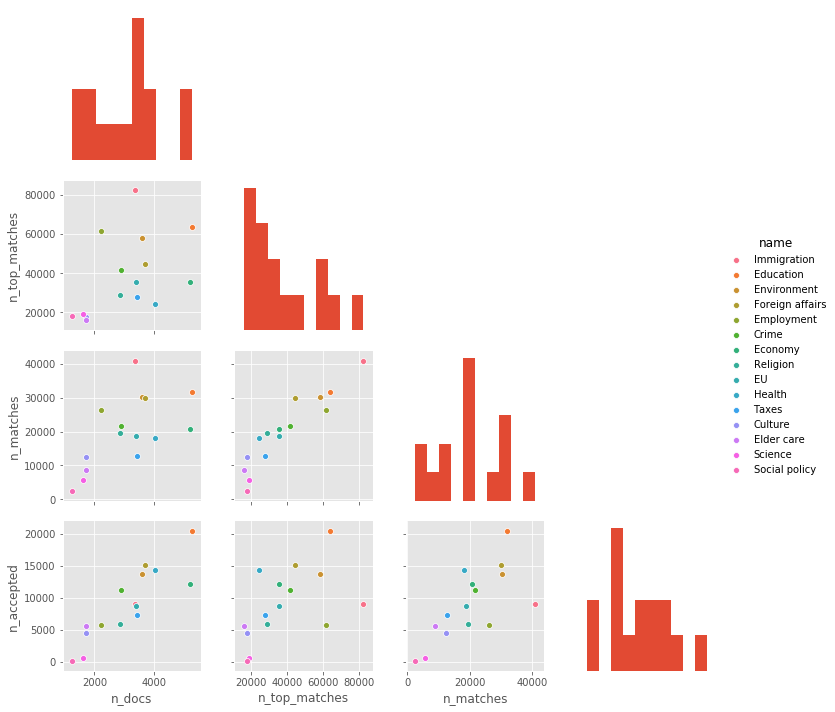

In [ ]:
cols = ['n_docs','n_top_matches','n_matches','n_accepted','name']
ax = sns.pairplot(matches[cols],hue='name')
for i,j in list(zip(*np.triu_indices(4))):
    ax.axes[i,j].set_visible(False)
for num,ai in enumerate(ax.diag_axes):
    ai.hist(matches[cols[num]])

#### Junk topics as a function of topic proportions
Looking at the scatter plot: n_top_matches against n matches, we can see that small topics has a hard time getting a seemingly dedicated topic, resulting in socalled "junk" / "hogde podge" / "noise" topics. 



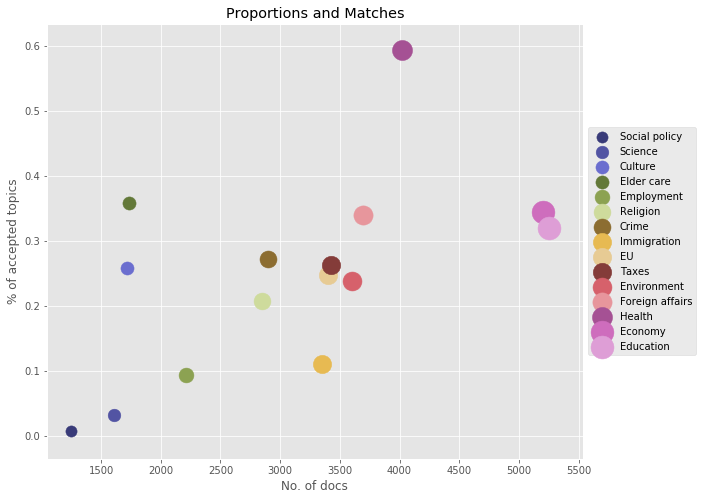

In [ ]:
fig = plt.figure(figsize=(12,8))
ax = plt.subplot(111)
cmap = plt.cm.get_cmap('tab20b', 15)
for num,(label,tempdf) in enumerate(matches.sort_values('n_docs').groupby('name',sort=False),):
    color = cmap(num/15)
    ax.scatter(tempdf.n_docs,tempdf.n_accepted/tempdf.n_top_matches,label=label,c=color,s=tempdf.n_docs.values[0]/10)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
ax.set_title('Proportions and Matches')
ax.set_xlabel('No. of docs')
ax.set_ylabel('% of accepted topics')

# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

### Acceptance is related to Size of the True Topic. 
The relation between number of documents in the true topic and the number of accepted Topics (both alone in the top 10 words and top5 documents) from the model. The outliers: Immigration, Health, Elder Care, and Culture, gives us clue to specific traits of these topics, that also affect their "Discoverability" in such a model.

** TODO **: break it down on K-topics. Locating the scale of each topic. 

The rest is located in socalled junk topics, and beyond this analysis, completely under the radar.

**TODO**: Analyzing: Under the Radar: 
For each topic model, see if the topics not located in the top, are distributed randomly accross the other located topics, or subsumed within a socalled junk topic, that is not capturing any of the Located categories.

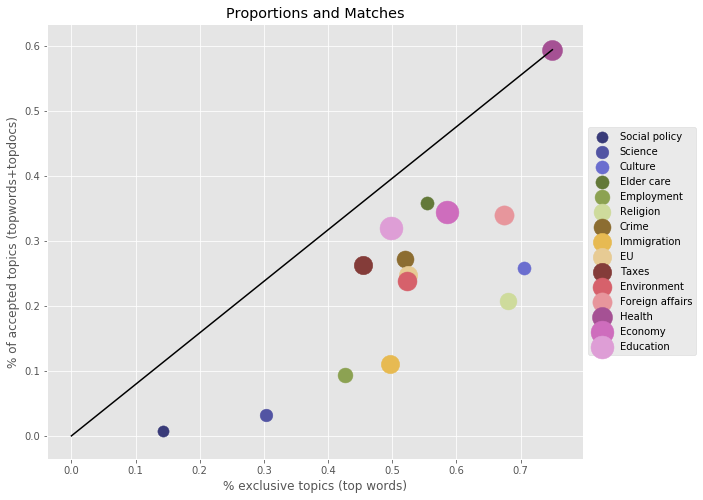

In [ ]:
#plt.scatter(matches.n_docs,matches.n_matches)
fig = plt.figure(figsize=(12,8))
ax = plt.subplot(111)
cmap = plt.cm.get_cmap('tab20b', 15)
for num,(label,tempdf) in enumerate(matches.sort_values('n_docs').groupby('name',sort=False),):
    color = cmap(num/15)
    ax.scatter(tempdf.n_matches/tempdf.n_top_matches,tempdf.n_accepted/tempdf.n_top_matches,label=label,c=color,s=tempdf.n_docs.values[0]/10)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
ax.set_title('Proportions and Matches')
ax.set_xlabel('% exclusive topics (top words)')
ax.set_ylabel('% of accepted topics (topwords+topdocs)')

# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# plot linear relation.
plt.plot(np.linspace(0,max(matches.n_matches/matches.n_top_matches)),np.linspace(0,max(matches.n_accepted/matches.n_top_matches)),color='k')
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))





In relation to the model, they are weak in terms of sheer size (granularity imposed by the model), and probably also in terms of co-occurence strength and consistency. So we get this view that some topics even if they are big, will not have so many exclusive topics, and also underestimated, 

**TODO:** Compare this analysis with co-occurence measure of the dictionaries, entropy (i.e. the broadness of the dist / do they have very common words) and the performance. 



#### Co-occurrence strength
- 

In [ ]:
#doc2doc = cat_mat.T.dot(cat_mat)

In [ ]:
cat2co_occurrence = []
for num,idx in enumerate(dictionaries_s):
    idx = np.array(list(idx))
    cat_mat = real_bows[:,idx]
    cat_mat = (cat_mat>0)*1.0
    w2w = cat_mat.T.dot(cat_mat)
    semantic_coherence = (w2w/w2w[np.arange(len(w2w)),np.arange(len(w2w))]).sum() / len(w2w)
    
    cat2co_occurrence.append(semantic_coherence)
    
cat2semantic_coherence = pd.DataFrame(cat2co_occurrence,columns=['semantic_coherence'],index=[get_dic_name(i) for i in range(15)])    

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
doc2doc = cosine_similarity(real_bows[:,0:30000])

In [ ]:
1-sklearn.metrics.pairwise_distances((cat2word_frac*idf),metric='cosine')

In [ ]:
for idx in dic_class_mat:
    cat_mat = real_bows[idx==1,0:30000]
    
    
    break
#doc2doc.shape
from sklearn.metrics.pairwise import cosine_similarity
doc2doc = cosine_similarity(real_bows[:,0:30000])
## weight the tf with the entropy.

doc2doc = cosine_similarity(real_bows[:,0:30000])

In [ ]:
import scipy.stats
def normalize_entropy(series):
    result = scipy.stats.entropy(((series.T/series.sum(axis=1)).T).T)
    return result[0]
def get_dictionary_entropy(dictionary):
    return normalize_entropy(real_bows[:,np.array(list(dictionary))].sum(axis=0))
temp = []
for num,dic in enumerate(dictionaries_s):
    idx = np.array(list(dic))
    counts = real_bows[:,idx].sum(axis=0)
    most_ids = idx[np.argsort(np.asarray(counts)[0])[-5:]]
    print(num,get_dic_name(num))
    for most_id in most_ids:
        most_prevalent = Index[most_id]
        print(most_prevalent,end=' ')
    print()
    fracs = (np.asarray(counts)/real_bows.shape[1])[0]
    fracs = np.sort(fracs)[::-1]
    d = {'topic':num,'entropy':normalize_entropy(counts)}
    
    for top in [1,2,3,5,10,20]:
        d['topfrac_%d'%top] = fracs[top]
        d['topfracmean_%d'%top] = np.mean(fracs[:top])
    temp.append(d)

0 Culture
roskilde sang musik oplevelse kultur 
1 Environment
omstilling grøn verdens grønne verden 
2 Education
folkeskolen elever forældre skole børn 
3 Foreign affairs
soldater fred krig usa kamp 
4 EU
europæiske europa lande fælles eu 
5 Health
patienter syge sundhed region behandling 
6 Immigration
støjberg asylansøgere flygtninge df dansk 
7 Employment
arbejdsmarkedet jobs arbejder job arbejde 
8 Taxes
skattely afgifter skatten skattelettelser skat 
9 Science
gymnasiet uddannelser viden studerende uddannelse 
10 Religion
muslimer værdier tro demokrati frihed 
11 Economy
små udvikling virksomheder vækst arbejdspladser 
12 Crime
vold kriminelle tryghed hårdt politiet 
13 Elder care
omsorg pension varme hænder ældre 
14 Social policy
fattigdom ulighed gaden udsatte sociale 


In [ ]:
entropy_topics = pd.DataFrame(temp)
matches = matches.merge(entropy_topics,on='topic')

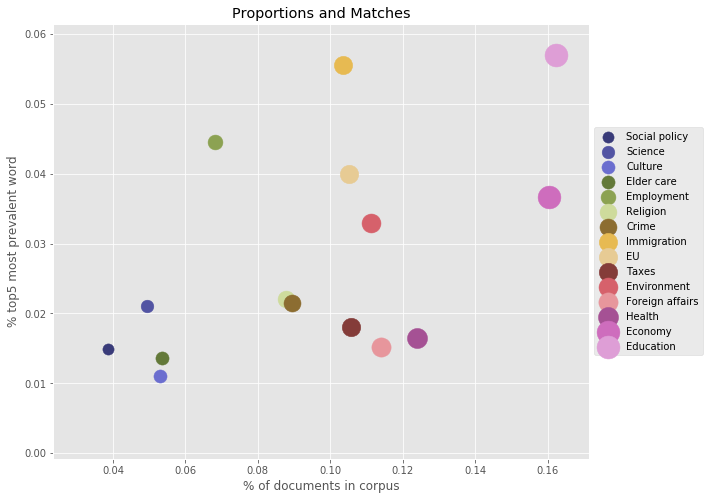

In [ ]:
#plt.scatter(matches.n_docs,matches.n_matches)
fig = plt.figure(figsize=(12,8))
ax = plt.subplot(111)
cmap = plt.cm.get_cmap('tab20b', 15)
for num,(label,tempdf) in enumerate(matches.sort_values('n_docs').groupby('name',sort=False),):
    color = cmap(num/15)
    ax.scatter(tempdf.n_docs/real_bows.shape[1],tempdf.topfracmean_5,label=label,c=color,s=tempdf.n_docs.values[0]/10)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
ax.set_title('Proportions and Matches')
ax.set_xlabel('% of documents in corpus')
ax.set_ylabel('% top5 most prevalent word')

## plot linear expectancy
#plt.plot(np.linspace(0,0.25),np.linspace(0,0.025))
# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))





**The shows that both the Immigration and Education dictionary has highly prevalent words, which will result in many Plausible candidates.  See results below. Variations (education vs Immigration) might be a function of Dictionary Co-occurence.

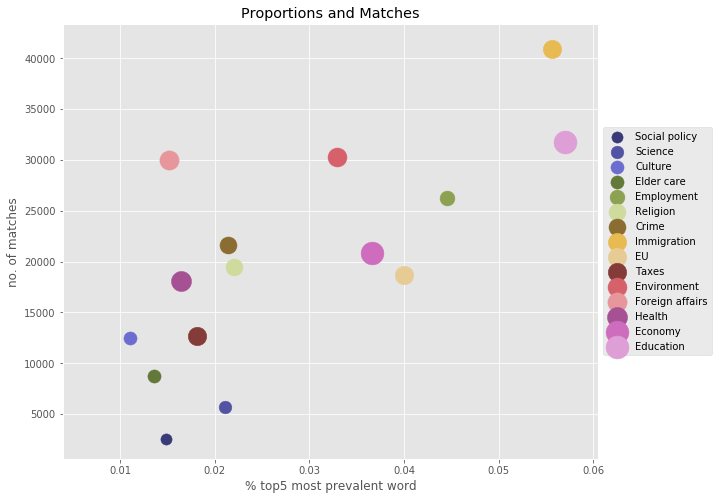

In [ ]:
#plt.scatter(matches.n_docs,matches.n_matches)
fig = plt.figure(figsize=(12,8))
ax = plt.subplot(111)
cmap = plt.cm.get_cmap('tab20b', 15)
for num,(label,tempdf) in enumerate(matches.sort_values('n_docs').groupby('name',sort=False),):
    color = cmap(num/15)
    ax.scatter(tempdf.topfracmean_5,tempdf.n_matches,label=label,c=color,s=tempdf.n_docs.values[0]/10)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
ax.set_title('Proportions and Matches')
ax.set_xlabel('% top5 most prevalent word')
ax.set_ylabel('no. of matches')

## plot linear expectancy
#plt.plot(np.linspace(0,0.25),np.linspace(0,0.025))
# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))





## Analysis of Bias 
** Performance ** 
- Simple Distribution of Fracs.
- Simple distribution of weighed fracs from human labels.
- Getting the proportions right:
    - Which is biggest according to the model.
    - Which is biggest at certain time periods.
- 

** Diff Performance **
- Performance accross Topics.
- Performance accross Time. 
    - Diff Frac. Boxplot
    - Time series. 
- Performance accross Parties.
    - Diff frac. Boxplot.


In [ ]:
#accepted_topics.app

In [ ]:
! mkdir output/bias

In [ ]:
#accepted_df = accepted_df.drop('Social policy',axis=1)

In [ ]:
accepted_df.shape

(84741, 963)

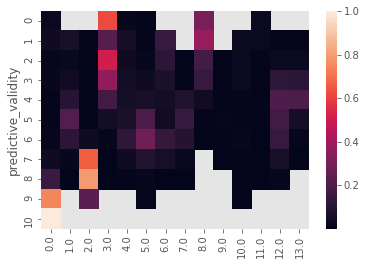

In [ ]:
pv_tp = accepted_df.groupby('predictive_validity').topic_label.apply(lambda x: x.value_counts()).unstack()
sns.heatmap((pv_tp.T/pv_tp.sum(axis=1)).T)

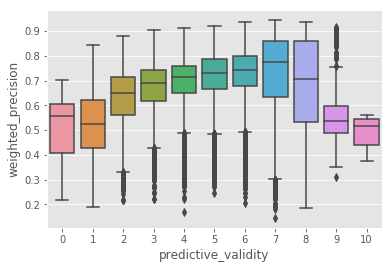

In [ ]:
sns.boxplot(x='predictive_validity',y='weighted_precision',data=accepted_df)#.groupby('predictive_validity_eyeball')

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


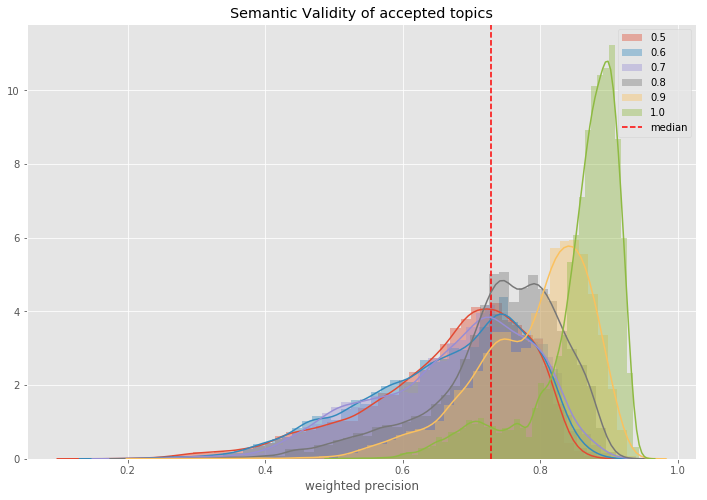

In [ ]:
fig,ax = plt.subplots(1)

for top_match,groupdf in accepted_df.groupby('topic_label_frac_extent'):
    
    sns.distplot(groupdf.weighted_precision,axlabel=False,ax=ax,label=str(top_match))

plt.style.use('ggplot')
ylim = ax.get_ylim()
plt.vlines(accepted_df.weighted_precision.median(),*ax.get_ylim(),label='median',linestyles='--',color='r')
ax.set_ylim(*ylim)
ax.figure.set_size_inches(12,8)
ax.set_xlabel('weighted precision')
plt.title('Semantic Validity of accepted topics')
plt.legend()
plt.savefig('output/bias/weighted_precision_grouped.png')

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


The median bias is 0.729


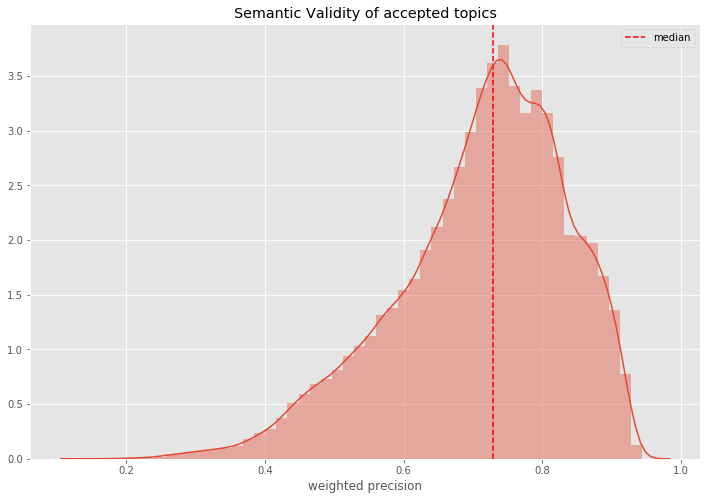

In [ ]:
fig,axes = plt.subplots(1)
ax = axes    
sns.distplot(accepted_df.weighted_precision,axlabel=False,ax=ax)

plt.style.use('ggplot')
ylim = ax.get_ylim()
plt.vlines(accepted_df.weighted_precision.median(),*ax.get_ylim(),label='median',linestyles='--',color='r')
ax.set_ylim(*ylim)
ax.figure.set_size_inches(12,8)
ax.set_xlabel('weighted precision')
plt.title('Semantic Validity of accepted topics')
plt.legend()
plt.savefig('output/bias/weighed_precision.png')
print('The median bias is %.3f'%(accepted_df.weighted_precision.median()))

## Differential Bias

In [ ]:

col = 'lexicon_doc_fraction_%d'
to_col = make_topic2col(col,range(len(party_dummy.columns)),index=False)
accepted_topics['bias'] = accepted_topics.lookup(range(len(accepted_topics)),accepted_topics.topic_label.apply(lambda x: to_col[int(x)]).values)

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


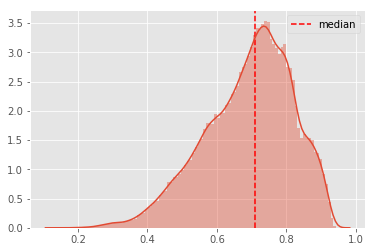

In [ ]:
ax = sns.distplot(accepted_topics.bias,bins=100,axlabel=False,)
ylim = ax.get_ylim()
plt.vlines(accepted_topics.bias.median(),*ax.get_ylim(),label='median',linestyles='--',color='r')
ax.set_ylim(*ylim)
plt.legend()

## Diff Performance accross topics

In [ ]:
mean_bias = accepted_df.groupby('topic_label').weighted_precision.median().sort_values()

In [ ]:
accepted_df['topic_name'] = accepted_df.topic_label.apply(get_dic_name)

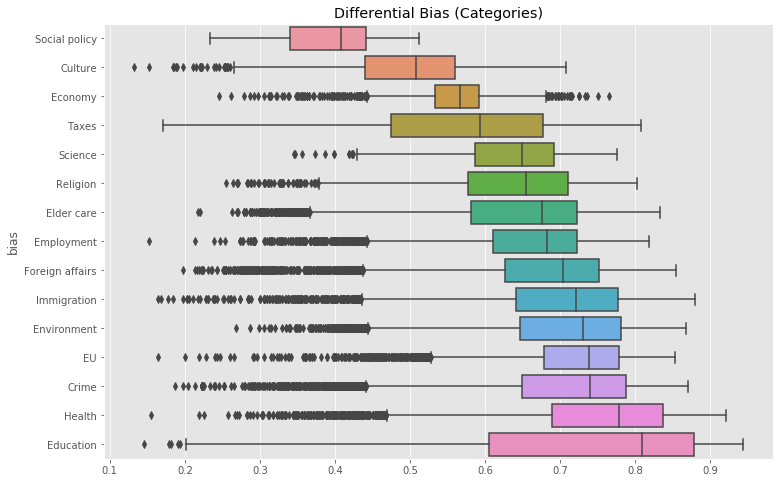

In [ ]:
plt.figure(figsize=(12,8))

sns.boxplot(y='topic_name',x='weighted_precision',data = accepted_df,order=map(get_dic_name,mean_bias.index))
plt.xlabel('')
plt.title('Differential Bias (Categories)')
plt.ylabel('bias')
plt.savefig('output/bias/diff_bias_categories.png')

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


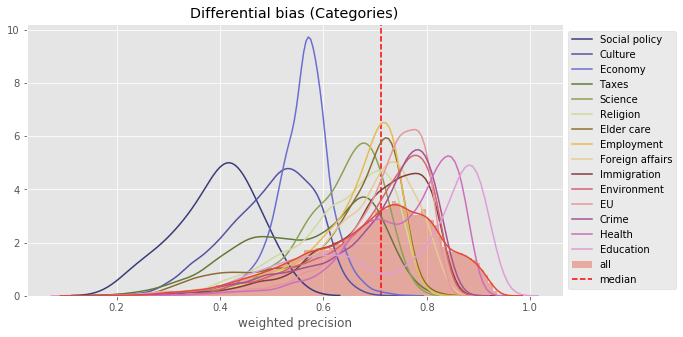

In [ ]:
fig,ax = plt.subplots()
cmap = plt.cm.get_cmap('tab20b', 15)

for num,i in enumerate(mean_bias.index):
    tempdf = accepted_df[accepted_df.topic_label==i]
    sns.distplot(tempdf.weighted_precision,ax=ax,bins=10,hist=False,axlabel=False,label=get_dic_name(i),color=cmap(num/15))
    #ylim = ax.get_ylim()
#plt.vlines(accepted_topics.bias.median(),*ax.get_ylim(),label='median',linestyles='--',color='r')
#ax.set_ylim(*ylim)
fig.set_size_inches(12,5)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
sns.distplot(accepted_df.weighted_precision,bins=100,axlabel=False,ax=ax,label='all')
# Put a legend to the right of the current axis----------
ylim = ax.get_ylim()
plt.vlines(accepted_df.weighted_precision.median(),*ax.get_ylim(),label='median',linestyles='--',color='r')
ax.set_ylim(*ylim)
plt.title('Differential bias (Categories)')
ax.set_xlabel('weighted precision')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig('output/bias/diff_bias_categories_dist.png')

In [ ]:
## Diff bias Parties and Temporal

In [ ]:
#list(lexicon_df.columns)

In [ ]:
accepted_df = lexicon_df[lexicon_df.accept].reset_index()

139200

In [ ]:
def make_topic2col_diff2(column,vals,index=True):
    return {(val,i):column%(val,i) for val in vals for i in range(15)}
to_col = make_topic2col_diff2('diffential_fraction_p%d_%d',range(len(party_dummy.columns)))
def make_diff_variable(df,diff_column,n_vals,new_name):
    
    to_col = make_topic2col_diff2(diff_column,range(n_vals))
    for diff_col in range(n_vals):  
        col_index = df.topword_label.apply(lambda x: to_col[(diff_col,int(x))]).values
        df[new_name+'_%d'%diff_col] = df.lookup(range(len(df)),col_index)
    return df
diff_column = 'diffential_fraction_p%d_%d'
new_name = 'party_bias'
diff_columns = party_dummy.columns
lexicon_df = make_diff_variable(lexicon_df,diff_column,len(diff_columns),new_name)


In [ ]:
## variance score.
#lexicon_df['weighted_precision'] / lexicon_df.

In [ ]:
#lexicon_df['party_bias_

In [ ]:
#party2block


In [ ]:
translater = {'Alternativet': 'ALT',
 'Dansk Folkeparti': 'DF',
 'Det Konservative Folkeparti': 'K',
 'Enhedslisten': 'EL',
 'Fremskridtspartiet': 'Z',
 'Kristendemokraterne': 'KD',
 'Liberal Alliance': 'LA',
 'Radikale Venstre': 'RV',
 'Socialdemokratiet': 'S',
 'Socialistisk Folkeparti': 'SF',
 'Venstre': 'V'}

party2color = {'ALT': [0.16470588235294117, 0.5686274509803921, 0.2196078431372549],
 'DF': [0.9607843137254902, 0.8156862745098039, 0.25098039215686274],
 'EL': [0.9372549019607843, 0.5019607843137255, 0.10196078431372549],
 'KD': [0.5568627450980392, 0.5411764705882353, 0.4627450980392157],
 'K': [0.6313725490196078, 0.7372549019607844, 0.1568627450980392],
 'LA': [0.13333333333333333, 0.7843137254901961, 0.8196078431372549],
 'RV': [0.4470588235294118, 0.19607843137254902, 0.5019607843137255],
 'S': [0.7019607843137254, 0.15294117647058825, 0.13333333333333333],
 'SF': [0.8745098039215686, 0.0392156862745098, 0.47058823529411764],
 'V': [0.13725490196078433, 0.25882352941176473, 0.38823529411764707]}

In [ ]:
# 
in_parties = [num for num,p in enumerate(party_dummy.columns) if p not in set(['Kristendemokraterne','Fremskridtspartiet'])]
party2block['KF'] = 'R'
party2block['SD'] = 'L'
in_parties = sorted(in_parties,key=lambda x: party2block[translater[party2idx[x]]])

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


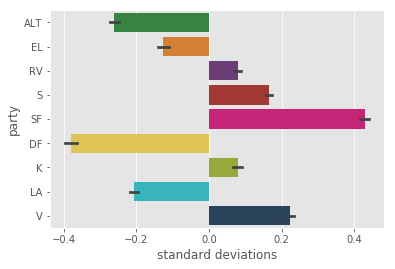

In [ ]:
variance_party = lexicon_df[['party_bias_%d'%num for num in in_parties]].values
normed_score = ((variance_party.T - variance_party.mean(axis=1))/variance_party.std(axis=1)).T

temp = pd.DataFrame(normed_score[lexicon_df.accept.values],columns=[translater[party2idx[num]] for num in in_parties]).stack().reset_index()
temp.columns = ['index','party','deviation']

sns.barplot(y='party',x='deviation',data=temp,palette=[party2color[translater[party2idx[num]]] for num in in_parties])
plt.xlabel('standard deviations')
plt.savefig('output/bias/diff_bias_parties_deviations.png')

In [ ]:
def make_topic2col_diff2(column,vals,index=True):
    return {(val,i):column%(val,i) for val in vals for i in range(15)}
to_col = make_topic2col_diff2('diffential_fraction_p%d_%d',range(len(party_dummy.columns)))
def make_diff_variable(df,diff_column,n_vals,new_name):
    
    to_col = make_topic2col_diff2(diff_column,range(n_vals))
    for diff_col in range(n_vals):  
        col_index = df.topword_label.apply(lambda x: to_col[(diff_col,int(x))]).values
        df[new_name+'_%d'%diff_col] = df.lookup(range(len(df)),col_index)
    return df
diff_column = 'diffential_fraction_t%d_%d'
new_name = 'temporal_bias'
diff_columns = year_dummy.columns
lexicon_df = make_diff_variable(lexicon_df,diff_column,len(diff_columns),new_name)


In [ ]:
lexicon_df.columns[-15:]

Index(['party_bias_2', 'party_bias_3', 'party_bias_4', 'party_bias_5',
       'party_bias_6', 'party_bias_7', 'party_bias_8', 'party_bias_9',
       'party_bias_10', 'temporal_bias_0', 'temporal_bias_1',
       'temporal_bias_2', 'temporal_bias_3', 'temporal_bias_4',
       'temporal_bias_5'],
      dtype='object')

In [ ]:
#normed_score[lexicon_df.accept.values].shape

In [ ]:
#temp.groupby('year').deviation.mean()

## Differential bias topic

In [ ]:
lexicon_df['topword_label'] = pd.Categorical(lexicon_df.topword_label)

In [ ]:
mid = lexicon_df[lexicon_df.accept].model_id.value_counts().index[-300]
groupdf = lexicon_df[lexicon_df.model_id==mid]
groupdf = groupdf[groupdf.accept]


/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


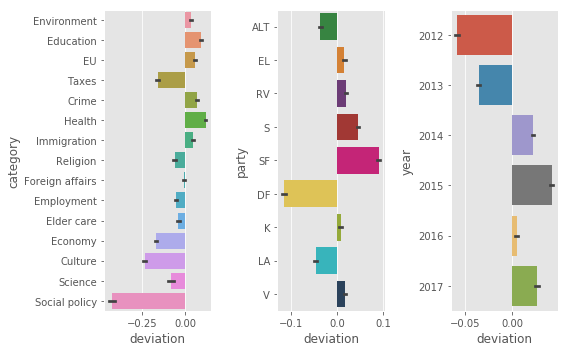

In [ ]:
fig,axes = plt.subplots(1,3,sharex=False)
## topics
ax = axes[0]
def get_differential_bias_topic(groupdf):
    performance = groupdf.groupby('topword_label')['weighted_precision'].mean()
    mean_performance = performance.dropna().mean()
    performance_normed = (performance-mean_performance)/mean_performance
    return performance_normed
temp = lexicon_df[lexicon_df.accept].groupby('model_id').apply(get_differential_bias_topic)
temp.columns = [get_dic_name(i) for i in temp.columns]
temp = temp.stack().reset_index()
temp.columns = ['index','category','deviation']
sns.barplot(y='category',x='deviation',data=temp,ax=ax)


ax = axes[2]
variance_t = lexicon_df[['temporal_bias_%d'%num for num,_ in enumerate(diff_columns)]].values
normed_score = ((variance_t.T - variance_t.mean(axis=1))/variance_t.mean(axis=1)).T

temp = pd.DataFrame(normed_score[lexicon_df.accept.values],columns=[i.year for i in diff_columns]).stack().reset_index()
temp.columns = ['index','year','deviation']

temp['year'] = pd.Categorical(temp.year.astype(str))
sns.barplot(y='year',x='deviation',data=temp,ax=ax)
#plt.xlabel('standard deviations')

ax = axes[1]
variance_party = lexicon_df[['party_bias_%d'%num for num in in_parties]].values
normed_score = ((variance_party.T - variance_party.mean(axis=1))/variance_party.mean(axis=1)).T

temp = pd.DataFrame(normed_score[lexicon_df.accept.values],columns=[translater[party2idx[num]] for num in in_parties]).stack().reset_index()
temp.columns = ['index','party','deviation']

sns.barplot(y='party',x='deviation',data=temp,palette=[party2color[translater[party2idx[num]]] for num in in_parties],ax=ax)
#ax.set_xlabel('standard deviations')
#fig.suptitle('Differential Bias')
fig.set_size_inches(8,5)
fig.tight_layout()

plt.savefig('output/bias/diff_bias_deviations.png')


/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


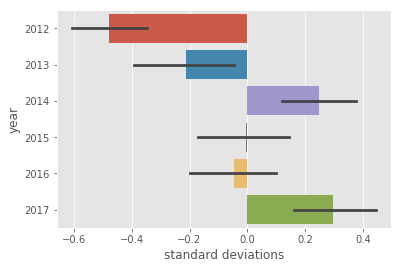

In [ ]:

variance_t = lexicon_df[['temporal_bias_%d'%num for num,_ in enumerate(diff_columns)]].values
normed_score = ((variance_t.T - variance_t.mean(axis=1))/variance_t.std(axis=1)).T

temp = pd.DataFrame(normed_score[lexicon_df.accept.values],columns=[i.year for i in diff_columns]).stack().reset_index()
temp.columns = ['index','year','deviation']

temp['year'] = pd.Categorical(temp.year.astype(str))
sns.barplot(y='year',x='deviation',data=temp,ax=ax)
plt.xlabel('standard deviations')
plt.savefig('output/bias/diff_bias_temporal_deviations.png')

In [ ]:
matched_categories = sorted(set(accepted_df.topic_label))
matched_categories

[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0]

In [ ]:
topic2party_bias = lexicon_df[lexicon_df.accept].groupby('topic_label')[['party_bias_%d'%i for i in in_parties]].mean()


In [ ]:
columns = [translater[party2idx[p]] for p in in_parties]
topic2party_bias.columns = columns


In [ ]:

party_correlation = lexicon_df[lexicon_df.accept][['party_bias_%d'%i for i in in_parties]].corr()
columns = [translater[party2idx[p]] for p in in_parties]
party_correlation.columns = columns
party_correlation.index = columns
sort_parties = ['EL', 'SF', 'S', 'ALT', 'RV', 'DF', 'V', 'K', 'LA']
party_correlation = party_correlation[sort_parties].loc[sort_parties]
#party_correlation

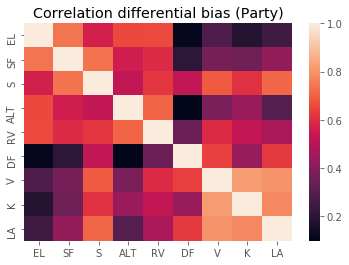

In [ ]:
sns.heatmap(party_correlation)
plt.title('Correlation differential bias (Party)')
plt.savefig('output/bias/diff_bias_correlation(parties).png')

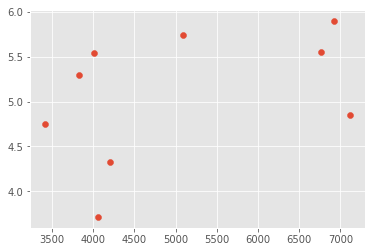

In [ ]:
p2corr = party_correlation.sum(axis=1).sort_values().reset_index()
p2corr.columns = ['party','correlation']
temp = pd.DataFrame(pol_df.party.value_counts())
temp = p2size.reset_index()
temp.columns = ['party','n_docs']
temp = temp[temp.party.isin(translater)]
temp['party'] = temp.party.apply(lambda x: translater[x])
p2corr = p2corr.merge(temp)
plt.scatter(p2corr['n_docs'],p2corr['correlation'])

In [ ]:
topic2party_bias = topic2party_bias[sort_parties]

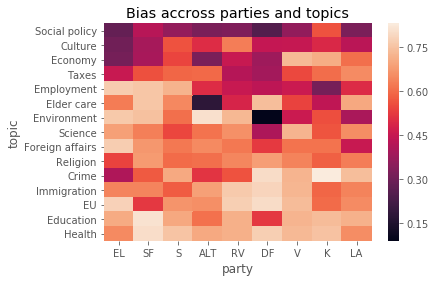

In [ ]:
ax = sns.heatmap(topic2party_bias.iloc[topic2party_bias.sum(axis=1).sort_values().index])
yticks = []
for tick in ax.get_yticklabels():
    yticks.append(get_dic_name(int(float(tick.get_text()))))
ax.set_title('Bias accross parties and topics')
#ax.figure.set_size_inches(12,8)
ax.set_yticklabels(yticks);
ax.set_ylabel('topic')
ax.set_xlabel('party')
plt.savefig('output/bias/diff_bias_topic_parties.png')

In [ ]:
diff_bias = topic2party_bias.values.T.flatten()

In [ ]:
[back_translater[p] for p in sort_parties if p in back_translater]

['Enhedslisten',
 'Socialistisk Folkeparti',
 'Socialdemokratiet',
 'Alternativet',
 'Radikale Venstre',
 'Dansk Folkeparti',
 'Venstre',
 'Det Konservative Folkeparti',
 'Liberal Alliance']

In [ ]:
diff_size = pol_df[pol_df.topic_class.isin(set(accepted_df.topic_label))].groupby('party').topic_class.value_counts()
diff_size = pd.DataFrame(diff_size).ix[[back_translater[p] for p in sort_parties if p in back_translater]].values.flatten()
#diff_size = diff_size.reshape(len(sort_parties),len(matched_categories))
#diff_bias = diff_bias.reshape(len(sort_parties),len(matched_categories))

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


In [ ]:
diff_bias_df = pd.DataFrame({'size':diff_size,'bias':diff_bias,'party':np.concatenate([[party]*len(matched_categories) for party in sort_parties])})
                    

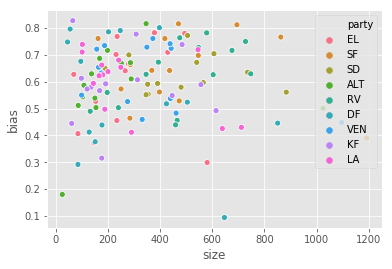

In [ ]:
sns.scatterplot('size','bias',hue='party',data=diff_bias_df)

In [ ]:
accepted_df.columns[-20:]
#category_performance = accepted_df.groupby('topic_label')['weigthed_precision'].mean()
#category_performance

Index(['topic_label_frac', 'topic_label_frac_extent', 'topic_label_doc',
       'party_bias_0', 'party_bias_1', 'party_bias_2', 'party_bias_3',
       'party_bias_4', 'party_bias_5', 'party_bias_6', 'party_bias_7',
       'party_bias_8', 'party_bias_9', 'party_bias_10', 'temporal_bias_0',
       'temporal_bias_1', 'temporal_bias_2', 'temporal_bias_3',
       'temporal_bias_4', 'temporal_bias_5'],
      dtype='object')

In [ ]:
def quantify_de_ascending(x,y):
    asc = []
    sort_idx = x.argsort()
    y = y[sort_idx]
    
    for idx in range(len(x)):
        val = y[idx]
        larger = sum(val<y[idx+1:])
        length = len(y)-idx
        if idx>0:
            larger += sum(y[:idx]<val)
            length += idx
        asc.append(larger/length)
    return sum(asc)/len(x)
for party in diff_bias_df.party.unique():
    temp = diff_bias_df[diff_bias_df.party==party]
    x,y = temp['size'].values,temp.bias.values
    
    print(party,quantify_de_ascending(x,y))


EL 0.6326530612244898
SF 0.5
SD 0.5102040816326531
ALT 0.6326530612244899
RV 0.6428571428571429
DF 0.4387755102040815
VEN 0.39795918367346933
KF 0.4387755102040817
LA 0.34693877551020413


In [ ]:
category_performance = np.zeros(15)
partytopic_mat = np.zeros((15,len(accepted_party_frac.columns)))
for i in range(15):
    idx = accepted_df.topic_label==i
    partytopic_mat[i] = accepted_party_frac[idx].mean()
    category_performance[i] = accepted_df[idx].weighted_precision.mean()

In [ ]:
partytopic_mat = pd.DataFrame(partytopic_mat,index = [get_dic_name(i) for i in range(15)],columns=[translater[col] for col in accepted_party_frac.columns])
#party2topic_mat = partytopic_mat.drop(['Z','KD'],axis=1)

In [ ]:
party2topic_counts = pol_df.groupby('party').apply(lambda x: x.topic_class.value_counts().sort_index())#.values
#party2topic_counts = party2topic_counts.T.drop(['Fremskridtspartiet','Kristendemokraterne'],axis=1).values
party2topic_counts = party2topic_counts.drop(['Fremskridtspartiet','Kristendemokraterne']).T
party2topic_counts.columns = [translater[p] for p in party2topic_counts.columns]
party2topic_counts = party2topic_counts.values

In [ ]:
catcounts = pd.DataFrame(pol_df.topic_class.value_counts().sort_index()).reset_index()
catcounts.columns = ['topic','n_docs']
catcounts['topic_name'] = catcounts.topic.apply(get_dic_name)
catcounts['bias'] = category_performance


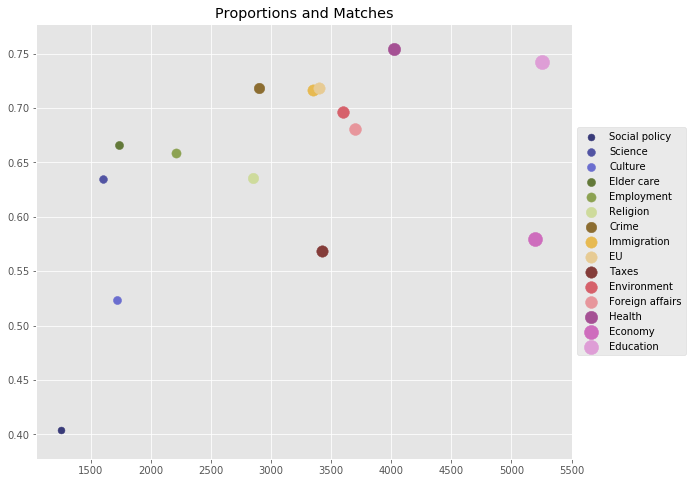

In [ ]:
plt.style.use('ggplot')
def linear_func(x, a, b):
    return a*x + b
def quadratic_func(x,a,b):
    return a*x**2 + b
def exp_func(x,a,b):
    return a**x + b

from scipy.optimize import curve_fit
def fit_function(x,y,func=linear_func,plot=False):
    popt, pcov = curve_fit(func, x, y,)
    xlim = np.linspace(min(x),max(x),50)
    fit_y = func(xlim,*popt)
    return xlim,fit_y

def plot_dictionary_stats(df,funcx,funcy,xlabel='',ylabel='',fitline = linear_func,sort_column='n_docs',hue='topic_name',title='Proportions and Matches'):
    fig = plt.figure(figsize=(12,8))
    ax = plt.subplot(111)
    cmap = plt.cm.get_cmap('tab20b', 15)
    #xcol,ycol = 'n_docs','n_accepted'
    max_ =df[sort_column].max()
    
    for num,(label,tempdf) in enumerate(df.sort_values(sort_column).groupby(hue,sort=False)):
        color = cmap(num/15)
        size = tempdf[sort_column].values
        ax.scatter(funcx(tempdf),funcy(tempdf),label=label,c=color,s=(tempdf[sort_column].values[0]/max_)*200)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    # plot linear expectancy
    if fitline:
        if fitline=='all':
            for func in [linear_func,quadratic_func,exp_func]:
                xlim,ypred = fit_function(funcx(df).values,funcy(df).values,func=func)
                plt.plot(xlim,ypred)
        else:
            xlim,ypred = fit_function(funcx(df).values,funcy(df).values,func=fitline)
            plt.plot(xlim,ypred)
    #x,y = matches[xcol],matches[ycol]
    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    return ax
plot_dictionary_stats(catcounts,funcx=lambda x: x.n_docs,funcy=lambda x: x.bias,fitline=False)#,fitline='all')


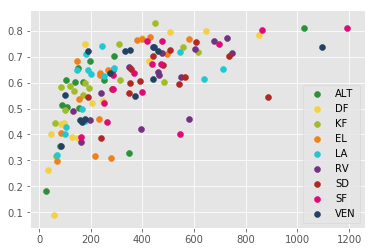

In [ ]:
for num,party in enumerate(party2topic_mat.columns):
    color = get_party_color(party)
    
    x,y = party2topic_counts[:,num],party2topic_mat[party].values
    #sort_idx = x.argsort()
    
    plt.scatter(x[sort_idx],y[sort_idx],label=party,color=color)
plt.legend()

## Understanding differential performance
- Size + Entropy


/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


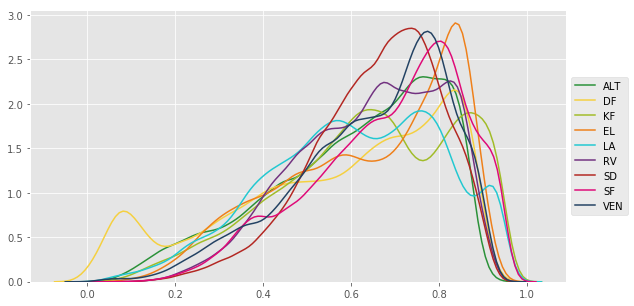

In [ ]:
fig,ax = plt.subplots()
for p in accepted_party_frac.columns:
    vals = accepted_party_frac[p].values
    color = get_party_color(p)
    party = translater[p]
    

    
    plabel = translater[p]
    if plabel in set(['Z','KD']):
        continue
    sns.distplot(vals,color=color,label=party,hist=False,ax=ax)
fig.set_size_inches(12,5)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis----------
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))


In [ ]:
accepted_df = accepted_df.reset_index()

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


Text(0.5,0,'weighted precision')

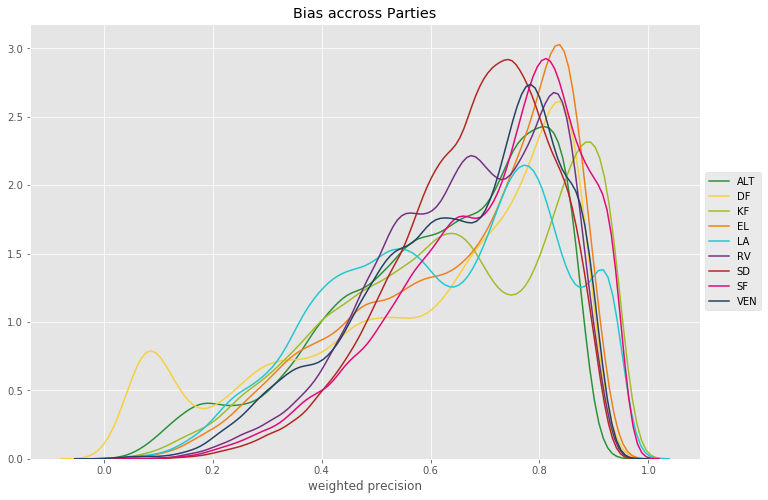

In [ ]:
diff_column = 'diffential_fraction_t%d_%d'
diff_column = 'diffential_fraction_p%d_%d'
fig,ax = plt.subplots()
for p in range(party_mat.shape[1]):
    vals = []
    plabel = translater[party2idx[p]]
    if plabel in set(['Z','KD']):
        continue
    for num,topic_num in enumerate(accepted_df.topic_label.values):
        topic_label = int(topic_num)
        col = diff_column%(p,topic_num)
        vals.append(accepted_df.at[num,col])
    color = get_party_color(p)
    #p_columns = [diff_column%(p,topic_num) for topic_num in range(15)]
    sns.distplot(vals,color=color,label=translater[party2idx[p]],hist=False,ax=ax)
fig.set_size_inches(15,8)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis----------
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_title('Bias accross Parties')
ax.set_xlabel('weighted precision')

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


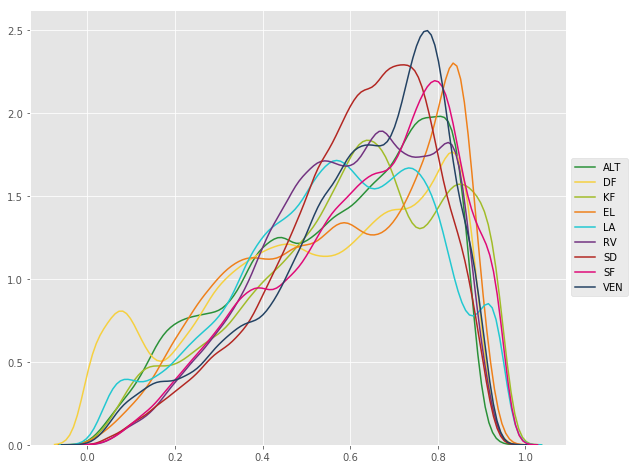

In [ ]:
diff_column = 'diffential_fraction_t%d_%d'
diff_column = 'diffential_fraction_p%d_%d'
fig,ax = plt.subplots()
for p in range(party_mat.shape[1]):
    vals = []
    plabel = translater[party2idx[p]]
    if plabel in set(['Z','KD']):
        continue
    for num,topic_num in enumerate(accepted_topics.topic_label.values):
        topic_label = int(topic_label)
        col = diff_column%(p,topic_num)
        vals.append(accepted_topics.at[num,col])
    color = get_party_color(p)
    #p_columns = [diff_column%(p,topic_num) for topic_num in range(15)]
    sns.distplot(vals,color=color,label=translater[party2idx[p]],hist=False,ax=ax)
fig.set_size_inches(12,8)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis----------
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))


{'Dansk Folkeparti': "Danish People's Party",
 'Enhedslisten': 'Unity List',
 'Radikale Venstre': 'Social Liberal Party'}

In [ ]:
#party2idx


Index(['Alternativet', 'Dansk Folkeparti', 'Det Konservative Folkeparti',
       'Enhedslisten', 'Fremskridtspartiet', 'Kristendemokraterne',
       'Liberal Alliance', 'Radikale Venstre', 'Socialdemokratiet',
       'Socialistisk Folkeparti', 'Venstre'],
      dtype='object')

In [ ]:
lexicon_df.columns

Index(['time_series', 'word_topic_count', 'topic_frac_sum',
       'lexicon_doc_overlap_1000_0', 'lexicon_doc_overlap_1000_1',
       'lexicon_doc_overlap_1000_10', 'lexicon_doc_overlap_1000_11',
       'lexicon_doc_overlap_1000_12', 'lexicon_doc_overlap_1000_13',
       'lexicon_doc_overlap_1000_14',
       ...
       'diffential_fraction_t10_12', 'diffential_fraction_t10_13',
       'diffential_fraction_t10_14', 'topic_num', 'model_path', 'model_id',
       'topic_label', 'topic_label_frac', 'topic_label_frac_extent',
       'topic_label_doc'],
      dtype='object', length=835)

## Research Conclusions
** Topic Level** 
- Which is biggest?

- What does each party prioritize the most.
- Has the party changed priorities as time develops?


In [ ]:
lexicon_df['topword_label'] = pd.Categorical(lexicon_df.topword_label)
lexicon_df['topword_label'] = lexicon_df.topword_label.astype(int)

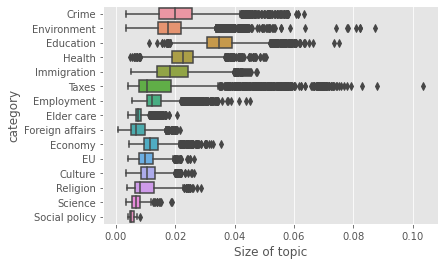

In [ ]:
#lexicon_df['topic_frac_sum']
def get_topic_size(groupdf,topic_col='topword_label'):
    return groupdf.groupby(topic_col)['topic_frac_sum'].sum() / len(pol_df)

t2size = lexicon_df[lexicon_df.accept].groupby('model_id').apply(get_topic_size).reset_index()
t2size['category'] = t2size.topword_label.apply(get_dic_name)
#plt.figure(figisize=(12,8))
sns.boxplot(y='category',x='topic_frac_sum',data=t2size)
plt.xlabel('Size of topic')
plt.savefig('output/research_conclusions/topic_sizes_tight.png',dpi=300,bbox_inches='tight')
#sns.boxplot(y='topic_frac_sum',data=,hue='topword_label')

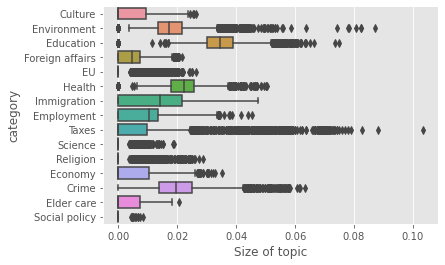

In [ ]:
lexicon_df['topword_label'] = pd.Categorical(lexicon_df.topword_label)
t2size = lexicon_df[lexicon_df.accept].groupby('model_id').apply(get_topic_size)
t2size.columns = [get_dic_name(i) for i in t2size.columns]
t2size = t2size.unstack().reset_index()
t2size.columns = ['category','model_id','topic_frac_sum']
sns.boxplot(y='category',x='topic_frac_sum',data=t2size)
plt.xlabel('Size of topic')
plt.savefig('output/research_conclusions/topic_sizes_including_empty.png',dpi=300,bbox_inches='tight')


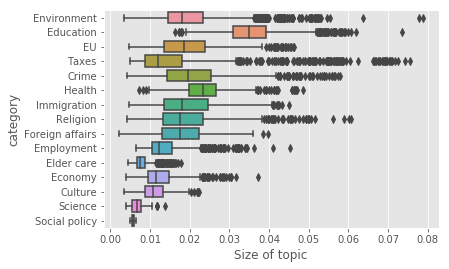

In [ ]:
#lexicon_df['topic_frac_sum']
def get_topic_size(groupdf,topic_col='topword_label'):
    return groupdf.groupby(topic_col)['topic_frac_sum'].sum() / len(pol_df)
t2size = lexicon_df[lexicon_df.accept].groupby('model_id').apply(get_topic_size).reset_index()
t2size['category'] = t2size.topword_label.apply(get_dic_name)
sns.boxplot(y='category',x='topic_frac_sum',data=t2size)
plt.xlabel('Size of topic')
plt.savefig('output/research_conclusions/topic_sizes.png')
#sns.boxplot(y='topic_frac_sum',data=,hue='topword_label')

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


CategoricalIndex([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], categories=[0, 1, 2, 3, 4, 5, 6, 7, ...], ordered=False, name='topword_label', dtype='category')

In [ ]:
#in_topics = set((lexicon_df[lexicon_df.accept].topword_label.value_counts()>200).index)

In [ ]:
def get_relative_size(groupdf,topic_col='topword_label'):
    sizes = groupdf.groupby(topic_col)['topic_frac_sum'].sum() / len(pol_df)
    vals = sizes.values
    temp = pd.DataFrame(vals/vals.reshape(-1,1),index=sizes.index,columns=sizes.index).reset_index(drop=True)
    temp.columns = list(temp.columns)
    temp = temp.replace(np.inf, np.nan).replace(0,np.nan).values.flatten().reshape(1,-1)
    cols = [(i,j) for i in range(15) for j in range(15)]
    return pd.DataFrame(temp,columns=cols)
t2relative = lexicon_df[lexicon_df.accept].groupby('model_id').apply(get_relative_size)

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


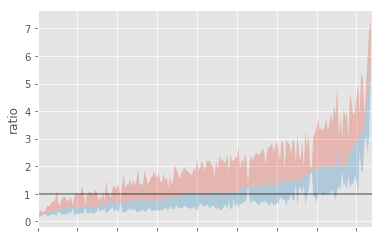

In [ ]:
#t2relative[sorted()]
t2relative_sort = t2relative[t2relative.columns[t2relative.mean().argsort()]]#
t2relative_sort = t2relative[[col for col in t2relative_sort.columns if not col[0]==col[1]]]
#t2relative_sort.mean().plot()
y = t2relative_sort.median().values
x = range(len(y))
y1 = t2relative_sort.quantile(0.05).values
#t2relative_sort.quantile(0.05).plot()
y2 = t2relative_sort.quantile(0.95).values
plt.hlines(y=1,xmin = 0,xmax=len(y2),alpha=0.5)
plt.fill_between(x,y,y2, alpha=0.3)
plt.fill_between(x,y,y1, alpha=0.3)

plt.xlim(0,len(y2))
plt.xticks(np.arange(0,210,25),['']*len(np.arange(0,210,25)))
plt.ylabel('ratio')
plt.savefig('output/research_conclusions/ratio_size_distribution.png')

### comparison to dictionary estimates

In [ ]:
sizes = pol_df.topic_class.value_counts().sort_index().values
sizes_rel = sizes/sizes.reshape(-1,1)
sizes_rel[range(15),range(15)] = np.nan
sizes_rel = sizes_rel.flatten()
sizes_rel = sizes_rel[np.isfinite(sizes_rel)]
t2relative = t2relative[[col for col in t2relative.columns if not col[0]==col[1]]]
errors = []
for col in t2relative.columns:
    vals = t2relative[col].dropna()
    errors.append(np.array([vals.quantile(0.05),vals.quantile(0.95)]))
errors = np.array(errors)

In [ ]:
sum((errors.T<1).T.sum(axis=1) == 1)/len(errors)

0.6476190476190476

64 % of all comparisons are ambivalent, in the sense sometimes one is bigger than the other and sometimes reverse. 

In [ ]:

idx = sizes_rel.argsort()
y = t2relative.median().values

y = y[idx]

x = sizes_rel[idx]

y1,y2 = errors[idx].T[0],errors[idx].T[1]


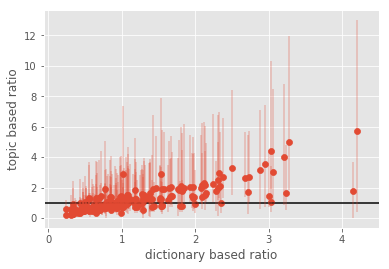

In [ ]:
plt.hlines(y=1,xmax = sizes_rel.max()+0.5,xmin=sizes_rel.min()-0.5)
x,y = sizes_rel,t2relative.median().values
plt.scatter(x,y)
plt.errorbar(x,y,yerr=errors.T,fmt='o',alpha=0.3)
plt.xlabel('dictionary based ratio')
plt.xlim(sizes_rel.min()-0.3,sizes_rel.max()+0.3)
plt.ylabel('topic based ratio')
plt.savefig('output/research_conclusions/topic_relative_sizes.png')

In [ ]:
sum(np.logical_and(x>1, y>1))/len(y) + sum(np.logical_and(x<1, y<1))/len(y)

0.7904761904761904

79 percent of the comparisons using the median accross all models are correct.

In [ ]:
right_conclusions = []
rels = []
for num,col in enumerate(t2relative):
    vals = t2relative[col].dropna()
    above = sum(vals>1)
    below = sum(vals<1)
    real = x[num]>1
    rels.append(len(vals))
    if real:
        score = above
    else:
        score = below
    right_conclusions.append(score)
right_conclusions = np.array(right_conclusions)
rels = np.array(rels)
print(right_conclusions.sum()/rels.sum(),(right_conclusions/rels).mean())

0.6865225458722352 0.7464917134846762


** On average 74 % of all comparisons corresponds to the dictionary comparisons**

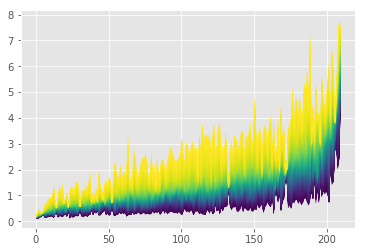

In [ ]:
#t2relative
def get_quantiles(vals,k=50):
    return [np.quantile(vals,i) for i in np.linspace(0.01,0.99,k)]

quants = []
k = 200
for col in t2relative_sort.columns:
    if col[0] == col[1]:
        continue
    
    vals = t2relative_sort[col].dropna().values
    quantiles = np.array(get_quantiles(vals,k=k))
    quants.append(quantiles)
quants = np.array(quants)        
#mean = t2relative[col].mean()
    #std = t2relative[col].std()
    #lower_quan = np.quantile(vals,0.05)
    #upper_quan = np.quantile(vals,0.95)
    #print(mean,std,lower_quan,upper_quan)
cmap = plt.get_cmap('viridis',k)
last = None
for num, y1 in enumerate(quants.T):
    if type(last)!=type(None):
        c = cmap(num/k)
        plt.fill_between(range(len(y1)),last,y1,color=c)
    last = y1

In [ ]:
mid = lexicon_df[lexicon_df.accept].model_id.value_counts().index[-300]
groupdf = lexicon_df[lexicon_df.model_id==mid]
groupdf = groupdf[groupdf.accept]

sizes = groupdf.groupby('topword_label')['topic_frac_sum'].sum() / len(pol_df)
vals = sizes.values

temp = pd.DataFrame(vals/vals.reshape(-1,1),index=sizes.index,columns=sizes.index).reset_index(drop=True)
temp.columns = list(temp.columns)

/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/home/snorre/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in true_divide
  


In [ ]:
t2size = lexicon_df[lexicon_df.accept].groupby('model_id').apply(get_topic_size).reset_index()

In [ ]:
#lexicon_df[[col for col in lexicon_df.columns if 'size_' in col]].sum(axis=1)


In [ ]:
## Coverage

In [ ]:
#lexicon_df[lexicon_df.model_id.isin(m2keep)].groupby('model_id').apply(lambda x: x.topword_label.nunique())

In [ ]:
m2coverage = lexicon_df[lexicon_df.topmatch].groupby('model_id').topic_label.nunique() 

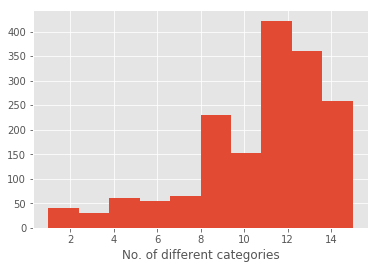

In [ ]:
m2coverage.hist()
plt.xlabel('No. of different categories')
plt.savefig('output/descriptives/coverage_of_each_model.png')
m2keep = set((m2coverage[m2coverage>=5]).index)

## Party priorities

In [ ]:
c = Counter(pol_df.party)
p2counts = [c[p] for p in party2idx]

In [ ]:
def get_most_prioritized(groupdf,p):
    pcol = col%p
    actual_size = groupdf.groupby('topword_label').apply(lambda x: (x[pcol]*x['topic_frac_sum']).sum())
    return actual_size.idxmax()
    # unsummed version.
    actual_size = groupdf[pcol]*groupdf['topic_frac_sum']
    idx = actual_size.idxmax()
    label = groupdf.loc[idx].topword_label
    
    return label


def get_priorities(groupdf,p):
    
    pcol = col%p
    pcount = p2counts[p]
    counts = groupdf.groupby('topword_label').apply(lambda x: (x[pcol]*x['topic_frac_sum']).sum()/pcount).reset_index(drop=True)
    # unsummed version.
    #counts = groupdf.groupby('topword_label').apply(lambda x: (x[pcol]*x['topic_frac_sum']).max()/pcount).reset_index(drop=True)
    return counts
p2t_max = []
col = 'topic_size_p%d'
p2ts = []
for p in in_parties:
    p2t = Counter(lexicon_df[lexicon_df.accept & lexicon_df.model_id.isin(m2keep)].groupby('model_id').apply(lambda x: get_most_prioritized(x,p)))
    a = np.array([p2t[i] for i in range(15)])
    
    p2t_max.append(a)
    p2t = lexicon_df[lexicon_df.accept & lexicon_df.model_id.isin(m2keep)].groupby('model_id').apply(lambda x: get_priorities(x,p))
    p2t.columns = [get_dic_name(i) for i in range(15)]
    p2t['party'] = translater[party2idx[p]]
    p2ts.append(p2t)

In [ ]:
#np.array(p2t_max)

In [ ]:
p2t_top = pd.DataFrame(np.array(p2t_max),columns=[get_dic_name(i) for i in range(15)],index=[translater[party2idx[p]] for p in in_parties])

In [ ]:
print('Models aggrees %.2f of the times'%(p2t_top.T/p2t_top.sum(axis=1)).max().mean())

Models aggrees 0.65 of the times


In [ ]:
#sns.heatmap((p2t_top.T/p2t_top.sum(axis=1)))

In [ ]:
p2ts = pd.concat(p2ts)

In [ ]:
## Normalize by when topics are actually discovered.
vals = []
for i in range(15):
    
    temp = p2ts[p2ts[get_dic_name(i)]>0]
    counts = temp.groupby('party').apply(lambda x: sum(x[get_dic_name(i)]==x.max(axis=1))/len(x))
    vals.append(counts)

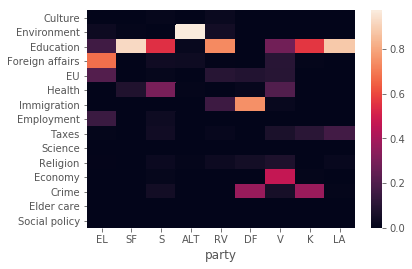

In [ ]:
sns.heatmap(pd.DataFrame(vals,index=[get_dic_name(i) for i in range(15)])[sort_parties])

In [ ]:
p2pri = pd.DataFrame(vals,index=[get_dic_name(i) for i in range(15)])
pd.concat([p2pri.max(),p2pri.idxmax()],axis=1)

,0,1
party,,
ALT,0.971554,Environment
DF,0.747774,Immigration
EL,0.675676,Foreign affairs
K,0.563441,Education
LA,0.881720,Education
RV,0.735484,Education
S,0.548387,Education
SF,0.922581,Education
V,0.469697,Economy


In [ ]:
p2pri.max().mean()

0.7240348488682111

In [ ]:
#p2ts

In [ ]:
p2ts_normed = {}
for t in p2ts.columns:
    vals = p2ts[t]
    vals = vals[vals>0]
    vals = vals.T/vals.sum(axis=1).T
    p2ts_normed.append()

In [ ]:

p2ts_normed = p2ts.groupby('party').apply(lambda x: (x.T/x.sum(axis=1)).T.reset_index(drop=True))

In [ ]:
#[Index[i] for i in lex2idx['undervis_folkeskole_ungdomsuddan']]

In [ ]:
#p2ts_normed

In [ ]:
p2t_dic = pol_df.groupby('party').topic_class.value_counts().unstack()

p2t_dic.index = [translater[i] if i in translater else i for i in p2t_dic.index]
p2t_dic = p2t_dic.loc[sort_parties]
p2t_dic.columns = [get_dic_name(i) for i in p2t_dic.columns]


In [ ]:
p2ts_agg = p2ts_normed.reset_index().drop('level_1',axis=1).groupby('party').mean()
p2ts_agg = p2ts_agg.loc[sort_parties]
p2ts_agg = p2ts_agg[[get_dic_name(i) for i in range(15)]]

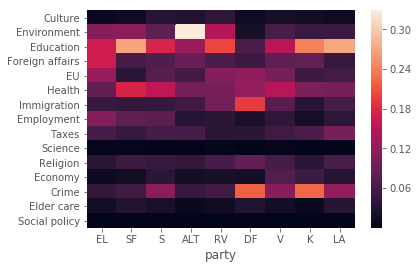

In [ ]:

sns.heatmap(p2ts_agg.T)

In [ ]:
p2t_dic_norm = (p2t_dic.T / p2t_dic.sum(axis=1).values).T

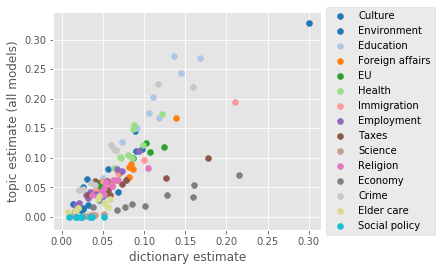

In [ ]:
cmap = plt.get_cmap('tab20',15)
fig,ax = plt.subplots()
for num,col in enumerate(p2t_dic.columns):
    c = cmap(num/16)
    plt.scatter(p2t_dic_norm[col],p2ts_agg[col],color = c,label=col)

box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_xlabel('dictionary estimate')
ax.set_ylabel('topic estimate (all models)')
plt.savefig('output/conglomeration/party2topic_robust.png')

In [ ]:
import scipy
ranks = p2ts.groupby('party').apply(lambda x: scipy.stats.mstats.rankdata(x.values,axis=1).mean(axis=0))
ranks = ranks.loc[sort_parties]

In [ ]:
#ranks[0]

In [ ]:
topic_ranks = []
for val in ranks.values:
    topic_ranks.append(val)
topic_ranks = np.array(topic_ranks)
topic2rank = pd.DataFrame(topic_ranks,columns=[get_dic_name(i) for i in range(15)],index=ranks.index)

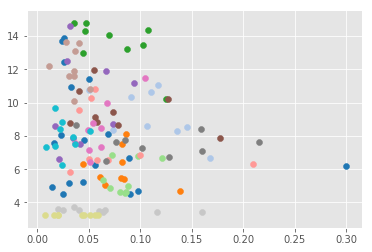

In [ ]:
for num,col in enumerate(p2t_dic.columns):
    c = cmap(num/16)
    plt.scatter(p2t_dic_norm[col],topic2rank[col],color = c,label=col)

box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_xlabel('dictionary estimate')
ax.set_ylabel('topic estimate (all models)')
plt.savefig('output/conglomeration/party2topic_robust_rank.png')

In [ ]:
#for num,p in enumerate(in_parties):
#    l = p2t_max[num]
#    print(translater[party2idx[p]],get_dic_name(l.argsort()[-1]))


In [ ]:
#p2ts[p2ts.party=='LA'].mean()

In [ ]:
p2t = pd.DataFrame(p2t_max,index=[translater[party2idx[i]] for i in in_parties],columns=[get_dic_name(i) for i in range(15)])
p2t = p2t.loc[sort_parties]
p2t = p2t[[get_dic_name(i) for i in range(15)]]

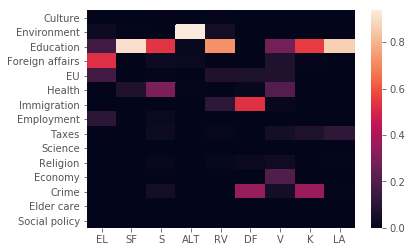

In [ ]:
p2t = pd.DataFrame(p2t_max,index=[translater[party2idx[i]] for i in in_parties],columns=[get_dic_name(i) for i in range(15)])
p2t = p2t.loc[sort_parties]
p2t = p2t[[get_dic_name(i) for i in range(15)]]
sns.heatmap((p2t.T/p2t.sum(axis=1)))

In [ ]:
(p2t.T/p2t.sum(axis=1)).max()

EL     0.527426
SF     0.905063
S      0.537975
ALT    0.936709
RV     0.721519
DF     0.531646
V      0.276371
K      0.552743
LA     0.864979
dtype: float64

In [ ]:
#(p2t.T/p2t.sum(axis=1)).idxmax()

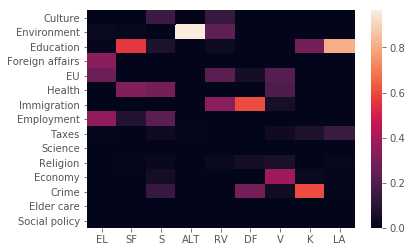

In [ ]:
sns.heatmap((p2t.T/p2t.sum(axis=1)))
plt.savefig('output/research_conclusions/most_prioritized_party.png',bbox_inches = 'tight')
## Descriptive the Percentage of times that one aggrees on the most dominant.

In [ ]:
(p2t/p2t.sum(axis=1).values[0]).idxmax(axis=1)

EL      Employment
SF       Education
S           Health
ALT    Environment
RV     Immigration
DF     Immigration
V          Economy
K            Crime
LA       Education
dtype: object

In [ ]:
(p2t/p2t.sum(axis=1).values[0]).max(axis=1)#.mean()

EL     0.351145
SF     0.564885
S      0.286896
ALT    0.964377
RV     0.333969
DF     0.604326
V      0.382952
K      0.606234
LA     0.812341
dtype: float64

In [ ]:
(p2t/p2t.sum(axis=1).values[0]).max(axis=1).mean()

0.5452360757704269

If we ask accross models: What do each party prioritize the most? Accross all parties they agree 54 % percent of the time. With up to 96 % aggreement that the Green party prioritize the environment the most.

In [ ]:
### Should be done holding each topic fixed so only the model. 

In [ ]:
print('YO')

In [ ]:
top = 1
p2top_counts = []
for party in sort_parties:
    groupdf = p2ts[p2ts.party==party]
    vals = groupdf[[col for col in groupdf.columns if not col=='party']]
    
    c = Counter(vals.values.argsort(axis=1)[:,-top:].flatten())
    top_counts = np.array([c[i] for i in range(15)])
    p2top_counts.append(top_counts)
    print(party,get_dic_name(Counter(vals.values.argsort(axis=1)[:,-top:].flatten()).most_common(1)[0][0]))

EL Foreign affairs
SF Education
S Education
ALT Environment
RV Education
DF Immigration
V Education
K Education
LA Education


In [ ]:
Counter(vals.values.argsort(axis=1)[:,-1])


Counter({2: 1377, 6: 1, 8: 172, 10: 9, 11: 1, 12: 12})

In [ ]:
#groupdf.tail()

In [ ]:
p2top_counts = np.array(p2top_counts)

In [ ]:
p2top_counts = pd.DataFrame(p2top_counts,index=sort_parties,columns=[get_dic_name(i) for i in range(15)])

In [ ]:
(p2top_counts.T/p2top_counts.sum(axis=1)).T.idxmax(axis=1)

EL     Foreign affairs
SF           Education
S            Education
ALT        Environment
RV           Education
DF         Immigration
V            Education
K            Education
LA           Education
dtype: object

## Party response

In [ ]:
response_cols = ['response_p%d'%i for i in in_parties]
lexicon_df['response_variance'] = lexicon_df.apply(lambda x: x[response_cols].values.std(),axis=1)
#lexicon_df.groupby('best_label').apply(la[response_cols].std(axis=1)

In [ ]:
label_col = 'best_label'
temp = lexicon_df[lexicon_df.accept]
response = temp.groupby(label_col).response_variance.median().reset_index()
response[label_col] = response[label_col].apply(get_dic_name)
response.sort_values(by='response_variance')

,best_label,response_variance
4,EU,0.062295
11,Economy,0.072646
5,Health,0.085326
1,Environment,0.089821
8,Taxes,0.090560
7,Employment,0.093570
12,Crime,0.094089
0,Culture,0.094561
10,Religion,0.096307
3,Foreign affairs,0.096657


#### According to this, EU, and the Economy gets a lower response.

In [ ]:
def get_best_response(groupdf,p):
    pcol = col%p
    #response = groupdf[pcol]
    response = groupdf.groupby('topword_label').apply(lambda x: x[pcol].mean())
    return response.idxmax()
    #print(response.idxmax())
    #print(1+'2')
    idx = response.idxmax()
    label = groupdf.loc[idx].topword_label
    return label


p2t_max = []
col = 'response_p%d'
p2ts = []
for p in in_parties:
    sub = lexicon_df[lexicon_df.accept & lexicon_df.model_id.isin(m2keep)]
    p2r = Counter(sub.groupby('model_id').apply(lambda x: get_best_response(x,p)))
    #p2r = Counter(lexicon_df.groupby('model_id').apply(lambda x: get_best_response(x,p)))
    a = np.array([p2r[i] for i in range(15)])
    
    p2t_max.append(a)
#list(lexicon_df.columns)

In [ ]:
p2t_max = np.array(p2t_max)

In [ ]:
#sub = lexicon_df[lexicon_df.topmatch]
#p2r = Counter(sub.groupby('model_id').apply(lambda x: get_best_response(x,p)))

In [ ]:
groupdf = lexicon_df[lexicon_df.model_id==random.choice(list(m2keep))]

In [ ]:
get_best_response(groupdf[groupdf.accept],p)

12

In [ ]:
pcol = col%p
print(p)
response = groupdf[groupdf.topmatch].groupby('topword_label').apply(lambda x: x[pcol].mean())

10


In [ ]:
response.idxmax()

10

In [ ]:
list(lexicon_df.columns)

['time_series',
 'word_topic_count',
 'topic_frac_sum',
 'semantic_coherence_5',
 'semantic_coherence_10',
 'semantic_coherence_20',
 'frex_overlap_10_0',
 'frex_overlap_10_1',
 'frex_overlap_10_10',
 'frex_overlap_10_11',
 'frex_overlap_10_12',
 'frex_overlap_10_13',
 'frex_overlap_10_14',
 'frex_overlap_10_2',
 'frex_overlap_10_3',
 'frex_overlap_10_4',
 'frex_overlap_10_5',
 'frex_overlap_10_6',
 'frex_overlap_10_7',
 'frex_overlap_10_8',
 'frex_overlap_10_9',
 'frex_overlap_20_0',
 'frex_overlap_20_1',
 'frex_overlap_20_10',
 'frex_overlap_20_11',
 'frex_overlap_20_12',
 'frex_overlap_20_13',
 'frex_overlap_20_14',
 'frex_overlap_20_2',
 'frex_overlap_20_3',
 'frex_overlap_20_4',
 'frex_overlap_20_5',
 'frex_overlap_20_6',
 'frex_overlap_20_7',
 'frex_overlap_20_8',
 'frex_overlap_20_9',
 'frex_overlap_50_0',
 'frex_overlap_50_1',
 'frex_overlap_50_10',
 'frex_overlap_50_11',
 'frex_overlap_50_12',
 'frex_overlap_50_13',
 'frex_overlap_50_14',
 'frex_overlap_50_2',
 'frex_overlap_5

In [ ]:
p2t_response = pd.DataFrame((p2t_max.T / p2t_max.sum(axis=1)).T,index=[translater[party2idx[i]] for i in in_parties],columns=[get_dic_name(i) for i in range(15)])
p2t_response = p2t_response.T[sort_parties].T

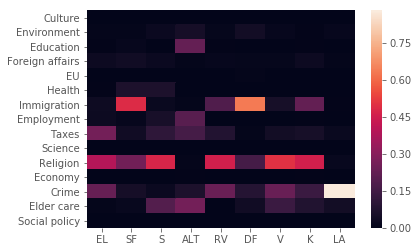

In [ ]:
sns.heatmap(p2t_response.T)
plt.savefig('output/research_conclusions/party2response_topmatch.png',bbox_inches='tight')

In [ ]:
p2t_response.T.max().mean()

0.5044883303411132

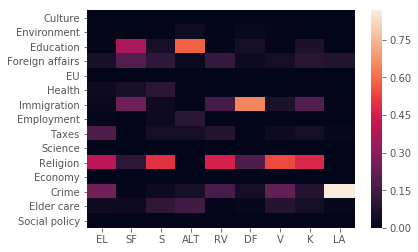

In [ ]:
sns.heatmap(p2t_response.T)
#plt.savefig('output/research_conclusions/party2response.png',bbox_inches='tight')

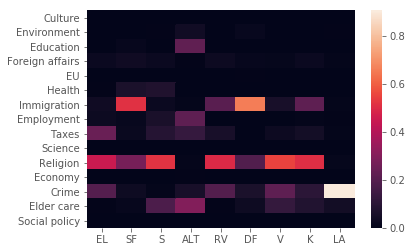

In [ ]:
sns.heatmap(p2t_response.T)
plt.savefig('output/research_conclusions/party2response.png',bbox_inches='tight')

In [ ]:
pd.concat([p2t_response.max(axis=1),p2t_response.idxmax(axis=1)],axis=1)

,0,1
EL,0.390664,Religion
SF,0.486535,Immigration
S,0.472172,Religion
ALT,0.260323,Elder care
RV,0.455296,Religion
DF,0.637343,Immigration
V,0.500539,Religion
K,0.455296,Religion
LA,0.882226,Crime


In [ ]:
p2t_response.max(axis=1).mean()

0.5044883303411132

### Co-occurence strengh:
** How to quantify a dictionary co-occurence strength? ** 

In [ ]:
d2co_occur = []
for idx in dictionaries_s:
    idx = np.array(list(idx))
    vec = real_bows[:,idx]
    
    co_occour = vec.T.dot(vec)
    d2co_occur.append(co_occour)

NameError: name 'real_bows' is not defined

In [ ]:
dictionaries

In [ ]:
for n in w_cooccur:
    n_docs = real_bows[:,n].sum()


NameError: name 'w_cooccur' is not defined

In [ ]:
y = matches['n_matches'].values
cols = ['n_docs','topfracmean_5'] # 'n_top_matches'
X = matches[cols].values
import statsmodels.api as sm
X = sm.add_constant(X)
mod = sm.OLS(y,X,)

res = mod.fit()
print(res.summary(xname=['constant']+cols))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.530
Method:                 Least Squares   F-statistic:                     8.894
Date:                Thu, 06 Dec 2018   Prob (F-statistic):            0.00427
Time:                        12:29:27   Log-Likelihood:                -152.98
No. Observations:                  15   AIC:                             312.0
Df Residuals:                      12   BIC:                             314.1
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
constant        592.6690   5354.654      0.111

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1394: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  "anyway, n=%i" % int(n))


** The analysis shows that no. of documents are not as predictive as the average prevalence of the dictionary words.** Meaning that the Top will be biased towards highly prevalent words, and biased against less prevalent words. A property which can vary from each empirical case to another. In this case we can see that our dictionaries vary in this regard,both affected by the underlying popularity of the topic, and the centrality/entropy of the topic, is there one word always mentioned or is are the topic clues scattered accross synonyms and subtopical indicators? E.g. language of healthcare relates to various different health issues (example words from the dictionary), foreign affairs can be widely different international actors, but Immigration always mentions immigrant. 

**This makes it more probable that high entropy topics can be latent noisy subtopics, because they are not spotted in the topwords. This can be seen if we calculate the relation between Dictionary Entropy and degree to which high fractions are not spotted in the topwords**

# Dictionary Entropy and Hidden Noise
- Locate topics not discovered with the hidden label, save the fraction measured.
   

In [ ]:
len(lexicon_df)

682365

In [ ]:
lexicon_df['lexicon_doc_fraction_%d'%0].iloc[679406]

0.707224595593799

In [ ]:
#def locate_hidden_noise():
models = lexicon_df.groupby('model_id')
temp = []
for model,groupdf in models:
    labels = set(groupdf.topic_label)
    for topic in range(15):
        if topic not in labels:
            idx = groupdf['lexicon_doc_fraction_%d'%topic].idxmax()
            val,first_overlap = groupdf['lexicon_doc_fraction_%d'%topic].loc[idx],groupdf['firstoverlap_%d'%topic].loc[idx]
            d = {'frac':val,'firstoverlap':first_overlap,'topic':topic,'model_id':model}
            temp.append(d)
discovered2noise = pd.DataFrame(temp)
    
#discovered2noise = locate_hidden_noise()

In [ ]:
topic2firstoverlap_noise = discovered2noise.groupby('topic').apply(lambda x: x.groupby('firstoverlap').frac.mean()).reset_index()


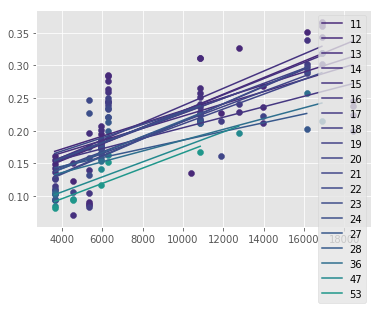

In [ ]:
def linear_func(x, a, b):
    return a*x + b
from scipy.optimize import curve_fit
def fit_function(x,y,func=linear_func,plot=False):
    popt, pcov = curve_fit(func, x, y)
    fit_y = func(np.linspace(min(x),max(x),50),*popt)
    return np.linspace(min(x),max(x),50),fit_y,popt

for spotted_top,tempdf in topic2firstoverlap_noise.groupby('firstoverlap'):
    if spotted_top<=10:
        continue
    tempdf = tempdf.merge(matches[['topic','entropy','n_docs']],on='topic')
    #print(spotted_top)
    if len(tempdf)<5:
        continue
    if spotted_top>100:
        break
    x,y = tempdf.entropy*tempdf.n_docs,tempdf.frac
    
    xlin,ypred,popt = fit_function(x.values,y.values)
    plt.plot(xlin,ypred,label=spotted_top,color=plt.cm.viridis(spotted_top/100))
    plt.scatter(x.values,y.values,color=plt.cm.viridis(spotted_top/100))
    
plt.legend()

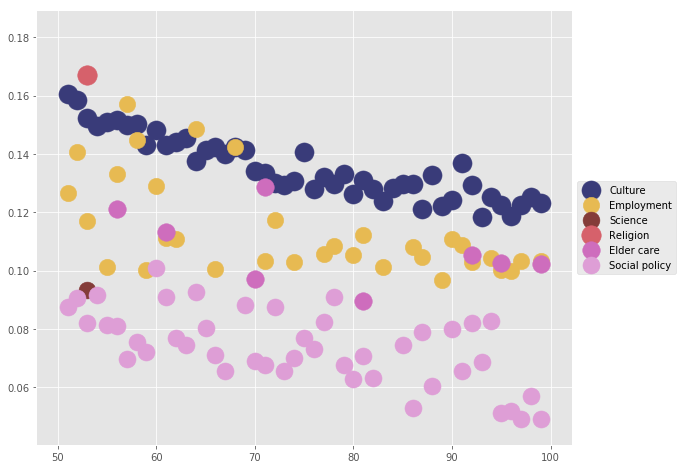

In [ ]:
fig = plt.figure(figsize=(12,8))
ax = plt.subplot(111)
for topic,tempdf in topic2firstoverlap_noise.groupby('topic'):
    tempdf = tempdf[tempdf['firstoverlap']>50]
    tempdf = tempdf[tempdf['firstoverlap']<100]
    color = cmap(topic/15)
    if len(tempdf)==0:
        continue
    size = matches[matches.topic==topic].entropy.values[0]*100
    ax.scatter(tempdf.firstoverlap,tempdf.frac,color=color,label=get_dic_name(topic),s=size)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    

In [ ]:
def plot_dictionary_stats(df,funcx,funcy,xlabel='',ylabel='',title='Proportions and Matches'):
    fig = plt.figure(figsize=(12,8))
    ax = plt.subplot(111)
    cmap = plt.cm.get_cmap('tab20b', 15)
    #xcol,ycol = 'n_docs','n_accepted'
    for num,(label,tempdf) in enumerate(df.sort_values('n_docs').groupby('name',sort=False),):
        color = cmap(num/15)
        ax.scatter(funcx(tempdf),funcy(tempdf),label=label,c=color,s=tempdf.n_docs.values[0]/10)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    # plot linear expectancy

    #x,y = matches[xcol],matches[ycol]
    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    return ax

In [ ]:
plot_dictionary_stats(topic2firstoverlap_noise.merge(matches,on='topic'),lambda x: x['entropy']*x['n_docs'],lambda x: x['frac'],'entropy x n_docs','max_mean hidden noise pr model')

In [ ]:
def locate_hidden_noise(topic):
    models = lexicon_df.groupby('modelid')
    temp = []
    for model,groupdf in models:
        if topic not in set(model.topic_label):
            idx = model['lexicon_doc_fraction_%d'%topic].idxmax()
            val,first_overlap = model['lexicon_doc_fraction_%d'%topic].iloc[idx],model['firstoverlap_%d'%topic].iloc[idx]
            d = {'frac':val,'firstoverlap':first_overlap}
            temp.append(d)
    return pd.DataFrame(temp).groupby('firstoverlap').mean()
    
temp = []
for i in range(15):
    not_located = lexicon_df[lexicon_df.topic_label!=i]
    not_located = not_located[(not_located['firstoverlap_%d'%i]<=100)&(not_located['firstoverlap_%d'%i]>=50)]
    d = {'topic':i,'size':len(not_located)}
    color = cmap(i/15)
    #not_located.groupby('firstoverlap_%d'%i)['lexicon_doc_fraction_%d'%i].agg()
    stats = not_located.groupby('firstoverlap_%d'%i).agg({'lexicon_doc_fraction_%d'%i:[np.mean,np.median,max,min]})
    #ent = matches[matches.topic==i].entropy.values[0]
    #plt.scatter(range(50,101),stats['lexicon_doc_fraction_%d'%i]['max'],label=get_dic_name(i),color=color)
    #plt.scatter(range(50,101),stats['lexicon_doc_fraction_%d'%i]['max'],c=color,label=get_dic_name(i))
#    plt.scatter(not_located['firstoverlap_%d'%i],not_located['lexicon_doc_fraction_%d'%i],color=i,label=get_dic_name(i))
    d['max_mean'] = stats['lexicon_doc_fraction_%d'%i]['max'].mean()
    d['mean_mean'] = stats['lexicon_doc_fraction_%d'%i]['min'].mean()
    temp.append(d)
    #print(get_dic_name(i),len(not_located))

In [ ]:
hidden_noise = pd.DataFrame(temp)
hidden_noise = hidden_noise.merge(matches,on='topic')
hidden_noise[['name','mean_mean']].sort_values('mean_mean')

,name,mean_mean
14,Social policy,0.002760
4,EU,0.003952
0,Culture,0.004166
7,Employment,0.004196
10,Religion,0.004993
1,Environment,0.005646
9,Science,0.005833
6,Immigration,0.006170
13,Elder care,0.006236
12,Crime,0.006347


In [ ]:

tempdf = topic2firstoverlap_noise.merge(matches,on='topic')
y = tempdf['frac'].values
tempdf['ndoc_entropy'] = tempdf.n_docs*tempdf.entropy
cols = ['ndoc_entropy','firstoverlap'] # 'n_top_matches'
X = tempdf[cols].values
import statsmodels.api as sm
X = sm.add_constant(X)
mod = sm.OLS(y,X,)

res = mod.fit()
print(res.summary(xname=['constant']+cols,yname='Max Hidden'))

                            OLS Regression Results                            
Dep. Variable:             Max Hidden   R-squared:                       0.662
Model:                            OLS   Adj. R-squared:                  0.661
Method:                 Least Squares   F-statistic:                     600.4
Date:                Thu, 06 Dec 2018   Prob (F-statistic):          3.18e-145
Time:                        17:23:50   Log-Likelihood:                 755.35
No. Observations:                 617   AIC:                            -1505.
Df Residuals:                     614   BIC:                            -1491.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
constant         0.0867      0.009     10.122   

** Conclusion here is that the level of Unseen noise is strongly related to the feature combination of a high entropy distribution, and large topic size. (better than just N_docs.) 
Furthermore the obvious that locating it further down the sorted Topic-Word distribution will on the average lead to less noise introduced.**

In [ ]:
y = hidden_noise['max_mean'].values
cols = ['entropy','topfracmean_5'] # 'n_top_matches'
X = hidden_noise[cols].values
import statsmodels.api as sm
X = sm.add_constant(X)
mod = sm.OLS(y,X,)

res = mod.fit()
print(res.summary(xname=['constant']+cols))

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.655
Model:                            OLS   Adj. R-squared:                  0.598
Method:                 Least Squares   F-statistic:                     11.41
Date:                Thu, 06 Dec 2018   Prob (F-statistic):            0.00168
Time:                        13:24:16   Log-Likelihood:                 31.293
No. Observations:                  15   AIC:                            -56.59
Df Residuals:                      12   BIC:                            -54.46
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
constant         -0.1136      0.067     -1.699

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1394: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  "anyway, n=%i" % int(n))


In [ ]:
matches[['name','entropy']].sort_values('entropy')

,name,entropy
4,Employment,2.684914
13,Science,2.849256
14,Social policy,2.910377
8,EU,2.981608
12,Elder care,3.076537
0,Immigration,3.095813
6,Economy,3.544005
11,Culture,3.654717
10,Taxes,3.730290
7,Religion,3.810754


In [ ]:
#plt.scatter(matches.entropy,matches.n_matches)

In [ ]:
y = matches['n_accepted'].values
cols = ['n_docs','n_matches'] # 'n_top_matches'
X = matches[cols].values
import statsmodels.api as sm
X = sm.add_constant(X)
mod = sm.OLS(y,X,)

res = mod.fit()


In [ ]:
res.summary(yname='no. accepted',xname=['constant']+cols)

/home/snorre/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1394: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  "anyway, n=%i" % int(n))


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           no. accepted   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     26.62
Date:                Wed, 05 Dec 2018   Prob (F-statistic):           3.87e-05
Time:                        20:32:44   Log-Likelihood:                -137.52
No. Observations:                  15   AIC:                             281.0
Df Residuals:                      12   BIC:                             283.2
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
constant   -3838.0326   1886.937     -2.034      0.065   -7949.315     273.250
n_docs         3.2903      0.718      4.581      0.001       1.725       4.855
n_matches      0.1357      0.083      1.632      0.129      -0.045       0.317
==============================================================================
Omnibus:                        3.848   Durbin-Watson:                   2.240
Prob(Omnibus):                  0.146   Jarque-Bera (JB):                1.298
Skew:                          -0.164   Prob(JB):                        0.523
Kurtosis:                       1.597   Cond. No.                     6.39e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.39e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

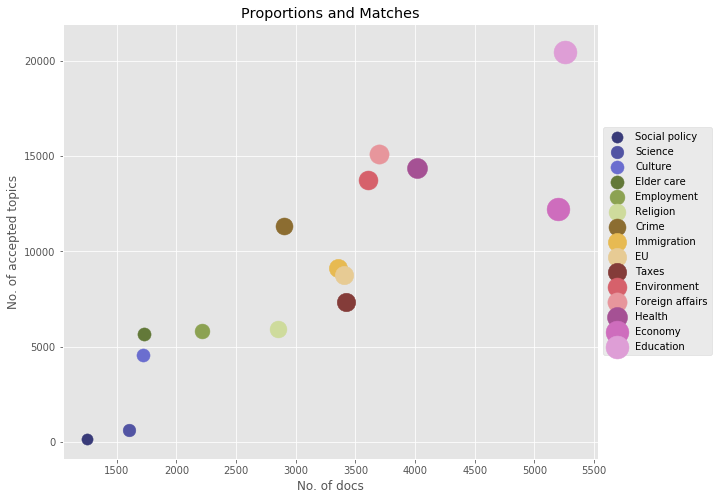

In [ ]:
#plt.scatter(matches.n_docs,matches.n_matches)
fig = plt.figure(figsize=(12,8))
ax = plt.subplot(111)
cmap = plt.cm.get_cmap('tab20b', 15)
xcol,ycol = 'n_docs','n_accepted'
for num,(label,tempdf) in enumerate(matches.sort_values('n_docs').groupby('name',sort=False),):
    color = cmap(num/15)
    ax.scatter(tempdf.n_docs,tempdf.n_accepted,label=label,c=color,s=tempdf.n_docs.values[0]/10)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
ax.set_title('Proportions and Matches')
ax.set_xlabel('No. of docs')
ax.set_ylabel('No. of accepted topics')
# plot linear expectancy

x,y = matches[xcol],matches[ycol]
def linear_func(x, a, b):
    return a*x + b
from scipy.optimize import curve_fit
def fit_function(x,y,func=linear_func,plot=False):
    popt, pcov = curve_fit(func, x, y)
    fit_y = func(np.linspace(min(x),max(x),50),*popt)
    return fit_y


#ypred = fit_function(x,y)
#plt.plot(np.linspace(min(x),max(x)),ypred,color='k')
#plt.plot(np.linspace(0,max(x)),np.linspace(0,max(y)),color='b')
# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))



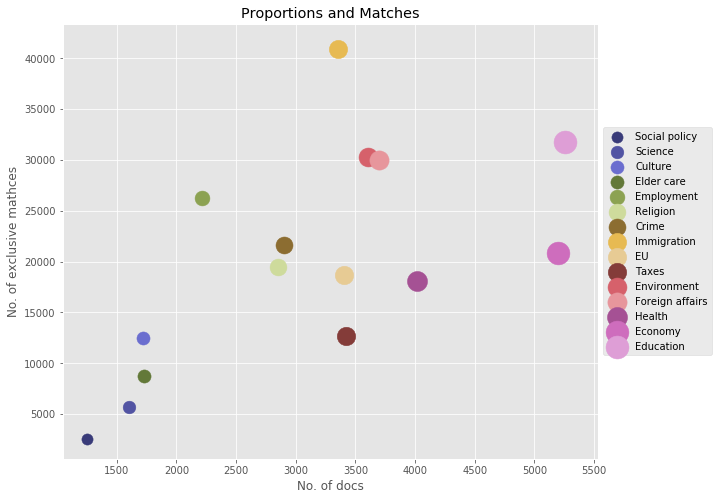

In [ ]:
#plt.scatter(matches.n_docs,matches.n_matches)
fig = plt.figure(figsize=(12,8))
ax = plt.subplot(111)
cmap = plt.cm.get_cmap('tab20b', 15)
for num,(label,tempdf) in enumerate(matches.sort_values('n_docs').groupby('name',sort=False),):
    color = cmap(num/15)
    ax.scatter(tempdf.n_docs,tempdf.n_matches,label=label,c=color,s=tempdf.n_docs.values[0]/10)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
ax.set_title('Proportions and Matches')
ax.set_xlabel('No. of docs')
ax.set_ylabel('No. of exclusive mathces')

# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))



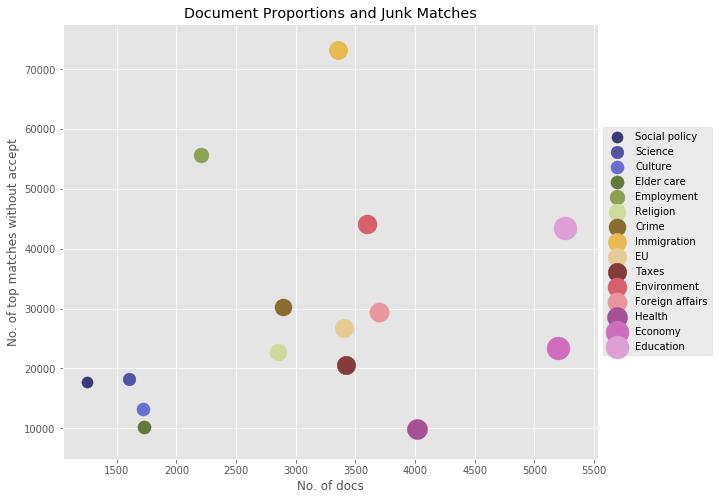

In [ ]:
#plt.scatter(matches.n_docs,matches.n_matches)
fig = plt.figure(figsize=(12,8))
ax = plt.subplot(111)
cmap = plt.cm.get_cmap('tab20b', 15)
for num,(label,tempdf) in enumerate(matches.sort_values('n_docs').groupby('name',sort=False)):
    color = cmap(num/15)
    ax.scatter(tempdf.n_docs,tempdf.n_top_matches-tempdf.n_matches,label=label,c=color,s=tempdf.n_docs.values[0]/10)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
ax.set_xlabel('No. of docs')
ax.set_ylabel('No. of top matches without accept')
ax.set_title('Document Proportions and Junk Matches')
# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

** The reason that Immigration topic has so many matches that are not accepted, might be related to that it is a topic consisting of strong subtopics, that becomes related to other issues. Like the employment issue which is relatively strong (high cooccurrence), but might be a theme that is related to the Immigration topic, thereby decreasing there chance of having a single dedicated topic.**

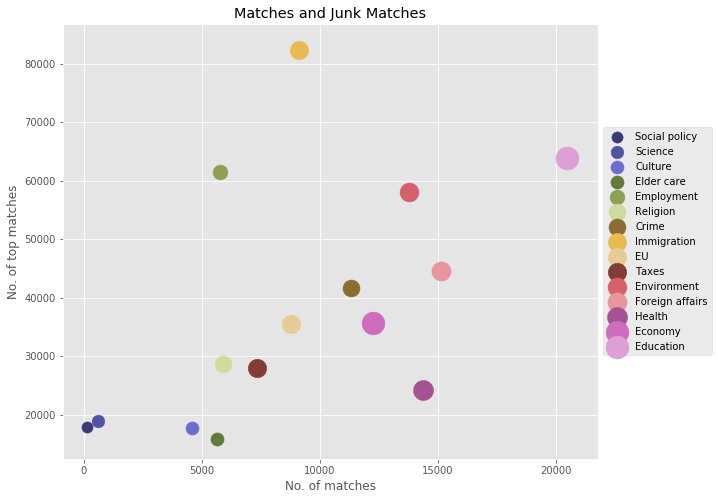

In [ ]:
#plt.scatter(matches.n_docs,matches.n_matches)
fig = plt.figure(figsize=(12,8))
ax = plt.subplot(111)
cmap = plt.cm.get_cmap('tab20b', 15)
for num,(label,tempdf) in enumerate(matches.sort_values('n_docs').groupby('name',sort=False)):
    color = cmap(num/15)
    ax.scatter(tempdf.n_matches,tempdf.n_top_matches,label=label,c=color,s=tempdf.n_docs.values[0]/10)# c=tempdf.topic, cmap=plt.cm.get_cmap('Spectral', 15)
ax.set_xlabel('No. of matches')
ax.set_ylabel('No. of top matches')
ax.set_title('Matches and Junk Matches')
# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

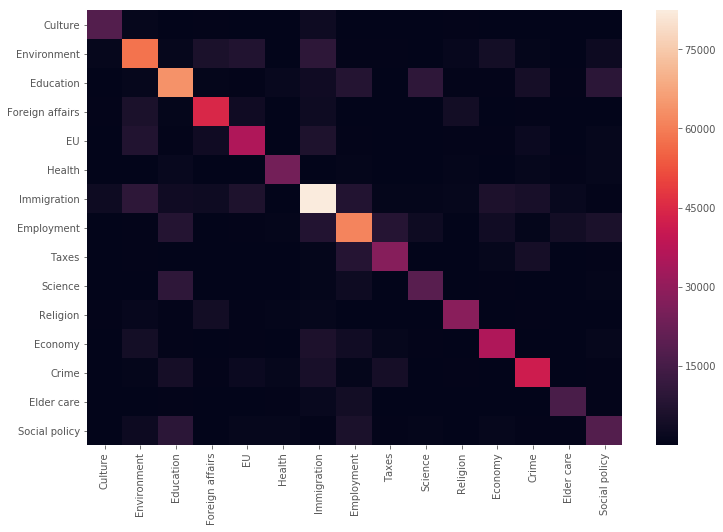

In [ ]:
## overlap
mat = np.zeros((15,15))
for i in range(15):
    mat[i,i] = sum(class2match[i])
    for j in range(i,15):
        mat[i,j] = sum((class2match[i] & class2match[j]))
        mat[j,i] = mat[i,j]
#mat = (mat.T/mat.sum(axis=1)).T

plt.figure(figsize=(12,8))
sns.heatmap(mat)
plt.xticks(np.arange(15)+0.5,map(get_dic_name,range(15)),rotation=90)
plt.yticks(np.arange(15)+0.5,map(get_dic_name,range(15)),rotation=0);

Showing topword co-occurence between dictionaries. Immigration: crime, economy, employment, EU, Environment. Make sense.

In [ ]:
temp = []
for dic in range(15):
    vals = lexicon_df['lexicon_extent_overlap_10_%d'%dic]/10
    vals2 = lexicon_df['lexicon_overlap_10_%d'%dic]/10
    vals3 = lexicon_df['lexicon_doc_overlap_5_%d'%dic]
    vals4 = lexicon_df['lexicon_doc_overlap_10_%d'%dic]
    
    
    #overlap_alt = lexicon_df.topwords.apply(lambda x: len(set(x)&dictionaries_s[dic])/10)
    d = [dic,get_dic_name(dic),sum(vals>0.2),sum(vals2>0.2),sum(vals3==1.0),sum(vals4==1.0),sum((vals>.2)&(vals3==1.0)),sum((vals>.2)&(vals4==1.0))]
    #print(dic,get_dic_name(dic),sum(vals==1.0),sum(vals2==1.0),sum((vals==1.0)&(vals3==1.0)),sum((vals==1.0)&(vals4==1.0)))
    temp.append(d)

In [ ]:
pd.DataFrame(temp,columns=['dic','name','extent','original','doc5','doc10','overlap5','overlap10']).sort_values('overlap10')

,dic,name,extent,original,doc5,doc10,overlap5,overlap10
9,9,Science,8890,8836,681,316,636,312
14,14,Social policy,7934,4745,2470,1081,2229,1032
0,0,Culture,10251,6229,6151,3293,5146,3167
10,10,Religion,25115,10919,8003,3506,6472,3345
7,7,Employment,19245,9224,7284,5616,6505,5464
13,13,Elder care,10935,9002,10714,7517,7517,5953
4,4,EU,18800,14546,12279,8735,11257,8532
6,6,Immigration,19323,13310,13768,9131,11427,8594
8,8,Taxes,40365,13219,16174,10696,15529,10614
11,11,Economy,22606,18049,20579,13305,15358,11800


#### analysis of overlap

In [ ]:
for i in range(15):
    print(i,get_dic_name(i),sum(class2match[i]))

0 Culture 48906
1 Environment 81322
2 Education 88090
3 Foreign affairs 225319
4 EU 60345
5 Health 53799
6 Immigration 108638
7 Employment 187175
8 Taxes 106696
9 Science 19763
10 Religion 60834
11 Economy 56923
12 Crime 93868
13 Elder care 37720
14 Social policy 27507


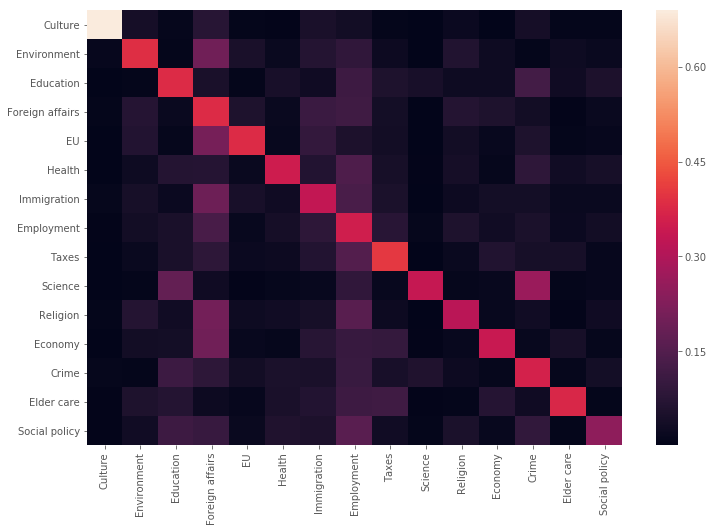

#### employment går lidt meget igen. Der er vist nogle generiske ord.

In [ ]:

# [Index[i] for i in dictionaries_s2[3] ]# foreign consider removing hillary and washington putin bernie
# [Index[i] for i in dictionaries_s2[7] ]# employment: remove: ugen, aftalen, vilkår, mennesker, aftale, løsning, falder, aftalen.


In [ ]:
groups = lexicon_df.groupby('topic_label')

In [ ]:
# How many before intrusion spotted?
for dic,groupdf in groups:
    if np.isnan(dic):
        continue
    temp = groupdf[first_overlap_cols].values#.sort(axis=1)#[:,1]
    temp.sort(axis=1)
    first_spotted = temp[:,1]
    print(get_dic_name(int(dic)),np.median(first_spotted),np.mean(first_spotted))


Culture 75.0 80.57319234404537
Environment 29.0 39.0833446083074
Education 39.0 56.15220869565217
Foreign affairs 31.0 42.406409057858106
EU 55.0 59.940999557717824
Health 66.0 71.22515271289974
Immigration 56.0 65.28347864967583
Employment 58.0 68.34369575998016
Taxes 61.0 72.14037588625877
Science 27.0 39.763503649635034
Religion 44.0 66.16792590787229
Economy 35.0 50.66943477096169
Crime 24.0 41.947489126136816
Elder care 52.0 57.82297063903282
Social policy 33.0 48.433914152146194


# Oppurtunism Analysis
In the following we look at the Correlation coefficients between the response to a topic (in terms of likes) and the proportions of the topic as prioritized by each party.

In [ ]:
model_df = pd.read_csv('model_dataframe.csv')

In [ ]:
model_df.shape

(5800, 36)

In [ ]:
import re
digit_re = re.compile('[0-9\.]+')
def parse_list_string(string):
    return [float(i) for i in digit_re.findall(string)]
def get_betas(p):
    
    col = 'parameters_p%d'%p
    if type(model_df[col].values[0])==str:
        return model_df[col].apply(parse_list_string).apply(lambda x: x[0])
    else:
        return model_df[col].apply(lambda x: x[0])
for p in range(len(party2idx)):
    model_df['betas_p%d'%p] = get_betas(p)

In [ ]:
#model_df['parameters_p1'].hist()#.apply(parse_list_string).apply(lambda x: x[0]).hist()

In [ ]:
#model_df['parameters_p1'].apply(parse_list_string)

In [ ]:
mids = set(lexicon_df[lexicon_df.accept].model_id)

In [ ]:
party2block = {'ALT': 'L', 'DF': 'R', 'EL': 'L',
               'K': 'R', 'KD': 'R', 'LA': 'R', 
               'RV': 'L', 'S': 'L', 'SF': 'L',
               'V': 'R', 'Z': 'R'}
translater = {'Dansk Folkeparti':'DF','Socialdemokratiet':'SD','Venstre':'VEN'
              ,'Radikale Venstre':'RV',u'Enhedslisten':'EL','Det Konservative Folkeparti':'KF'
              ,'Socialistisk Folkeparti':'SF','Kristendemokraterne':'KD','Liberal Alliance':'LA','Alternativet':'ALT',
             'Fremskridtspartiet':'Z'}
party2color = json.load(open('party_color','r'))
party2color = {translater[p]:party2color[p] for p in party2color if p in translater}
english_titles = {'Radikale Venstre':'Social Liberal Party','Dansk Folkeparti':"Danish People's Party",'Enhedslisten':'Unity List'}
sort_parties = ['EL', 'SF', 'SD', 'ALT', 'RV', 'DF', 'VEN', 'KF', 'LA']
#sns.boxplot(party_bias[sort_parties])

def make_party_dataframe(col,val_func = lambda x: x):
    df = pd.DataFrame()
    for num,p in enumerate(party2idx):
        if not p in translater:
            continue
        p = translater[p]
        if not p in party2color:
            continue
        df[p] = model_df[col%num].apply(val_func)
    return df


In [ ]:
model_df

,correlation_p0,parameters_p0,r2_p0,correlation_p1,parameters_p1,r2_p1,correlation_p10,parameters_p10,r2_p10,correlation_p2,...,parameters_p7,r2_p7,correlation_p8,parameters_p8,r2_p8,correlation_p9,parameters_p9,r2_p9,model_id,model_path
0,-0.359927,"[-0.45996247116416533, 0.059370414627081626]",0.129547,0.901105,"[1.1229728061972308, -0.16967800859618298]",0.811991,0.469396,"[1.07563409995048, -0.12556661938700311]",0.220333,0.640653,...,"[1.2178905071516595, -0.13655177342385794]",0.205456,0.472631,"[1.0254063928755868, -0.11805818148529564]",0.22338,0.685961,"[1.51516381524747, -0.1645215431798211]",0.470543,0,0_0.0_0
0,-0.426391,"[-0.6917101013997399, 0.06651591161859378]",0.18181,0.826357,"[1.8173796796202222, -0.17445661926794206]",0.682867,0.251658,"[0.7236226112263628, -0.06194854964285487]",0.0633318,0.333346,...,"[0.41311721030067894, -0.03420032255161381]",0.0166797,0.233044,"[0.6142835151226484, -0.05200416392997753]",0.0543097,0.398164,"[1.1419955964633084, -0.08535965434702578]",0.158535,1,0_0.0_1
0,-0.175408,"[-0.41958483502420313, 0.030616947332093435]",0.0307681,0.652103,"[2.209600572046139, -0.1586868469393148]",0.425238,0.00232588,"[0.013813254915904238, -0.0041992897124236706]",5.40974e-06,0.341673,...,"[-0.16186180178732762, 0.0073329115501667525]",0.00069524,0.191203,"[1.0716983463679288, -0.06278940276762324]",0.0365586,0.377595,"[1.8724538749167472, -0.10595996071478186]",0.142578,2,0_0.0_2
0,-0.0982854,"[-0.28851959301975205, 0.015727982383717653]",0.00966002,0.585011,"[2.3732878655758305, -0.14547595390721055]",0.342238,-0.0287345,"[-0.18520299986958494, 0.005531853938252815]",0.000825672,0.205153,...,"[-0.13504196537059165, 0.0043940054368565296]",0.000308722,0.178287,"[1.2096293965208136, -0.05559309244682842]",0.0317862,0.285256,"[1.5735145895391467, -0.07031674478006161]",0.0813711,3,0_0.0_3
0,-0.238107,"[-1.0536721126939244, 0.053247935379001375]",0.0566951,0.512712,"[2.3199334672229814, -0.12486407856786798]",0.262873,-0.00216685,"[-0.016754635495931147, -0.0027030080016028357]",4.69525e-06,0.155256,...,"[-0.5408359383013666, 0.019246666875749885]",0.00427485,0.0487519,"[0.392531589226806, -0.01515412181862752]",0.00237675,0.186485,"[1.5036302026226525, -0.053846904842725335]",0.0347765,4,0_0.0_4
0,-0.238772,"[-1.223073591598185, 0.05467132953162883]",0.0570121,0.545442,"[3.2212041235048363, -0.14489602831421955]",0.297507,-0.0662736,"[-0.7270580663438687, 0.02098322206933258]",0.0043922,0.120392,...,"[-0.6311699528288709, 0.018684599396000437]",0.00293072,0.117521,"[1.37481199886388, -0.04470613841559851]",0.0138113,0.343925,"[3.6928649007246106, -0.1173001216987137]",0.118284,5,0_0.0_5
0,-0.179229,"[-0.9010230355537371, 0.034437816665267226]",0.0321229,0.55332,"[4.069091383343144, -0.1501474252640932]",0.306163,-0.0518539,"[-0.5639672402625477, 0.013818393858385014]",0.00268883,0.144909,...,"[-0.14251629768704746, 0.0025688724692044017]",0.000188653,0.1119,"[1.2297856977265547, -0.03621663085073705]",0.0125215,0.19144,"[1.8155604858817254, -0.05072379409565301]",0.0366491,6,0_0.0_6
0,-0.0964733,"[-0.6251446555292404, 0.018913899975997062]",0.0093071,0.588019,"[4.811499471140573, -0.16394204767841858]",0.345766,0.0727422,"[1.028539067531042, -0.030892884687389266]",0.00529142,0.229742,...,"[0.8613647974522978, -0.023687659319189154]",0.00350212,0.279435,"[4.528784174890874, -0.11409226736422394]",0.0780842,0.310712,"[3.6072066256787396, -0.09255244174795003]",0.0965417,7,0_0.0_7
0,-0.18878,"[-1.3423330543361205, 0.04529874286273672]",0.035638,0.477819,"[4.2080330770905015, -0.1377779781129136]",0.228311,-0.00823907,"[-0.0994994373081124, -0.0008370310702971266]",6.78823e-05,0.136034,...,"[-1.6111777573399717, 0.035275561960435686]",0.0112101,0.0955317,"[1.3426891141893473, -0.03115448621136349]",0.0091263,0.248067,"[3.743950516371776, -0.08289149174176422]",0.061537,8,0_0.0_8
0,-0.135933,"[-1.3465229597685504, 0.0330228539984386]",0.0184778,0.461872,"[4.134747621972806, -0.12554001657120262]",0

In [ ]:
party2color[party_dummy.columns[num]]

Index(['Alternativet', 'Dansk Folkeparti', 'Det Konservative Folkeparti',
       'Enhedslisten', 'Fremskridtspartiet', 'Kristendemokraterne',
       'Liberal Alliance', 'Radikale Venstre', 'Socialdemokratiet',
       'Socialistisk Folkeparti', 'Venstre'],
      dtype='object')

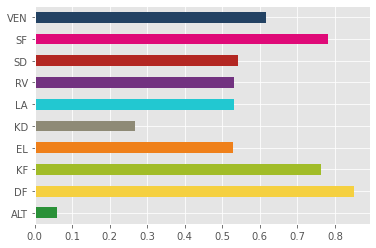

In [ ]:
cor_col = 'correlation_p%d'
corr_party_df = make_party_dataframe(cor_col)
cor_col = 'betas_p%d'
cor_col = 'correlation_p%d'
corr_party_df = make_party_dataframe(cor_col)
colors = [party2color[i] for i in corr_party_df.columns]
corr_party_df.sum(axis=1).idxmax()

corr_party_df.iloc[corr_party_df.sum(axis=1).idxmax()].plot(kind='barh',color=colors)

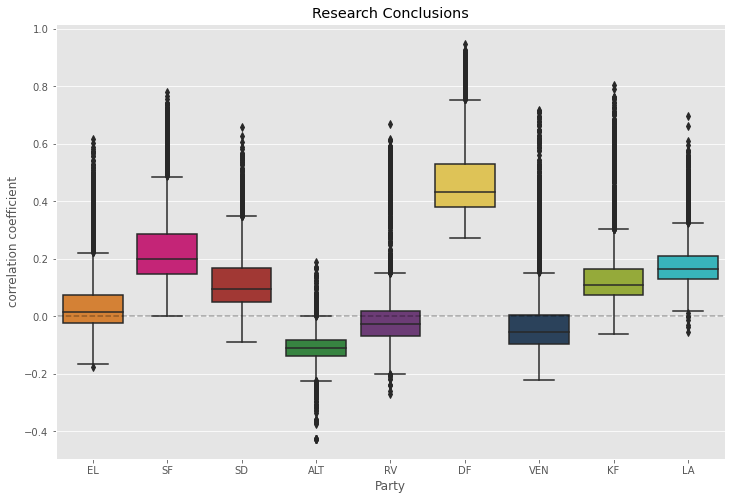

In [ ]:
#sns.barplot()
import matplotlib
#cmap = matplotlib.colors.ListedColormap(colors)
plt.figure(figsize=(12,8))
plt.hlines(0,-1,10,alpha=0.3,linestyles='--')
sns.boxplot(x='level_1',y=0,data=corr_party_df.stack().reset_index(),palette=party2color,order=sort_parties)#,hue=sort_parties)
plt.title('Research Conclusions');
plt.ylabel('correlation coefficient')
plt.xlabel('Party')
plt.savefig('/home/snorre/Dropbox/Forskning/tom_swift/output/research_conclusions/pandering.png',dpi=400,bbox_inches='tight')

Text(0.5,0,'Party')

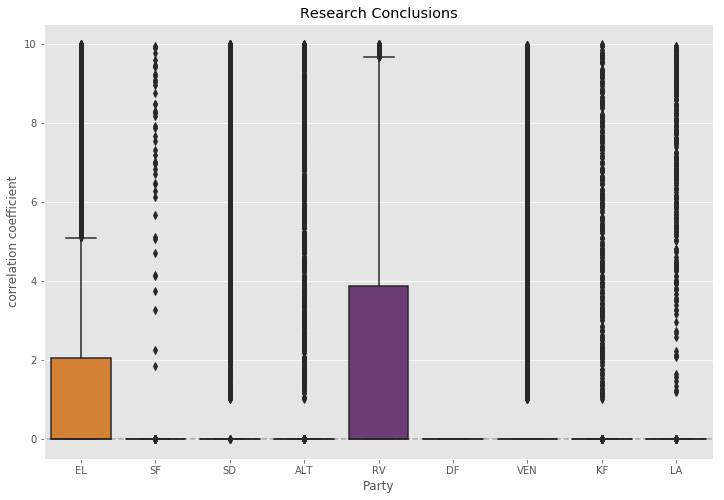

In [ ]:
#sns.barplot()
import matplotlib
#cmap = matplotlib.colors.ListedColormap(colors)
plt.figure(figsize=(12,8))
plt.hlines(0,-1,10,alpha=0.3,linestyles='--')
sns.boxplot(x='level_1',y=0,data=corr_party_df.stack().reset_index(),palette=party2color,order=sort_parties)#,hue=sort_parties)
plt.title('Research Conclusions');
plt.ylabel('correlation coefficient')
plt.xlabel('Party')

Text(0.5, 0, 'Party')

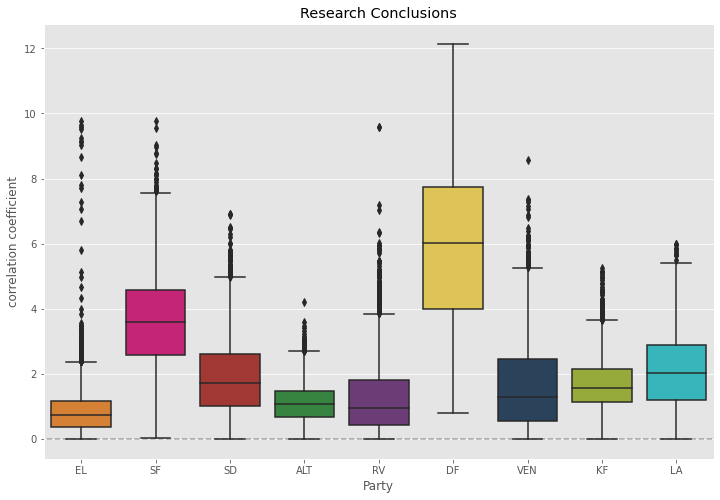

In [ ]:
#sns.barplot()
import matplotlib
#cmap = matplotlib.colors.ListedColormap(colors)
plt.figure(figsize=(12,8))
plt.hlines(0,-1,10,alpha=0.3,linestyles='--')
sns.boxplot(x='level_1',y=0,data=corr_party_df.stack().reset_index(),palette=party2color,order=sort_parties)#,hue=sort_parties)
plt.title('Research Conclusions');
plt.ylabel('correlation coefficient')
plt.xlabel('Party')

Text(0.5,0,'Party')

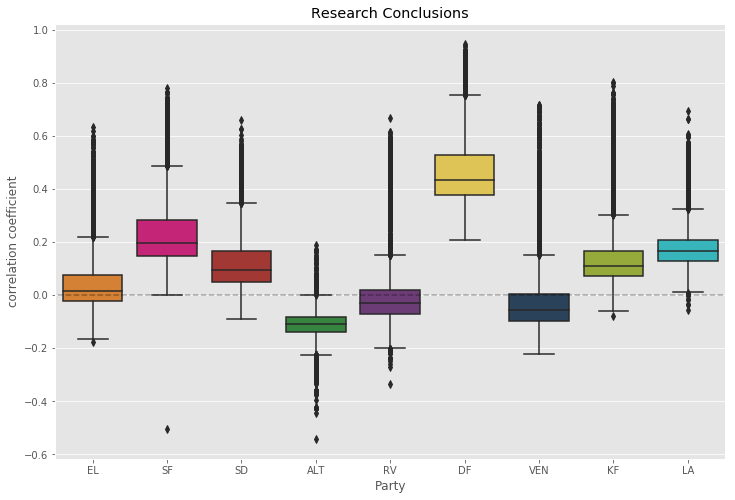

In [ ]:
#sns.barplot()
import matplotlib
#cmap = matplotlib.colors.ListedColormap(colors)
plt.figure(figsize=(12,8))
plt.hlines(0,-1,10,alpha=0.3,linestyles='--')
sns.boxplot(x='level_1',y=0,data=corr_party_df.stack().reset_index(),palette=party2color,order=sort_parties)#,hue=sort_parties)
plt.title('Research Conclusions');
plt.ylabel('correlation coefficient')
plt.xlabel('Party')

# Metrics
- The metrics should be used in a post-analysis, to see if they will help avoid some of the problems.
    - Further substantiating the argument that more transparency in the litterature ( TopicCheck etc).
        - However probably also concluding that metrics are not infalliable, and can not really stand alone.
        

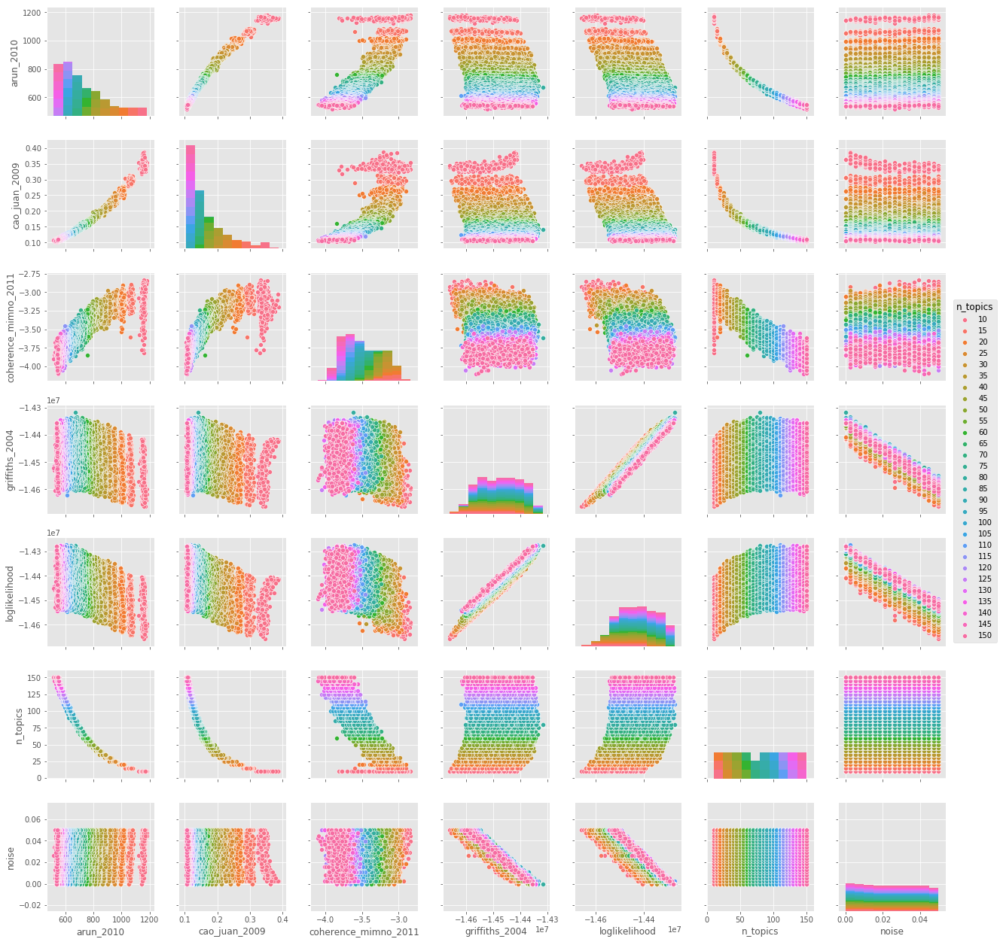

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
import seaborn as sns

measures = ['arun_2010','cao_juan_2009','coherence_mimno_2011','griffiths_2004','loglikelihood']    
sns.pairplot(df[measures+['n_topics','noise']],hue='n_topics')
#df[measures].hist(figsize=(12,8),bins=20)
#plt.tight_layout()


In [ ]:
df.columns

Index(['alpha', 'arun_2010', 'cao_juan_2009', 'coherence_mimno_2011',
       'griffiths_2004', 'loglikelihood', 'modelid', 'n_iter', 'n_topics',
       'noise', 'random_state', 'simulationNumber'],
      dtype='object')

# Analysis
### Preliminaries
Investigate the distribution of noise topics.
* ... each topic will get its share of noisy documents.

What is the relation between the induced noise and the prevalence of noisy topics?

In [ ]:
#np.argsort(data[1][2].toarray())

<1x32397 sparse matrix of type '<class 'numpy.float64'>'
	with 32397 stored elements in Compressed Sparse Row format>

## Main Analysis: Intrusion

- Characterize each Topic as to what degree the saliency of the topic is related to Noise Documents. 
- Characterize to what degree top words and top documents are based on the noisy documents.


- how many words are not present in any of the noisy docs, but counted in the noisy topic. 


### Document2Topic Distribution 
    * Characterize each Topic as to how much of the distribution is dominated by Noise Documents.
    *  

### Document2Word Distribution
    * Analyze the overlap between noisy docs and real documents.
    
### Word2Topic Distribution

* Analyze the top words of Each Topic (see when a noise word pops up), and see the share of noise words in the whole topic.
  
** Further critical analysis **
  * figure out which words co-occur in the danish and english corpus, and see how this creates a propensenty to be assigned to one of the noise topics.


First we load the data. 

In [ ]:
data[0].shape

(46576, 25)

In [ ]:
from tqdm import tqdm_notebook as tqdm
addendums = ['doc2topic','w2topic','w2count_topic']
def load_data(model):
    path = result_path+model
    data = []
    for add in addendums:
        filename = path+'_%s.npz'%(add)
        mat = sp.load_npz(filename)
        data.append(mat)#[add] = mat
    return data

def run_analysis(func):
    "Runs a function on the raw data. Expects a function that returns a list where each row is a "
    # Load models
    
    import scipy.sparse as sp
    m_id = 0
    model_ids = []
    l = []
    tids = []
    for model in tqdm(model_runs):
        t_id = 0
        model_n = int(model.split('_')[-1])
        data = load_data(model)
        #l+=func(data)
        for _ in range(data[0].shape[1]):
            tids.apped(t_id)
            t_id+=1
            
            
    return model_ids
topic_ids = run_analysis(lambda x: x)


KeyboardInterrupt: 

In [ ]:
def get_noise_share(data):
    doc2topic = data[0]
    doc_noise = doc2topic[noise_start_d:]
    doc_real =  doc2topic[:noise_start_d]

    doc_noisy_sum = doc_noise.sum(axis=0)
    doc_real_sum = doc_real.sum(axis=0)
    noisy_share = doc_noisy_sum/(doc_noisy_sum+doc_real_sum)

    doc_noisy_mean = doc_noise.mean(axis=0)
    doc_real_mean = doc_real.mean(axis=0)
    noisy_ratio = doc_noisy_mean/doc_real_mean
    return {'noisy_ratio':noisy_ratio,'noisy_share':noisy_share}


In [ ]:
path

'/mnt/b0c8e396-e5ba-4614-be6f-146c4c861ab3/data/topic_model_simulation/models/0_0.008_118'

In [ ]:
len(set(df.modelid)),len(set(df.modelid)&set(range(max(df.modelid)))),max(df.modelid)

(8234, 8233, 8233)

In [ ]:
def get_top(data):
    doc2topic = data[0]

    top50 = []
    top50vals = []
    top1000 = []
    top1000vals = []
    for i in range(len(doc2topic[0])):
        idx = np.argsort(doc2topic[:,i])[-50:][::-1]
        top50.append(idx)
        top50vals.append(doc2topic[idx][i])

        idx = np.argsort(m.topic_word_[i,:])[-1000:][::-1]
        top1000.append(idx)
        top1000vals.append(m.topic_word_[i][idx])
    return list(top50),list(top50vals),list(top1000),list(top1000vals)


set()

In [ ]:
len(df),df.modelid.nunique()
df[df.modelid.isin(set([28,5392]))]

,alpha,arun_2010,cao_juan_2009,coherence_mimno_2011,griffiths_2004,loglikelihood,modelid,n_iter,n_topics,noise,random_state,simulationNumber
0,0.100000,1145.208877,0.362638,-3.238889,-1.441540e+07,-1.440566e+07,28,1000,10,0.000000,1,0
28,0.006667,536.690275,0.106287,-3.771946,-1.435625e+07,-1.428108e+07,28,1000,150,0.000000,1,0
28,0.006667,540.204405,0.108601,-3.731159,-1.440511e+07,-1.432522e+07,5392,1000,150,0.010526,1,9
0,0.100000,1145.208877,0.362638,-3.238889,-1.441540e+07,-1.440566e+07,5392,1000,10,0.000000,1,0


In [ ]:
data[0],data[1],data[2]

(<46576x25 sparse matrix of type '<class 'numpy.float64'>'
 	with 1164400 stored elements in Compressed Sparse Row format>,
 <25x32397 sparse matrix of type '<class 'numpy.float64'>'
 	with 809925 stored elements in Compressed Sparse Row format>,
 <25x32397 sparse matrix of type '<class 'numpy.int32'>'
 	with 83013 stored elements in Compressed Sparse Row format>)

In [ ]:
doc2topic = data[0]
doc_noise = doc2topic[noise_start_d:]
doc_real =  doc2topic[:noise_start_d]

doc_noisy_sum = doc_noise.sum(axis=0)
doc_real_sum = doc_real.sum(axis=0)
noisy_share = doc_noisy_sum/(doc_noisy_sum+doc_real_sum)

doc_noisy_mean = doc_noise.mean(axis=0)
doc_real_mean = doc_real.mean(axis=0)
noisy_ratio = doc_noisy_mean/doc_real_mean
noisy_ratio,noisy_share

(matrix([[1.17920532e-01, 7.49191338e-02, 7.96226260e+01, 1.52702265e-01,
          1.06493429e-01, 1.32259869e-01, 2.20868771e-01, 1.30691113e-01,
          9.98113893e-02, 1.78694378e-01, 1.63222602e-01, 2.06679118e-01,
          1.69228443e-01, 1.90184984e-01, 1.00266562e-01, 1.34763273e-01,
          1.04802891e-01, 1.54735358e-01, 9.31839357e-02, 1.13610493e-01,
          1.11539509e-01, 4.42439385e-01, 1.69920527e-01, 1.16979609e-01,
          1.23301543e-01]]),
 matrix([[0.00093567, 0.00059467, 0.38739638, 0.00121132, 0.00084507,
          0.00104933, 0.00175111, 0.0010369 , 0.00079209, 0.00141721,
          0.00129466, 0.00163879, 0.00134224, 0.0015082 , 0.0007957 ,
          0.00106917, 0.00083167, 0.00122743, 0.00073954, 0.0009015 ,
          0.00088508, 0.00350163, 0.00134772, 0.00092821, 0.00097832]]))

In [ ]:
# words in 
for idx,count in list(enumerate(data[2][2].toarray()[0])):
    if count>0:
        print(Index[idx],end='\t')
    if count>1000:
        break

__url__	bedre	eu	give	tale	læs	glad	set	tidligere	2	liberal	3	lars	s	job	egen	1	side	ekstra	the	fast	la	venstres	problem	4	særligt	bedst	ca	vel	al	plan	by	facebook	region	5	artikel	like	situation	stop	super	usa	a	form	of	is	jobs	via	and	minister	lyder	6	internationale	news	bruxelles	paris	system	fair	religion	in	start	stemt	8	love	bekendt	per	it	interview	video	time	stand	formål	byrådet	reform	vinder	nået	person	had	9	let	trump	international	præsident	ramme	amerikanske	chance	film	ungdom	new	november	september	rapport	go	hjemmeside	generation	april	send	michael	fremfor	su	sent	service	knap	program	you	død	spille	israel	live	held	indtryk	nemt	status	radikal	b	demonstration	on	eksperter	borgmesteren	opfattelse	drop	that	vandt	citat	organisation	we	marked	massive	erik	ære	bad	mark	center	not	bragt	top	indkaldt	gives	relevant	udenrigsminister	copenhagen	ukraine	flag	innovation	gas	sorte	national	ambition	ambitiøse	be	undervejs	c	twitter	york	britiske	administration	an	vilde	engageret	kampa

[(0, 0),
 (1, 0),
 (2, 174),
 (3, 0),
 (4, 0),
 (5, 0),
 (6, 0),
 (7, 0),
 (8, 0),
 (9, 0),
 (10, 0),
 (11, 0),
 (12, 0),
 (13, 0),
 (14, 0),
 (15, 2),
 (16, 0),
 (17, 0),
 (18, 0),
 (19, 0),
 (20, 0),
 (21, 0),
 (22, 0),
 (23, 0),
 (24, 0),
 (25, 0),
 (26, 0),
 (27, 0),
 (28, 0),
 (29, 56),
 (30, 0),
 (31, 0),
 (32, 0),
 (33, 0),
 (34, 0),
 (35, 0),
 (36, 0),
 (37, 0),
 (38, 0),
 (39, 0),
 (40, 0),
 (41, 9),
 (42, 0),
 (43, 0),
 (44, 0),
 (45, 0),
 (46, 0),
 (47, 0),
 (48, 0),
 (49, 0),
 (50, 0),
 (51, 0),
 (52, 0),
 (53, 0),
 (54, 0),
 (55, 0),
 (56, 0),
 (57, 0),
 (58, 0),
 (59, 0),
 (60, 0),
 (61, 0),
 (62, 0),
 (63, 19),
 (64, 0),
 (65, 0),
 (66, 0),
 (67, 0),
 (68, 0),
 (69, 0),
 (70, 0),
 (71, 0),
 (72, 0),
 (73, 0),
 (74, 0),
 (75, 0),
 (76, 0),
 (77, 0),
 (78, 0),
 (79, 0),
 (80, 0),
 (81, 0),
 (82, 0),
 (83, 0),
 (84, 0),
 (85, 0),
 (86, 0),
 (87, 0),
 (88, 0),
 (89, 0),
 (90, 0),
 (91, 0),
 (92, 0),
 (93, 0),
 (94, 0),
 (95, 0),
 (96, 0),
 (97, 0),
 (98, 0),
 (99, 0),
 (100,

In [ ]:
mat = data[1].toarray()

Text(0.5,1,'Index Num and Topic Exclusivity')

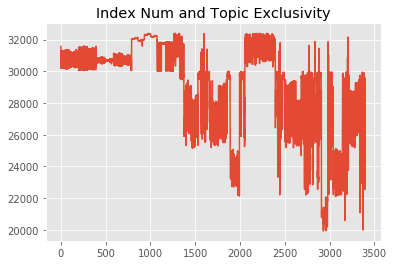

In [ ]:
#plt.pcolor(np.argsort(mat.T.sum(axis=1)),range(mat.shape[1]))
#plt.scatter(range(mat.shape[1]),np.argsort(mat.T.sum(axis=1)),alpha=0.5,s=10)
plt.plot(np.argsort(mat.T.sum(axis=1))[0:len(Index)-noise_start_w+1000])
plt.title('Index Num and Topic Exclusivity')

In [ ]:
np.argsort(mat.T.sum(axis=1))[0:len(Index)-noise_start_w]

array([31560, 30204, 31289, ..., 28153, 28823, 27138])

In [ ]:
for idx in np.argsort(mat.T.sum(axis=1))[0:len(Index)-noise_start_w]:
    if idx<noise_start_w:
        print(Index[idx],idx)


kampagnevideo 29883
nådegave 29679
forledes 29563
cementere 29832
fastelavnstønde 29567
beklagelig 29600
fasthed 29622
enkeltindivider 29507
ingenlunde 29867
perfid 29586
argumenteres 29504
skældud 29687
langstrømpe 29642
assisteret 29503
udnævnte 29942
ikoniske 29468
klassernes 29976
myldrede 29826
ryttere 29929
redningsveste 29481
forårsklar 29677
museumsbesøg 29493
vens 29505
liverpool 29651
bat 29866
universelt 29518
kantori 29845
besøgscenter 29856
dagblads 29641
svedig 29636
printish 29617
julemåneden 29843
høgh 29796
bankmand 29588
præsentationer 29721
skalere 29480
vindernation 25895
arrig 27083
trumf 25906
personsager 25973
borgerlighed 25972
videnskabsmand 26973
aflønne 25915
slettede 25950
fristelsen 27034
afgrænse 27031
debattørerne 27022
fortvivlede 28772
irriterer 25958
feel-good 28645
jovist 28638
piskes 28525
idoler 28658
forlængede 28730
røvfuld 28746
forestillede 25910
geir 28779
hestens 25940
vittigheder 25316
optrådt 25981
afhandling 29114
meningsudvekslinger 29145


In [ ]:
data[1][:,noise_start_w:].mean(axis=0)

matrix([[1.75014324e-07, 1.75014324e-07, 1.75014324e-07, ...,
         1.75014324e-07, 1.86235300e-06, 7.15153629e-07]])

In [ ]:
import numpy as np
np.argmax(data[0][noise_start_d:].mean(axis=0)-data[0][:noise_start_d].mean(axis=0))

2

In [ ]:
mat = mat.toarray()


# Post Analysis
### Could this be avoided by heuristics and indirect quality measures?


In [ ]:
# Describes the desired Direction of each measure
directions = {'arun_2010': 'minimize',
 'cao_juan_2009': 'minimize',
 'coherence_mimno_2011': 'maximize',
 'griffiths_2004': 'maximize',
 'loglikelihood': 'maximize'}

In [ ]:
# get the direction of each measure
from tmtoolkit.topicmod import evaluate
metric_direction = []
for m in measures:
    if m == 'perplexity':
        metric_direction.append('minimize')
    else:
        m_fn_name = 'metric_%s' % (m[:16] if m.startswith('coherence_gensim') else m)
        m_fn = getattr(evaluate, m_fn_name, None)
        if m_fn:
            metric_direction.append(getattr(m_fn, 'direction', 'unknown'))
        else:
            metric_direction.append('minimize')
